In [1]:
import pickle
import pandas as pd
import numpy as np
import torch
import transformers
import bitsandbytes as bnb
import networkx as nx
import random

random_state = 1

random.seed(random_state)

In [2]:
def euclid(list1, list2):
    return sum((p-q)**2 for p, q in zip(list1, list2)) ** .5

In [3]:
with open('df_annotations_embeddings.pkl', 'rb') as f:
    df = pickle.load(f)
df

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
0,A2008_Commission of the European Communities v...,1,prem,A1,must held first Article 4c CS prohibits granti...,L,Rule,"[-0.01507568359375, -1.73828125, 1.4287109375,..."
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
2,A2008_Commission of the European Communities v...,1,prem,A3,Court deduces Article 67 CS covers general mea...,L,"[Prec, Rule]","[0.195556640625, -1.734375, -0.1546630859375, ..."
3,A2008_Commission of the European Communities v...,1,prem,A4,Court also held action taken Article 67 CS can...,L,"[Prec, Rule]","[0.404296875, -0.2352294921875, 0.34326171875,..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
...,...,...,...,...,...,...,...,...
2530,R2021_World Duty Free v,5,prem,H7,question matter dialogue Spanish authorities C...,F,NaN,"[2.109375, -1.3642578125, -0.62744140625, 2.50..."
2531,R2021_World Duty Free v,5,prem,H8,present case action first instance WDFG compla...,F,NaN,"[0.880859375, -0.65966796875, -0.67626953125, ..."
2532,R2021_World Duty Free v,5,prem,H9,regard General Court recalled paragraph 212 ju...,F,NaN,"[2.0234375, -1.150390625, -0.70947265625, 1.59..."
2533,R2021_World Duty Free v,5,prem,H10,General Court err law concluding therefrom par...,F,NaN,"[1.6494140625, -1.5732421875, -0.857421875, 1...."


In [4]:
df_train = df[df['Split'] != 2]
df_train

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
0,A2008_Commission of the European Communities v...,1,prem,A1,must held first Article 4c CS prohibits granti...,L,Rule,"[-0.01507568359375, -1.73828125, 1.4287109375,..."
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
2,A2008_Commission of the European Communities v...,1,prem,A3,Court deduces Article 67 CS covers general mea...,L,"[Prec, Rule]","[0.195556640625, -1.734375, -0.1546630859375, ..."
3,A2008_Commission of the European Communities v...,1,prem,A4,Court also held action taken Article 67 CS can...,L,"[Prec, Rule]","[0.404296875, -0.2352294921875, 0.34326171875,..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
...,...,...,...,...,...,...,...,...
2530,R2021_World Duty Free v,5,prem,H7,question matter dialogue Spanish authorities C...,F,NaN,"[2.109375, -1.3642578125, -0.62744140625, 2.50..."
2531,R2021_World Duty Free v,5,prem,H8,present case action first instance WDFG compla...,F,NaN,"[0.880859375, -0.65966796875, -0.67626953125, ..."
2532,R2021_World Duty Free v,5,prem,H9,regard General Court recalled paragraph 212 ju...,F,NaN,"[2.0234375, -1.150390625, -0.70947265625, 1.59..."
2533,R2021_World Duty Free v,5,prem,H10,General Court err law concluding therefrom par...,F,NaN,"[1.6494140625, -1.5732421875, -0.857421875, 1...."


In [5]:
df_train_prem = df_train[df_train['Name'] == 'prem']
df_train_prem

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
0,A2008_Commission of the European Communities v...,1,prem,A1,must held first Article 4c CS prohibits granti...,L,Rule,"[-0.01507568359375, -1.73828125, 1.4287109375,..."
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
2,A2008_Commission of the European Communities v...,1,prem,A3,Court deduces Article 67 CS covers general mea...,L,"[Prec, Rule]","[0.195556640625, -1.734375, -0.1546630859375, ..."
3,A2008_Commission of the European Communities v...,1,prem,A4,Court also held action taken Article 67 CS can...,L,"[Prec, Rule]","[0.404296875, -0.2352294921875, 0.34326171875,..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
...,...,...,...,...,...,...,...,...
2529,R2021_World Duty Free v,5,prem,H6bis,hand General Court rightly pointed paragraph 2...,L,Itpr,"[1.4169921875, -1.34765625, -0.240234375, 1.42..."
2530,R2021_World Duty Free v,5,prem,H7,question matter dialogue Spanish authorities C...,F,NaN,"[2.109375, -1.3642578125, -0.62744140625, 2.50..."
2531,R2021_World Duty Free v,5,prem,H8,present case action first instance WDFG compla...,F,NaN,"[0.880859375, -0.65966796875, -0.67626953125, ..."
2532,R2021_World Duty Free v,5,prem,H9,regard General Court recalled paragraph 212 ju...,F,NaN,"[2.0234375, -1.150390625, -0.70947265625, 1.59..."


In [6]:
df_train_conc = df_train[df_train['Name'] == 'conc']
df_train_conc

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
13,A2008_Commission of the European Communities v...,1,conc,A14,Accordingly first limb first plea cannot succe...,NaN,NaN,"[1.029296875, -0.256591796875, 0.399658203125,..."
15,A2008_Commission of the European Communities v...,1,conc,B2,second limb must therefore rejected,NaN,NaN,"[0.387451171875, -0.2332763671875, 1.533203125..."
17,A2008_Commission of the European Communities v...,1,conc,C2,Consequently third limb first plea law must re...,NaN,NaN,"[1.0478515625, -0.40185546875, 0.242919921875,..."
26,A2008_Commission of the European Communities v...,1,conc,D9,Therefore second plea crossappeal alleging fai...,NaN,NaN,"[-0.0212249755859375, -0.7119140625, -0.470458..."
30,A2008_Commission of the European Communities v...,1,conc,E4,Therefore Commission’s second plea must reject...,NaN,NaN,"[0.525390625, -0.33203125, -0.2159423828125, 1..."
...,...,...,...,...,...,...,...,...
2505,R2021_World Duty Free v,5,conc,D19,light considerations must concluded notwithsta...,NaN,NaN,"[1.2392578125, -0.9609375, -1.2236328125, 2.16..."
2512,R2021_World Duty Free v,5,conc,E7,third part WDFG’s single ground appeal fourth ...,NaN,NaN,"[1.09765625, -0.79638671875, -1.0302734375, 1...."
2516,R2021_World Duty Free v,5,conc,F4,Consequently fourth part WDFG’s single ground ...,NaN,NaN,"[0.892578125, -0.378173828125, 0.55224609375, ..."
2522,R2021_World Duty Free v,5,conc,G6,follows fifth part WDFG’s single ground appeal...,NaN,NaN,"[1.2802734375, -0.309814453125, -0.27685546875..."


In [7]:
df_test = df[df['Split'] == 2]
df_test

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
171,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,A1,According Commission argument put forward appe...,F,NaN,"[1.6826171875, -0.91259765625, -1.3779296875, ..."
172,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,A2,regard must observed follows Article 58 Statut...,L,"[Prec, Rule]","[0.5068359375, -1.6494140625, -0.43408203125, ..."
173,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,A3,However clear contrary Commission’s contention...,F,NaN,"[1.1826171875, -0.26806640625, -1.0615234375, ..."
174,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,A4,Therefore even assuming argument expressed app...,F,NaN,"[1.2353515625, -0.330810546875, -0.15393066406..."
175,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,conc,A5,follows argument admissible,NaN,NaN,"[0.71728515625, 0.11212158203125, 1.1337890625..."
...,...,...,...,...,...,...,...,...
2133,R2017_European Commission v Frucona Košice a,2,prem,D23,second place far Commission claims errors law ...,F,NaN,"[1.0791015625, -0.86865234375, -1.0322265625, ..."
2134,R2017_European Commission v Frucona Košice a,2,prem,D24,Moreover paragraphs 279 282 283 judgment appea...,F,NaN,"[0.68603515625, -1.6240234375, 0.56103515625, ..."
2135,R2017_European Commission v Frucona Košice a,2,prem,D25,considerations far concern information normall...,"[F, L]",Prec,"[0.62255859375, -1.1865234375, -0.74951171875,..."
2136,R2017_European Commission v Frucona Košice a,2,prem,D26,Furthermore follows paragraphs 69 84 present j...,F,NaN,"[0.84228515625, -1.5498046875, -0.044708251953..."


In [8]:
device = torch.device('cuda')
model_id = "meta-llama/Meta-Llama-3.1-8B-Instruct"

In [9]:
pipeline = transformers.pipeline(
    "text-generation",
    model=model_id,
    model_kwargs={"torch_dtype": torch.bfloat16,
                  "quantization_config": {"load_in_4bit": True}},
    device_map="cuda:0"
)

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

Device set to use cuda:0


In [10]:
prem_training_graph = pickle.load(open('premgraph_task1_.01.pickle', 'rb'))
conc_training_graph = pickle.load(open('concgraph_task1_.01.pickle', 'rb'))


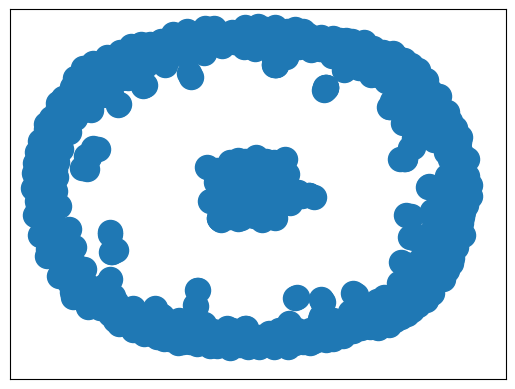

In [11]:
nx.draw_networkx(prem_training_graph, with_labels = False)

In [12]:
average_degs = sum([prem_training_graph.degree[i] for i in prem_training_graph])/len(prem_training_graph), sum([conc_training_graph.degree[i] for i in conc_training_graph])/len(conc_training_graph)
average_degs

(20.29950738916256, 1.391304347826087)

In [13]:
def test(template, nexamples):

    count = 0
    premTP = 0
    premFN = 0
    premFP = 0
    concTP = 0
    concFN = 0
    concFP = 0

    for i in range(len(df_test)):

        prem_subgraph_radius = 20.97              #SET MANUALLY, on the training set, on average these yield a subgraph of size (N*25)**0.5
        conc_subgraph_radius = 24.41

        query = 'Text: '+ df_test.iloc[i]['Text']+'\n'+'Answer: '

        prem_test_graph = prem_training_graph.copy()     
        conc_test_graph = conc_training_graph.copy()


        for j in range(len(prem_training_graph)):
            if euclid(df_train_prem.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > prem_subgraph_radius:
                prem_test_graph.remove_node(j)


        while(len(prem_test_graph) < (nexamples+1)//2):     #If the subgraph doesn't have enough nodes, increment the radius
            prem_subgraph_radius *= 1.05
            prem_test_graph = prem_training_graph.copy()
            for j in range(len(prem_training_graph)):
                if euclid(df_train_prem.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > prem_subgraph_radius:
                    prem_test_graph.remove_node(j)
            #print(subgraph_radius)

        for j in range(len(conc_training_graph)):
            if euclid(df_train_conc.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > conc_subgraph_radius:
                conc_test_graph.remove_node(j)


        while(len(conc_test_graph) < (nexamples+1)//2):     #If the subgraph doesn't have enough nodes, increment the radius
            conc_subgraph_radius *= 1.05
            conc_test_graph = conc_training_graph.copy()
            for j in range(len(conc_training_graph)):
                if euclid(df_train_conc.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > conc_subgraph_radius:
                    conc_test_graph.remove_node(j)
            #print(subgraph_radius)






        
        prem_selected_nodes = []
        conc_selected_nodes = []
        prem_communities = nx.community.louvain_communities(prem_test_graph, seed = random_state)
        prem_sorted_communities = sorted(prem_communities, key = lambda x: len(x), reverse = True)
        conc_communities = nx.community.louvain_communities(conc_test_graph, seed = random_state)
        conc_sorted_communities = sorted(conc_communities, key = lambda x: len(x), reverse = True)
        #print(sorted_communities)
        #print(len(sorted_communities))



        if len(prem_sorted_communities) >= (nexamples+1)//2:    #If there are enough communities:
            for l in range((nexamples+1)//2):
                prem_subgraph = prem_test_graph.subgraph(prem_sorted_communities[l])
                prem_selected_nodes.append(sorted(nx.pagerank(prem_subgraph).items(), key=lambda kv: kv[1], reverse = True )[0][0])
                #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        else:                                       #If there are less communities than nodes to choose:
            numberofelements = 2
            while len(prem_selected_nodes) < (nexamples+1) //2:
                prem_selected_nodes = []
                for element in prem_sorted_communities:
                    prem_subgraph = prem_test_graph.subgraph(element)
                    prem_selected_nodes += [foo[0] for foo in sorted(nx.pagerank(prem_subgraph).items(), key=lambda kv: kv[1], reverse = True )][:numberofelements]
                    numberofelements += 1

        if len(conc_sorted_communities) >= (nexamples+1)//2:    #If there are enough communities:
            for l in range((nexamples+1)//2):
                conc_subgraph = conc_test_graph.subgraph(conc_sorted_communities[l])
                conc_selected_nodes.append(sorted(nx.pagerank(conc_subgraph).items(), key=lambda kv: kv[1], reverse = True )[0][0])
                #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        else:                                       #If there are less communities than nodes to choose:
            numberofelements = 2
            while len(conc_selected_nodes) < (nexamples+1) //2:
                conc_selected_nodes = []
                for element in conc_sorted_communities:
                    conc_subgraph = conc_test_graph.subgraph(element)
                    conc_selected_nodes += [foo[0] for foo in sorted(nx.pagerank(conc_subgraph).items(), key=lambda kv: kv[1], reverse = True )][:numberofelements]
                    numberofelements += 1
            #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        
        prem_selected_nodes = prem_selected_nodes[:(nexamples+1)//2]     #The final chosen demonstrations
        conc_selected_nodes = conc_selected_nodes[:(nexamples+1)//2]
        print('Selected Nodes:', prem_selected_nodes)

        examples_text = []
        
        for el in list(range((nexamples+1)//2)):
            examples_text.append('Text: '+ df_train_prem.iloc[prem_selected_nodes[el]]['Text'] + '\n' + 'Answer: '+ df_train_prem.iloc[prem_selected_nodes[el]]['Name']+'\n\n')
            examples_text.append('Text: '+ df_train_conc.iloc[conc_selected_nodes[el]]['Text'] + '\n' + 'Answer: '+ df_train_conc.iloc[conc_selected_nodes[el]]['Name']+'\n\n')

        random.shuffle(examples_text)

        examples_text = examples_text[:nexamples]

        text_examples = ''      #Building text examples

        for el in examples_text:
            text_examples += el
        
        print('query:\n'+ query,'\n')
        print('retrieved examples:\n\n'+ text_examples,'\n\n')

        messages = [{'role': 'system', 'content': template},{"role": "user", "content": text_examples},{"role": "user", "content": query}]

        outputs = pipeline(
            messages,
            max_new_tokens=10,
            do_sample = False
        )
        final_output = outputs[0]['generated_text'][-1]['content']
        print('LLM output:', final_output)
        print('ground truth:', df_test.iloc[i]['Name'])
        print(200*'-')

        if final_output == 'prem':
            if df_test.iloc[i]['Name'] == 'prem':
                premTP += 1
            else: 
                premFP += 1
                concFN += 1
        
        else:
            if df_test.iloc[i]['Name'] == 'prem':
                concFP += 1
                premFN += 1
            else:
                concTP += 1
        
    premPREC = premTP/(premTP+premFP)
    premREC = premTP/(premTP+premFN)
    concPREC = concTP/(concTP+concFP)
    concREC = concTP/(concTP+concFN)

    premF1 = 2/((1/premPREC)+(1/premREC))
    concF1 = 2/((1/concPREC)+(1/concREC))

    print('premise F1:', premF1)
    print('conclusion F1:', concF1)

    print('macro F1:', (premF1+concF1)/2 )
            


In [14]:
template = '''Classify the following argumentative text as premise 'prem' or conclusion 'conc'. A premise (prem) is a proposition that provides a reason or support for the argument. A conclusion (conc) is the statement that follows logically from the premise(s) and represents the final point being argued for. Only reply with 'prem' or 'conc'\nExamples:'''

In [15]:
test(template, 5)

C:\Users\alfio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\generation\configuration_utils.py:628: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.6` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
C:\Users\alfio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\generation\configuration_utils.py:633: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1097, 1150]
query:
Text: According Commission argument put forward appellant concluded examination financial measures question decision formalised raised General Court accordingly inadmissible
Answer:  

retrieved examples:

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commiss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [688, 692, 918]
query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national court judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 27 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 35 caselaw cited
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision iss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 793, 662]
query:
Text: However clear contrary Commission’s contention argument indeed included application lodged NDSHT General Court claimed paragraph 29 ‘it settled caselaw form acts decisions cast bearing right challenge
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1813, 1952, 388]
query:
Text: Therefore even assuming argument expressed appeal terms application change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

 


LLM output: conc
ground truth: prem
------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [716, 1495, 1734]
query:
Text: follows argument admissible
Answer:  

retrieved examples:

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: result must also rejected inadmissible
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1596, 1840, 1868]
query:
Text: appellant seeks essence show second fourth grounds appeal General Court erred law holding contested letters characteristics act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: appellant therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: appellant therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains Genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [39, 688, 1551]
query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: regards first argument must recalled accordance Court’s settled caselaw proceedings annulment General Court cannot substitute reasoning author contested act see judgments DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 38 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 141
Answer: prem

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [231, 1551, 1780]
query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Court Justice General Court cannot therefore circumstances substitute reasoning author contested act see Case C16498 P DIR International Film Others v Commission 2000 ECR I447 paragraph 38 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 141
Answer: prem

Text: regards first argument must recalled accordance Court’s settled case

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [179, 334, 516]
query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: secondly fact exemptions regionally selective direct consequence decisions thirdly decisions authorised full exemptions excise duties
Answer: prem

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved applicati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1439, 1808, 1322]
query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: purpose thus substitute alternative interpretation thereto accordingly obtain relying particular national provisions whose merits considered first instance new assessment facts evidence
Answer: prem

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pu

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 324, 402]
query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: finding opinion would ‘the clear result distortion concept “alteration existing aid” relevant application Article 1c Regulation 6591999’ apparent first sentence paragraph 58 application
Answer: prem

 


LLM output: conc
ground truth: prem
----------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [563, 112, 987]
query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: contrary Commission stated recital 126 decision issue EIGs issue undertakings within meaning Article 107 TFEU recital 140 tax transparency merely enabled different operators join finance carry economic activity
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detri

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [649, 1217, 1557]
query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly since 3F set action General Court specific line argument concerning infringement principle good administration separate line argument relating infringement Article 882 EC General Court cannot reproached dismissed plea alleging infringement principle good administration without stating specific reasons judgment appeal regard
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [45, 196, 197]
query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: However must forgotten notification State aid central element Community rules supervising aid undertakings aid granted may entertain legitimate expectation aid lawful granted compliance procedure Alcan Deutschland paragraph 25
Answer: prem

Text: Consequently fact authorisation decisions adopted proposal Commission could preclude exemptions classified State aid within meaning Article 871 EC conditions governing existence State aid met
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: However claimed Commission concept State aid corresponds objectiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [673, 688, 1456]
query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national court judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 27 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 35 caselaw cited
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [173, 191, 1175]
query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules applicati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [643, 1780, 970]
query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: limb without subjecting admissibility actions annulment brought natural legal persons condition individual concern allows actions brought ‘regulatory acts’ entail implementing measures direct concern applicant see effect judgment 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 57
Answer: prem

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1183, 1089, 1402]
query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: particular aid implemented without prior notification Commission result unlawful Article 883 EC recipient aid cannot time legitimate expectation grant lawful see Joined Cases C‑18302 P C‑18702 P Demesa Territorio Histórico de Álava v Commission 2004 ECR I‑10609 paragraphs 44 45 caselaw cited
Answer: prem

Text: Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 601, 669]
query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [725, 1000, 1011]
query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: However condition absolute impossibility implementation satisfied defendant Member State inform Commission internal difficulties legal political practical nature attributable national authorities’ acts omissions raised implementation decision issue without taking real steps recover aid undertakings concerned without suggesting Commission alternative methods implementing decision would allow 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [683, 1456, 1181]
query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: respect second criteria General Court considered paragraph 45 judgment 15 September 2016 Scuola Elementare Maria Montessori v Commission T‑22013 published EUT2016484 paragraph 48 judgment 15 September 2016 Ferracci v Commission T‑21913 EUT2016485 decision issue first part second third parts produces legal effects purely automatically basis EU rules alone without application intermediate rules
Answer: prem

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate for

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 1226, 1404]
query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: absence implementing measures natural legal persons although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national courts
Answer: prem

Text: also observed adoption decision least significant element doubt legality measure course implementation must lead Member State suspend application decision may also invoked national court called upon draw appropriate conclusions arising infringement last sentence Article 1083 TFEU
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [616, 1000, 1280]
query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned thirdly able demonstrate differentiation justified since flows nature general structure system measures form part see effect judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 52 see also judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 58 caselaw cited
Answer: prem

Text: third place according settled caselaw fact Member State 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [299, 424, 909]
query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: disregard terms authority conferred Article 8 Regulation 86690 fix criteria eligibility investments Community action
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: considerations set called question Ryanair’s argument based Article 13 Directive 2014104
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 173, 47]
query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: General Court stated regard Article 84 5 Directive 9281 confers particular Commission submits proposal Council enacts measure responsibility assessing whether distortion competition order decide whether authorise Member State apply continue apply exemption harmonised excise duty assessments differ Commission option bringing action annulment Council’s decision
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [860, 1166, 1564]
query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows secondly statement ‘the status EIGs challenged Opening Decision’ made paragraph 95 judgment appeal made sake completeness
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [157, 109, 107]
query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable case interpret caselaw cited preceding paragraph referring person made complaint Commission would amount depriving substance caselaw considered connection first ground appeal cited paragraph 30 order appeal relating effect applicant’s competitive position
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed obs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [326, 1291, 837]
query:
Text: present case common ground Commission examined appellant’s complaint light additional information supplied latter Swedish authorities response requests information sent Commission
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: apparent judgments appeal Commission relied contested decisions order establish measure issue selective fact consequence measure resident undertakings treated equally
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [528, 1021, 1056]
query:
Text: conclusion examination complaint Commission stated letter 24 March 2006 sufficient reasons continuing investigation added propose take action matter
Answer:  

retrieved examples:

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: concluded paragraph 155 judgment advantages obtained investors participated STL operations could considered selective ground undertakings carrying particular type investment EIG benefited
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: date contested decision latter yet acted fix period limitation connection monitoring aid granted Treaty since Regulati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [493, 860, 21]
query:
Text: Furthermore letter 28 April 2006 stated financial measures question constitute unlawful aid
Answer:  

retrieved examples:

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: Taking view measures covered decision 3 July 1991 also decided open procedure provided Article 932 Treaty
Answer: prem

 


LLM output: prem
ground truth: prem
--------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 1997, 1205]
query:
Text: Since Commission concluded sufficient reasons continuing investigation complaint follows substance act question institution formed definitive opinion measures examined thus expressing wish terminate preliminary examination
Answer:  

retrieved examples:

Text: necessary however examine whether notwithstanding error law made General Court second complaint first plea law relied WDFG support action court event rejected inasmuch criticised Commission failing demonstrate acquisitions shareholdings resident companies nonresident companies comparable light objective fiscal neutrality pursued measure issue
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [586, 733, 1376]
query:
Text: finding follows caselaw cited paragraph 52 judgment refused implication initiate formal investigation procedure Article 882 EC
Answer:  

retrieved examples:

Text: follows arguments submitted intervener admissible unless fall within framework provided forms order pleas law judgment 7 October 2014 Germany v Council C‑39912 EUC20142258 paragraph 27
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court paragraph 63 judgment appeal committed ‘to determine whether given legal factual situation HBH must regarded individually concerned contested decision
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: According settled caselaw Court cited

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 537, 1130]
query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason disto

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1828, 397, 100]
query:
Text: must therefore held General Court erred law holding act question characteristics decision producing binding legal effects affect appellant’s interests particular constitute decision pursuant Article 4 Regulation 6591999
Answer:  

retrieved examples:

Text: present case must observed apparent actual wording second plea law raised Italian Republic General Court plea concerns infringement Article 1c Regulation 6591999 defines concept ‘new aid
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate formal review procedure provision
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 1303, 1361]
query:
Text: follows act question must regarded act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [965, 1309, 1503]
query:
Text: follows foregoing considerations second fourth grounds raised NDSHT support appeal must upheld
Answer:  

retrieved examples:

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: prem
---------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 915, 1001]
query:
Text: Moreover Court pointed paragraphs 52 60 judgment decision act question constituted act open challenge even though Commission found measures complained constituted existing aid longer necessary examine first ground appeal put forward appellant alleging distortion contents contested letters
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal th

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1174, 554, 785]
query:
Text: circumstances judgment appeal must set aside
Answer:  

retrieved examples:

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1456, 1242, 1532]
query:
Text: Contrary Ireland contends Commission’s single ground appeal admissible since accordance Article 113 Rules Procedure Court Justice seeks set aside judgment appeal without seeking change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decisio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [317, 627, 1450]
query:
Text: end Commission complains General Court infringed Article 87 EC wrongly held none three elements identified contested decision selective confers selective advantages
Answer:  

retrieved examples:

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 1071 TFEU assessment condition relating selectivity General Court correct ruling legality decision issue light solely grounds formed basis assessment
Answer: prem

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1150, 1451]
query:
Text: necessary reject outset Commission’s complaint contained second part single ground appeal alleges General Court wrongly relied notice relating State aid field taxation content misconstrued
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 597, 1793]
query:
Text: regard reference paragraphs 143 146 judgment appeal notice suffice state General Court draw factual legal conclusion apparent use words ‘as Commission states’ ‘furthermore’ paragraphs relied order substantiate approach set paragraphs 143 146 judgment appeal caselaw Court Justice allocation competence tax matters European Union Member States
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Justice sufficient material exercise power review order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 para

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 601, 673]
query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: according Court’s settled caselaw fact number underta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1001, 1097, 1150]
query:
Text: order examine Commission’s single ground appeal Kingdom Spain’s eighth ground appeal appropriate recall caselaw Court Justice relating concept selective advantage tax matters
Answer:  

retrieved examples:

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations must concluded notwithstanding error law General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [453, 1130, 1328]
query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly concept intervention ‘through State resources’ within meaning provision intended cover addition advantages granted directly State granted public private body appointed established State administer aid see judgments 13 March 2001 PreussenElektra C‑37998 EUC2001160 paragraph 58 30 May 2013 Doux Élevage Coopérative agricole UKLARREE C‑67711 EUC2013348 paragraph 26 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 20
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [517, 1009, 1130]
query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [452, 580, 989]
query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: first place recalled according settled case‑law relatively small amount aid relatively small size undertaking receives exclude possibility intraCommunity trade might affected see Case C14287 Belgium v Commission 1990 ECR I959 ‘Tubemeuse’ paragraph 43 Joined Cases C‑27892 C‑28092 Spain v Commission 1994 ECR I‑4103 paragraph 42 Case C‑28000 Altmark Trans Regierungspräsidium Magdeburg 2003 ECR I‑7747 paragraph 81
Answer: prem

Text: regards condition advantage must granted directly indirectly State resources must recalled measures involving transfer State resources may fall within concept ‘aid’ 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [617, 1011, 1038]
query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: examination selectivity condition therefore implies principle determination first reference framework within measure concerned falls determination greater importance case tax measures since existence advantage may established compared ‘normal’ taxation see effect judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 55
Answer: prem

Text: includes positive benefits also measures various forms mitigate charges normally included budget undertaking thus without subsidies

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [246, 309, 345]
query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Court’s established caselaw appraising requirement selectivity Article 1071 TFEU requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 75 caselaw cited
Answer: prem

Text: Since arguments summarised

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [317, 627, 476]
query:
Text: light caselaw considered whether General Court infringed Article 871 EC interpreted Court Justice ruling none three elements identified contested decision confers selective advantages
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission erred holding relevant reference framework assessing selectivity measure issue constituted rule governing forfeiture losses
Answer: prem

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interprete

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1110, 1269, 1332]
query:
Text: General Court concluded regard first two selective elements measure issue identified contested decision namely fact payroll tax BPOT payable taxable person makes profit amount tax capped respect bases assessment 15 profits Commission succeeded demonstrating elements confer selective advantages
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arising principle equal treatment distinguished nature cases exercise 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1857, 1794, 257]
query:
Text: conclusion General Court vitiated error law
Answer:  

retrieved examples:

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [154, 1439, 791]
query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: contrary applied three criteria interpretation derived three propositions set paragraph 5 judgment order reach conclusion reduction amounted State aid reform form tax adjustment justified nature economy system question
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1758, 1052, 1340]
query:
Text: requirement make profit capping taxation profits per se general measures applicable without distinction economic operators therefore liable confer selective advantages
Answer:  

retrieved examples:

Text: account specific features described paragraph 18 special tax regime could resulted FT’s liability tax less would subject business tax general law regime
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: prem

Text: case aid derives fact another category economic operators category liable pay tax direct competition 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1928, 1804, 124]
query:
Text: Commission’s contention profit criterion alien inherent logic system taxation founded payroll tax BPOT mean criterion neutral becomes selective
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
Answer: prem

Text: Doubt cast finding Commission’s argument first unaware existence undertakings KFC’s situation second KFC made use possibility provided Article 882 EC submitting observations course formal investigation procedure GFA scheme
Answer: prem

Text: Accordingly second part first plea law rela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1124, 1059, 1343]
query:
Text: General Court committed error law ruling requirement make profit capping tax 15 profits confer selective advantages
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: General Court err law finding paragraphs 98 103 judgment appeal tax paytelevision operators DTS liable comparable asymmetrical tax issue case gave rise Laboratoires Boiron judgment
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: General Court therefore entitled find contested decision vitiated unlawfulness simply refers indicative range regards amount aid recovered
Answer: prem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [92, 337, 356]
query:
Text: advantages alleged Commission resulting measures applicable without distinction economic operators namely requirement make profit would benefit unprofitable operators resulting capping tax would benefit profitable operators mean tax regime consideration regarded entailing selective effects
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [517, 317, 1416]
query:
Text: effects favour ‘certain undertakings’ ‘the production certain goods’ within meaning Article 871 EC merely consequence random event undertaking question unprofitable profitable period assessment
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments adm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1548, 1799, 1890]
query:
Text: follows foregoing complaints General Court’s conclusion Commission succeed demonstrating first two elements identified contested decision namely requirement make profit capping tax 15 profits confer selective advantages must rejected
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: General Court err law concluding therefrom

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1570, 1059, 1718]
query:
Text: General Court concluded paragraph 185 judgment appeal selective advantages offshore companies
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: General Court verified genuine tax differential paragraphs 219 225 judgment without findings regard called question FT
Answer: prem

Text: General Court pointed paragraph 60 judgment appeal decision placed file even specifically identified appellants
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
-----------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 1766, 1783]
query:
Text: found Commission failed observe analytical framework relating determination tax measure’s selectivity outlined paragraphs 143 146 judgment appeal referred paragraphs 36 37 succeed demonstrating offshore companies nature physical presence Gibraltar enjoy selective advantages
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Next since outside spheres EU tax law harmonised Member State concerned defines exercising exclusive competence matter direct taxation characteristics constituting tax determination reference system ‘normal’ tax regim

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1857, 260, 785]
query:
Text: reasoning vitiated error law
Answer:  

retrieved examples:

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 622, 1425]
query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: apparent Court’s established caselaw Article 1071 TFEU draw distinction measures State intervention basis techniques used national authorities see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissibl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1064, 1148, 1927]
query:
Text: General Court’s approach based solely regard regulatory technique used proposed tax reform allow effects tax measure question considered excludes outset possibility fact tax liability incurred offshore companies may classified ‘selective advantage
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court thus emphasised clear recital 89 decision issue Commission stated measure issue assessed light general provisions corporate tax system applicable situations emergence goodwill leads fiscal benefit
Answer: prem

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1432, 1857, 123]
query:
Text: approach therefore variance caselaw cited paragraph 87
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1992, 317, 331]
query:
Text: Secondly General Court’s approach also disregards caselaw cited paragraph 71 according existence selective advantage undertaking entails mitigation charges normally included budget
Answer:  

retrieved examples:

Text: Admittedly General Court referred paragraphs 117 119 judgment appeal findings decision stated tax treatment goodwill based criterion whether business combination arisen
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qual

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1605, 162, 1272]
query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Secondly General Court found paragraph 80 judgment appeal although Commission mentioned extension agreements solid minerals sector take account take consideration factors means would position assess whether 2005 agreement selective regards MOL light situation created 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 619, 1824]
query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: However classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general subject tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 91
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appell

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [514, 316, 620]
query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: exclusion keeping caselaw set paragraphs 34 36 follows classification measure ‘State aid’ cannot depend legal status undertakings concerned techniques used
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: prem

Text: consequence Commission’s appeals m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [621, 623, 1327]
query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: consequence would national tax rules fall outset outside scope control State aid account sole fact adopted different regulatory technique although adjusting combining various tax rules produce effects law andor fact
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [311, 495, 613]
query:
Text: considerations apply particularly regard tax system present case instead laying general rules applying undertakings derogation made certain undertakings achieves result adjusting combining tax rules way application results different tax burden different undertakings
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertaking

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [549, 1592, 1624]
query:
Text: Thirdly General Court wrong criticising Commission paragraphs 184 186 judgment appeal demonstrating existence selective advantage offshore companies failed identify contested decision reference framework establishing existence selective advantage
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court rejected argument paragraphs 42 43 judgment appeal stating even assumption established

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [635, 1572, 1781]
query:
Text: noted respect contrary General Court held regard recitals 143 144 150 contested decision apparent recitals Commission examined existence selective advantages offshore companies light tax regime issue formally applies undertakings
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [334, 1054, 1263]
query:
Text: thus apparent contested decision identifies regime reference framework relation offshore companies fact favoured
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1797, 1936, 168]
query:
Text: Lastly Commission contrary General Court held demonstrate requisite legal standard contested decision offshore companies enjoy light reference framework selective advantages within meaning caselaw cited paragraph 75
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 127 140 judgment appeal
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1766, 786, 1927]
query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: appellant argues context regimes applicable economy whole consideration compatibility particular measures Article 921 Treaty reason nature scheme system form part essential issue one distinguishing mechanisms may constitute State aid others caught Article 921 precisely justified nature scheme system
Answer: prem

Text: General Court thus emphasised clear recital 89 decision issue Commission stated measure issue assessed light general provisions corporate tax system applicable situations emergence goodwill leads fiscal benefit
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1269, 1799, 1976]
query:
Text: However General Court failed assess regime issue whole take account factors Commission based assessment regime issue contested decision
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: cannot therefore concluded General Court substituted grounds decision issue overlooking fact Commission allegedly relied reality absence obstacles crossborder combinations order exclude measure issue constituting reference tax system
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [334, 522, 1054]
query:
Text: respect necessary recall permanent features regime issue described paragraphs 21 25 judgment appeal
Answer:  

retrieved examples:

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
-------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [516, 1047, 1053]
query:
Text: features regime first combination payroll tax BPOT sole bases assessment together requirement make profit tax capped 15 second absence generally applicable basis assessment providing taxation companies covered regime
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: also noted irrespective rates business tax adopted local authorities FT benefited circumstances reduced rate respect management costs
Answer: prem

Text: fact FT’s liability professional tax indeed lower 1994 directly att

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1092, 1852, 1991]
query:
Text: view features regime outlined preceding paragraph apparent regime issue combining bases even though founded criteria general nature practice discriminates companies comparable situation regard objective proposed tax reform namely introduce general system taxation companies established Gibraltar
Answer:  

retrieved examples:

Text: far FT argues obligation notify established advantage noted neither purported complexity tax regime issue periodic nature aid measure release Member State obligation notify give rise legitimate expectation part company receiving aid
Answer: prem

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1043, 1074, 1680]
query:
Text: Combining bases assessment results taxation according number employees size business premises occupied also due absence bases assessment excludes outset taxation offshore companies since employees also occupy business property
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: amount fixed levy established accordance parameters used determine amount business tax reference earnings paid State entity 1989 1990
Answer: prem

Text: Fourth level compensation needed must determined basis analysis costs t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [921, 1342, 514]
query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: situation thus comparable exemption tax general application tax may distinguished see effect Laboratoires Boiron judgment paragraphs 30 48
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: prem

Text: exclusion keeping caselaw set paragraphs 34 36 follows classification measure ‘State aid’ cannot depend le

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [311, 495, 613]
query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constituting State aid within meaning Article 1071 TFEU
Answer: prem

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1913, 295, 664]
query:
Text: specifically case
Answer:  

retrieved examples:

Text: follows first plea must rejected
Answer: conc

Text: present case
Answer: prem

Text: case second part single ground appeal also well founded
Answer: conc

Text: assessment irrelevant recovery aid
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [492, 1139, 339]
query:
Text: regard observed fact offshore companies taxed random consequence regime issue inevitable consequence fact bases assessment specifically designed offshore companies nature employees occupy business premises tax base bases assessment adopted proposed tax reform
Answer:  

retrieved examples:

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [327, 1804, 339]
query:
Text: Thus fact offshore companies constitute group companies regard bases assessment adopted proposed tax reform avoid taxation precisely account specific features characteristic group gives reason conclude companies enjoy selective advantages
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Pursuant measure resident undertakings

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [838, 1957, 965]
query:
Text: follows foregoing General Court erred law finding proposed tax reform confer selective advantages purposes Article 871 EC offshore companies
Answer:  

retrieved examples:

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows General C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [988, 1949, 1596]
query:
Text: Consequently Commission’s single ground appeal eighth ground appeal Kingdom Spain well founded point judgment appeal must set aside basis
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Thus arguments advanced appellants order challenge definition objective reference system assessed later stage context examination second part WDFG’s single ground appeal third par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1060, 1572]
query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: regards purported substitution grounds part General Court sufficient note court exceed powers review substituting assessment Commission since tax differential question fact business tax paid annually provided General Tax Code form integral part reasoning adopted Commission contested decision
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1303, 1361, 1387]
query:
Text: appellants stated even rules able used reference framework tax scheme issue conferred economic advantage
Answer:  

retrieved examples:

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: companies moreover argue assessment carried General Court paragraph legally flawed
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2000, 79, 1847]
query:
Text: appellants lastly claimed general realignment scheme could used reference framework either since characteristics totally different tax scheme issue
Answer:  

retrieved examples:

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: appellant merely asserts choice one objective immaterial since must principle coincide
Answer: prem

Text: present case appellants submit objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 1065, 1438]
query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Indeed virtue special regime FT required pay business tax amounts would normally liable general law tax regime
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
---------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 523, 1928]
query:
Text: apparent submissions according appellants neither normal tax rules profits general realignment scheme could used reference framework even case tax scheme issue confer economic advantage one schemes
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: Commission clarified decision position could explained finding situations financial goodwill amortised cover whole category taxpayers placed similar factual legal situation
Answer: prem

Text: must pointed considerations based incorrect premiss investors EIGs could regarded beneficiaries advantages arising tax measures issue therefore reference investors EIGs condition relating selectivity examined
Answer: prem

Text: light considerations must concluded notwithstanding error 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [863, 1291, 1572]
query:
Text: order respond arguments General Court paragraph 161 judgment appeal first duly reiterated Court Justice’s caselaw determination reference framework purpose checking whether measure selective following terms
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination def

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 1433, 1768]
query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [162, 1240, 1592]
query:
Text: General Court paragraphs 165 167 judgment appeal made following observations ‘It necessary first consider appellants’ complaints relating Commission’s choice normal corporation tax reference framework finding made institution within framework selective economic advantage
Answer:  

retrieved examples:

Text: Consequently paragraph 110 operative part judgment appeal General Court annulled contested decision ‘in far finds based finding exemptions issue constituted State aid within meaning Article 871 EC’ far orders recovery exemptions beneficiaries
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 1064, 1070]
query:
Text: present case Commission found although system fiscal neutrality established Law … 2181990 resembled regards gains realised recognised system fiscal neutrality Article 4 … Decree … 3581997 second sentence point 99 grounds contested decision — finding dictated realignment scheme may introduced legislature applied without distinction conditions gains realised context either two systems point 88 grounds contested decision — Italian Republic limited benefit realignment scheme Article 226 Law … 3502003 undertakings reorganised Law … 2181990 point 90 grounds contested decision
Answer:  

retrieved examples:

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms contested decision categorises regime applicable FT years 1994 2002 aid incompatible common market
Answer: prem

Text: Since cannot ruled organisations representin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [541, 1067, 351]
query:
Text: basis considerations Commission concluded Italian Republic conferred selective advantage undertakings corresponding difference tax actually paid pursuant Article 226 Law … 3502003 normal tax would paid realignment taken place absence preferential scheme point 91 grounds contested decision
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition oper

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1793, 1811, 1932]
query:
Text: paragraphs 169 172 paragraph 186 judgment appeal General Court responded appellants’ complaints regards Commission’s choice using normal tax rules profits reference framework dismissed following terms
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: follows par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [310, 625, 264]
query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain sectors activity see effect inter alia judgment 30 J

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 522, 1970]
query:
Text: fact absence realignment scheme issue undertakings concerned would allegedly disposed assets context objective assessment irrelevant
Answer:  

retrieved examples:

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1854, 1589, 2009]
query:
Text: appellants also claim … use normal tax reference framework inappropriate whilst application tax normally applied event disposal would undoubtedly eliminate misalignment assets establishment assets transferred Law … 2181990 would hand effect misalignment shares received transferring entity
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 1510, 1298]
query:
Text: regards appellants’ reference situation transferring entities Law … 2181990 noted contested decision way concern entities simply banks assets transferred law
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: regards substance General Court held follows paragraphs 185 188 judgment appeal
Answer: prem

Text: addition must stated Commission’s assertion relevant 8 January 2008 MOL undertaking enjoy preferential treatment cannot accepted
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

 



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [50, 60, 139]
query:
Text: Commission considered contested decision whether advantage concluded case solely connection banks
Answer:  

retrieved examples:

Text: Court also held absence overriding public interest Commission infringed superior rule law fails couple repeal set rules transitional measures protection expectations trader might legitimately derived Community rules Belgium Forum 187 paragraph 149 case‑law cited
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Commission’s argument judgment ATM sufficient ground rejecting appellant’s arguments relating competitive position cannot accepted
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside poin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1854, 586, 2020]
query:
Text: follows repeated references made appellants present action … situation transferring entities Law … 2181990 particular fact 2003 tax reform remove entities risk double taxation suspended gains distributed dividends irrelevant
Answer:  

retrieved examples:

Text: present case must stated grounds judgment appeal set paragraphs – intended respond WDFG’s argument Commission distinguish acquisitions shareholdings nonresident companies resulting acquisition control acquisitions shareholdings order declare application measure issue acquisitions shareholdings nonresident companies entail classification State aid – included sake completeness
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1771, 2009, 1168]
query:
Text: follows considerations contrary appellants’ claims Commission err using normal tax reference framework purpose determining whether economic advantage
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: already noted paragraphs 83 85 purposes applying private investor test relevant evidence information available developments foreseeable time decision make investment taken
Answer: prem

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment account

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1509, 1579, 1946]
query:
Text: Lastly General Court responded appellants’ complaints relating fact general realignment scheme could used reference framework observing paragraph 173 judgment appeal scheme set Article 225 Law 3502003 chosen Commission reference framework follows ‘With regard appellants’ argument realignment scheme Article 225 Law … 3502003 greater extent normal tax valid reference framework … — moreover contradicts argument set paragraph 174 — sufficient point Commission contested decision use scheme established Article 225 Law … 3502003 reference framework
Answer:  

retrieved examples:

Text: General Court responded argument paragraphs 107 111 judgment appeal follows ‘It must observed according paragraph 31 contested decision conditions imposed notified measure restrict possibility early depreciation certain assets
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decisio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [547, 1579, 1080]
query:
Text: General Court responded paragraphs 182 183 judgment appeal appellants’ arguments relating comparison tax scheme issue realignment schemes follows ‘In view difference objectives two realignment schemes necessary compare realignment Article 226 Law … 3502003 realignment Article 225 law
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: General Court responded argument paragraphs 107 111 judgment appeal follows ‘It must observed according paragraph 31 contested decision conditions impose

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [459, 474, 1725]
query:
Text: measure realignment Article 226 Law … 3502003 could compared realignment measure Article 19 Law … 3422000 legislature extended benefit realignment Article 17 Law … 3422000 undertakings reorganised Article 4 Legislative Decree … 3581997
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: fact resources concerned may administered entities distinct public authorities source resources may private significance regard see effect judgments 2 July 1974 Italy v Commission 17373 EUC197471 paragraph 35 8 May 2003 Italy SIM 2 Multimedia v Commission C‑32899 C‑39900 EUC2003252 paragraph 33
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: apparent judgment fact coming compulsory levy contrary sufficient identi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1572, 1616]
query:
Text: apparent considerations contrast stated ground appeal General Court give reasons unrelated contested decision since paragraphs 165 173 186 judgment appeal observed reference framework chosen Commission normal tax rules profits respond appellants’ arguments compared tax scheme issue general realignment scheme
Answer:  

retrieved examples:

Text: contrast stated paragraph 63 judgment contested decisions Commission order establish selectivity measure issue relied primarily ground consequence measure discrimination confers tax advantage certain resident undertakings others subject ordinary tax system measure issue derogation
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: case 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [466, 1492, 1839]
query:
Text: issue appellants state point 15 reply proceedings Court Justice arguments submitted alternative
Answer:  

retrieved examples:

Text: stated paragraph 48 present judgment contrary stated paragraph 211 judgment appeal fact source revenue came advertisers private significance regard irrelevant question whether revenue controlled Danish authorities
Answer: prem

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1794, 1933, 667]
query:
Text: follows General Court required respond
Answer:  

retrieved examples:

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1078, 1114, 1875]
query:
Text: addition paragraph 182 judgment appeal General Court held need compare tax scheme issue general realignment scheme exactly appellants maintained points 98 100 application initiating proceedings General Court point point 77 appeal
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: noted paragraphs 170 179 judgment appeal paragraphs referred fifth part single ground appeal General Court set reasons Kingdom Spain failed establish measure issue offset alleged detrimental effects normal regime
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1492, 1591, 1740]
query:
Text: thus apparent appellants successful legal interest challenging judgment appeal issue
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

 


LLM output: conc
ground truth: prem
----------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [466, 533, 816]
query:
Text: stated paragraph 73 judgment appellants sought establish companies assets transferred Law 2181990 different legal situation companies assets transferred
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1078, 1150, 1481]
query:
Text: contrast stated ground appeal General Court paragraph 191 judgment appeal conclude tax scheme issue selective merely held tax realignment schemes two categories companies Law 3422000 uniform
Answer:  

retrieved examples:

Text: circumstances General Court entitled find paragraph 213 judgment appeal fixed levy must regarded charge connected introduction special tax regime rather special tax mechanism FT established years prior 1994
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1814, 1953, 667]
query:
Text: addition General Court relied grounds order decide two categories companies different situations
Answer:  

retrieved examples:

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 716, 1595]
query:
Text: follows fifth ground appeal unfounded
Answer:  

retrieved examples:

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 1593, 1728]
query:
Text: grounds appeal appellants criticise General Court exercised power review examine whether tax scheme issue justified nature general scheme Italian tax system
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly General Court justified conclusion requisite legal standard cannot held General Court obliged extend assessment selectivity notified measure adding exhaustive examination criteria governing eligibility measure
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1114, 1275, 1577]
query:
Text: apparent paragraphs 124 130 paragraph 200 judgment appeal appellants submitted tax scheme established Articles 17 18 Law 3422000 extended respect companies entities took part transfers assets exchange shares system fiscal neutrality provided Article 72 Law 2181990
Answer:  

retrieved examples:

Text: noted connection paragraphs 323 324 judgment appeal General Court provided clear assessment characteristics business tax scheme enabled conclude paragraph 325 judgment limitation period provided Article 15 Regulation 6591999 expired 28 June 2001 date request information sent French Republic
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [352, 1064, 524]
query:
Text: argued following entry force Legislative Decree 3442003 establishment special exemption regime known ‘shareholding exemption’ risk double taxation disappeared companies entities carried transactions system fiscal neutrality provided Article 4 Legislative Decree 3581997
Answer:  

retrieved examples:

Text: Therefore failing examine whether system authorising early depreciation provided Article 484 Article 11511 TRLIS Article 49 RIS conferred tax authority discretionary power favour activities carried EIGs involved STL system effect favouring activities General Court erred law
Answer: prem

Text: regard may added Court previously ruled tax measure solely undertakings carried specified transactions benefited undertakings sector carry transactions could classified selective need assess whether measure greater benefit large undertakings see effect judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraphs 47 50
Answer: prem

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [528, 1073, 816]
query:
Text: Commission contended set paragraphs 150 152 judgment appeal entities transferred assets transactions carried scheme laid Law 2181990 longer credit institutions majority cases longer undertakings
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: concluded paragraph 155 judgment advantages obtained investors participated STL operations could considered selective ground undertakings carrying particular type investment EIG benefited
Answer: prem

Text: regard noted

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1042, 1657, 482]
query:
Text: respect risk double taxation Commission observed entities transferred assets transactions carried Legislative Decree 3581997 never benefited tax realignment scheme set Article 18 Law 3422000
Answer:  

retrieved examples:

Text: Commission therefore indicated compensation overcompensation charges included calculation contribution paid pursuant 1990 Law State aid defined calculated reduction contribution made 1996 Law
Answer: prem

Text: regards present case noted tax regime FT subject second period consideration namely years 1994 2002 constituted exception general law regime
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: case single ground

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1246, 1579, 1560]
query:
Text: General Court responded line argument paragraphs 199 202 judgment appeal follows ‘Next necessary consider appellants’ complaint … alleging Commission wrong consider selective nature scheme established Article 226 Law … 3502003 could justified inherent logic system
Answer:  

retrieved examples:

Text: must observed General Court held paragraph 93 judgment appeal ‘the new version Article 11511 LIS selfstanding’ ‘the answer question whether notified measure conferred selective advantage cannot therefore dependent effect previous provisions
Answer: prem

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: prem

Text: Consequent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1989, 205, 1064]
query:
Text: context applicants submit essentially … 2003 tax reform eliminated risk double taxation gains arising transfer assets system fiscal neutrality established Article 4 Legislative Decree … 3581997 namely taxation companies transferring companies receipt assets
Answer:  

retrieved examples:

Text: concept aid embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect Case C20097 Ecotrade 1998 ECR I7907 paragraph 34 Case C697 Italy v Commission 1999 ECR I2981 paragraph 15
Answer: prem

Text: submit objective ensuring ‘a degree consistency tax treatment goodwill accounting treatment’ referred paragraph 121 judgment appeal way reflected either decision issue observations submitted Kingdom Spain administrative procedure
Answer: prem

Text: Consequently General Court’s interpretation effect aid issue consisted tax diff

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [352, 279, 1048]
query:
Text: hand reform remove risk double taxation gains arising connection transfer assets system fiscal neutrality introduced Law … 2181990 appellants maintain explains decision Italian legislature extend realignment scheme Articles 17 18 Law … 3422000 assets transferred context Law … 2181990
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: regard particular unlawful aid granted form tax advantage also Court’s settled caselaw recovery aid means transactions actually carried recipients aid question must subject tax treatment recipients would received absence unlawful aid see effect judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraph 119
Answer: prem

Text: Consequently Court First Instance

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1466, 528, 937]
query:
Text: However recalled contested decision concern transferring entities banking establishments assets transferred Law … 2181990 economic advantage reserved establishments scheme issue
Answer:  

retrieved examples:

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently fact contributions question entered accounts State revenue sufficient consider payments made ELGA financed State resources” recital 58
Answer: prem

Text: concluded paragraph 155 judgment advantages obtained investors participated STL operations could considered selective ground undertakings carrying particular type investment EIG be

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1342, 315, 423]
query:
Text: Consequently fact transferring entities Law … 2181990 might taxed possibility double taxation cannot factor justifies selective advantage conferred recipient banks means Article 226 Law … 3502003
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: situation thus comparable exemption tax general application tax may distinguished see effect Laboratoires Boiron judgment paragraphs 30 48
Answer: prem

Text: Consequently must observed legislative alteration referred paragraph 42 effect transforming aid scheme authorised Council decision new unlawful aid
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court Fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [563, 987, 927]
query:
Text: Commission therefore correct consider recital 105 preamble contested decision scheme introduced Article 226 Law … 3502003 conferred selective advantage effect improving competitiveness credit institutions reorganised Law … 2181990 comparison undertakings
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: contrary Commission stated reci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [304, 487, 606]
query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: consequence Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [494, 601, 690]
query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Thus respect assessment context appeal General Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [208, 669, 1130]
query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: test applicable among factors

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1797, 337, 1576]
query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [39, 252, 1496]
query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Admittedly Court held even Community legislature laid period limitation fundamental requirement legal certainty effect preventing Commission indefinitely delaying exercise powers see effect 5269 Geigy v Commission 1972 ECR 787 paragraph 21 regards State aid falling within scope ECSC Treaty Falck Acciaierie di Bolzano v Commission paragraphs 140 141
Answer: prem

Text: Since

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [386, 1568, 1569]
query:
Text: However General Court find case
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Accordingly General Court cannot reproached infringed obligation state reasons way
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: However clear General Court stated paragraph 98 judgment appeal ‘the notified measure general tax measure
Answer: prem

Text: Consequently General Court examined possibility de facto selectivity
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 1427, 627]
query:
Text: Thus merely observing contested decision concern transferring entities without considering tax realignment scheme entirety without assessed appellants’ Commission’s arguments General Court erred law failing carry comprehensive review whether tax scheme issue came within scope Article 1071 TFEU see effect British Aggregates v Commission paragraph 115
Answer:  

retrieved examples:

Text: follows Commission’s principal line argument set paragraph 34 present judgment measure laying conditions public undertaking offers goods services always constitutes selective measure unfounded
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: However imposition supplementary requirement ide

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1376, 2018, 1184]
query:
Text: judgment appeal must therefore set aside extent infringed Article 1071 TFEU
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: follows arguments submitted intervener admissible unless fall within framework provided forms order pleas law judgment 7 October 2014 Germany v Council C‑39912 EUC20142258 paragraph 27
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: fifth ground appeal must consequently dismissed unfounded
Answer: conc

Text: present instance contested decision decision founded Article 43 Regulation 659199 raise objections
Answer: prem

 


LLM output: conc
ground truth: conc
------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [958, 963, 1090]
query:
Text: Contrary assertions Commission Comunidad Autónoma de La Rioja Territorio Histórico de Álava raise Court First Instance initial application paragraph 71 et seq plea alleging misuse powers part Commission
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Moreover Court held aid notified Commission apparent failure act part relation measure irrelevant s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [685, 720, 394]
query:
Text: plea examined regard Ramondín Territorio Histórico de Álava paragraphs 82 88 judgment appeal
Answer:  

retrieved examples:

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows General Court entitled consider Mr Ferracci Scuola Elementare Maria Montessori directly concerned decision issue
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: must stated first Scuola Elementare Maria Montessori challenge way presentation material content evidence paragraphs 101 102 judgment confines calling question assessment made General Court basis content
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1203, 1488, 131]
query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Court First Instance correctly held paragraphs 59 66 judgment appeal fact sufficient procure ‘advantage’ KFC purposes case‑law mentioned paragraph 63 judgment
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: requirement satisfied plea complains General Court reached 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1545, 809, 850]
query:
Text: paragraphs 85 87 analysed assessed applicants’ allegations arguments
Answer:  

retrieved examples:

Text: paragraphs 93 101 judgment General Court set reasons held examination sufficient
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: second part single ground appeal Commission’s appeals must therefore rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1846, 1985, 388]
query:
Text: found adduced objective evidence could concluded Commission’s real purpose adopting contested decision achieve tax harmonisation
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unf

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [115, 478, 584]
query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner Joined Cases 6785 6885 7085 Kwekeriij van der Kooy Others v Commission 1988 ECR 219 paragraph 15 Case C‑692 Federmineraria Others v Commission 1993 ECR I‑6357 paragraph 14 Joined Cases C‑1598 C‑10599 Italy Sardegna Lines v Commission 2000 ECR I‑8855 paragraph 33
Answer: prem

Text: According judgment applicant individually con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [260, 1721, 1847]
query:
Text: appellants confine assertions challenging findings fact
Answer:  

retrieved examples:

Text: appellant merely asserts choice one objective immaterial since must principle coincide
Answer: prem

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: appellants shown evidence sufficient justify legitimate expectation alleged
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1985, 1323, 1952]
query:
Text: produce evidence establish Court First Instance distorted clear sense evidence produced
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: seeking show General Court made findings manifestly conflicting national legislation relation items file given legislation scope clearly
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1056, 1818, 826]
query:
Text: event cannot maintained Court First Instance concluded absence complaint competitor Commission’s objectives stated
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: respect judgment Court First Instance submission vitiated defective reasoning event inadequate statement grounds
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

 


LLM output: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [225, 785, 850]
query:
Text: mere fact complaint admit hypothesis
Answer:  

retrieved examples:

Text: follows second plea must rejected unfounded
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 217, 1742]
query:
Text: follows ground appeal alleging misuse powers must rejected
Answer:  

retrieved examples:

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows order identify advantageous alternative creditor would weigh advantages disadvantages procedures
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: second part ground appeal ineffective since directed judgment appeal
Answer: prem

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [965, 1492, 1309]
query:
Text: regards ground appeal based failure state grounds judgment appeal point must held Ramondín raise plea appeal
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

 


LLM output: prem
ground truth: prem
----------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1935, 1574, 1596]
query:
Text: stating pleading lodged 18 February 2004 maintaining ground appeal concerning failure state grounds judgment appeal relation plea alleging misuse powers Ramondín thus reality introducing new plea law
Answer:  

retrieved examples:

Text: appellants complain General Court substituted reasoning decision issue ruling possibility measure issue might constitute reference system right
Answer: prem

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal appellant claims essence General Court failed assess whether Commission examined selectivity notified measure due diligence
Answer: prem

Text: regards fourth part ground appeal appellant complains General Court contradicted notice since General Court held paragraph 109 judgment appeal notice allows differentiation within tax system provided differentiation supported rational justification
Answer: prem

Text: first part first plea alleging Court First Instance erred la

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1376, 657, 849]
query:
Text: plea inadmissible Articles 422 118 Rules Procedure Court Justice
Answer:  

retrieved examples:

Text: follows arguments submitted intervener admissible unless fall within framework provided forms order pleas law judgment 7 October 2014 Germany v Council C‑39912 EUC20142258 paragraph 27
Answer: prem

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: begin paragraph 35 Court First Instance rejected objection inadmissibility raised Commission
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
----------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [958, 963, 1090]
query:
Text: regards Territorio Histórico de Álava put forward ground appeal concerning failure state grounds judgment appeal maintained pleading lodged 20 February 2004 noted judgment states
Answer:  

retrieved examples:

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

 


LLM output: prem
ground truth: prem
--------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1574, 1942, 1427]
query:
Text: paragraph 85 applicants’ arguments based speculation regarding possible underlying reasons contested decision even shown harmonisation fact achieved Community level contested decision
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal appellant claims essence General Court failed assess whether Commission examined selectivity notified measure due diligence
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage res

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [713, 1516, 1625]
query:
Text: paragraph 86 Territorio Histórico de Álava referred cases gave rise order President Court Justice 16 February 2000 Joined Cases C40097 C‑40297 Juntas Generales de Guipúzcoa Others 2000 ECR I1073 cases Commission applicant’s submission undermined legislative capacity Basque authorities field taxation finding Normas Forales constituted State aid since applicable exclusively particular area Member State
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: General Court stated paragraphs 159 161 judgment appeal settled caselaw Court application Article 1073 TFEU Commission enjoys wide discretion exercise involves complex economic social assessments judgments Germany Others v Kronofrance C‑7505 P C‑8005 P EUC2008482 paragraph 59 Banco Privado Português Massa Insolvente Banco Pri

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [162, 499, 1284]
query:
Text: paragraph 87 lastmentioned argument rejected since contested decision Commission taken criterion regional selectivity basis establishing tax advantages Ramondín benefited constituted State aid falling within scope Article 92 EC Treaty amendment Article 87 EC
Answer:  

retrieved examples:

Text: Consequently paragraph 110 operative part judgment appeal General Court annulled contested decision ‘in far finds based finding exemptions issue constituted State aid within meaning Article 871 EC’ far orders recovery exemptions beneficiaries
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: preliminary point must stated paragraphs 62 63 judgment appeal General Court observed conte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1309, 1813, 1952]
query:
Text: statement grounds appears adequate light arguments presented Court First Instance application reply
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
-------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 557, 1303]
query:
Text: arguments include reference withdrawal series tax measures list drawn group set within Council
Answer:  

retrieved examples:

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: explained set paragraph 9 EIG collected tax benefits two stages combination tax measures issue
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [958, 963, 1090]
query:
Text: follows Territorio Histórico de Álava’s ground appeal concerning failure state grounds judgment appeal far concerns alleged misuse powers part Commission must rejected
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: third part WDFG’s single ground appeal fourth part Kingdom Spain’s single ground appeal must therefore rejected ineffective
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

 


LLM output: prem
ground truth: conc
-----------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [998, 779, 956]
query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regard Court First Instance also fully entitled hold paragraph 96 contested judg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [918, 957, 1203]
query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: appeal Court’s jurisdiction thus confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C795 P Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [958, 963, 1090]
query:
Text: present case Territorio Histórico de Álava contend first instance – impugned tax measures precluded scope law State aid
Answer:  

retrieved examples:

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Moreover Court held aid notified Commission apparent failure act part relation measure irrelevant see Demesa Territorio Histόrico de Álava v Commission paragraph 52
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [673, 959, 1180]
query:
Text: Article 92 Treaty applied provisions tax law since conclusions Ecofin Council meeting 1 December 1997 concerning tax policy Commission notice 10 December 1998 application State aid rules measures relating direct business taxation
Answer:  

retrieved examples:

Text: Commission adopts decision declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999 Commission v Kronoply Kronotex paragraph 45 Austria v ScheucherFleisch Others paragraph 42
Answer: prem

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant canno

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1263, 908, 960]
query:
Text: reality referred economicpolicy objectives measure reducing basis assessment course argument concerning selectivity measure say stage argument concerning categorisation measures State aid incompatible common market purposes Article 92 Treaty
Answer:  

retrieved examples:

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: prem

Text: Next taking view objectives regional agricultural policy Community justified particular treatment investment project issue regards region covered Objective 1 Commission exercise discretion manifestly erroneous way
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [852, 961, 1571]
query:
Text: Court First Instance examined corresponding arguments paragraph 51 judgment appeal
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Court First Instance analysed separate question paragraphs 44 50 judgment appeal
Answer: prem

Text: General Court paragraph 91 judgment rejected appellant’s arguments insufficiency examination Commission selectivity national measure issue
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

 


LLM output: prem
ground truth: prem
-------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 863, 962]
query:
Text: argument submitted Court present appeal namely substance tax measure issue excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer:  

retrieved examples:

Text: argument submitted Court present appeal namely substance impugned tax measure excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [845, 964, 1756]
query:
Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised since latter cannot dissociated former
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Indeed appellant could thus base appeal pleas law arguments already relied Court First Instance appeal would deprived part purpose
Answer: prem

Text: reasons stated paragraph 59 judgment ground appeal must declared inadmissible new plea must ground appeal alleging failure state grounds judgment appeal point latter cannot dissociated former
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 1303, 716]
query:
Text: follows foregoing appeals must dismissed
Answer:  

retrieved examples:

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1338, 1475, 1916]
query:
Text: Italy Wam contest admissibility appeal
Answer:  

retrieved examples:

Text: Hellenic Republic shown Commission erred classifying payments State aid
Answer: prem

Text: WDFG Kingdom Spain refer particular paragraphs 92 140 judgment appeal
Answer: prem

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: third part WDFG’s single ground appeal fourth part Kingdom Spain’s single ground appeal must therefore rejected ineffective
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1410, 1689, 50]
query:
Text: Italy argues Commission’s contention judgment Court First Instance inconsistent caselaw Court Justice ground appeal relate point law
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: General Court indeed held paragraph 63 judgment appeal verification conditions laid Altmark caselaw occurs upstream say examination issue whether measures issue must characterised State aid
Answer: prem

Text: Commission’s argument judgment ATM sufficient ground rejecting appellant’s arguments relating competitive position cannot accepted
Answer: prem

Text: Accordingly f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [863, 998, 1375]
query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation n

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1456, 1819, 645]
query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: Secondly regards appellant’s criticism reference Opinion Advocate General Warner Italy v Commission 17373 EUC197452 ‘Advocate General Warner’s Opinion’ p 728 General Court rightly pointed paragraph 125 judgment appeal Commission correctly stated recital 124 decision issue measure issue introduced new general rule right relating amortisation goodwill
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [660, 1564, 662]
query:
Text: follows Italian Republic’s argument appeal based point law must rejected
Answer:  

retrieved examples:

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows secondly statement ‘the status EIGs challenged Opening Decision’ made paragraph 95 judgment appeal made sake completeness
Answer: prem

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

 


LLM output: conc
ground truth: prem
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [373, 396, 1897]
query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [825, 1314, 717]
query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [18, 1780, 1920]
query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question see C‑50100 Spain v Commission 2004 ECR I‑6717 paragraph 73 caselaw cited
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s fo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1845, 1848, 1897]
query:
Text: Since objective Commission’s single ground appeal precisely contest legal analysis obligation Court First Instance provide statement reasons Commission cannot criticised inviting Court Justice reexamine substance contested decision
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion clear appellants’ arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 639, 925]
query:
Text: follows Wam’s argument concerning admissibility Commission’s single ground appeal must dismissed
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: follows foregoing first part HBH’s second ground appeal well founded without necessary examine second part argument put forward support
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows arguments advanced Commission alternative unfounded
Answer: conc

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1731, 878]
query:
Text: Accordingly appeal must held admissible
Answer:  

retrieved examples:

Text: Accordingly appeal must held admissible
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [17, 536, 1697]
query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: prem

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union exercise jurisdiction re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [18, 1314, 537]
query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question see C‑50100 Spain v Commission 2004 ECR I‑6717 paragraph 73 caselaw cited
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules gove

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 538, 1581]
query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: explanation readily understood particularly notified measure compared Article 1156 LIS concerning accelerated depreciation
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 1071 TFEU
Answer: prem

Text: Accordingly second

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [195, 337, 1547]
query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regards argument conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [543, 1251, 1280]
query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: also settled caselaw purpose categorising national measure ‘State aid’ necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition judgment 10 January 2006 Cassa di Risparmio di Firenze O

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [310, 541, 987]
query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [543, 1144, 542]
query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1804, 885, 1639]
query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard fact economic sector subject liberalisation EU level may serve determine aid question real potential effect competition affects trade Member States judgment 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [205, 316, 458]
query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [159, 161, 1694]
query:
Text: circumstances present case must held Court First Instance infringe caselaw cited concerning Commission’s obligation state reasons matters State aid holding paragraph 76 judgment appeal reasoning provided recitals 74 79 contested decision make possible understand circumstances present case aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [820, 1004, 2002]
query:
Text: Regarding specific circumstances present case Court First Instance correctly points particular paragraph 63 judgment appeal aid issue intended finance means loans reduced rates expenses market penetration programmes nonmember States concerning establishment permanent structures trade promotion grant equivalent relatively small amount
Answer:  

retrieved examples:

Text: Court First Instance added paragraph 110 far resources used finance social expenditure particular stated contested decision settled caselaw constituted reduction social security commitments undertaking normally discharge thus constituted aid
Answer: prem

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind with

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [820, 875, 992]
query:
Text: Furthermore paragraph 75 judgment Court First Instance underlined aid intended directly immediately support exports outside EU finance market penetration programme
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Court First Instance added paragraph 110 far resources used finance social expenditure particular stated contested decision settled caselaw constituted reduction social security commitments undertaking normally discharge thus constituted aid
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [804, 837, 1018]
query:
Text: light specific circumstances case Court First Instance err law holding paragraph 63 judgment appeal Commission particular obliged examine whether aid issue liable affect trade Member States distort competition giving information relevant likely effects contested decision
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: hand Court First Instance rule remaining criteria application Article 921 Treaty particular 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 998, 1191]
query:
Text: regard paragraph 64 judgment appeal Court First Instance rightly explained would suffice Commission show correctly aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: regard Court First Instance also fully entitled hold paragraph 96 contested judgment even assuming Community quota exhausted factor would necessarily led conclusion aid dispute effect intraCommunity trade competition
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1169, 1288]
query:
Text: Court First Instance notably stressed context Commission obliged carry economic analysis actual situation relevant market patterns trade question Member States show real effect aid issue particular prices applied Wam examine Wam’s sales United Kingdom market
Answer:  

retrieved examples:

Text: especially present case Commission seeking determine whether State aid relation investment notified time Commission carries examination already made Member State concerned
Answer: prem

Text: General Court made clear regard fact one operator concluded agreement type sufficient establish selective nature agreement since may result inter alia lack interest part operator
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact addre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [597, 793, 863]
query:
Text: regard practical implementation principles Court First Instance right hold paragraph 66 judgment appeal general reasoning contained recitals 75 77 contested decision based reaffirmation principles flowing Tubermeuse judgment cannot considered satisfy requirements arising Article 253 EC
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: consequence Commission’s appeals must upheld 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [915, 988, 1596]
query:
Text: Regarding reasons set recitals 76 78 contested decision Court First Instance without erring law held paragraphs 68 74 judgment appeal recitals even read combination principles set recital 75 contested decision finding financial situation Wam improved sufficient permit understanding aid issue liable present case affect trade Member States distort threaten distort competition sector
Answer:  

retrieved examples:

Text: Consequently Court First Instance fully entitled hold paragraph 95 contested judgment necessary establish certain Community undertakings adversely affected granting aid dispute
Answer: prem

Text: regards fourth part ground appeal appellant complains General Court contradicted notice since General Court held paragraph 109 judgment appeal notice allows differentiation within tax system provided differentiation supported rational justification
Answer: prem

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fac

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 998, 1191]
query:
Text: Contrary claim Commission respect mere fact Wam took part intraCommunity trade exporting important part production within EU cannot suffice particular circumstances case recalled paragraph 55 judgment demonstrate effects
Answer:  

retrieved examples:

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently Court First Instance committed error law 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [72, 337, 365]
query:
Text: context noted particular although follows caselaw cited paragraphs 50 53 judgment effects principle result fact beneficiary aid active liberalised European market fact remains circumstances case contrary circumstances giving rise cases aid issue directly connected activity beneficiary market intended finance expenditure nonmember State market penetration programme
Answer:  

retrieved examples:

Text: contrary exclude priori possibility case present trade union could show party concerned within meaning Article 882 EC relying role collective negotiations effects role national tax measures regarded Commission aid compatible common market would liable undermine social policy objectives induced Court exclude collective agreement issue Albany application Article 851 Treaty
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [341, 1137, 1623]
query:
Text: circumstances involves aid grant equivalent relatively low value effect aid trade intraCommunity competition less immediate even less discernible requires greater effort state reasons part Commission
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: prem

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [586, 641, 533]
query:
Text: Finally caselaw cited paragraph 54 judgment according principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition sufficient note aid issue fact intended release Wam costs
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court paragraph 63 judgment appeal committed ‘to determine whether given legal factual situation HBH must regarded individually concerned conteste

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1121, 1572, 1797]
query:
Text: follows Court First Instance held substance paragraphs 62 76 judgment appeal Commission carried detailed analysis potential consequences aid issue intraCommunity trade competition given additional information contested decision concerning effects intend depart caselaw cited take account specific circumstances case cannot accused erring law respect
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: Consequently Court Fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [383, 735, 1265]
query:
Text: Furthermore conclusion invalidated arguments advanced Commission regard findings Court First Instance paragraph 74 judgment appeal
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking criticise analysis made General Court legal framework governing 2005 agreement
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: noted paragraph 93 General Court upheld first part decision

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [371, 1039, 1467]
query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: findings disputed Hellenic Republic suffice conclude compensation payments correspond contributions farmers State resources imputable State
Answer: prem

Text: state affairs inconsistent recognition positive value mine regard definition adopted Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1762, 1843, 1681]
query:
Text: true examination interdependence cannot required demonstrated State aid directly affects intraCommunity markets must however held contested decision confirmed preceding paragraphs judgment adequately demonstrate
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Thus respect assessment context

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 1303, 716]
query:
Text: follows considerations appeal must dismissed
Answer:  

retrieved examples:

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows foregoing appeals must dismissed
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [127, 1859, 1998]
query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: According settled case‑law applicant interest bringing proceedings light subject‑matter action action must capable outcome procuring advantage party brought see effect Case C‑5000 P Unión de Pequeños Agricultores v Council 2002 ECR I‑6677 paragraph 23 Case C‑27701 P Parliament v Samper 2003 ECR I‑3019 paragraphs 30 31 order 5 March 2009 Case C‑18308 P Commission v Provincia di Imperia paragraph 19 case‑law cited
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Uni

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [373, 717, 1368]
query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: prem

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1716, 735, 1976]
query:
Text: application General Court failed identify clear unequivocal coherent intelligible manner way contested decision infringed provisions
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: noted paragraph 93 General Court upheld first part decision issue despite fact Commission omitted carry decision detailed examination whether second conditions met
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Therefore General Court err legal characterisation holding paragraph 70 judgment appeal letter could give rise legitimate expectation
Answer: prem

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

 


LLM outpu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [388, 624, 752]
query:
Text: Moreover AEP failed produce Court Justice concrete evidence demonstrate application presented General Court satisfied conditions
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently considered whether Court First Instance right accept reasoning contested decision effect treatment favouring Belgian PMU
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes deter

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [350, 1263, 1852]
query:
Text: particular sufficient claim reference provisions read conjunction arguments concerning error identification beneficiary aid issue since application first instance make connection clear specify way purported error would result infringement provisions
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: contrast examining general scheme aid necessary identify w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1573]
query:
Text: Accordingly first part first ground appeal must rejected
Answer:  

retrieved examples:

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1604, 1278, 1553]
query:
Text: Since AEP Electrabel challenge General Court’s finding Commission entitled consider AEP ACEA forming economic unit purpose earlier aid aid issue necessary determine whether court entitled without erring law confirm contested decision point
Answer:  

retrieved examples:

Text: General Court observed however since measure principle applicable Commission held recitals 28 32 contested decision undertaking size active sector economy therefore need Commission’s examination concern leasing companies undertakings appellant classifies ‘intermediaries
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Ling

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 1801, 991]
query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: Court First Instance declared case‑law applied present case fully entitled hold firstly paragraphs 84 86 contested judgment small size recipient undertakings relatively small amount aid allocated mean effect competition trade road haulage sector presence large number small‑sized undertakings feature market structure
Answer: prem

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free Group Spa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [458, 2001, 1993]
query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: State perfectly capable exercising dominant influence undertakings directing use resources order occasion arises finance specific advantages favour undertakings see effect judgment 16 May 2002 France v Commission C‑48299 EUC2002294 paragraph 38
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: state light objective undertakings acquire shareholdings domestic companies acquire shareholdings crossborder companies different situations obstacles crossborder business combinations
Answer: prem

Text: also exp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 622, 1187]
query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: apparent Court’s established caselaw Article 1071 TFEU draw distinction measures State intervention basis techniques used national authorities see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2002, 1152, 1602]
query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: first argument first part summarised paragraphs 13 14 company maintains even law conferred advantage would simply compensated structural disadvantage subject arrangements introduced 1990 Law comparison competitors advantage could justify finding State aid
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1657, 352, 508]
query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard may added Court previously ruled tax measure solely undertakings carried specified transactions benefited undertakings sector carry transactions could classified selective need assess whether measure greater benefit large undertakings see effect judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraphs 47 50
Answer: prem

Text: resulti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 458, 1854]
query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distincti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1280, 498, 1418]
query:
Text: present case neither AEP Electrabel disputed following findings General Court first court found paragraph 103 judgment appeal ACEA original beneficiary aid issue branch undertaking receiving aid transferred ACEA AEP latter carries activity branch undertaking
Answer:  

retrieved examples:

Text: upholding plea put forward City Lübeck alleging infringement Article 1071 TFEU Commission found decision issue 2006 schedule selective General Court stated first paragraph 50 judgment appeal finding based decision issue exclusively ground advantages question granted airlines using Lübeck Airport
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1608, 1279, 1343]
query:
Text: General Court also stated paragraph 142 judgment appeal marketing energy produced AEP carried AE Trading AceaElectrabel 8417 holding ACEA turn 5941 holding AceaElectrabel
Answer:  

retrieved examples:

Text: Lastly General Court stated paragraph 78 judgment appeal mining fees set term 2005 agreement stem simply application provisions Mining Act
Answer: prem

Text: General Court err law finding paragraphs 98 103 judgment appeal tax paytelevision operators DTS liable comparable asymmetrical tax issue case gave rise Laboratoires Boiron judgment
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [296, 348, 344]
query:
Text: Second General Court stated paragraph 109 judgment appeal AEP linked ACEA Electrabel ACEA holds majority capital AceaElectrabel holds 50 capital AEP paragraph 111 judgment ACEA expressly affirmed joint control AEP together Electrabel
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Moreover true stated General Court paragraph 66 judgment appeal Autogrill España v Commission paragraph 70 judgment appeal Banco Santander Santusa v Commission Court held paragraph 42 judgment 29 March 2012 3M Italia C‑41710 EUC2012184 fact taxpayers satisfying conditions a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1153, 800, 1272]
query:
Text: Third General Court pointed paragraph 119 judgment appeal although Electrabel represented eight members twelve AEP’s board directors four members six executive committee agreement one members representing ACEA required important matters gives power block decisions
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [612, 541, 513]
query:
Text: apparent case‑law cited paragraphs 47 48 circumstances Commission entitled take view without overstepping bounds discretion following restructuring carried ACEA support Electrabel ACEA AEP form part indivisible whole far earlier aid aid issue concerned since restructuring entailed transfer branch undertaking question ACEA AEP AEP continued activities branch undertaking ACEA retained interest AEP energy generated AEP marketed AE Trading controlled ACEA majority holding AceaElectrabel
Answer:  

retrieved examples:

Text: light caselaw referred paragraphs 35 37 follows tax measures issue constitute State aid favour EIGs therefore acknowledging EIGs beneficiaries measures ground entities fiscally transparent General Court held could beneficiaries State aid solely legal form relevant rules taxation profits
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2021, 2029, 541]
query:
Text: Moreover light case‑law referred paragraphs 49 51 apparent findings Commission entitled take view since holdings giving joint control AEP ACEA fact exercised control involving directly indirectly management company means presence representatives AEP’s board directors executive committee majority holding AceaElectrabel turn held 50 capital AEP
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answer: prem

Text: regards criterion trade affected General Court recalled paragra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [800, 1786, 1531]
query:
Text: Moreover General Court pointed paragraph 125 judgment appeal first agreement allocating branch undertaking transferred ACEA AEP contained clause precluding possible dispute concerning branch second ACEA already point contested earlier decision
Answer:  

retrieved examples:

Text: particular General Court held paragraph 83 judgment given previous early depreciation scheme provisions repealed application amended Article 11511 LIS longer required prior authorisation tax authorities question combined effects previous provisions simply longer arose
Answer: prem

Text: regard General Court noted paragraph 57 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identification reference system – limitation system tax treatment goodwill resulting acquisition shareholding company established country Spain
Answer: prem

Text: Consequently Court First Instance committed er

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2025, 2029, 377]
query:
Text: circumstances General Court cannot criticised erred taking view paragraph 130 judgment appeal Commission established present case restructuring carried ACEA together Electrabel could given rise risk circumvention recovery order earlier decision
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [120, 1466, 1804]
query:
Text: First must concluded contrary claimed AEP Electrabel risk order recovery earlier aid might circumvented cannot taken account objective proved exist factual circumstances case
Answer:  

retrieved examples:

Text: Consequently fact contributions question entered accounts State revenue sufficient consider payments made ELGA financed State resources” recital 58
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: borne mind order benefit GFA scheme undertaking made request first GFA authorisation must already taken necessary measures order fulfil criteria required scheme
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: First observes aim measure ens

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2002, 1865, 1145]
query:
Text: undertakings would encouraged devise company structures designed circumvent recovery unlawful aid taking advantage fact burden proving objective pursued lay Commission
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Since undertakings acquire crossborder minority shareholding

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [414, 1571, 1719]
query:
Text: General Court therefore acted correctly finding sufficient Commission show risk present case
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Court must therefore ascertain whether Commission claims General Court’s reasoning vitiated error law
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: General Court paragraph 91 judgment rejected appellan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 545, 593]
query:
Text: Second Commission entitled take view absence finding formed economic unit ACEA AEP could following restructuring carried joint control ACEA pursue transferred activity benefited earlier aid obtain aid issue
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure fil

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [120, 1466, 1474]
query:
Text: Commission also entitled find ACEA able benefit aid issue granted AEP given pursued respective economic activities indivisible whole
Answer:  

retrieved examples:

Text: follows foregoing Commission fully entitled find payments made ELGA 2008 advantages financed State resources even financed part contributions farmers
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: borne mind order benefit GFA scheme undertaking made request first GFA authorisation must already taken necessary measures order fulfil criteria required scheme
Answer: prem

 


LLM output: prem
ground truth: prem
-----------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1608, 1640, 1725]
query:
Text: light case‑law cited paragraph 50 ACEA able benefit aid issue would sufficient deprive rules European Union State aid practical effect would also incompatible reasoning TWD v Commission caselaw
Answer:  

retrieved examples:

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated gener

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [227, 937, 1481]
query:
Text: Accordingly General Court entitled form view without erring law Commission broad discretion field commit manifest error assessment concluding ACEA AEP formed economic unit far earlier aid aid issue concerned
Answer:  

retrieved examples:

Text: second place regard argument General Court described facts incorrectly stated first pointed paragraph 126 judgment appeal classification State aid apply special insurance contribution paid farmers payment compensation aid ELGA
Answer: prem

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part decision
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: light considerations must conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [482, 525, 563]
query:
Text: particular General Court entitled consider fact ACEA exercised control AEP conjunction Electrabel Electrabel greater share capital AEP ACEA circumstances preclude Commission concluding ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: regard Commission’s argument EIG members part economic unit beneficiaries advantages arising tax measures issue Lico Leasing PYMAR Bankia Others claim time must pointed argument advanced General Court apparent paragraphs 167 168 judgment appeal
Answer: prem

Text: apparent paragraphs 130 132 judgment appeal since Kingdom Spain Lico Leasing PYMAR observed General Court possibility participating structures STL system therefore obtaining advantages arising open investor operating sectors economy without precondition restriction advantages obtained investors could regarded selective particular light judgments 7 November 2014 Banco Santander Santusa v Commission T‑39911 EUT2014938 7 November 2014 A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [225, 257, 785]
query:
Text: conclusion cannot affected arguments put forward AEP
Answer:  

retrieved examples:

Text: however apparent judgment appeal examination carried
Answer: prem

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1451, 1547, 1804]
query:
Text: First must concluded light analysis arguments relating first Commission’s finding assessment concentration AEP operationally independent ACEA second concept economic unit applied field restrictive practices concentrations cannot accepted
Answer:  

retrieved examples:

Text: apparent first light statement reasons contained decision issue Commission’s line argument set General Court according 2006 schedule selective ground applied airlines using Lübeck Airport General Court amply stated judgment appeal reasons held finding possible basis fact alone
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1349, 1747, 1853]
query:
Text: Indeed General Court correctly held paragraphs 135 137 138 judgment appeal concept economic unit State aid matters differ applicable areas competition law
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal fact alone sufficient demonstrate tax integral part aid
Answer: prem

Text: Admittedly General Court referred paragraphs 107 109 judgment appeal findings decision stated tax treatment goodwill based criterion whether business combination arisen
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [550, 1271, 567]
query:
Text: event neither operational independence part AEP concept economic unit applicable field restrictive practices concentrations capable altering fact light particular ACEA’s power block decisions important matters concerning management AEP General Court entitled circumstances confirm Commission’s finding ACEA exercised joint control AEP latter formed part indivisible whole
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: reaching conclusion General Court first place paragraphs 198 204 judgment considered essence Commission’s finding investors operated sectors economy advantages enhanced position respective markets lacked suffici

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1993, 2027, 547]
query:
Text: Second regard argument relating transfer branch undertaking question AEP part purported transfer assets ‘asset deal’ suffice note rules governing kind transaction cannot applied circumstances present case ACEA retained joint control branch undertaking question could therefore regarded forming economic unit together AEP
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside exten

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 541, 587]
query:
Text: Third regards argument relating reference made General Court judgment Case C‑9101 Italy v Commission clear considerations set paragraphs 55 64 even reference incorrect AEP claims General Court nevertheless entitled conclude possible Commission find ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Justice sufficient material exercise power review order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 28
Answer: prem

Text: also follows without erring law paragraphs 62 70 74 judgment appeal General Court support analysis relied judgments referred paragraph 32 present judgment since consist applying criterion individual con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1573, 1595, 1794]
query:
Text: Accordingly argument ineffective
Answer:  

retrieved examples:

Text: Accordingly third plea rejected
Answer: conc

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1394, 193]
query:
Text: Fourth regards argument aid issue suspended extent commensurate ACEA’s share capital AEP suffice point grounds set paragraph 61 Commission General Court entitled consider aid even small amount granted AEP capable conferring advantages ACEA
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: may added respect division powers prompted recital 5 Decision 2001224 force period contested decision orders recovery aid state Decision 2001224 without prejudice outcome procedures might undertaken Articles 87 EC 88 EC override ‘the requirement Member States notify instances potential State aid Commission …
Answer: prem

Text: follows find

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 859, 1361]
query:
Text: light foregoing second part first ground appeal must rejected
Answer:  

retrieved examples:

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: taking position Commission confine recording individual measures issue nature existing aid
Answer: prem

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [373, 717, 1842]
query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [537, 578, 656]
query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [752, 793, 838]
query:
Text: present case need merely observed reasoning followed General Court clear intelligible enable AEP Electrabel know General Court rejected pleas question provide Court sufficient material enable exercise powers review
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: follows Court First 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [914, 1797, 1799]
query:
Text: particular noted purported inconsistencies alleged ACEA reasoning General Court relate fact purported errors law already examined rejected connection second part first ground appeal relate defective reasoning
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1565]
query:
Text: Accordingly third part first ground appeal must rejected must consequently first ground appeal entirety
Answer:  

retrieved examples:

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1555, 1793, 1932]
query:
Text: regards claims need merely noted first apparent reading paragraphs 23 28 application first instance paragraphs 147 151 judgment appeal General Court faithfully summarised arguments put forward AEP second General Court addressed arguments paragraphs 164 181 judgment
Answer:  

retrieved examples:

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 53 present judgment
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1121, 1547]
query:
Text: particular clear final section paragraph 25 application first instance AEP argued particular order able claim ACEA AEP earlier aid received ACEA unlawful Commission examined earlier decision application earlier aid schemes ACEA failed carry examination entitled put forward claim illegality
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [549, 1532, 1744]
query:
Text: General Court cannot therefore criticised distorted third plea relied first instance responded arguments put forward AEP particular finding paragraph 172 judgment appeal Commission required earlier decision analyse aid granted individual basis schemes
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue q

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [716, 1621, 1361]
query:
Text: follows first part second ground appeal must rejected
Answer:  

retrieved examples:

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1086, 371, 605]
query:
Text: First borne mind argument ACEA AEP two separate economic entities far earlier aid aid issue concerned rejected context examination second part first ground appeal
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations first part WDFG’s single ground appeal first second parts Kingdom Spain’s single ground appeal admissible
Answer: conc

Text: Since purpose HBH’s line argument call question legal characterisation facts General Court first part second ground appeal admissible
Answer: prem

Text: state affairs inconsistent recognition positive value mine regard definition adopted Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [937, 812, 1056]
query:
Text: also pointed examination General Court therefore err law finding Commission entitled form view grant aid issue AEP enabled ACEA benefit
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [866, 987, 1011]
query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks Member State recover sums granted way unlawful aid since restoring previous situation see Case C‑7597 Belgium v Commission 1999 ECR I‑3671 paragraph 66 Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 99
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1009, 1011, 1289]
query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently recovery State aid unlawfully granted purpose restoring previously existing situation cannot principle regarded disproportionate objectives T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [441, 1287, 407]
query:
Text: present case General Court found first Commission disposal evidence indicating ACEA benefited earlier aid second Commission disposal evidence could conclude cumulation earlier aid aid issue unlawful incompatible common market
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [159, 161, 441]
query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: case stating paragraphs 73 74 judgment appeal advantages classified State aid within meaning Article 871 EC must particular attributable State General Court paragraphs 98 99 judgment appeal rejected Commission’s arguments authorisation decisions could event effect relieving Ireland French Republic Italian Republic obligation comply State aid rules procedures Council entitled exercising powers area fiscal harmonisation encroach Commission’s powers area State aid
Answer: prem

Text: paragraph 104 judgment appeal General Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [986, 48, 363]
query:
Text: General Court therefore correct finding since earlier decision related aid scheme individual aid result fell Italian Republic determine amounts repaid beneficiaries scheme latter ACEA AEP communicate Commission procedure led contested decision amounts repaid actually repaid respect earlier aid order demonstrate relevant accumulation unlawful aid
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objectiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [176, 1450, 1280]
query:
Text: Since Commission provided information follows General Court cannot criticised finding basis TWD v Commission caselaw Commission circumstances determine precisely amount earlier aid received ACEA prior suspension payment aid issue
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court observed regard authorisation decisions prior Decision 2001224 contained qualification held recital 5 could construed manifestation Council’s intention make effects authorisation conditional compliance subsequent procedures 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [611, 670, 273]
query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertaking

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1813, 1825, 1952]
query:
Text: light foregoing clear reasoning General Court vitiated error law second part second ground appeal must therefore rejected
Answer:  

retrieved examples:

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: light foregoing considerations second complaint first part single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
-----------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1112, 1646, 1195]
query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: prem

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1150, 1191]
query:
Text: present case sufficient first observe reasoning General Court clear intelligible enable AEP Electrabel know General Court rejected plea question provide Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1142, 1556, 1572]
query:
Text: particular General Court explained paragraph 180 judgment appeal opinion Commission entitled take view notwithstanding AEP’s arguments examined paragraph 179 judgment ACEA benefited earlier unlawful aid
Answer:  

retrieved examples:

Text: particular General Court held paragraph 229 judgment appeal nature subjectmatter measure relevant regard context objective pursued rules measure subject
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 21, 1570]
query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

 


LLM output: conc
ground truth: prem
-------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1358, 1718, 124]
query:
Text: Second apparent casefile AEP put forward argument referred paragraph 106 stage written procedure General Court first time hearing Court fact AEP acknowledges
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: General Court pointed paragraph 60 judgment appeal decision placed file even specifically identified appellants
Answer: prem

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: Doubt cast finding Commission’s argument first unaware existence undertakings KFC’s situation second KFC made use possibility provided Article 882 EC submitting

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 1359, 1704]
query:
Text: circumstances view must taken constituted new argument directed annulment contested decision
Answer:  

retrieved examples:

Text: noted decisionmaking nature 2004 letter even established bearing lawfulness decision issue
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: particular DTS way claims part judgment appeal vitiated errors law
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [641, 1563, 1591]
query:
Text: apparent case‑file argument expand argument raised previously whether directly implication original application closely connected original complaint
Answer:  

retrieved examples:

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: apparent reading paragraphs 93 95 judgment appeal together first reasons sufficient justify law rejection appellant’s argument insufficient examination made contested decision situation EIGs
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: apparent caselaw referred paragraphs 83 86 89 present judgment error determination reference framework selectivity measure assessed ne

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1780, 1920, 943]
query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: Accordingly referring paragraphs 89 90 judgment appeal rejecting plea aid issue within scope Regulation 86690 Court First Instance vitiate judgment insufficient statement reasons
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1125, 573, 1195]
query:
Text: Accordingly since argument referred paragraph 106 present judgment based new matters came light procedure General Court cannot criticised failed address argument expressly
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Moreover apparent paragraphs 58 79 judgment whereas HBH directly individually concerned decision thus virtue second situation referred provision General Court held HBH locus standi
Answer: prem

Text: reasons already set paragraphs 33 36 present judgment necessary outset reject first part second plea ineffective far seeks contest finding made General Court paragraph 68 judgment appeal duration preliminary examination stage justified
Answer: prem

Text: light considerations must concluded notwith

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 998, 1305]
query:
Text: Moreover far AEP presented argument first time stage written procedure Court Justice follows settled case‑law allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court wider case heard General Court
Answer:  

retrieved examples:

Text: Moreover follows provisions appeal inadmissible far merely repeats pleas law arguments previously submitted General Court including based facts expressly rejected
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: regard Court First Instance also fully entitled hold paragraph 96 contested judgment even assuming Community quota exhausted factor would necessarily led conclusion aid dispute effect intraCommunity trade competition
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [918, 957, 1203]
query:
Text: appeal Court’s jurisdiction general rule confined review assessment General Court pleas argued see inter alia Case C‑9708 P Akzo Nobel Others v Commission 2009 ECR I‑8237 paragraph 38 order Iride Iride Energia v Commission paragraph 32
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: appeal Courts jurisdiction thus confined review findings pleas argued Court First Instance see Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 order 28 June 2001 Case C35299 P Eridania Others v Council 2001 ECR I5037 paragraphs 52 53
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Artic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1199]
query:
Text: Consequently third part second ground appeal must rejected must therefore second ground appeal entirety
Answer:  

retrieved examples:

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 705, 1175]
query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1176, 1166, 1056]
query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

 


LLM output: prem
ground truth: prem
-------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1083, 1177, 1262]
query:
Text: latter case may measure raise doubts compatibility common market
Answer:  

retrieved examples:

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: follows second limb fourth plea well founded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [225, 440, 1177]
query:
Text: hand also possible measure may raise doubts
Answer:  

retrieved examples:

Text: follows second plea must rejected unfounded
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: follows second limb fourth plea well founded
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1175, 1181, 1182]
query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation Commission v Kronoply Kronotex paragraph 46 TF1 v Commission paragraph 50 Belgium v Deutsche Post DHL International paragraph 77
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1179, 1180, 1181]
query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation Commission v Kronoply Kronotex paragraph 46 TF1 v Commission paragraph 50 Belgium v Deutsche Post DHL International paragraph 77
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [40, 1175, 1179]
query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substitute

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1770, 1910, 984]
query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: circumstances Member State concerned must put proposed measures effect procedure resulted final decision
Answer: prem

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently reasoned manner order enable full judicial review
Answer: prem

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently reasoned manner order enable full judicial review
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact addre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 397, 1284]
query:
Text: present case contested decision decision raise objections adopted Article 43 Regulation 6591999 lawfulness depends whether doubts compatibility aid common market
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: preliminary point must stated paragraphs 62 63 judgment appeal General Court observed contested measure consists two elements namely 2005 agreement 2008 amendment found agreement involve element State aid purposes Article 107 TFEU
Answer: prem

Text: present case must observed apparent actual wording second plea law raised Italian Republic Gene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1374, 708, 122]
query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: regards compliance requirement laid first sentence Article 1783 Rules Procedure sufficient note crossappeal expressly refers paragraphs 207 218 judgment appeal therefore clearly identify grounds judgment dispute
Answer: prem

Text: However accordance second sentence Article 141 Regulation 6591999 Commission shall require recovery aid would contrary general principle EU law
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [127, 478, 1683]
query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: According settled case‑law applicant interest bringing proceedings light subject‑matter action action must capable outcome procuring advantage party brought see effect Case C‑5000 P Unión de Pequeños Agricultores v Council 2002 ECR I‑6677 paragraph 23 Case C‑27701 P Parliament v Samper 2003 ECR I‑3019 paragraphs 30 31 order 5 March 2009 Case C‑18308 P Commission v Provincia di Imperia paragraph 19 case‑law cited
Answer: prem

Text: However G

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [686, 1224, 1111]
query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 1555, 88]
query:
Text: present case first emerges judgment appeal particular paragraph 16 judgment action Kronoply Kronotex sought annulment decision raise objections adopted Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relevant
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [387, 1816, 88]
query:
Text: Secondly paragraph 77 judgment appeal General Court found essence Kronoply Kronotex regarded interested parties within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relevant
Answer: prem

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1890, 1217, 2008]
query:
Text: second place Commission ZSG claim General Court altered subjectmatter action far examined context second plea alleging disregard interested parties’ procedural guarantees arguments raised context first plea contesting merits decision raise objections
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: General Court err law concluding therefrom paragraph 205 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [373, 536, 1368]
query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1224, 1242, 317]
query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [380, 387, 1552]
query:
Text: present case noted first instance Kronoply Kronotex requested annulment Commission decision ‘not raise objection grant aid Federal Republic Germany’ ZSG invoking three pleas law support action
Answer:  

retrieved examples:

Text: regards second part second ground appeal General Court found paragraph 127 judgment appeal appellant stated otherwise value land used Commission verification corresponded notified Ellinikos Chrysos
Answer: prem

Text: regards third part first ground appeal General Court stated paragraph 103 judgment appeal expert report taken account various costs necessary Skouries mine commence production
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case General Court held paragraph 97 judgment appeal likely benefit notified measure lessees undertakings pay regular instalments required type contract
Answer: prem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [240, 380, 387]
query:
Text: regard General Court found paragraph 80 judgment appeal solely second plea Kronoply Kronotex expressly submitted Commission opened formal investigation procedure
Answer:  

retrieved examples:

Text: regards third part first ground appeal General Court stated paragraph 103 judgment appeal expert report taken account various costs necessary Skouries mine commence production
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covere

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2028, 199, 1889]
query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: follows grounds judgment appeal set paragraphs 39 44 judgment cannot provide legal basis General Court’s conclusion contested decision calls question validity Council’s authorisation decisions thereby breach principles legal certainty presumption legality attaching European Union measures
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since cannot ruled organisa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1400, 1713, 474]
query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Information precise unconditional consistent whatever form given constitutes assurances judgment 12 October 2016 Land Hessen v Pollmeier Massivholz C‑24215 P published EUC2016765 paragraph 63
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: case funds issue could regarded State resource since time public control 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 1698, 199]
query:
Text: paragraph 82 judgment appeal General Court nevertheless held limit jurisdiction construe pleas law effect preventing examining arguments applicant put forward regarding substance order ascertain whether strands arguments additionally support plea also raised applicant expressly alleges existence serious difficulties justifying initiation procedure Article 882 EC
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: must observed connection paragraph 103 judgment appeal General Court rejected plea alleging failure state reasons contested dec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1240, 1036, 1193]
query:
Text: Consequently General Court held paragraph 83 judgment appeal entitled examine first third pleas order ascertain whether arguments put forward context pleas could linked plea alleging disregard procedural guarantees
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regard Commission’s claim first ground appeal inadmissible noted ground forms part submissions relating existence State aid put forward first instance context first second pleas relied General Court
Answer: prem

Text: Consequently Gene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [549, 536, 775]
query:
Text: context General Court held paragraph 86 judgment arguments relied upon support first plea far intended challenge Commission’s decision initiate formal investigation procedure examined time arguments put forward support second plea
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1794, 1933, 228]
query:
Text: however General Court err law
Answer:  

retrieved examples:

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1242, 48, 784]
query:
Text: applicant seeks annulment decision raise objections essentially contests fact Commission adopted decision relation aid issue without initiating formal investigation procedure alleging Commission thereby acted breach applicant’s procedural rights
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty support action annulment decision ordering recovery 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [128, 1369, 1826]
query:
Text: order action annulment upheld applicant may invoke plea show assessment information evidence Commission disposal preliminary examination phase measure notified raised doubts compatibility measure common market
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: present case dispute contested decision extended transitional scheme include requests first GFA authorisation pending date notification decision requests would considered Netherlands authorities
Answer: prem

Text: apparent provisions read together reply may seek annulment judgment appeal basis distinct independent grounds raised appeal since grounds may raised part crossappeal
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1597, 1432, 1621]
query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean must considered State aid
Answer: prem

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1547, 397, 443]
query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1174, 1492, 1727]
query:
Text: circumstances first second grounds appeal must rejected entirety
Answer:  

retrieved examples:

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [542, 821, 1675]
query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Furthermore aid granted Member State strengthens position undertaking compared undertakings competing trade within European Union undertakings must regarded affected aid judgment 10 January 2006 Cassa di Risparmio di Firenze Others C‑22204 EUC20068 paragraph 141
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: However Court stated State measure must regarded compensation services provided recipient undertakings order discharge public service obligations undertakings enjoy real financial advantage measure thus effect putting favourable competitive 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [308, 1400, 474]
query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

 


LLM output: prem
ground truth: prem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [350, 555, 1264]
query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: addition order assess whether decision issue sufficiently reasoned regard selectivity advantages arising tax measures issue distortion competition effect trade Member States necessary examine content decision entirety
Answer: prem

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows appropriate comparator establishing selectivity measure issue present case ascertain whether procedure concluding setting 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [341, 1322, 350]
query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: purpose thus substitute alternative interpretation thereto accordingly obtain relying particular national provisions whose merits considered first instance new assessment facts ev

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [723, 680, 862]
query:
Text: present case noting paragraph 71 judgment appeal natural legal person recognised interested party person must able show legitimate interest implementation nonimplementation aid measures issue measures already granted maintenance General Court stated case undertaking legitimate interest may consist inter alia protection competitive position far position would adversely affected aid measures
Answer:  

retrieved examples:

Text: regards second third parts ground appeal considered together must recalled accordance Court’s settled caselaw actions failure fulfil obligations brought ground infringement decision ordering recovery unlawful aid Member State encounters unforeseen unforeseeable difficulties becomes aware consequences overlooked Commission must submit problems Commission consideration together proposals suitable amendments decision issue
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain Ge

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1460, 1761, 1816]
query:
Text: finding paragraphs 74 75 judgment appeal Kronoply Kronotex competitors product markets use raw materials – namely industrial wood – production process General Court inferred Kronoply Kronotex relation ZSG rival purchasers wood
Answer:  

retrieved examples:

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since determination reference system constitutes starting point comparative examination carried context assessment selectivity aid scheme error made determination necessarily vitiates whole analysis condition relating selectivity see effect judgments 28 June 2018 Andres i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [240, 1603, 476]
query:
Text: Subsequently General Court found paragraph 76 judgment appeal Kronoply Kronotex demonstrated least temporary increase price wood despite fact demonstrated increase result entry operation ZSG factory could ruled negative effects Kronoply Kronotex probably result ZSG’s installation
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards arguments alleging enjoy economic advantage Orange submitted General Court apparent judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 law merely pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [240, 547, 1844]
query:
Text: basis General Court held paragraph 77 judgment Kronoply Kronotex ‘established requisite legal standard existence relationship rivalry well potential adverse effects market position attributable grant aid issue
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification attributed national law General Court provision EU law constitutes question law falls within jurisdiction Court Justice judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 78 caselaw cited
Answer: prem

Text: General Court noted paragraph 92 judgment appeal reason finding necessary examine pleas law raised Frucona Košice rule including particular concerning assessment private creditor test far tax execution procedure concerned
Answer: prem

Text: General Court also stated paragraph 174 judgment appeal assertion recital 172 decision issue investors ‘are active EIGs markets bareboat char

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1423, 1640]
query:
Text: circumstances error law cannot imputed General Court holding essence undertakings competitors aid recipient market goods manufacture covered notion ‘interested parties’ within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [93, 375, 468]
query:
Text: follows considerations General Court correct holding Kronoply Kronotex interested parties within meaning provision
Answer:  

retrieved examples:

Text: recalled Van der Kooy Landbouwschap negotiated supplier gas preferential tariff challenged Commission also one signatories agreement establishing tariff
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Contrary stated General Court basis consideration Court’s caselaw
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: apparent paragraph 65 judgment appeal Ellinikos Chrysos relied four arguments head claim expert report unsuitable basis assessment value Cassandra mines
Answer: prem

 


LLM output: conc
ground truth: prem
---------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1199]
query:
Text: Consequently third ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Consequently second part first ground appeal must rejected
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [304, 487, 739]
query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: According Court’s settled caselaw EU competition law particular prohibition Article 1071 TFEU applies activities undertakings
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 225, 241]
query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: however apparent judgment appeal examination carried
Answer: prem

Text: must however held far examination concerned dispute state enable final judgment given
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

 


LLM output: conc
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [306, 448, 489]
query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [307, 490, 609]
query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

Text: Consequently second plea must dismissed
Answer: conc

Text: second limb must therefore rejected
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [450, 491, 695]
query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Furthermore assessment reference made exclusively subject matter action see effect judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraphs 30 31 27 February 2014 Stichting Woonpunt Others v Commission C‑13212 P EUC2014100 paragraphs 50 51 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraphs 38 39 caselaw cited
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansesta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [205, 1038, 617]
query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: includes positive benefits also measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Joined Cases C‑7808 C‑8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer: prem

Text: concept aid embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word sim

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [206, 517, 1627]
query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources see effect judgment 5 June 2012 Case C12410 P Commission v EDF paragraph 78 caselaw cited
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: However existence discretion may enable authorities favour certain undertakings production certain goods detriment others therefore e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1725, 1763, 275]
query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 606, 627]
query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: follows raising motion plea exemptions issue attributable Member States European Union reason constitute State aid within meaning Article 871 EC General Court caused judgment appeal vitiated error law
Answer: prem

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission erred holding relevant reference framework assessing selectivity measure issue constituted rule governing forfeiture losses
Answer: prem

Text: consequence Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [208, 601, 669]
query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: test applicable among factors Commission required take account purposes establishing whether aid exists see effect Case C34296 Spain v Commission 1999 ECR I2459 paragraph 46 Case C25697 DM Transport 1999 ECR I3913 paragraph 24 Commission v EDF paragraphs 78 103
Answer: prem

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [541, 612, 1025]
query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: prem

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1846, 1985, 1537]
query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [943, 1509, 1636]
query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [364, 1547, 1843]
query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively und

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 1134, 673]
query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: particular clear caselaw order assess whether measure would adopted normal market conditions private investor situation close possible State benefits obligations linked situation State shareholder — exclusion linked situation public authority — taken account see effect Case 23484 Belgium v Commission 1986 ECR 2263 paragraph 14 Case 4085 Belgium v Commission 1986 ECR 2321

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 1852, 1991]
query:
Text: follows assessment Commission required appropriate carry cannot limited options competent public authority actually took consideration must necessarily cover options private creditor would reasonably envisaged situation
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [587, 1382, 1436]
query:
Text: argument put forward Commission context fourth ground appeal suffices note General Court err law stated paragraph 247 judgment appeal since private creditor test applicable Commission could make distinction regards applicability test based various alternatives measure issue
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1199, 1731]
query:
Text: Accordingly second fourth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

 


LLM output: prem
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [889, 1200, 1492]
query:
Text: First must stated decision issue expressly specify private creditor test inapplicable present case
Answer:  

retrieved examples:

Text: second part plea must rejected inadmissible far 3F complains General Court examined separately specific arguments advanced concerning aforesaid circumstances
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: First third plea supported detailed arguments appellants set clearly challenge grounds judgment appeal
Answer: prem

 


LLM output: conc
ground truth: prem
----------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 641, 1921]
query:
Text: contrary applies test conclusion stated recitals 139 140 measure issue constitute State aid explicitly based application
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: apparent caselaw referred paragraphs 83 86 89 present judgment error determination reference framework selectivity measure assessed necessarily vitiates whole analysis condition relating selectivity
Answer: prem

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 861, 1246]
query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: prem

Text: Consequently Court First Ins

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [440, 225, 1724]
query:
Text: However decision issue makes mention request assessment
Answer:  

retrieved examples:

Text: However must pointed argument based misreading judgment
Answer: prem

Text: Consequently fourth part single ground appeal must also rejected
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [235, 1110, 1269]
query:
Text: Lastly noted Commission applied private creditor test stated paragraphs 84 86 decision issue recipient claimed acceptance proposed arrangement constitute State aid bankruptcy procedure would less favourable Slovak State
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account impe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1492, 1541, 483]
query:
Text: circumstances first ground appeal must rejected unfounded
Answer:  

retrieved examples:

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [199, 1848, 2008]
query:
Text: third ground appeal relates reasoning included sake completeness support General Court’s decision private creditor test applicable facts present case since first second fourth grounds appeal criticise decision General Court rejected unfounded
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regards merits third part WDFG’s single ground appeal fourth part Kingdom Spain’s single ground appeal appellants complain specifically General Court took account fact measure issue pursued objective fiscal neutrality third stage analysis selectivity measure issue first second stages analysis
Answer: prem

Text: Consequently even General Court’s findings relation sco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1066, 722, 1795]
query:
Text: third ground appeal must rejected ineffective
Answer:  

retrieved examples:

Text: fourth part first ground appeal cannot therefore succeed
Answer: prem

Text: third ground appeal must therefore rejected
Answer: conc

Text: second part first ground appeal must therefore upheld
Answer: conc

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: first complaint first part single ground appeal must therefore rejected unfounded
Answer: prem

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1997, 914, 837]
query:
Text: preliminary point must noted fifth sixth grounds appeal essence relate extent Commission’s investigation obligations carrying private creditor test assessments held General Court examination parts decision issue relating bankruptcy procedure tax execution procedure
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [445, 1859, 1998]
query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [656, 1759, 1899]
query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [315, 1315, 1725]
query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: apparent judgment fact coming compulsory le

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [473, 494, 601]
query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: prem

Text: Accordingly Court rejects inadmissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [601, 602, 1768]
query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since argumen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1859, 1998, 213]
query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1112, 1869, 1265]
query:
Text: present case necessary examine first place arguments put forward Commission context fifth sixth grounds appeal directed part judgment appeal relating bankruptcy procedure
Answer:  

retrieved examples:

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking criticise analysis made General Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 1112, 1960]
query:
Text: respect first necessary reject Commission’s arguments alleging subjective state mind competent public body must first determined attitude body must compared hypothetical private creditor relevance reasoning already rejected context examination second fourth grounds appeal far reasoning based incorrect assessment private creditor test
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1410, 139, 223]
query:
Text: Second far Commission criticises General Court created inter alia failing limit Commission’s verification obligation evidence available new requirement imposing excessive burden seek ‘imaginable’ evidence information clear Commission’s argument based incorrect reading judgment appeal
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Next observed paragraph 82 judgment onus General Court establish whether Commission ignored available information relating duration bankruptcy procedure whether t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 1191, 1555]
query:
Text: respect must first noted General Court indicated inter alia paragraphs 134 137 judgment appeal assessment private creditor test must made relation situation close possible public authority question
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [863, 1246, 1291]
query:
Text: Next General Court set paragraphs 138 143 judgment appeal principles view govern burden proof Commission context pointed evidence institution must appropriate obtain take consideration examination well general limits investigatory obligations identified caselaw Courts European Union
Answer:  

retrieved examples:

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitled consider contested measure selective
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regards thirdly Commissions claim a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [212, 541, 1314]
query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 875, 1246]
query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [240, 235, 816]
query:
Text: Lastly paragraphs 171 178 judgment appeal General Court noted according caselaw Commission way subject general obligation commission outside consultants ground rejected Frucona Košice’s claims institution obtained new reports external experts
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard noted paragraphs 105 108

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [404, 1793, 1932]
query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 53 present 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [915, 1121, 1810]
query:
Text: Thus factual findings made paragraph 185 judgment appeal — Commission determined liquidation factors way inference evidence administrative file carried methodological economic analysis requested additional information intended verify substantiate conclusions drawn evidence — cannot read containing requirement goes beyond demanded principles noted General Court paragraphs 138 143 judgment appeal would incompatible set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French authorities administrative procedure since Member State unable calculate exactly amount advantage FT benefi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1830, 1969, 1193]
query:
Text: Concerning General Court’s findings fact paragraphs 186 196 200 201 judgment appeal — evidence administrative file substantiate requisite legal standard Commission’s assessment liquidation factors accordingly sought obtain additional information order substantiate conclusions — assessments way exceed limits judicial review manifest error assessment carried General Court accordance caselaw noted paragraph 64 present judgment cannot considered introduce requirement would incompatible principles set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [587, 1382, 1889]
query:
Text: extent General Court held paragraph 186 judgment appeal evidence administrative file must substantiate conclusions drawn Commission requisite legal standard also unequivocally suffices note clear paragraphs 187 201 judgment appeal case General Court carry assessment reference requirement allude context considerations paragraphs 196 200 201 235 judgment appeal
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: prem

Text: regard Ge

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1435, 1757, 1649]
query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Advocate General argues points

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1097, 1546, 1619]
query:
Text: Accordingly contrary Commission’s submissions General Court apply incorrect legal test
Answer:  

retrieved examples:

Text: Accordingly General Court cannot criticised failed state reasons held examination undertaken Commission sufficient
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly Orange’s line argument enable Court ascertain whether rejected company’s objection Commission chosen incorrect reference framework General Court committed errors law error based failure take account French State’s objectives
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert repo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 1642, 125]
query:
Text: follows Commission’s claims must rejected part ineffective part unfounded
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Bearing mind findings challenged Orange General Court entitled without erring law endorse Commission’s assessment contested measure liable distort competition
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

 


LLM output: conc
ground truth: prem
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1110, 1890, 2029]
query:
Text: second place far Commission claims errors law identified also vitiated General Court’s assessment length bankruptcy procedure paragraphs 223 235 judgment appeal well assessment tax execution procedure paragraphs 277 284 judgment sufficient state since examination Commission’s claims led finding error law line argument wholly unfounded
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: General Court err law concluding therefrom paragraph 205 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 1939, 1592]
query:
Text: Moreover paragraphs 279 282 283 judgment appeal General Court found Commission failed first obtain information anticipated duration tax execution procedure second take account likely interrupted initiation bankruptcy procedure third obtain information concerning costs procedure might generate
Answer:  

retrieved examples:

Text: Moreover paragraphs 110 111 judgment General Court responded specifically appellant’s arguments concerning Commission’s previous decisionmaking practice significance leasing contracts analysis notified measure
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1685, 1763, 1780]
query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 1848, 1811]
query:
Text: Furthermore follows paragraphs 69 84 present judgment contrary Commission’s claim apparent judgment appeal General Court explain requisite legal standard first extent Commission’s investigation obligations second kind additional evidence Commission could requested
Answer:  

retrieved examples:

Text: Consequently even General Court’s findings relation scope caselaw Court Justice incorrect must observed appellant challenge General Court’s conclusion set paragraph 146 judgment appeal examination comparability second stage analysis selectivity carried light objective reference system measure examination forms part light measure’s objective
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1565, 1573]
query:
Text: Accordingly fifth sixth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
premise F1: 0.8796147672552168
conclusion F1: 0.3243243243243243
macro F1: 0.6019695457897706


In [ ]:
#premise .8796, conclusion .3243, macro .6020

In [17]:
test(template, 10)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1001, 1150, 1537, 1572]
query:
Text: According Commission argument put forward appellant concluded examination financial measures question decision formalised raised General Court accordingly inadmissible
Answer:  

retrieved examples:

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Aus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [688, 692, 918, 1502, 1551]
query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national court judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 27 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 35 caselaw cited
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1358, 793, 1394, 14]
query:
Text: However clear contrary Commission’s contention argument indeed included application lodged NDSHT General Court claimed paragraph 29 ‘it settled caselaw form acts decisions cast bearing right challenge
Answer:  

retrieved examples:

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1813, 1952, 388, 1658, 847]
query:
Text: Therefore even assuming argument expressed appeal terms application change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: Thus clear following line reasoning General Court substitute grounds decision issue simply interpreted decision light actual content
Answer: prem

Text: indeed apparent jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [716, 1913, 123, 295, 850]
query:
Text: follows argument admissible
Answer:  

retrieved examples:

Text: assessment irrelevant recovery aid
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

 


LLM output: conc
ground truth: conc
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1596, 1828, 1840, 1979, 1868]
query:
Text: appellant seeks essence show second fourth grounds appeal General Court erred law holding contested letters characteristics act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: appellant therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: appellant therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: According appellant General Court wrong hold paragraph 125 judgment appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [39, 688, 1551, 157, 1625]
query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently case must referred back General Court g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [231, 718, 1551, 1780, 1920]
query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: Court Justice General Court cannot therefore circumstances substitute reasoning author contested act see Case C16498 P DIR International Film Others v Commission 2000 ECR I447 paragraph 38 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 141
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 Dece

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [179, 334, 516, 522, 1471]
query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: regard must recalled held context first second pleas law neither compensatory nature measures fact justified social objective precludes payments made ELGA classified advantage
Answer: prem

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1439, 1808, 1322, 1442, 658]
query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: purpose thus substitute alternative interpretation thereto accordingly obtain relying particular national provisions whose merits considered first instance new assessment facts evidence
Answer: prem

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations must concluded notwithstanding error law General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1581, 1400, 300, 402, 1564]
query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: finding opinion would ‘the clear result distortion concept “alteration existing aid” relevant application Article 1c Regulation 6591999’ apparent first sentence paragraph 58 application
Answer: prem

Text: presupposes action must liable successful procure advantage party bringing judgment 28 May 2013 Abdulrahim v Council Commission C‑23912 P EUC2013331 paragraph 61 caselaw cited
Answer: prem

Text: explanation readily understood particularly notified measure compared Article 1156 LIS concerning accelerated depreciation
Answer: prem

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [563, 112, 1513, 987, 1188]
query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 649, 618, 1557, 1245]
query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regards second conditions say individually concerned act question settled caselaw persons decision addressed may claim individually concerned decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressed Case 2562 Plaumann v Commission 1963 ECR 95 107 Comitato ‘Venezia vuole vi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [195, 1547, 45, 196, 197]
query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: However claimed Commission concept State aid corresponds objective situation cannot depend conduct statements institutions Commission v Ireland Others paragraph 72
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [688, 1425, 866, 1605, 670]
query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national court judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 27 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 1456, 173, 40, 188]
query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: respect must held regards State aid falling within scope EC Treaty Article 101 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 93 EC Treaty OJ 1999 L 83 p 1 provides Commission possession information whatever source regarding alleged unlawful aid examine information without delay
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [643, 1780, 1920, 970, 1188]
query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see ef

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1859, 1998, 1183, 1180, 190]
query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: prem

Text: Commission adopts decision declares measure compatible c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 601, 669, 990, 1011]
query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [601, 673, 1000, 622, 944]
query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact addres

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [683, 710, 1456, 1697, 690]
query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 914, 1226, 1227, 1404]
query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: also observed adoption decision least significant element doubt legality measure course implementation must lead Member State suspend application decision may also invoked national court called upon draw appropriate conclusions arising infringement last sentence Article 1083 TFEU
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained le

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [616, 1000, 1280, 1674, 1011]
query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: far concerns third criterion characterising measure State aid settled caselaw measures whatever form likely directly indirectly favour certain undertakings regarded economic advantage recipient undertaking would obtained normal market conditions regarded State aid see judgment 30 June 2016 Belgium v Commission C‑27015 P EUC2016489 paragraph 34
Answer: prem

Text: third place according settled caselaw fact Member State seeks approximate unilateral measures conditions competition particular sector economy prevailing Member States cannot deprive measures question character aid Joined Cases 669 1169 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [860, 909, 424, 1101, 1184]
query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: apparent Article 152 regulation limitation period begin run day unlawful aid awarded beneficiary
Answer: prem

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: disregard terms authority conferred Article 8 Regulation 86690 fix criteria eligibility investments Community action
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: present instance contested decision decision founded Article 43 Regulation 659199 raise objections
Answer: prem

Text: circumstances third ground appeal must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 173, 47, 48, 582]
query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 873, 667, 698, 1581]
query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: prem

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: explanation readily understood particularly notified measure compared Article 1156 LIS concerning accelerated depreciation
Answer: prem

Text: indeed Commission put forward sp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [157, 688, 109, 967, 107]
query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: decision individual concern natural legal person within meaning provision essential condition locus standi proceedings seeking judicial review Community act proceedings inadmissible inadmissibility there

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [326, 1291, 1451, 837, 599]
query:
Text: present case common ground Commission examined appellant’s complaint light additional information supplied latter Swedish authorities response requests information sent Commission
Answer:  

retrieved examples:

Text: apparent judgments appeal Commission relied contested decisions order establish measure issue selective fact consequence measure resident undertakings treated equally
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [528, 1021, 1107, 1056, 1298]
query:
Text: conclusion examination complaint Commission stated letter 24 March 2006 sufficient reasons continuing investigation added propose take action matter
Answer:  

retrieved examples:

Text: addition must stated Commission’s assertion relevant 8 January 2008 MOL undertaking enjoy preferential treatment cannot accepted
Answer: prem

Text: light considerations third complaint first part WDFG’s single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition ref

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [860, 1256, 287, 848, 1581]
query:
Text: Furthermore letter 28 April 2006 stated financial measures question constitute unlawful aid
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Taking view measures covered decision 3 July 1991 also decided open procedure provided Article 932 Treaty
Answer: prem

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: First clear reading paragraphs 35 36 judgment appeal vitiated contradiction contrary contention Commission
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: explanation readily understood particularly notified measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 1997, 139, 836, 1205]
query:
Text: Since Commission concluded sufficient reasons continuing investigation complaint follows substance act question institution formed definitive opinion measures examined thus expressing wish terminate preliminary examination
Answer:  

retrieved examples:

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: However fact remains present instance General Court held definitive assessment facts factors advanced 3F concerning circumstances contested decision’s adoption reinforce indication existence doubts could result – prima facie excessive – duration stage
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [641, 586, 300, 733, 504]
query:
Text: finding follows caselaw cited paragraph 52 judgment refused implication initiate formal investigation procedure Article 882 EC
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: apparent caselaw referred paragraphs 83 86 89 present judgment error determination reference framework selectivity measure assessed necessarily vitiates whole analysis condition relating selectivity
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 494, 578, 1859, 1388]
query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: prem

Text: Indeed according settled casel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1828, 998, 397, 793, 1397]
query:
Text: must therefore held General Court erred law holding act question characteristics decision producing binding legal effects affect appellant’s interests particular constitute decision pursuant Article 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: According appellant General Court wrong hold paragraph 125 judgment appeal rule impossible amortise goodwill measure issue introduced exception rule
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: first part first plea alleging Court First Instance er

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 44, 123, 1303, 1166]
query:
Text: follows act question must regarded act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows appeal may rejected in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1658, 388, 1825, 1309, 1565]
query:
Text: follows foregoing considerations second fourth grounds raised NDSHT support appeal must upheld
Answer:  

retrieved examples:

Text: light foregoing considerations second complaint first part single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Thus clear following line reasoning General Court substitute grounds decision issue simply interpreted decision light actual content
Answer: prem

Text: Moreover stated parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [599, 779, 1537, 998, 1195]
query:
Text: Moreover Court pointed paragraphs 52 60 judgment decision act question constituted act open challenge even though Commission found measures complained constituted existing aid longer necessary examine first ground appeal put forward appellant alleging distortion contents contested letters
Answer:  

retrieved examples:

Text: regard Court First Instance also fully entitled hold paragraph 96 contested judgment even assuming Community quota exhausted factor would necessarily led conclusion aid dispute effect intraCommunity trade competition
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since Commission objected admissibility first limb ground concerned questions fact noted admittedly assessment facts evidenc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1174, 257, 554, 785, 936]
query:
Text: circumstances judgment appeal must set aside
Answer:  

retrieved examples:

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: part judgment thus alleged vitiated failure state sufficient reasons
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: circumstances th

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1456, 1242, 1235, 1532, 1571]
query:
Text: Contrary Ireland contends Commission’s single ground appeal admissible since accordance Article 113 Rules Procedure Court Justice seeks set aside judgment appeal without seeking change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: General Court cannot therefore criticised misconstrued arguments raised appellant concerned specifically apparent inter alia application initiating proceedings analysis combined effects tax measures provisions fiscal nonfiscal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [627, 1450, 1094, 1456, 1603]
query:
Text: end Commission complains General Court infringed Article 87 EC wrongly held none three elements identified contested decision selective confers selective advantages
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently General Court concluded correctly paragraph 270 judgment appeal French Republic FT failed prove existence exceptional circumstances enabling rely principle protection legitimate expectations
Answer: prem

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: prem

Text: regards argum

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [272, 793, 1150, 1451, 1572]
query:
Text: necessary reject outset Commission’s complaint contained second part single ground appeal alleges General Court wrongly relied notice relating State aid field taxation content misconstrued
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: Furthermore arguments relied Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 587, 597, 1114, 1793]
query:
Text: regard reference paragraphs 143 146 judgment appeal notice suffice state General Court draw factual legal conclusion apparent use words ‘as Commission states’ ‘furthermore’ paragraphs relied order substantiate approach set paragraphs 143 146 judgment appeal caselaw Court Justice allocation competence tax matters European Union Member States
Answer:  

retrieved examples:

Text: noted connection paragraphs 323 324 judgment appeal General Court provided clear assessment characteristics business tax scheme enabled conclude paragraph 325 judgment limitation period provided Article 15 Regulation 6591999 expired 28 June 2001 date request information sent French Republic
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 601, 673, 688, 1011]
query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualif

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1001, 1097, 1150, 1556, 1572]
query:
Text: order examine Commission’s single ground appeal Kingdom Spain’s eighth ground appeal appropriate recall caselaw Court Justice relating concept selective advantage tax matters
Answer:  

retrieved examples:

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [453, 473, 653, 1130, 1328]
query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EUC2003571 paragraphs 47 48 caselaw cited
Answer: prem

Text: second place recalle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [517, 1009, 1130, 1146, 1331]
query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: intention underlying Article 871 EC private investor test thus prevent recipient public undertak

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [452, 580, 989, 1130, 1183]
query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Commission may therefore restrict preliminary examination Article 883 EC taking decision favour aid able satisfy initial examination aid compatible common market see Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 61 caselaw cited Austria v Scheuche

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [517, 1011, 1328, 1433, 617]
query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: However existence discretion may enable authorities favour certain undertakings production certain goods detriment others therefore establish existence aid within meaning Article 1071 TFEU see effect judgment 15 July 2004 Spain v Commission C‑50100 EUC2004438 paragraph 121
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: examination selectivity condition ther

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1575, 246, 309, 1130, 345]
query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [317, 627, 476, 1357, 1380]
query:
Text: light caselaw considered whether General Court infringed Article 871 EC interpreted Court Justice ruling none three elements identified contested decision confers selective advantages
Answer:  

retrieved examples:

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission erred holding relevant reference framework assessing selectivity measure issue constituted rule governing forfeiture losses
Answer: prem

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1110, 1269, 1332, 1786, 1926]
query:
Text: General Court concluded regard first two selective elements measure issue identified contested decision namely fact payroll tax BPOT payable taxable person makes profit amount tax capped respect bases assessment 15 profits Commission succeeded demonstrating elements confer selective advantages
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: regard General Court noted paragraph 70 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identificati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1857, 1794, 257, 731, 1160]
query:
Text: conclusion General Court vitiated error law
Answer:  

retrieved examples:

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: upholding decision point General Court erred law
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: noted paragraph 283 judgment General Court prejudge outcome applying tes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1808, 470, 1263, 636, 1054]
query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: Therefore thus excluding relevant reference framework present case general rule loss carryforward manifestly General Court defined narrowly
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: stated paragraphs 49 52 present judgment existence public control advertising revenue issue due fact revenue administered public undertakings owned Danish State
Answer: prem

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1760, 336, 1898, 311, 555]
query:
Text: requirement make profit capping taxation profits per se general measures applicable without distinction economic operators therefore liable confer selective advantages
Answer:  

retrieved examples:

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: prem

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constituting State aid within meaning Article 1071 TFEU
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constitut

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1928, 1804, 124, 960, 973]
query:
Text: Commission’s contention profit criterion alien inherent logic system taxation founded payroll tax BPOT mean criterion neutral becomes selective
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: reality referred economicpolicy objectives impugned tax measure course argument whether measure justified nature scheme tax system say stage argument concerning categorisation measure State aid incompatible common market purposes Article 92 Treaty
Answer: prem

Text: light considerations must concluded notwithstanding error law Gener

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1124, 1484, 1594, 1059, 1343]
query:
Text: General Court committed error law ruling requirement make profit capping tax 15 profits confer selective advantages
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: General Court therefore err law exercise review whether differentiation undertakings caused scheme issue caused nature structure tax system formed part
Answer: prem

Text: General Court entitled conclude without erring law payments advantages financed State resources
Answer: prem

Text: General Court therefore entitled find contested decision vitiated unlawfulness sim

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [92, 337, 356, 570, 1140]
query:
Text: advantages alleged Commission resulting measures applicable without distinction economic operators namely requirement make profit would benefit unprofitable operators resulting capping tax would benefit profitable operators mean tax regime consideration regarded entailing selective effects
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 cod

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1603, 304, 1132, 10, 77]
query:
Text: effects favour ‘certain undertakings’ ‘the production certain goods’ within meaning Article 871 EC merely consequence random event undertaking question unprofitable profitable period assessment
Answer:  

retrieved examples:

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: prem

Text: regards arguments alleging enjoy economic advantage Orange submitted General Court apparent judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 law merely prevents undertaking’s budget burdened charge normal situation would existed confer advantage undertaking purpose Article 1071 TFEU
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires follo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1548, 1799, 1890, 1938, 1987]
query:
Text: follows foregoing complaints General Court’s conclusion Commission succeed demonstrating first two elements identified contested decision namely requirement make profit capping tax 15 profits confer selective advantages must rejected
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1570, 1059, 1630, 1718, 1544]
query:
Text: General Court concluded paragraph 185 judgment appeal selective advantages offshore companies
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: General Court verified genuine tax differential paragraphs 219 225 judgment without findings regard called question FT
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: General Court stated paragraphs 52 53 judgment appeal 1996 Law affected France Télécom result selective
Answer: prem

Text: General Court p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 513, 1766, 615, 1906]
query:
Text: found Commission failed observe analytical framework relating determination tax measure’s selectivity outlined paragraphs 143 146 judgment appeal referred paragraphs 36 37 succeed demonstrating offshore companies nature physical presence Gibraltar enjoy selective advantages
Answer:  

retrieved examples:

Text: light caselaw referred paragraphs 35 37 follows tax measures issue constitute State aid favour EIGs therefore acknowledging EIGs beneficiaries measures ground entities fiscally transparent General Court held could beneficiaries State aid solely legal form relevant rules taxation profits
Answer: prem

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax syst

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1857, 260, 785, 809, 1129]
query:
Text: reasoning vitiated error law
Answer:  

retrieved examples:

Text: fourthly infringed rules regarding allocation burden proof
Answer: prem

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

Text: second part third ground appeal therefore unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

 


LLM output: conc
ground truth: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 537, 622, 1314, 1425]
query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: contrary settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1064, 1148, 1267, 1927, 1805]
query:
Text: General Court’s approach based solely regard regulatory technique used proposed tax reform allow effects tax measure question considered excludes outset possibility fact tax liability incurred offshore companies may classified ‘selective advantage
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms contested decision categorises regime applicable FT years 1994 2002 aid incompatible common market
Answer: prem

Text: Advocate General stated point 86 Opinion fundamental difference one hand assessment selectivity general schemes exemption relief definition confer advantage assessment selectivity optional provis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1432, 1857, 123, 257, 394]
query:
Text: approach therefore variance caselaw cited paragraph 87
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: conclusion calle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1992, 317, 331, 1231, 1411]
query:
Text: Secondly General Court’s approach also disregards caselaw cited paragraph 71 according existence selective advantage undertaking entails mitigation charges normally included budget
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Admittedly General Court referred paragraphs 117 119 judgment appeal findings decision stated tax treatment goodwill based criterion whether business combination arisen
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision is

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1605, 1324, 162, 1927, 1064]
query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: Consequently paragraph 110 operative part judgment appeal General Court annulled contested decision ‘in far finds based finding exemptions issue constituted State aid within meaning Article 871 EC’ far orders recovery exemptions beneficiaries
Answer: prem

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms contested decision categorises regime applicable FT years 1994 2002 aid incompatible common market
Answer: prem

Text: paragraphs 38 41 judgment appeal General Court dismissed argument based judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 taking view caselaw ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [495, 613, 1824, 1963, 331]
query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑1070

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 641, 620, 1403, 1942]
query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: appellants submit alternative reasoning followed General Court order rule possibility measure issue might constitute autonomous reference system vitiated error law
Answer: prem

Text: interpretation selectivity criterion would require order tax system c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1161, 1788, 311, 960, 1327]
query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Firstly aid strict sense may substantially affect trade Member States thus deemed admissible could disruptive effect exacerbated method financing would make whole incompatible internal market
Answer: prem

Text: reality referred economicpolicy objectives impugned tax measure course argument whether measure justified nature scheme tax system say stage argument concerning categorisation measure State aid incompatible common market purposes Article 92 Treaty
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [311, 365, 495, 613, 621]
query:
Text: considerations apply particularly regard tax system present case instead laying general rules applying undertakings derogation made certain undertakings achieves result adjusting combining tax rules way application results different tax burden different undertakings
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constituting State aid within meaning Article 1071 TFEU
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1927, 549, 1624, 1529, 1532]
query:
Text: Thirdly General Court wrong criticising Commission paragraphs 184 186 judgment appeal demonstrating existence selective advantage offshore companies failed identify contested decision reference framework establishing existence selective advantage
Answer:  

retrieved examples:

Text: General Court rejected argument paragraphs 42 43 judgment appeal stating even assumption established compensatory nature costs reduction granted present case would make possible preclude categorisation measure State aid
Answer: prem

Text: General Court investigated paragraphs 81 83 judgment appeal whether Commission taken account combined effect previous provisions provisions fiscal nonfiscal
Answer: prem

Text: General Court thus emphasised clear recital 89 decision issue Commission stated measure issue assessed light general provisions corporate tax system applicable situations emergence goodwill leads fiscal benefit
Answer: prem

Text: Since ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [635, 793, 1098, 1547, 1572]
query:
Text: noted respect contrary General Court held regard recitals 143 144 150 contested decision apparent recitals Commission examined existence selective advantages offshore companies light tax regime issue formally applies undertakings
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [334, 1054, 1263, 636, 1039]
query:
Text: thus apparent contested decision identifies regime reference framework relation offshore companies fact favoured
Answer:  

retrieved examples:

Text: Therefore thus excluding relevant reference framework present case general rule loss carryforward manifestly General Court defined narrowly
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: contrast examining general scheme aid necessary ide

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 914, 1628, 1799, 1938]
query:
Text: Lastly Commission contrary General Court held demonstrate requisite legal standard contested decision offshore companies enjoy light reference framework selective advantages within meaning caselaw cited paragraph 75
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: General Court therefore entitled take view Orange could derive valid arguments judgments General Court cited paragraph 40 order establish compensation structural disadvantage may preclude measure categorised State aid
Answer: prem

Text: follows raising motion plea 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [365, 623, 1064, 313, 160]
query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1269, 1799, 1976, 1619, 1770]
query:
Text: However General Court failed assess regime issue whole take account factors Commission based assessment regime issue contested decision
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [522, 1813, 236, 334, 1054]
query:
Text: respect necessary recall permanent features regime issue described paragraphs 21 25 judgment appeal
Answer:  

retrieved examples:

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [516, 1047, 179, 523, 1053]
query:
Text: features regime first combination payroll tax BPOT sole bases assessment together requirement make profit tax capped 15 second absence generally applicable basis assessment providing taxation companies covered regime
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: fact FT’s liability professional tax indeed lower 1994 directly attributable specific features special tax regime applied even though exact amount annual aid received regime depended certain factors unrelated regime
Answer: prem

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: must pointed considerations based incorrect premiss in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [516, 551, 1852, 1991, 1092]
query:
Text: view features regime outlined preceding paragraph apparent regime issue combining bases even though founded criteria general nature practice discriminates companies comparable situation regard objective proposed tax reform namely introduce general system taxation companies established Gibraltar
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: prem

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: present case must noted Commission point decision issue state objective reference syst

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1928, 339, 1043, 1050, 1052]
query:
Text: Combining bases assessment results taxation according number employees size business premises occupied also due absence bases assessment excludes outset taxation offshore companies since employees also occupy business property
Answer:  

retrieved examples:

Text: account specific features described paragraph 18 special tax regime could resulted FT’s liability tax less would subject business tax general law regime
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: particular company benefited specific tax treatment national level characterised fact business tax calculated basis weighted average rate opposed various rates applicable different local authorities whereas rates undertakings

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 921, 169, 701, 1063]
query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: However caselaw cannot applied situation competitors beneficiaries national measure found constitute State aid within meaning Article 1071 TFEU Mr Ferracci Scuola Elementare Maria Montessori
Answer: prem

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [311, 495, 613, 1132, 1429]
query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1913, 1773, 295, 664, 1156]
query:
Text: specifically case
Answer:  

retrieved examples:

Text: follows foregoing appeals must dismissed
Answer: conc

Text: case second part single ground appeal also well founded
Answer: conc

Text: present case
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: ground appeal must rejected remainder
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: cause distortion competition
Answer: prem

Text: assessment irrelevant recovery aid
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: follows first plea must rejected
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [492, 1943, 1139, 1760, 339]
query:
Text: regard observed fact offshore companies taxed random consequence regime issue inevitable consequence fact bases assessment specifically designed offshore companies nature employees occupy business premises tax base bases assessment adopted proposed tax reform
Answer:  

retrieved examples:

Text: Indeed always necessary tax measure order established selective derogate ordinary tax system fact characterised highly relevant regard effect measure two categories operators distinguished subject priori different treatment namely fall within scope derogating measure continue fall within scope ordinary tax system although two categories comparable situation light objective pursued system
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: First observe aim measure ensure fiscal neutrality regard acquisitions sharehol

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [327, 1863, 1804, 1788, 339]
query:
Text: Thus fact offshore companies constitute group companies regard bases assessment adopted proposed tax reform avoid taxation precisely account specific features characteristic group gives reason conclude companies enjoy selective advantages
Answer:  

retrieved examples:

Text: Pursuant measure resident undertakings acquired least 5 shareholdings foreign companies could certain conditions qualify tax advantage issue whereas resident undertakings making acquisition shareholding undertakings taxable Spain could obtain advantage notwithstanding fact according Commission comparable situation light objective pursued ordinary Spanish tax system
Answer: prem

Text: Indeed always necessary tax measure order established selective derogate ordinary tax system fact characterised highly relevant regard effect measure two categories operators distinguished subject priori different treatment namely fall within scope derogating measure continue 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [838, 1543, 1957, 1323, 660]
query:
Text: follows foregoing General Court erred law finding proposed tax reform confer selective advantages purposes Article 871 EC offshore companies
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: seeking show General Court made findings manifestly conflicting national legislation relation items file given legislation scope clearly
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [988, 1709, 1949, 2016, 393]
query:
Text: Consequently Commission’s single ground appeal eighth ground appeal Kingdom Spain well founded point judgment appeal must set aside basis
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Furthermore contrary appellants claim cannot regarded extension first plea action General Court alleged 2004 letter Commission adopted position proposed scheme promotion electricity production RES decision
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 962, 1060, 1110, 1121]
query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French authorities administrative procedure since Member State unable calculate exactly amount advantage FT benefited regime issue Commission entitled rely data thus provided
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains Gen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [44, 1952, 1361, 1528, 1704]
query:
Text: appellants stated even rules able used reference framework tax scheme issue conferred economic advantage
Answer:  

retrieved examples:

Text: appellant claiming apparent therefore paragraph Commission confined studying effect measure isolation
Answer: prem

Text: noted decisionmaking nature 2004 letter even established bearing lawfulness decision issue
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2000, 1861, 79, 1847, 1851]
query:
Text: appellants lastly claimed general realignment scheme could used reference framework either since characteristics totally different tax scheme issue
Answer:  

retrieved examples:

Text: appellant also submits event assertion tax provisions goodwill pursue objective arbitrary unfounded
Answer: prem

Text: present case appellant submits objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: present case appellants submit objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: appellant merely asserts choice one objective immaterial since must principle coincide
Answer: prem

Text: Accordingly second part first plea law relating impac

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 94, 1065, 1158, 1438]
query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Accordingly finding private investor test may applicable even fiscal means employed General Court err law
Answer: prem

Text: Indeed virtue special regime FT required pay business tax amounts would normally liable general law tax regime
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejecte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 350, 523, 436, 516]
query:
Text: apparent submissions according appellants neither normal tax rules profits general realignment scheme could used reference framework even case tax scheme issue confer economic advantage one schemes
Answer:  

retrieved examples:

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: prem

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [863, 1291, 1572, 1806, 1945]
query:
Text: order respond arguments General Court paragraph 161 judgment appeal first duly reiterated Court Justice’s caselaw determination reference framework purpose checking whether measure selective following terms
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 1130, 615, 619, 331]
query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: However classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general subject tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [162, 833, 1240, 1242, 1592]
query:
Text: General Court paragraphs 165 167 judgment appeal made following observations ‘It necessary first consider appellants’ complaints relating Commission’s choice normal corporation tax reference framework finding made institution within framework selective economic advantage
Answer:  

retrieved examples:

Text: Court First Instance stated paragraph 184 judgment appeal Commission could take account recipients legitimate expectations invoked Member State order set aside requirement aid considered incompatible common market repaid
Answer: prem

Text: Moreover paragraphs 110 111 judgment General Court responded specifically appellant’s arguments concerning Commission’s previous decisionmaking practice significance leasing contracts analysis notified measure
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: General Court the

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 1064, 1070, 1531, 1046]
query:
Text: present case Commission found although system fiscal neutrality established Law … 2181990 resembled regards gains realised recognised system fiscal neutrality Article 4 … Decree … 3581997 second sentence point 99 grounds contested decision — finding dictated realignment scheme may introduced legislature applied without distinction conditions gains realised context either two systems point 88 grounds contested decision — Italian Republic limited benefit realignment scheme Article 226 Law … 3502003 undertakings reorganised Law … 2181990 point 90 grounds contested decision
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: regards argument relied present appeal General Court’s exami

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [541, 310, 1067, 1316, 351]
query:
Text: basis considerations Commission concluded Italian Republic conferred selective advantage undertakings corresponding difference tax actually paid pursuant Article 226 Law … 3502003 normal tax would paid realignment taken place absence preferential scheme point 91 grounds contested decision
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 o

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [411, 1117, 1781, 1793, 1811]
query:
Text: paragraphs 169 172 paragraph 186 judgment appeal General Court responded appellants’ complaints regards Commission’s choice using normal tax rules profits reference framework dismissed following terms
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [310, 625, 264, 570, 1449]
query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain sectors activity see effect inter alia judgment 30 June 2016 Belgium v Commission C‑27015 P EUC2016489 paragraphs 49 50
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage res

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 522, 1970, 1259, 1831]
query:
Text: fact absence realignment scheme issue undertakings concerned would allegedly disposed assets context objective assessment irrelevant
Answer:  

retrieved examples:

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill generally conditional business combination
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: falls Commission show measure particular creates differences undertakings regard objective measure comparable situation
Answer: prem

Text: follows foregoing failed take account asse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1989, 2009, 1052, 1589, 1851]
query:
Text: appellants also claim … use normal tax reference framework inappropriate whilst application tax normally applied event disposal would undoubtedly eliminate misalignment assets establishment assets transferred Law … 2181990 would hand effect misalignment shares received transferring entity
Answer:  

retrieved examples:

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 1510, 1298, 1543, 1740]
query:
Text: regards appellants’ reference situation transferring entities Law … 2181990 noted contested decision way concern entities simply banks assets transferred law
Answer:  

retrieved examples:

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: must stated appellants set complaint criticise General Court misunderstood terms paragraph 144 judgment appeal
Answer: prem

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s obj

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [50, 60, 139, 393, 1170]
query:
Text: Commission considered contested decision whether advantage concluded case solely connection banks
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Commission submits essence General Court distorted evidence finding measure issue French Republic converted tax claim capital
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: third ground appeal based premise General Court erred law regards appraisal Commission’s assessment v

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1374, 888, 641, 504, 921]
query:
Text: follows repeated references made appellants present action … situation transferring entities Law … 2181990 particular fact 2003 tax reform remove entities risk double taxation suspended gains distributed dividends irrelevant
Answer:  

retrieved examples:

Text: follows foregoing holding paragraphs 72 75 judgment appeal tax reliefs granted DAI need notified Commission entitled examine directly relation Article 92 Treaty Court First Instance err application Community law
Answer: prem

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: prem

Text: regards compliance requirement laid first sentence Article 1783 Rules Procedure sufficient note crossappeal expressly refers paragraphs 207 218 judgment appeal therefore clearly identify grounds judgment dispute
Answer: prem

Text: Accordingly third part first plea law all

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1771, 1870, 2009, 1942, 1168]
query:
Text: follows considerations contrary appellants’ claims Commission err using normal tax reference framework purpose determining whether economic advantage
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: appellant’s arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1509, 1523, 1579, 1652, 162]
query:
Text: Lastly General Court responded appellants’ complaints relating fact general realignment scheme could used reference framework observing paragraph 173 judgment appeal scheme set Article 225 Law 3502003 chosen Commission reference framework follows ‘With regard appellants’ argument realignment scheme Article 225 Law … 3502003 greater extent normal tax valid reference framework … — moreover contradicts argument set paragraph 174 — sufficient point Commission contested decision use scheme established Article 225 Law … 3502003 reference framework
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: However fact remains a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1080, 1110, 547, 1153, 2021]
query:
Text: General Court responded paragraphs 182 183 judgment appeal appellants’ arguments relating comparison tax scheme issue realignment schemes follows ‘In view difference objectives two realignment schemes necessary compare realignment Article 226 Law … 3502003 realignment Article 225 law
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising result special tax regime established company years 1994 2002
Answer: prem

Text: Secondly General Court pointed paragraphs 275 276 judgment appeal possibility might differenc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [459, 474, 1725, 315, 21]
query:
Text: measure realignment Article 226 Law … 3502003 could compared realignment measure Article 19 Law … 3422000 legislature extended benefit realignment Article 17 Law … 3422000 undertakings reorganised Article 4 Legislative Decree … 3581997
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: fact resources concerned may administered entities distinct public authorities source resources may private significance regard see effect judgments 2 July 1974 Italy v Commission 17373 EUC197471 paragraph 35 8 May

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1572, 1616, 1889, 2028]
query:
Text: apparent considerations contrast stated ground appeal General Court give reasons unrelated contested decision since paragraphs 165 173 186 judgment appeal observed reference framework chosen Commission normal tax rules profits respond appellants’ arguments compared tax scheme issue general realignment scheme
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [466, 1492, 1839, 1867, 1978]
query:
Text: issue appellants state point 15 reply proceedings Court Justice arguments submitted alternative
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: stated paragraph 48 present judgment contrary stated paragraph 211 judgment appeal fact source revenue came advertisers private significance regard irrelevant question whether revenue controlled Danish authorities
Answer: prem

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise la

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [667, 1206, 1794, 1933, 123]
query:
Text: follows General Court required respond
Answer:  

retrieved examples:

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

 


LLM output: prem
ground truth: prem
-------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 1114, 1291, 1506, 1875]
query:
Text: addition paragraph 182 judgment appeal General Court held need compare tax scheme issue general realignment scheme exactly appellants maintained points 98 100 application initiating proceedings General Court point point 77 appeal
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [838, 965, 1492, 1591, 919]
query:
Text: thus apparent appellants successful legal interest challenging judgment appeal issue
Answer:  

retrieved examples:

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismisse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [466, 533, 921, 586, 816]
query:
Text: stated paragraph 73 judgment appellants sought establish companies assets transferred Law 2181990 different legal situation companies assets transferred
Answer:  

retrieved examples:

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: prem

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court paragraph 63 judgment appeal committed ‘to determine whether given legal factual situation HBH must regarded individually concerned contested decision
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly sec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1001, 1078, 1481, 1537, 1806]
query:
Text: contrast stated ground appeal General Court paragraph 191 judgment appeal conclude tax scheme issue selective merely held tax realignment schemes two categories companies Law 3422000 uniform
Answer:  

retrieved examples:

Text: second place regard argument General Court described facts incorrectly stated first pointed paragraph 126 judgment appeal classification State aid apply special insurance contribution paid farmers payment compensation aid ELGA
Answer: prem

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: circumstances General Court entitled find paragraph 213 judgment appeal fixed levy must regarded charge connected introduction special tax regime rather special tax mechanism FT established years prior 1994
Answer: prem

Text: follows third part second pl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [667, 1056, 965, 1814, 1827]
query:
Text: addition General Court relied grounds order decide two categories companies different situations
Answer:  

retrieved examples:

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: particular General Court pointed paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 123, 716, 1629, 1595]
query:
Text: follows fifth ground appeal unfounded
Answer:  

retrieved examples:

Text: follows first part first ground appeal must rejected
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

 


LLM output: conc
ground truth: conc
----------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 1593, 1728, 1321, 1738]
query:
Text: grounds appeal appellants criticise General Court exercised power review examine whether tax scheme issue justified nature general scheme Italian tax system
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: light arguments put forward parties necessary consider whether General Court erred law finding paragraph 218 judgment appeal Commission correct refusing contested decision offset amounts paid FT way fixed levy 1991 1993 tax differentials arising special tax regime period 1994 2002 order determine whether company benefited State aid purposes Article 871 EC
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly General Court justified concl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [795, 946, 921, 1114, 1555]
query:
Text: apparent paragraphs 124 130 paragraph 200 judgment appeal appellants submitted tax scheme established Articles 17 18 Law 3422000 extended respect companies entities took part transfers assets exchange shares system fiscal neutrality provided Article 72 Law 2181990
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [352, 1726, 1064, 1607, 524]
query:
Text: argued following entry force Legislative Decree 3442003 establishment special exemption regime known ‘shareholding exemption’ risk double taxation disappeared companies entities carried transactions system fiscal neutrality provided Article 4 Legislative Decree 3581997
Answer:  

retrieved examples:

Text: hand irrelevant financing mechanism issue strictly speaking fall within category fiscal levies national law see effect order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 31
Answer: prem

Text: noted regard paragraphs 46 48 judgment 23 March 2016 Enirisorse C‑23704 EUC2006197 Court held national legislation offers advantage neither shareholders company company far merely prevents budget burdened charge normal situation would existed therefore simply regulates exceptional right without seeking reduce charge company would normally bear cannot regarded advantage within meaning Article 1071 TFEU
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [528, 1073, 816, 921, 1358]
query:
Text: Commission contended set paragraphs 150 152 judgment appeal entities transferred assets transactions carried scheme laid Law 2181990 longer credit institutions majority cases longer undertakings
Answer:  

retrieved examples:

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: concluded paragraph 155 judgment advantages obtained investors participated STL operations could considered selective ground undertakings carrying particular type investmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1080, 1763, 1943, 144, 1335]
query:
Text: respect risk double taxation Commission observed entities transferred assets transactions carried Legislative Decree 3581997 never benefited tax realignment scheme set Article 18 Law 3422000
Answer:  

retrieved examples:

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: First observe aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 139 judgment appeal
Answer: prem

Text: circumstances although common ground financing aid granted RTVE ensured fiscal measures issue General Court contrary DTS Telefónica companies submit nevertheless e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1246, 935, 1579, 1560, 1485]
query:
Text: General Court responded line argument paragraphs 199 202 judgment appeal follows ‘Next necessary consider appellants’ complaint … alleging Commission wrong consider selective nature scheme established Article 226 Law … 3502003 could justified inherent logic system
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Second clear argument appellants plea submit rejecting claim investment aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1989, 205, 1064, 318, 1052]
query:
Text: context applicants submit essentially … 2003 tax reform eliminated risk double taxation gains arising transfer assets system fiscal neutrality established Article 4 Legislative Decree … 3581997 namely taxation companies transferring companies receipt assets
Answer:  

retrieved examples:

Text: submit objective ensuring ‘a degree consistency tax treatment goodwill accounting treatment’ referred paragraph 121 judgment appeal way reflected either decision issue observations submitted Kingdom Spain administrative procedure
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: case measure issue confers tax advantage consists deduction taxable base corporation tax form amortisation goodwill resulting acqui

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [352, 279, 1048, 1080, 1114]
query:
Text: hand reform remove risk double taxation gains arising connection transfer assets system fiscal neutrality introduced Law … 2181990 appellants maintain explains decision Italian legislature extend realignment scheme Articles 17 18 Law … 3422000 assets transferred context Law … 2181990
Answer:  

retrieved examples:

Text: regard may added Court previously ruled tax measure solely undertakings carried specified transactions benefited undertakings sector carry transactions could classified selective need assess whether measure greater benefit large undertakings see effect judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraphs 47 50
Answer: prem

Text: regard particular unlawful aid granted form tax advantage also Court’s settled caselaw recovery aid means transactions actually carried recipients aid question must subject tax treatment recipients would received absence unlawful aid see effect judgment 15 Decembe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [528, 1466, 193, 227, 937]
query:
Text: However recalled contested decision concern transferring entities banking establishments assets transferred Law … 2181990 economic advantage reserved establishments scheme issue
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part decision
Answer: prem

Text: Consequently fact contributions question entered accounts State revenue sufficient consider payments made ELGA financed State resources” recital 58
Answer: prem

Text: ligh

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1725, 921, 1042, 423, 523]
query:
Text: Consequently fact transferring entities Law … 2181990 might taxed possibility double taxation cannot factor justifies selective advantage conferred recipient banks means Article 226 Law … 3502003
Answer:  

retrieved examples:

Text: regards present case noted tax regime FT subject second period consideration namely years 1994 2002 constituted exception general law regime
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently must observed legislative alteration referred paragraph 42 effect transforming aid scheme authorised Council decision new unlawful aid
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: must poi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [541, 563, 1284, 194, 884]
query:
Text: Commission therefore correct consider recital 105 preamble contested decision scheme introduced Article 226 Law … 3502003 conferred selective advantage effect improving competitiveness credit institutions reorganised Law … 2181990 comparison undertakings
Answer:  

retrieved examples:

Text: contrary Commission stated recital 126 decision issue EIGs issue undertakings within meaning Article 107 TFEU recital 140 tax transparency merely enabled different operators join finance carry economic activity
Answer: prem

Text: Admittedly authorisation decisions adopted proposal Commission latter never used powers available Article 85 Directive 9281 Articles 230 EC 241 EC order secure abolition alteration authorisation decisions annulment decisions declaration Directive 9281 invalid
Answer: prem

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [304, 317, 645, 686, 780]
query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: short answer State aid defined Treaty legal concept must interpreted basis objective factors
Answer: prem

Text: consequence Commission’s appeals

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [494, 601, 690, 1130, 1388]
query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Thus respect ass

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [517, 1130, 345, 346, 344]
query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second question submitted referring court case gave rise judgment
Answer: prem

Text: context contrary held General Court paragraph 57 judgment appeal Autogrill España v Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1797, 1936, 337, 340, 1576]
query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part judgment BNP Paribas BNL v Commission C‑45210 P EUC2012366 paragraph 102
Answer: prem

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 117 130 judgment appeal
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [39, 252, 1496, 1551, 1768]
query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: Accordingly General Court fully entitled conclude present case Commission justified Article 1071 TFEU refusing offset advantage contributions see effect judgment France Télécom v Commission C‑8110 P EUC2011811 paragraphs 43 48
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: apparent Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1546, 1716, 203, 468, 817]
query:
Text: However General Court find case
Answer:  

retrieved examples:

Text: Advocate General states point 42 Opinion assessment leaves room criticism legal correctness
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Therefore General Court err legal characterisation holding paragraph 70 judgment appeal letter could give rise legitimate expectation
Answer: prem

Text: Instead carrying review Frucona Košice argues General Court justified failure examine factors contested decision basis reasons
Answer: prem

Text: Contrary stated General Court basis consideration Court’s caselaw
Answer: prem

Text: Accordingly General Court cannot criticised failed state reasons held examination undertaken Commission sufficient
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Consequently first part Commission’s singl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 1427, 627, 674, 1215]
query:
Text: Thus merely observing contested decision concern transferring entities without considering tax realignment scheme entirety without assessed appellants’ Commission’s arguments General Court erred law failing carry comprehensive review whether tax scheme issue came within scope Article 1071 TFEU see effect British Aggregates v Commission paragraph 115
Answer:  

retrieved examples:

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission erred holding relevant reference framework assessing selectivity measure issue constituted rule governing forfeiture losses
Answer: prem

Text: follows Commission’s principal line argument set paragraph 34 present judgment measure laying conditions public undertaking offers goods services always constitutes selective measure unfounded
Answer: prem

Text: Since 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1376, 1838, 2018, 1879, 1184]
query:
Text: judgment appeal must therefore set aside extent infringed Article 1071 TFEU
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: present case even fifth part single ground appeal well founded must inasmuch incapable invalidating judgment appeal rejected ineffective since conclusion question remains wellfounded grounds see effect judgment 29 March 2011 AnheuserBusch v Budějovický Budvar C‑9609 P EUC2011189 paragraph 211 caselaw cited
Answer: prem

Text: present instance contested decision decision founded Article 43 Regulation 659199 raise objections
Answer: prem

Text: present case 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [486, 958, 963, 1090, 1362]
query:
Text: Contrary assertions Commission Comunidad Autónoma de La Rioja Territorio Histórico de Álava raise Court First Instance initial application paragraph 71 et seq plea alleging misuse powers part Commission
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Moreover Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [720, 257, 394, 958, 1160]
query:
Text: plea examined regard Ramondín Territorio Histórico de Álava paragraphs 82 88 judgment appeal
Answer:  

retrieved examples:

Text: noted paragraph 283 judgment General Court prejudge outcome applying test
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: must stated first Scuola Elementare Maria Montessori challenge way presentation material content evidence paragraphs 101 102 judgment confines calling question assessment made General Court basis content
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1203, 1488, 1517, 588, 131]
query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Furthermore General Court stated paragraphs 186 187 judgment appeal Court also cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1545, 21, 809, 502, 850]
query:
Text: paragraphs 85 87 analysed assessed applicants’ allegations arguments
Answer:  

retrieved examples:

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: second part single ground appeal Commission’s appeals must therefore rejected
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: concluded paragraphs 176 180 judgment selectivity tax 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1846, 1985, 388, 1503, 1818]
query:
Text: found adduced objective evidence could concluded Commission’s real purpose adopting contested decision achieve tax harmonisation
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [115, 478, 584, 957, 989]
query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: appeal Court’s jurisdiction thus confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [260, 827, 1721, 1776, 1847]
query:
Text: appellants confine assertions challenging findings fact
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: appellants shown evidence sufficient justify legitimate expectation alleged
Answer: prem

Text: appellant refers particular paragraphs 82 130 judgment appeal
Answer: prem

Text: appellant merely asserts choice one objective immaterial since must principle coincide
Answer: prem

Text: follows arguments advanced Commission alternative unfounded
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

Text: objections cannot upheld since based incorrect analysis judgment appeal
Answer: prem

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: fourth ground appeal must therefore dismissed unf

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1985, 1648, 1323, 919, 1056]
query:
Text: produce evidence establish Court First Instance distorted clear sense evidence produced
Answer:  

retrieved examples:

Text: seeking show General Court made findings manifestly conflicting national legislation relation items file given legislation scope clearly
Answer: prem

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: Accordingly clear distortion alleged manifestly apparent documents Court arguments Orange fact asking Court carry fresh assessment facts evidence falls outside Court’s jurisdiction
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1056, 1818, 1957, 227, 826]
query:
Text: event cannot maintained Court First Instance concluded absence complaint competitor Commission’s objectives stated
Answer:  

retrieved examples:

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: respect judgment Court First Instance submission vitiated defective reasoning event inadequate statement grounds
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1913, 225, 554, 785, 850]
query:
Text: mere fact complaint admit hypothesis
Answer:  

retrieved examples:

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: light foregoing appeal must dismissed
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 716, 1303, 217, 1742]
query:
Text: follows ground appeal alleging misuse powers must rejected
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: second part ground appeal ineffective since directed judgment appeal
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows order identify advantageous alternative creditor would weigh 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [965, 1492, 1309, 1503, 1537]
query:
Text: regards ground appeal based failure state grounds judgment appeal point must held Ramondín raise plea appeal
Answer:  

retrieved examples:

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1935, 783, 1574, 1866, 2005]
query:
Text: stating pleading lodged 18 February 2004 maintaining ground appeal concerning failure state grounds judgment appeal relation plea alleging misuse powers Ramondín thus reality introducing new plea law
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: first place regards plea inadmissibility raised Commission respect appellant’s arguments must rejected grounds set paragraphs 39 41
Answer: prem

Text: regards third part ground appeal directed para

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1376, 1838, 657, 1630, 849]
query:
Text: plea inadmissible Articles 422 118 Rules Procedure Court Justice
Answer:  

retrieved examples:

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 39 41
Answer: prem

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: follows arguments submitted intervener admissible unless fall within framework provided forms order pleas law judgment 7 October 2014 Germany v Council C‑39912 EUC20142258 paragraph 27
Answer: prem

Text: begin paragraph 35 Court First Instance rejected objection inadmissibility raised Commission
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounde

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [387, 704, 958, 963, 1090]
query:
Text: regards Territorio Histórico de Álava put forward ground appeal concerning failure state grounds judgment appeal maintained pleading lodged 20 February 2004 noted judgment states
Answer:  

retrieved examples:

Text: third part WDFG’s single ground appeal fourth part Kingdom Spain’s single ground appeal must therefore rejected ineffective
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: General Court therefore entitled find decision issue either first second third parts comprise implementing measures respect Scuola Elementare Maria Montessori Mr Ferracci
Answer: prem

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1574, 1942, 1427, 74, 680]
query:
Text: paragraph 85 applicants’ arguments based speculation regarding possible underlying reasons contested decision even shown harmonisation fact achieved Community level contested decision
Answer:  

retrieved examples:

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal appellant claims essence General Court failed assess whether Commission examined selectivity notified measure due diligence
Answer: prem

Text: Admittedly stated paragraph 33 applicant must always show requisite legal standard interests might affected granting aid possible showing fact competitive position relation trade unions operating market
Answer: prem

Text: Court held judgments mere fact provisions adopted part common agricultural policy place applicant unfavourable competitive position allow concluded provisions affect applicant’s legal situation line caselaw cannot transposed actions brought competitors beneficiaries State aid


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [578, 601, 353, 1516, 344]
query:
Text: paragraph 86 Territorio Histórico de Álava referred cases gave rise order President Court Justice 16 February 2000 Joined Cases C40097 C‑40297 Juntas Generales de Guipúzcoa Others 2000 ECR I1073 cases Commission applicant’s submission undermined legislative capacity Basque authorities field taxation finding Normas Forales constituted State aid since applicable exclusively particular area Member State
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: prem

Text: context contrary held General Court paragraph 57 judgment appeal Autogrill España v Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [162, 499, 1324, 161, 1144]
query:
Text: paragraph 87 lastmentioned argument rejected since contested decision Commission taken criterion regional selectivity basis establishing tax advantages Ramondín benefited constituted State aid falling within scope Article 92 EC Treaty amendment Article 87 EC
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: paragraph 104 judgment appeal General Court concluded authorisation decisions precluded Commission able attribute exemptions issue Member States concerned therefore able classify State aid within meaning Article 871 EC ordering partial recovery extent regarded compatible internal market within meaning Article 873 EC
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [919, 1309, 1503, 1952, 1813]
query:
Text: statement grounds appears adequate light arguments presented Court First Instance application reply
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows second ground appeal admissible far ground Hellenic Republic essence complains General Court respond complaint decision issue inadequately reasoned
Answer: prem

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 1303, 440, 237, 426]
query:
Text: arguments include reference withdrawal series tax measures list drawn group set within Council
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows fifth part single ground appeal must rejected ineffective
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: Since provision established broad terms capable covering alteration also aid concerned alt

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [704, 958, 963, 1090, 1243]
query:
Text: follows Territorio Histórico de Álava’s ground appeal concerning failure state grounds judgment appeal far concerns alleged misuse powers part Commission must rejected
Answer:  

retrieved examples:

Text: Moreover Court held aid notified Commission apparent failure act part relation measure irrelevant see Demesa Territorio Histόrico de Álava v Commission paragraph 52
Answer: prem

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: contested decision addressed Telefónica clear paragraphs 34 36 present judgment entails implementing measures
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows first

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [998, 1001, 779, 38, 919]
query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [347, 957, 1203, 478, 584]
query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: appeal Court’s jurisdiction thus confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C795 P Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer: prem

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 Italy Sardegna Lines v Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [493, 1968, 486, 682, 704]
query:
Text: present case Territorio Histórico de Álava contend first instance – impugned tax measures precluded scope law State aid
Answer:  

retrieved examples:

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: prem

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently actions brought Mr Ferracci Scuola Elementare Maria Montessori satisfy first two criteria mentioned paragraph 42
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [724, 673, 40, 1906, 185]
query:
Text: Article 92 Treaty applied provisions tax law since conclusions Ecofin Council meeting 1 December 1997 concerning tax policy Commission notice 10 December 1998 application State aid rules measures relating direct business taxation
Answer:  

retrieved examples:

Text: respect must held regards State aid falling within scope EC Treaty Article 101 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 93 EC Treaty OJ 1999 L 83 p 1 provides Commission possession information whatever source regarding alleged unlawful aid examine information without delay
Answer: prem

Text: case Member State Commission must virtue principle sincere cooperation work together good faith view overcoming difficulties fully observing provisions FEU Treaty particular aid see effect judgments 2 July 2002 Commission v Spain C‑49999 EUC2002408 paragraph 24 22 December 2010 Commission v Italy C‑30409 EUC2010812 paragraph 37 caselaw 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1263, 791, 1139, 908, 960]
query:
Text: reality referred economicpolicy objectives measure reducing basis assessment course argument concerning selectivity measure say stage argument concerning categorisation measures State aid incompatible common market purposes Article 92 Treaty
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [961, 131, 1297, 1571, 1630]
query:
Text: Court First Instance examined corresponding arguments paragraph 51 judgment appeal
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: follows General Court’s reasoning paragraphs 64 67 82 judgment appeal vitiated error law
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Court First Instance examined corresponding arguments paragraphs 167 168 judgment appeal
Answer: prem

Text: General Court paragraph 91 judgment rejected a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 863, 962, 1060, 2028]
query:
Text: argument submitted Court present appeal namely substance tax measure issue excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: prem

Text: regard General Court recalled paragraph 212 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: regards purported substitution grounds part General Court sufficient n

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1896, 964, 845, 1369, 1370]
query:
Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised since latter cannot dissociated former
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Indeed appellant could thus base appeal pleas law arguments already relied Court First Instance appeal would deprived part purpose
Answer: prem

Text: first part first ground appeal second part second ground appeal must therefore declared well founded judgment appeal must consequently set aside
Answer: conc

Text: reasons stated paragraph 59 judgment ground appeal must declared inadmissible new plea must ground appeal alleging failure state grounds judgment appeal point latter cannot dissociated former
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision b

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 1303, 1361, 716, 225]
query:
Text: follows foregoing appeals must dismissed
Answer:  

retrieved examples:

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

 


LLM output: conc
ground truth: conc
----------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [738, 1794, 135, 221, 261]
query:
Text: Italy Wam contest admissibility appeal
Answer:  

retrieved examples:

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Therefore Court First Instance correct find KFC interest bringing proceedings
Answer: prem

Text: circumstances General Court could confine observing Scuola Elementare Maria Montessori succeeded showing alternative methods existed
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows fifth part WDFG’s single ground appeal must rejected ineffective
Answer: conc

Text: concluded Commission ‘ignored question
Answer: prem

Text: Consequently fourth part WDFG’s single ground appeal must also rejected
Answer: conc

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: follows first part Aer Lingus’ single ground appeal must rejected
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1689, 1410, 50, 684, 994]
query:
Text: Italy argues Commission’s contention judgment Court First Instance inconsistent caselaw Court Justice ground appeal relate point law
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Advocate General observes substance point 52 Opinion consideration contested Commission appeals vitiated error law
Answer: prem

Text: General Court therefore correct holding absence final decision Commission closing formal investigation procedure effects decision issue endured City Lübeck retained interest bringing procee

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [863, 998, 1142, 837, 1375]
query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: particular General Court held paragraph 229 judgment appeal nature subjectmatter measure relevant regard context objective pursued rules measure subject
Answer: prem

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: prem

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1456, 1435, 1819, 1958, 645]
query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [660, 1503, 1564, 1453, 662]
query:
Text: follows Italian Republic’s argument appeal based point law must rejected
Answer:  

retrieved examples:

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: follows secondly statement ‘the status EIGs challenged Opening Decision’ made paragraph 95 judgment appeal made sake completeness
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows second ground appeal admissible far ground Hellenic Republic essence complains General Court respond complaint decision issue inadequately reasoned
Answer: prem

Text: However contrary Commission’s arguments cannot deduced caselaw first part decis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [373, 396, 536, 1242, 1487]
query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [825, 1314, 717, 833, 940]
query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: appellants criticised appraisal Court First Instance arguing investment project question fall within scope Regulation 86690 therefore Articles 92 93 Treaty applicable case
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [18, 64, 1032, 1187, 1314]
query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: proof may furnished reference body consistent evidence question whether doubt exists requires investigation circumstances decision raise objections adopted content comparing assessments upon Commission relied decision information availab

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1845, 1984, 1848, 1201, 1738]
query:
Text: Since objective Commission’s single ground appeal precisely contest legal analysis obligation Court First Instance provide statement reasons Commission cannot criticised inviting Court Justice reexamine substance contested decision
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 639, 925, 948, 1037]
query:
Text: follows Wam’s argument concerning admissibility Commission’s single ground appeal must dismissed
Answer:  

retrieved examples:

Text: fifth plea like previous pleas indicates clearly contested parts judgment sets legal arguments based
Answer: prem

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows arguments advanced Commission alternative unfounded
Answer: conc

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: following paragraph judgment Court First Instance correctly stated applicant’s argument based misreading Decision 93337
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recover

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1573, 1731, 878]
query:
Text: Accordingly appeal must held admissible
Answer:  

retrieved examples:

Text: Accordingly plea admissible
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly appeal must held admissible
Answer: conc

Text: Therefore first ground appeal must dismissed inadmissible
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

 


LLM output: conc
ground truth: conc
-------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [17, 1697, 536, 1487, 589]
query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union exercise jurisdiction review legality judgment 29 September 2011 Elf Aquitaine v Commission C‑52109 P EUC2011620 paragraph 147 caselaw cited
Answer: prem

Text: already stated paragraph 47 present judgment order establish applicant individually concerned within meaning fourth paragraph Article 263 TFEU Commission decision declaring aid scheme incompatible internal market relevant c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1488, 1793, 587, 18]
query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 53 present judgment
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertak

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 1430, 538, 556, 1581]
query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1797, 1572, 326, 1547]
query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: contrast stated paragraph 63 judgment contested decisions Commission order establish selectivity measure issue relied primarily ground consequence measure discrimination confers tax advantage certain resident undertakings others subject ordinary tax system measure issue derogation
Answer: prem

Text: case single ground appeal relied Commission support a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [944, 1627, 254, 543, 1144]
query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1025, 987, 313, 611, 612]
query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [543, 1144, 542, 821, 1675]
query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: regards question whether applicability private investor test could ruled present case simply means employed French State fiscal recalled Article 871 EC aid granted State resources — form whatsoever — terms effects distorts threatens distort compet

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [908, 1943, 1804, 885, 1002]
query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: regard condition relating rules applicable agricultural s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 576, 458, 205, 1038]
query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 conteste

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [159, 161, 407, 1694, 358]
query:
Text: circumstances present case must held Court First Instance infringe caselaw cited concerning Commission’s obligation state reasons matters State aid holding paragraph 76 judgment appeal reasoning provided recitals 74 79 contested decision make possible understand circumstances present case aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [820, 1004, 2002, 1269, 1863]
query:
Text: Regarding specific circumstances present case Court First Instance correctly points particular paragraph 63 judgment appeal aid issue intended finance means loans reduced rates expenses market penetration programmes nonmember States concerning establishment permanent structures trade promotion grant equivalent relatively small amount
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [66, 875, 801, 1153, 1004]
query:
Text: Furthermore paragraph 75 judgment Court First Instance underlined aid intended directly immediately support exports outside EU finance market penetration programme
Answer:  

retrieved examples:

Text: Court First Instance inferred paragraph 94 contested judgment aid dispute strengthened financial position hence scope commercial haulage companies Region visàvis competitors might accordingly affect trade Member States
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Secondly General Court pointed paragraphs 275 276 judgment appeal possibility might difference cost private investor cost State investor preclude application private investor test
Answer: prem

Text: Accordingly since conditions laid Commission decision 3 July 1991 inadequate decision prejudice protection legitimate interests appellant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 837, 1291, 1389, 1572]
query:
Text: light specific circumstances case Court First Instance err law holding paragraph 63 judgment appeal Commission particular obliged examine whether aid issue liable affect trade Member States distort competition giving information relevant likely effects contested decision
Answer:  

retrieved examples:

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 schedule affects measure FL one authors prevents FL exercising powers sees fit
Answer: prem

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitled consider contested measure selective
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 816, 998, 1001, 1191]
query:
Text: regard paragraph 64 judgment appeal Court First Instance rightly explained would suffice Commission show correctly aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising reven

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 550, 1169, 92, 1287]
query:
Text: Court First Instance notably stressed context Commission obliged carry economic analysis actual situation relevant market patterns trade question Member States show real effect aid issue particular prices applied Wam examine Wam’s sales United Kingdom market
Answer:  

retrieved examples:

Text: Finally General Court held paragraph 66 judgment appeal combination elements observed Commission decision issue may categorised State aid terms agreement concluded proposed selectively State one operators rather basis objective criteria laid text general application applicable operator
Answer: prem

Text: especially present case Commission seeking determine whether State aid relation investment notified time Commission carries examination already made Member State concerned
Answer: prem

Text: circumstances cannot submit members economic operators whose position market affected order challenge conclusion Court First Instance paragraph 37 o

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [597, 793, 863, 1246, 1389]
query:
Text: regard practical implementation principles Court First Instance right hold paragraph 66 judgment appeal general reasoning contained recitals 75 77 contested decision based reaffirmation principles flowing Tubermeuse judgment cannot considered satisfy requirements arising Article 253 EC
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 schedule affects measure FL one authors prevents FL exercising powers sees fit
Answer: prem

Text: light considerations must concluded notwiths

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [110, 1018, 1845, 1574, 1709]
query:
Text: Regarding reasons set recitals 76 78 contested decision Court First Instance without erring law held paragraphs 68 74 judgment appeal recitals even read combination principles set recital 75 contested decision finding financial situation Wam improved sufficient permit understanding aid issue liable present case affect trade Member States distort threaten distort competition sector
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: prem

Text: present case Court First Instance first found paragraph 172 contested judgment aid dispute granted without notified Commission beforehand contrary obligation imposed Member States A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 998, 1191, 1246, 1423]
query:
Text: Contrary claim Commission respect mere fact Wam took part intraCommunity trade exporting important part production within EU cannot suffice particular circumstances case recalled paragraph 55 judgment demonstrate effects
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication exis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1269, 1797, 70, 72]
query:
Text: context noted particular although follows caselaw cited paragraphs 50 53 judgment effects principle result fact beneficiary aid active liberalised European market fact remains circumstances case contrary circumstances giving rise cases aid issue directly connected activity beneficiary market intended finance expenditure nonmember State market penetration programme
Answer:  

retrieved examples:

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 117 130 judgment appeal
Answer: prem

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arising principle equal treatment distinguished na

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [341, 1137, 1623, 822, 923]
query:
Text: circumstances involves aid grant equivalent relatively low value effect aid trade intraCommunity competition less immediate even less discernible requires greater effort state reasons part Commission
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [586, 641, 533, 1095, 1602]
query:
Text: Finally caselaw cited paragraph 54 judgment according principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition sufficient note aid issue fact intended release Wam costs
Answer:  

retrieved examples:

Text: stated paragraphs 59 60 recipient aid cannot principle rely considerations based principle protection legitimate expectations aid question notified Commission
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds cont

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1121, 1572, 1797, 1886, 1890]
query:
Text: follows Court First Instance held substance paragraphs 62 76 judgment appeal Commission carried detailed analysis potential consequences aid issue intraCommunity trade competition given additional information contested decision concerning effects intend depart caselaw cited take account specific circumstances case cannot accused erring law respect
Answer:  

retrieved examples:

Text: General Court err law concluding therefrom paragraph 205 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State appellant’s complaint event rejected circumstances case
Answer: prem

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [383, 735, 1490, 1265, 572]
query:
Text: Furthermore conclusion invalidated arguments advanced Commission regard findings Court First Instance paragraph 74 judgment appeal
Answer:  

retrieved examples:

Text: regards first part second ground appeal General Court confirmed paragraph 126 judgment appeal Commission’s approach took account intrinsic value land attached Cassandra mines
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: present case first common ground General Court observed paragraph 57 judgment appeal contested decision addressed solely Federal Republic Germany
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: F

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [906, 522, 993, 1056, 43]
query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: contested decision Commission indicated sector processing marketing agricultural products State aid must meet criteria selection investments set Decision 94173
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1762, 1843, 1681, 1547, 197]
query:
Text: true examination interdependence cannot required demonstrated State aid directly affects intraCommunity markets must however held contested decision confirmed preceding paragraphs judgment adequately demonstrate
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light considerations must conclu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 1303, 1361, 716, 225]
query:
Text: follows considerations appeal must dismissed
Answer:  

retrieved examples:

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

 


LLM output: conc
ground truth: conc
----------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1203, 1859, 1998, 152, 127]
query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: prem

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [717, 373, 396, 967, 536]
query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1716, 735, 1124, 1976, 1837]
query:
Text: application General Court failed identify clear unequivocal coherent intelligible manner way contested decision infringed provisions
Answer:  

retrieved examples:

Text: General Court therefore entitled find contested decision vitiated unlawfulness simply refers indicative range regards amount aid recovered
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Therefore General Court err legal characterisation holding paragraph 70 judgment appeal letter could give rise legitimate expectation
Answer: prem

Text: noted parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [388, 624, 752, 1818, 1957]
query:
Text: Moreover AEP failed produce Court Justice concrete evidence demonstrate application presented General Court satisfied conditions
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Consequently also noted essence Advocate General point 108 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [350, 1263, 1852, 1885, 1991]
query:
Text: particular sufficient claim reference provisions read conjunction arguments concerning error identification beneficiary aid issue since application first instance make connection clear specify way purported error would result infringement provisions
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: prem

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: follows condition application receipt tax aid may grounds fin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1573, 1595, 1731]
query:
Text: Accordingly first part first ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

 


LLM output: conc
ground truth: conc
----------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [670, 1287, 1068, 498, 1450]
query:
Text: Since AEP Electrabel challenge General Court’s finding Commission entitled consider AEP ACEA forming economic unit purpose earlier aid aid issue necessary determine whether court entitled without erring law confirm contested decision point
Answer:  

retrieved examples:

Text: Finally General Court held paragraph 66 judgment appeal combination elements observed Commission decision issue may categorised State aid terms agreement concluded proposed selectively State one operators rather basis objective criteria laid text general application applicable operator
Answer: prem

Text: present case upholding plea raised Kingdom Spain Lico Leasing PYMAR Commission infringed Article 1071 TFEU far conditions relating selectivity risk distortion competition effect trade fulfilled since conditions must established opinion regard advantages obtained investors General Court paragraph 116 judgment appeal found although EIGs benefited three tax 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 968, 1801, 534, 991]
query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: Court First Instance declared case‑law applied present case fully entitled hold firstly paragraphs 84 86 contested judgment small size recipient undertakings relatively small amount aid allocated mean effect competition trade road haulage sector presence large number small‑sized undertakings feature market structure
Answer: prem

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [458, 1685, 2001, 1862, 1993]
query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 622, 1187, 968, 1517]
query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Furthermore General Court stated paragraphs 186 187 judgment appeal Court also consistently held adopting rules conduct announcing publishing henceforth apply cases relate Commission imposes limit exercise aforementioned discretion principle cannot depart rules without found appropriat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2002, 1863, 1152, 216, 1145]
query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: present case common ground purposes recovering sums owed normally prudent diligent private creditor situation close possible local Tax Office would make choice inter alia proposed arrangement bankruptcy Frucona Košice
Answer: prem

Text: present case therefore application private investor test would made possible determine whether similar circumstances private shareholder would subscribed undertaking situation comparable EDF amount equal tax due
Answer: prem

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage u

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1657, 352, 508, 1145, 1943]
query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: resulting economic advantages according facts established paragraph 5326 decision issue corresponded advantages EIGs would achieved operation sole application general measures namely interest saved amounts tax payments deferred virtue early depreciation amount tax avoided interest saved tax deferred virtue tonnage tax system amount tax avoided capital gain made sale vessel
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 1993, 2001, 75, 2004]
query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1280, 1605, 498, 1324, 1418]
query:
Text: present case neither AEP Electrabel disputed following findings General Court first court found paragraph 103 judgment appeal ACEA original beneficiary aid issue branch undertaking receiving aid transferred ACEA AEP latter carries activity branch undertaking
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1608, 35, 1337, 1279, 1343]
query:
Text: General Court also stated paragraph 142 judgment appeal marketing energy produced AEP carried AE Trading AceaElectrabel 8417 holding ACEA turn 5941 holding AceaElectrabel
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [296, 348, 344, 673, 1162]
query:
Text: Second General Court stated paragraph 109 judgment appeal AEP linked ACEA Electrabel ACEA holds majority capital AceaElectrabel holds 50 capital AEP paragraph 111 judgment ACEA expressly affirmed joint control AEP together Electrabel
Answer:  

retrieved examples:

Text: Moreover true stated General Court paragraph 66 judgment appeal Autogrill España v Commission paragraph 70 judgment appeal Banco Santander Santusa v Commission Court held paragraph 42 judgment 29 March 2012 3M Italia C‑41710 EUC2012184 fact taxpayers satisfying conditions application measure concerned case could benefit measure could make selective measure
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1153, 1004, 800, 2029, 1709]
query:
Text: Third General Court pointed paragraph 119 judgment appeal although Electrabel represented eight members twelve AEP’s board directors four members six executive committee agreement one members representing ACEA required important matters gives power block decisions
Answer:  

retrieved examples:

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [612, 541, 513, 552, 991]
query:
Text: apparent case‑law cited paragraphs 47 48 circumstances Commission entitled take view without overstepping bounds discretion following restructuring carried ACEA support Electrabel ACEA AEP form part indivisible whole far earlier aid aid issue concerned since restructuring entailed transfer branch undertaking question ACEA AEP AEP continued activities branch undertaking ACEA retained interest AEP energy generated AEP marketed AE Trading controlled ACEA majority holding AceaElectrabel
Answer:  

retrieved examples:

Text: light caselaw referred paragraphs 35 37 follows tax measures issue constitute State aid favour EIGs therefore acknowledging EIGs beneficiaries measures ground entities fiscally transparent General Court held could beneficiaries State aid solely legal form relevant rules taxation profits
Answer: prem

Text: Court First Instance declared case‑law applied present case fully entitled hold firstly paragraphs 84 86 contes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2021, 547, 2029, 1117, 1391]
query:
Text: Moreover light case‑law referred paragraphs 49 51 apparent findings Commission entitled take view since holdings giving joint control AEP ACEA fact exercised control involving directly indirectly management company means presence representatives AEP’s board directors executive committee majority holding AceaElectrabel turn held 50 capital AEP
Answer:  

retrieved examples:

Text: Indeed WDFG’s argument Commission required make distinction rejected principally paragraph 205 judgment appeal General Court held essence inconsistency introduced measure issue respect tax treatment goodwill would exist even measure benefited acquisitions majority shareholdings nonresident companies
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [800, 1786, 1926, 1531, 1391]
query:
Text: Moreover General Court pointed paragraph 125 judgment appeal first agreement allocating branch undertaking transferred ACEA AEP contained clause precluding possible dispute concerning branch second ACEA already point contested earlier decision
Answer:  

retrieved examples:

Text: appellant refers particular paragraph 154 judgment Court First Instance stated apparent contested decision PMI set January 1989 trade France Member States means date even competition PMU economic operators active Community market bettaking
Answer: prem

Text: General Court also noted paragraphs 30 31 judgment appeal clear decision issue 2006 schedule possibility applying reduced charges within framework discounts provided schedule dependent agreement concluded directly operator Lübeck Airport airline without intervention part supervisory authority indeed means agreements concluded directly FL Ryanair special charges derogating laid 2006 schedule appli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2025, 2029, 377, 1611, 1379]
query:
Text: circumstances General Court cannot criticised erred taking view paragraph 130 judgment appeal Commission established present case restructuring carried ACEA together Electrabel could given rise risk circumvention recovery order earlier decision
Answer:  

retrieved examples:

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [120, 1466, 1804, 232, 593]
query:
Text: First must concluded contrary claimed AEP Electrabel risk order recovery earlier aid might circumvented cannot taken account objective proved exist factual circumstances case
Answer:  

retrieved examples:

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: borne mind order

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2002, 1863, 1865, 2004, 1145]
query:
Text: undertakings would encouraged devise company structures designed circumvent recovery unlawful aid taking advantage fact burden proving objective pursued lay Commission
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since undertakings acquire crossborder minority shareholdings may benefit measure issue even though affected alleged obstacles business combinations WDFG refers cannot claimed obstacles beneficiaries measure issue different legal factual situation undertakings covered normal tax system
Answer: prem

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [317, 414, 787, 1411, 1532]
query:
Text: General Court therefore acted correctly finding sufficient Commission show risk present case
Answer:  

retrieved examples:

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 529, 545, 593, 1804]
query:
Text: Second Commission entitled take view absence finding formed economic unit ACEA AEP could following restructuring carried joint control ACEA pursue transferred activity benefited earlier aid obtain aid issue
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination de

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [120, 1466, 1474, 1831, 1970]
query:
Text: Commission also entitled find ACEA able benefit aid issue granted AEP given pursued respective economic activities indivisible whole
Answer:  

retrieved examples:

Text: Consequently fact contributions question entered accounts State revenue sufficient consider payments made ELGA financed State resources” recital 58
Answer: prem

Text: borne mind order benefit GFA scheme undertaking made request first GFA authorisation must already taken necessary measures order fulfil criteria required scheme
Answer: prem

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill generally conditional business combination
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1763, 1608, 1572, 1543, 1423]
query:
Text: light case‑law cited paragraph 50 ACEA able benefit aid issue would sufficient deprive rules European Union State aid practical effect would also incompatible reasoning TWD v Commission caselaw
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside exte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [227, 937, 1481, 1648, 1818]
query:
Text: Accordingly General Court entitled form view without erring law Commission broad discretion field commit manifest error assessment concluding ACEA AEP formed economic unit far earlier aid aid issue concerned
Answer:  

retrieved examples:

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part decision
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: second place regard argument General Court described facts incorrectly stated first pointed paragraph 126 judgment appeal classification State aid apply special insurance contribution paid farmers 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [482, 1511, 1864, 2003, 1379]
query:
Text: particular General Court entitled consider fact ACEA exercised control AEP conjunction Electrabel Electrabel greater share capital AEP ACEA circumstances preclude Commission concluding ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: present case General Court fully entitled find paragraph 122 judgment appeal undertakings acquire shareholdings nonresident companies light objective pursued tax treatment goodwill comparable factual legal situation undertakings acquire shareholdings resident companies
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: regard Commission’s argument EIG members part economic unit beneficiaries advantages arising tax measures issue Lico Leasing PYMAR Bankia Others claim time must pointed argument advanced General Court apparent paragraphs 167 168 judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1303, 225, 257, 394, 424]
query:
Text: conclusion cannot affected arguments put forward AEP
Answer:  

retrieved examples:

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

 


LLM

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1547, 232, 1451, 1804]
query:
Text: First must concluded light analysis arguments relating first Commission’s finding assessment concentration AEP operationally independent ACEA second concept economic unit applied field restrictive practices concentrations cannot accepted
Answer:  

retrieved examples:

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: apparent first light statement reasons contained decision issue Commission’s line argument set General Court according 2006 schedule selective ground applied airlines using Lübeck Airport General Court amply stated judgment appeal reasons held finding possible basis fact alone
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1992, 1747, 1349, 1749, 549]
query:
Text: Indeed General Court correctly held paragraphs 135 137 138 judgment appeal concept economic unit State aid matters differ applicable areas competition law
Answer:  

retrieved examples:

Text: Furthermore General Court held paragraph 208 judgment appeal Commission infringed duty state reasons concluding paragraphs 171 173 decision issue tax measures issue could distort competition affect trade Member States
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Moreover paragraph 158 judgment appeal General Court expressly accepted Commission lacked competence 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [550, 1271, 1797, 1936, 567]
query:
Text: event neither operational independence part AEP concept economic unit applicable field restrictive practices concentrations capable altering fact light particular ACEA’s power block decisions important matters concerning management AEP General Court entitled circumstances confirm Commission’s finding ACEA exercised joint control AEP latter formed part indivisible whole
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implici

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1993, 1854, 2027, 2020, 547]
query:
Text: Second regard argument relating transfer branch undertaking question AEP part purported transfer assets ‘asset deal’ suffice note rules governing kind transaction cannot applied circumstances present case ACEA retained joint control branch undertaking question could therefore regarded forming economic unit together AEP
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: present case must stated grounds judgment appeal set paragraphs – intended respond WDFG’s argument Commission distinguish acquisitions shareholdings nonresident companies resulting acquisition control acquisitions shareholdings order declare application measure issue acquisitions shareholdings nonresident companies entail classification State aid – included sake completeness
Answer: prem

Text: also explained ref

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 541, 587, 1117, 1557]
query:
Text: Third regards argument relating reference made General Court judgment Case C‑9101 Italy v Commission clear considerations set paragraphs 55 64 even reference incorrect AEP claims General Court nevertheless entitled conclude possible Commission find ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1595, 1573, 1794, 1933, 856]
query:
Text: Accordingly argument ineffective
Answer:  

retrieved examples:

Text: Accordingly third plea rejected
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Consequently ground appeal must rejected
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: However background present dispute
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

 


LLM output: prem
ground truth: prem
--------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 1150, 529, 193, 1481]
query:
Text: Fourth regards argument aid issue suspended extent commensurate ACEA’s share capital AEP suffice point grounds set paragraph 61 Commission General Court entitled consider aid even small amount granted AEP capable conferring advantages ACEA
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly second part first plea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 859, 1361, 1383, 1741]
query:
Text: light foregoing second part first ground appeal must rejected
Answer:  

retrieved examples:

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: Thus first part seventh ground appeal factual basis
Answer: prem

Text: contrast action annulment defined particular pleas law relied applicant
Answer: prem

Text: light foregoing first part first ground appeal must rejected
Answer: conc

Text: taking position Commission confine recording individual measures issue nature

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [373, 717, 1459, 1487, 1842]
query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: prem

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [537, 578, 1187, 1203, 656]
query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑21916 P published EUC2018508 paragraph 42 caselaw cited
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [752, 793, 838, 1814, 1846]
query:
Text: present case need merely observed reasoning followed General Court clear intelligible enable AEP Electrabel know General Court rejected pleas question provide Court sufficient material enable exercise powers review
Answer:  

retrieved examples:

Text: Consequently considered whether Court First Instance right accept reasoning contested decision effect treatment favouring Belgian PMU
Answer: prem

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Since second third parts single ground appeal thus based misreadin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [914, 1797, 1799, 1936, 1938]
query:
Text: particular noted purported inconsistencies alleged ACEA reasoning General Court relate fact purported errors law already examined rejected connection second part first ground appeal relate defective reasoning
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: cannot therefore concluded General Court substituted grounds decision issue overlooking fact Commission allegedly relied reality absence obstacles crossborder combinations order exclude measure issue constituting reference tax system
Answer: prem

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 127 140 judgment appeal
Answer: prem

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1565, 238, 1541, 1550, 1731]
query:
Text: Accordingly third part first ground appeal must rejected must consequently first ground appeal entirety
Answer:  

retrieved examples:

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently first part fourth plea law submitted first instance must declared well founded
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accord

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1527, 1555, 1574, 1793, 1932]
query:
Text: regards claims need merely noted first apparent reading paragraphs 23 28 application first instance paragraphs 147 151 judgment appeal General Court faithfully summarised arguments put forward AEP second General Court addressed arguments paragraphs 164 181 judgment
Answer:  

retrieved examples:

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 53 present judgment
Answer: prem

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryana

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1121, 1547, 1797, 1886]
query:
Text: particular clear final section paragraph 25 application first instance AEP argued particular order able claim ACEA AEP earlier aid received ACEA unlawful Commission examined earlier decision application earlier aid schemes ACEA failed carry examination entitled put forward claim illegality
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French authorities administrative procedure since Member State unable calculate exactly amount advantage FT benefited regime issue Commission entitled rely data thus provided
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: hand 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 407, 1456, 1036, 1532]
query:
Text: General Court cannot therefore criticised distorted third plea relied first instance responded arguments put forward AEP particular finding paragraph 172 judgment appeal Commission required earlier decision analyse aid granted individual basis schemes
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [716, 1621, 1629, 1361, 1303]
query:
Text: follows first part second ground appeal must rejected
Answer:  

retrieved examples:

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

 


LLM output: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1054, 1207, 1831, 522, 236]
query:
Text: First borne mind argument ACEA AEP two separate economic entities far earlier aid aid issue concerned rejected context examination second part first ground appeal
Answer:  

retrieved examples:

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill generally conditional business combination
Answer: prem

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently sixth part single ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [919, 1056, 227, 812, 937]
query:
Text: also pointed examination General Court therefore err law finding Commission entitled form view grant aid issue AEP enabled ACEA benefit
Answer:  

retrieved examples:

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: plea therefore admissible extent criticises error law al

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [987, 1328, 1605, 1350, 1607]
query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EUC2003571 paragraphs 47 48 caselaw cited
Answer: prem

Text: one hand Court already held question whether tax integral part aid financed tax depends existence competitive relationship person liable pay tax beneficiary aid whether tax hypothecated aid question relevant national legislation see effect judgment 22 December 2008 Rég

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [601, 673, 1009, 1011, 1289]
query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: prem

Text: Since arguments summarised para

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1287, 1273, 161, 544, 48]
query:
Text: present case General Court found first Commission disposal evidence indicating ACEA benefited earlier aid second Commission disposal evidence could conclude cumulation earlier aid aid issue unlawful incompatible common market
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Following analysis carried paragraphs 70 74 79 80 judgment appeal General Court right conclude paragraph 81 judgm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [159, 161, 407, 1286, 441]
query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned wi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [986, 48, 363, 498, 582]
query:
Text: General Court therefore correct finding since earlier decision related aid scheme individual aid result fell Italian Republic determine amounts repaid beneficiaries scheme latter ACEA AEP communicate Commission procedure led contested decision amounts repaid actually repaid respect earlier aid order demonstrate relevant accumulation unlawful aid
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: General Court also erred l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [176, 1450, 1280, 407, 1604]
query:
Text: Since Commission provided information follows General Court cannot criticised finding basis TWD v Commission caselaw Commission circumstances determine precisely amount earlier aid received ACEA prior suspension payment aid issue
Answer:  

retrieved examples:

Text: follows arguments criticising General Court holding presence objective criteria necessarily rules possibility selectivity consequently disregarded caselaw effect particular aid scheme cannot cleared selective solely ground beneficiaries selected basis objective criteria judgments Spain v Commission C‑40900 EUC200392 paragraph 49 GEMO C‑12601 EUC2003622 paragraphs 35 39 Commission misreads judgment appeal
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [358, 1287, 540, 541, 1280]
query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Finally General Court held paragraph 66 judgment appeal combination elements observed Commission decision issue may categorised State aid 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1952, 919, 1813, 812, 1606]
query:
Text: light foregoing clear reasoning General Court vitiated error law second part second ground appeal must therefore rejected
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: assessment vitiated errors law alleged Orange second argument first part first ground appeal
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examinati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1537, 1875, 1984, 1858, 1194]
query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: noted paragraphs 170 179 judgment appeal paragraphs referred fifth part single ground appeal General Court set reasons Kingdom Spain failed establish measure issue offset alleged detrimental effects normal regime
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: necessary however examine whether notwithstanding error law made General Court second complaint first plea law relied appellant support action court event rejected inasmuch criticised Commission failing demonstrate acquisitions shareholdi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1150, 1191, 1750, 1814]
query:
Text: present case sufficient first observe reasoning General Court clear intelligible enable AEP Electrabel know General Court rejected plea question provide Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1142, 1556, 1572, 1886, 2025]
query:
Text: particular General Court explained paragraph 180 judgment appeal opinion Commission entitled take view notwithstanding AEP’s arguments examined paragraph 179 judgment ACEA benefited earlier unlawful aid
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 1725, 1463, 816, 1745]
query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: paragraphs 160 161 judgment appeal General Court also erred refusing identify assertions evidence misuse powers
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1358, 1591, 1718, 1543, 124]
query:
Text: Second apparent casefile AEP put forward argument referred paragraph 106 stage written procedure General Court first time hearing Court fact AEP acknowledges
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: Doubt cast finding Commission’s argument first unaware existence undertakings KFC’s situation second KFC made use

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 778, 1359, 1704, 1733]
query:
Text: circumstances view must taken constituted new argument directed annulment contested decision
Answer:  

retrieved examples:

Text: However part indicate elements referred presented terms imprecise enable Court assess merits
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: particular DTS way claims part judgment appeal vitiated errors law
Answer: prem

Text: noted decisionmaking nature 2004 letter even established bearing lawfulness decision issue
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows second plea must rejected unfounded
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [641, 1563, 289, 1581, 1825]
query:
Text: apparent case‑file argument expand argument raised previously whether directly implication original application closely connected original complaint
Answer:  

retrieved examples:

Text: explanation readily understood particularly notified measure compared Article 1156 LIS concerning accelerated depreciation
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: apparent caselaw referred paragraphs 83 86 89 present judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1780, 1920, 1308, 1663, 943]
query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstanc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1125, 573, 1195, 1216, 1305]
query:
Text: Accordingly since argument referred paragraph 106 present judgment based new matters came light procedure General Court cannot criticised failed address argument expressly
Answer:  

retrieved examples:

Text: Furthermore apparent paragraph 69 judgment appeal paragraph reply 3F stated question whether duration preliminary examination reasonable raised present case
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Moreover follows provisions appeal inadmissible far merely repeats pleas law arguments previously submitted General Court including based facts expressly rejected
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossapp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 998, 1305, 1646, 1984]
query:
Text: Moreover far AEP presented argument first time stage written procedure Court Justice follows settled case‑law allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court wider case heard General Court
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regard Court First Instance also fully entitled hold paragraph 96 contested judgment even assuming Community quota exhausted factor would necessarily led conclusion aid dispute effect intraCommunity trade competition
Answer: prem

Text: r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [347, 918, 957, 1203, 1516]
query:
Text: appeal Court’s jurisdiction general rule confined review assessment General Court pleas argued see inter alia Case C‑9708 P Akzo Nobel Others v Commission 2009 ECR I‑8237 paragraph 38 order Iride Iride Energia v Commission paragraph 32
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: confirmed fact reference made subsequent judgments Court restate principle see inter alia judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 73 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 39
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reason

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1199, 1731, 1565]
query:
Text: Consequently third part second ground appeal must rejected must therefore second ground appeal entirety
Answer:  

retrieved examples:

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [161, 175, 705, 407, 191]
query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: regards first part first ground appeal must recalled accordance first sentence Article 141 Regulation 6591999 negative decisions taken cases unlawful aid Commission decide Member State concerned shall take necessary measures recover aid beneficiary
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: context paragraphs 79 96 judgment appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1176, 1166, 1474, 1056, 1684]
query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows foregoing Commission fully entitled find payments made ELGA 2008 advantages financed State resources even financed part contributions farmers
Answer: prem

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: regard clear

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [440, 847, 1083, 1177, 1262]
query:
Text: latter case may measure raise doubts compatibility common market
Answer:  

retrieved examples:

Text: however examine effects alteration original aid scheme
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: latter case identification economic advantage principle sufficient support presumption selective
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [440, 225, 1913, 1773, 1177]
query:
Text: hand also possible measure may raise doubts
Answer:  

retrieved examples:

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows second limb fourth plea well founded
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows fifth part single ground appeal must rejected ineffective
Answer: conc

 


LLM output: prem
ground truth: prem
-------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [40, 1175, 1179, 1181, 1111]
query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation Commission v Kronoply Kronotex paragraph 46 TF1 v Commission paragraph 50 Belgium v Deutsche Post DHL International paragraph 77
Answer: prem

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1179, 1180, 40, 1175, 959]
query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Commission adopts decision declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999 Commission v Kronoply Kronotex paragraph 45 Austria v ScheucherFleisch Others paragraph 42
Answer: prem

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: prem

Text: first part first plea alleging Court First Instance erred la

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 1179, 173, 40, 17]
query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: According settled caselaw relating Article 253 EC applied Article 15 CS statement reasons required act adverse effects must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since cannot ruled organis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [714, 1427, 1770, 100, 984]
query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: follows Commission’s principal line argument set paragraph 34 present judgment measure laying conditions public undertaking offers goods services always constitutes selective measure unfounded
Answer: prem

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1284, 1613, 1781, 168, 397]
query:
Text: present case contested decision decision raise objections adopted Article 43 Regulation 6591999 lawfulness depends whether doubts compatibility aid common market
Answer:  

retrieved examples:

Text: preliminary point must stated paragraphs 62 63 judgment appeal General Court observed contested measure consists two elements namely 2005 agreement 2008 amendment found agreement involve element State aid purposes Article 107 TFEU
Answer: prem

Text: regard third argument first part first ground appeal concerning choice reference framework noted General Court held paragraph 37 judgment appeal reducing social security contributions introduced 1990 Law 1996 Law conferred principle advantage France Télécom
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case single ground appeal relied Commission support appeal must uphel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1374, 100, 708, 398, 122]
query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Moreover complaint concerning infringement provision formulated differently one concerning infringement Article 41 Regulation 7942004 failure state adequate reasons
Answer: prem

Text: However accordance second sentence Article 141 Regulation 6591999 Commission shall require recovery aid would contrary general principle EU law
Answer: prem

Text: Consequently second part first ground appeal m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1089, 1202, 1388, 1683, 1859]
query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: However according settled caselaw follows second subparagraph Article 2561 TFEU first paragraph Article 58 Statute Court Justice Articles 1681d 1692 Rules Procedure C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1388, 1224, 710, 40, 317]
query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: respect must held regards State aid falling within scope EC Treaty Article 101 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 93 EC Treaty OJ 1999 L 83 p 1 provides Commission possession information whatever source regarding alleged unlawful aid examine information without delay
Answer: prem

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: prem

Text: Th

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 1358, 1373, 1527, 88]
query:
Text: present case first emerges judgment appeal particular paragraph 16 judgment action Kronoply Kronotex sought annulment decision raise objections adopted Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State ai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [387, 476, 1816, 1955, 88]
query:
Text: Secondly paragraph 77 judgment appeal General Court found essence Kronoply Kronotex regarded interested parties within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: follows paragraphs 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1890, 1926, 1217, 1410, 1379]
query:
Text: second place Commission ZSG claim General Court altered subjectmatter action far examined context second plea alleging disregard interested parties’ procedural guarantees arguments raised context first plea contesting merits decision raise objections
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court err law concluding therefrom paragraph 205 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State appellant’s complaint event rejected circumstances case
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 407, 173, 265, 1368]
query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: General Court stated regard Article 84 5 Directive 9281 confers particular Commission submits proposal Council enacts measure responsibility assessing whether distortion competition order decide whether authorise Member State apply continue apply exemption harmonised excise duty assessments differ Commission option bringing action annulment Council’s decision
Answer: prem

Text: noted Commission national courts give definitive decision claim reimbursement tax alleged unlawful light law Member State concerned contrary provisions EU law Articles 107 108 TFEU necessary court obtained Court Ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1224, 1242, 317, 49, 1532]
query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1357, 1782, 1552, 88, 643]
query:
Text: present case noted first instance Kronoply Kronotex requested annulment Commission decision ‘not raise objection grant aid Federal Republic Germany’ ZSG invoking three pleas law support action
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: case General Court held paragraph 97 judgment appeal likely benefit notified measure lessees undertakings pay regular instalments required type contract
Answer: prem

Text: particular General Court noted paragraph 82 judgment appeal Commission ‘had limited framework tax treatment financial goodwill
Answer: prem

Text: noted third ground appeal rests entirely premiss General Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1552, 240, 1530, 380, 88]
query:
Text: regard General Court found paragraph 80 judgment appeal solely second plea Kronoply Kronotex expressly submitted Commission opened formal investigation procedure
Answer:  

retrieved examples:

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relevant
Answer: prem

Text: regards third part first ground appeal General Court stated paragraph 103 judgment appeal expert report taken account various costs necessary Skouries mine commence production
Answer: prem

Text: case General Court held paragraph 97 judgment appeal likely benefit notified measure lessees undertakings pay regular instalments required type contract
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2028, 199, 1889, 1694, 1382]
query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fisc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1400, 1713, 474, 1754, 1894]
query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: said appellant entitled lodge appeal relying Court Justice grounds arguments arise judgment appeal seek criticise law correctness judgments 29 November 2007 Stadtwerke Schwäbisch Hall Others v Commission C‑17606 P published EUC2007730 paragraph 17 4 March 2021 Commission v Fútbol Club Barcelona C‑36219 P EUC2021169 paragraph 47
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Information precise unconditional consistent whatever form given constitutes assurances judgment 12 October 2016 Land Hessen v Pollmeier Massivholz C‑24215 P published EUC2016765 paragraph 63
Answer: prem

Text: ci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [199, 1637, 1217, 1382, 1198]
query:
Text: paragraph 82 judgment appeal General Court nevertheless held limit jurisdiction construe pleas law effect preventing examining arguments applicant put forward regarding substance order ascertain whether strands arguments additionally support plea also raised applicant expressly alleges existence serious difficulties justifying initiation procedure Article 882 EC
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: reasoning adopted therefore enabled required Court’s established case law interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal fails state adequate reasons must rejected
Answer: prem

Text: Accordingly since 3F set action General Court specific line argument concerning infringement princi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1240, 1242, 1036, 1193, 1382]
query:
Text: Consequently General Court held paragraph 83 judgment appeal entitled examine first third pleas order ascertain whether arguments put forward context pleas could linked plea alleging disregard procedural guarantees
Answer:  

retrieved examples:

Text: Consequently General Court examined paragraphs 73 89 judgment appeal whether factors relied upon 3F relating circumstances preliminary examination procedure reinforce indication serious difficulties concluding paragraph 94 judgment ‘it follows foregoing 3F shown Commission confronted serious difficulties
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal witho

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [549, 1719, 536, 1242, 775]
query:
Text: context General Court held paragraph 86 judgment arguments relied upon support first plea far intended challenge Commission’s decision initiate formal investigation procedure examined time arguments put forward support second plea
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: prem

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1794, 1857, 228, 785, 1595]
query:
Text: however General Court err law
Answer:  

retrieved examples:

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

 


LLM output: prem
ground truth: prem
----------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1242, 589, 693, 48, 784]
query:
Text: applicant seeks annulment decision raise objections essentially contests fact Commission adopted decision relation aid issue without initiating formal investigation procedure alleging Commission thereby acted breach applicant’s procedural rights
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty support action annulment decision ordering recovery aid wrongly applied principle case failed examine whether Commission manifestly failed act clearly breached duty diligence exercise supervisory powers sole grounds exceptional cases render illegal Commission decision ordering recovery ECSC Treaty nonnotif

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 128, 1728, 803, 1826]
query:
Text: order action annulment upheld applicant may invoke plea show assessment information evidence Commission disposal preliminary examination phase measure notified raised doubts compatibility measure common market
Answer:  

retrieved examples:

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: apparent paragraphs 51 62 judgment appeal Court First Instance merely determined whether three criteria referred contested decision concerning change public levies sufficient justify finding change amounted reform form tax adjustment justified nature scheme system question
Answer: prem

Text: second part fourth ground appeal appellants submit General Court event infringed EU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1597, 847, 1432, 324, 1621]
query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean must considered State aid
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1246, 1547, 1953, 1814, 793]
query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1621, 1612, 1492, 1174, 1399]
query:
Text: circumstances first second grounds appeal must rejected entirety
Answer:  

retrieved examples:

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: consequence second argument first part first ground appeal must rejected unfounded
Answer: prem

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

Text: circumstan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [453, 472, 1130, 1675, 821]
query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Last situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160 Court held obligation imposed private electricity supply undertakings purchase electricity produced renewable energy sources fixed minimum prices involve direct indirect transfer State resources undertakings produced type electricity see judgments 13 March 2001 PreussenElektra C‑37998 EUC2001160 paragraph 59 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 74 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 34
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [308, 1400, 474, 459, 1460]
query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Therefore appraisal facts General Court constitute save clear sense evidence produced distorted question law subject review Court Justice judgments Archer Daniels Midland Archer Daniels Midland Ingredients v Commission C‑39703 P EUC2006328 paragraph 85 ThyssenKrupp Nirosta v Commission C‑35209 P EUC2011191 paragraph 180
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 E

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [350, 492, 1139, 555, 1264]
query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: follows appropriate comparator establishing selectivity measure issue present case ascertain whether procedure concluding setting terms conditions agreement extending mining rights laid Article 26A5 Mining Act draws distinction operators light objective measure comparable factual legal situation distinction justified nature general scheme system issue
Answer: prem

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [341, 492, 423, 2024, 234]
query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly third part first

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [723, 198, 680, 862, 1273]
query:
Text: present case noting paragraph 71 judgment appeal natural legal person recognised interested party person must able show legitimate interest implementation nonimplementation aid measures issue measures already granted maintenance General Court stated case undertaking legitimate interest may consist inter alia protection competitive position far position would adversely affected aid measures
Answer:  

retrieved examples:

Text: Accordingly holding paragraph 36 judgment appeal fact aid issue existing aid deprive applicants interest bringing proceedings case ground aid might covered decision 3 July 1991 paragraphs 39 40 judgment applicants could secure compliance procedural guarantees Article 932 Treaty able challenge contested decision Community Court Court First Instance err law
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1460, 1761, 1816, 1713, 1955]
query:
Text: finding paragraphs 74 75 judgment appeal Kronoply Kronotex competitors product markets use raw materials – namely industrial wood – production process General Court inferred Kronoply Kronotex relation ZSG rival purchasers wood
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Since determination reference system constitutes starting point comparative examination carried context assessment selectivity aid scheme error made determination necessarily vitiates whole analysis condition relating selectivity see effect judgments 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 107 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraph 46
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Conse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [240, 1552, 1603, 1903, 1763]
query:
Text: Subsequently General Court found paragraph 76 judgment appeal Kronoply Kronotex demonstrated least temporary increase price wood despite fact demonstrated increase result entry operation ZSG factory could ruled negative effects Kronoply Kronotex probably result ZSG’s installation
Answer:  

retrieved examples:

Text: regards arguments alleging enjoy economic advantage Orange submitted General Court apparent judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 law merely prevents undertaking’s budget burdened charge normal situation would existed confer advantage undertaking purpose Article 1071 TFEU
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation coll

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [240, 547, 1552, 1689, 1844]
query:
Text: basis General Court held paragraph 77 judgment Kronoply Kronotex ‘established requisite legal standard existence relationship rivalry well potential adverse effects market position attributable grant aid issue
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification attributed national law General Court provision EU law constitutes question law falls within jurisdiction Court Justice judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 78 caselaw cited
Answer: prem

Text: General Court also stated paragraph 174 judgment appeal assertion recital 172 decision issue investors ‘are active EIGs markets bareboat chartering acquisition sale seagoing vessels’ also seemed contradict recitals decision
Answer: prem

Text: case General Court held paragraph 97 judgment appeal likely benefit notified measure lessees undertakings pay regular instalmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1423, 1814, 1640, 533]
query:
Text: circumstances error law cannot imputed General Court holding essence undertakings competitors aid recipient market goods manufacture covered notion ‘interested parties’ within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [93, 375, 468, 1503, 1510]
query:
Text: follows considerations General Court correct holding Kronoply Kronotex interested parties within meaning provision
Answer:  

retrieved examples:

Text: regards substance General Court held follows paragraphs 185 188 judgment appeal
Answer: prem

Text: Contrary stated General Court basis consideration Court’s caselaw
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: recalled Van der Kooy Landbouwschap negotiated supplier gas preferential tariff challenged Commission also one signatories agreement establishing tariff
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Accordingly final part 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1199, 1573, 1501]
query:
Text: Consequently third ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently argument must rejected inadmissible
Answer: prem

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Consequently sixth ground appeal must rejected
Answer: conc

Text: Consequently second ground appeal must dismissed unfounded
Answer: conc

 


LLM output: conc
ground truth: conc
--------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [304, 445, 686, 739, 1182]
query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: According Court’s settled caselaw EU competition law particular prohibition Article 1071 TFEU applies activities undertakings
Answer: prem

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulties determining whether aid compatible common market
Answer: prem

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 225, 241, 1670, 1715]
query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: must however held far examination concerned dispute state enable final judgment given
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: second intervention must liable affect trade Member States
Answer: prem

Text: follows second limb fourth plea well founded
Answer: conc

Text: Consequently letter give precise assurances initial scheme nature State aid


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [306, 448, 489, 608, 1413]
query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows second limb fourth plea well founded
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

 


LLM output

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [609, 1232, 170, 1013, 1177]
query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: Consequently first plea must dismissed ineffective
Answer: conc

Text: merely potential internal difficulties
Answer: prem

Text: Consequently ground appeal must rejected
Answer: conc

Text: therefore necessary examine whether judgment remains well founded basis grounds stated
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: prem

Text: sixth plea must therefore rejected
Answer: conc

 


LLM output: prem
ground truth: prem
-------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [450, 491, 695, 610, 679]
query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Furthermore assessment reference made exclusively subject matter action see effect judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraphs 30 31 27 February 2014 Stichting Woonpunt Others v Commission C‑13212 P EUC2014100 paragraphs 50 51 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraphs 38 39 caselaw cited
Answer: prem

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colèr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [205, 458, 1038, 1726, 617]
query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: State perfectly capable exercising dominant influence undertakings directing use resources order occasion arises finance specific advantages favour undertakings see effect judgment 16 May 2002 France v Commission C‑48299 EUC2002294 paragraph 38
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: examination selectivity condition therefore implies principle determination first reference framework within measure concerned falls determination greater importance case tax measures 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [206, 517, 1627, 1768, 1908]
query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: prem

Text: Indeed clear date situation recognised Court’s caselaw finding economic advantage granted lead measure issue c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1725, 1763, 1903, 519, 275]
query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: repaying aid recipient forfeits advantage enjoyed competitors market situation prior payment aid restored judgment 29 April 2004 Germany v Commission C‑27700 EUC2004238 paragraph 75 caselaw cited
Answer: prem

Text: hand application authorisation system competent authorities latitude limited objective criteria unrelated tax system established legislation question could principle regarded selective see effect judgment 18 July 2013 P C‑612 EUC2013525 paragraphs 26 27
Answer: prem

Text: apparent judgment fact coming compulsory

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 563, 606, 487, 627]
query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [208, 473, 537, 601, 656]
query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: test applicable among factors Commission required take account purposes establishing whether aid exists see effect Case C34296 Spain v Commission 1999 ECR I2459 paragraph 46 Case C25697 DM Transport 1999 ECR I3913 paragraph 24 Commission v EDF paragraphs 78 103
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismisse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [541, 612, 1025, 987, 615]
query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 57 caselaw cited
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1537, 838, 1985, 1684, 1846]
query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1509, 1385, 1636, 943, 1231]
query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: noted Advocate General point 219 Opinion provision falls within context limits established intervention procedure must read light Article 129 regulation states intervention limited supporting whole part form order sought one parties ancillary main proceedings intervener must accept case finds time intervention
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1547, 1762, 1161, 1902]
query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 1134, 673, 821, 1146]
query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 dire

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 436, 881, 1852, 1885]
query:
Text: follows assessment Commission required appropriate carry cannot limited options competent public authority actually took consideration must necessarily cover options private creditor would reasonably envisaged situation
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows foregoing failed establish whether Commission taken ac

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [587, 1382, 1436, 1889, 2028]
query:
Text: argument put forward Commission context fourth ground appeal suffices note General Court err law stated paragraph 247 judgment appeal since private creditor test applicable Commission could make distinction regards applicability test based various alternatives measure issue
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1199, 1573, 1731]
query:
Text: Accordingly second fourth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Consequently first part second plea 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [889, 660, 1200, 1453, 1492]
query:
Text: First must stated decision issue expressly specify private creditor test inapplicable present case
Answer:  

retrieved examples:

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: second part plea must rejected inadmissible far 3F complains General Court examined separately specific arguments advanced concerning aforesaid circumstances
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: First third plea supported detailed arguments appellants set clearly challenge grounds judgment appeal
Answer: prem

Text: Accordingly final part firs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 641, 1921, 1555, 1755]
query:
Text: contrary applies test conclusion stated recitals 139 140 measure issue constitute State aid explicitly based application
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: case single ground app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 861, 1246, 1485, 1511]
query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Justice sufficient material exercise power review order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 28
Answer: prem

Text: General Court pointed paragraph 28 order appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [440, 1715, 426, 856, 1024]
query:
Text: However decision issue makes mention request assessment
Answer:  

retrieved examples:

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: prem

Text: However background present dispute
Answer: prem

Text: However facts case giving rise judgment exceptional bear resemblance present case
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently letter give precise assurances initial scheme nature State aid
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: however examine ef

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [795, 801, 1269, 1110, 1121]
query:
Text: Lastly noted Commission applied private creditor test stated paragraphs 84 86 decision issue recipient claimed acceptance proposed arrangement constitute State aid bankruptcy procedure would less favourable Slovak State
Answer:  

retrieved examples:

Text: According appellant wording Article 921 Treaty statement led Court First Instance find measure implemented benefit PMU 1989 particular adjustments public levies 1985 least far concerns effects end 1988 could constitute State aid caught provision
Answer: prem

Text: noted paragraphs 57 58 59 judgment appeal Court First Instance queried validity two criteria adopted Commission found event change rate public levies designed finance specific operation reduction rate levy limited nature
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision seco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1492, 1174, 1541, 1727, 483]
query:
Text: circumstances first ground appeal must rejected unfounded
Answer:  

retrieved examples:

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: circumstances even established alleged distortion facts would event affect soundness judgment appeal
Answer: prem

Text: Accordingly second part first ground appeal must rejected

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [199, 914, 1848, 1738, 1269]
query:
Text: third ground appeal relates reasoning included sake completeness support General Court’s decision private creditor test applicable facts present case since first second fourth grounds appeal criticise decision General Court rejected unfounded
Answer:  

retrieved examples:

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arising principle equal treatment distinguished nature cases exercise margin connected grant advantage favour specific economic operator
Answer: prem

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: Consequent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1727, 1066, 722, 1742, 1795]
query:
Text: third ground appeal must rejected ineffective
Answer:  

retrieved examples:

Text: first complaint first part single ground appeal must therefore rejected unfounded
Answer: prem

Text: third part first ground appeal must accordingly rejected
Answer: conc

Text: second part ground appeal ineffective since directed judgment appeal
Answer: prem

Text: second part second ground appeal must therefore rejected
Answer: prem

Text: fourth part first ground appeal cannot therefore succeed
Answer: prem

Text: second ground appeal must therefore rejected
Answer: conc

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: third ground appeal must therefore rejected
Answer: conc

Text: second part first ground appeal must therefore upheld
Answer: conc

 


LLM output: conc
ground truth: conc
------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1997, 914, 837, 2025, 337]
query:
Text: preliminary point must noted fifth sixth grounds appeal essence relate extent Commission’s investigation obligations carrying private creditor test assessments held General Court examination parts decision issue relating bankruptcy procedure tax execution procedure
Answer:  

retrieved examples:

Text: contrast stated paragraph 63 judgment contested decisions Commission order establish selectivity measure issue relied primarily ground consequence measure discrimination confers tax advantage certain resident undertakings others subject ordinary tax system measure issue derogation
Answer: prem

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: hand General Court rightly pointed paragraph 206 judgment a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [309, 452, 656, 1388, 1683]
query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: regards condition advantage must granted directly indirectly State resources must recalled measures involving transfer State resources may fall within concept ‘aid’ within meaning Article 1071 TFEU see inter alia judgments 16 May 2002 France v Commission C‑48299 EUC2002294 paragraph 36 30 May 2013 Doux Élevage Coopérative agricole UKLARREE C‑67711 EUC2013348 paragraph 34 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 19
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [579, 626, 656, 1759, 1899]
query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertak

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [315, 1640, 1816, 1315, 1955]
query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [473, 494, 601, 656, 673]
query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 537, 601, 602, 656]
query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: prem

Text: accordin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [601, 656, 683, 1859, 213]
query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: However European Union Courts must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn Case C1203 P Commission v Tetra Laval 2005 ECR I987 paragraph 39 Commission v Scott paragraph 65
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companie

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1112, 1852, 1869, 846, 1265]
query:
Text: present case necessary examine first place arguments put forward Commission context fifth sixth grounds appeal directed part judgment appeal relating bankruptcy procedure
Answer:  

retrieved examples:

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking criticise analysis made General Court legal framework governing 2005 agreement
Answer: prem

Text: present case main appeal taken whole specifically seeks challenge position adopted Court First Instance various points law raised first instance
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 1112, 1960, 1821, 38]
query:
Text: respect first necessary reject Commission’s arguments alleging subjective state mind competent public body must first determined attitude body must compared hypothetical private creditor relevance reasoning already rejected context examination second fourth grounds appeal far reasoning based incorrect assessment private creditor test
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1410, 139, 219, 223, 1427]
query:
Text: Second far Commission criticises General Court created inter alia failing limit Commission’s verification obligation evidence available new requirement imposing excessive burden seek ‘imaginable’ evidence information clear Commission’s argument based incorrect reading judgment appeal
Answer:  

retrieved examples:

Text: Court also held absence overriding public interest Commission infringed superior rule law fails couple repeal set rules transitional measures protection expectations trader might legitimately derived Community rules Belgium Forum 187 paragraph 149 case‑law cited
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 1191, 1555, 1814, 1953]
query:
Text: respect must first noted General Court indicated inter alia paragraphs 134 137 judgment appeal assessment private creditor test must made relation situation close possible public authority question
Answer:  

retrieved examples:

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 863, 915, 1246, 1291]
query:
Text: Next General Court set paragraphs 138 143 judgment appeal principles view govern burden proof Commission context pointed evidence institution must appropriate obtain take consideration examination well general limits investigatory obligations identified caselaw Courts European Union
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light considerations must concluded notwithst

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [212, 541, 1314, 1844, 1983]
query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification attributed national law General Court provision EU law constitutes question law falls within jurisdiction Court Justice judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 78 caselaw cited
Answer: prem

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: prem

Text: connection must observed context review conducted European Uni

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 875, 1246, 1423, 1572]
query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 795, 240, 235, 1246]
query:
Text: Lastly paragraphs 171 178 judgment appeal General Court noted according caselaw Commission way subject general obligation commission outside consultants ground rejected Frucona Košice’s claims institution obtained new reports external experts
Answer:  

retrieved examples:

Text: noted paragraphs 57 58 59 judgment appeal Court First Instance queried validity two criteria adopted Commission found event change rate public levies designed finance specific operation reduction rate levy limited nature
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: far Commission submits specific circumstances present case entitled find duration bankruptcy procedure liable influence decisionmaking 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [404, 1114, 1793, 1932, 1600]
query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 53 present judgment
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [915, 1121, 1984, 1810, 1195]
query:
Text: Thus factual findings made paragraph 185 judgment appeal — Commission determined liquidation factors way inference evidence administrative file carried methodological economic analysis requested additional information intended verify substantiate conclusions drawn evidence — cannot read containing requirement goes beyond demanded principles noted General Court paragraphs 138 143 judgment appeal would incompatible set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined contested decision covered different sets legal provisions therefore examined individually light rules aims pursued order conclude compatibility Article 92 Treaty aid vocational training considered separately specific plea rejected
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1193, 226, 1458, 1509, 1969]
query:
Text: Concerning General Court’s findings fact paragraphs 186 196 200 201 judgment appeal — evidence administrative file substantiate requisite legal standard Commission’s assessment liquidation factors accordingly sought obtain additional information order substantiate conclusions — assessments way exceed limits judicial review manifest error assessment carried General Court accordance caselaw noted paragraph 64 present judgment cannot considered introduce requirement would incompatible principles set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 1382, 1860, 1886, 1889]
query:
Text: extent General Court held paragraph 186 judgment appeal evidence administrative file must substantiate conclusions drawn Commission requisite legal standard also unequivocally suffices note clear paragraphs 187 201 judgment appeal case General Court carry assessment reference requirement allude context considerations paragraphs 196 200 201 235 judgment appeal
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1435, 1757, 1819, 1958, 1649]
query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Advocate General noted points 90 93 Opinion observations made General Court paragraphs 99 101 judgment appeal made purely sake completeness
Answer: prem

Text: Secondly regards appellant’s criticism reference Opinion Advocate General Warner Italy v Commission 17373 EUC197452 ‘Advocate General Warner’s Opinion’ p 728 General Court rightly pointed paragraph 125 judgment appeal Commission correctly stated recital 124 decision issue measure issue introduced new general rule right relating amortisation goodwill
Answer: prem

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1976, 1594, 1097, 875, 1953]
query:
Text: Accordingly contrary Commission’s submissions General Court apply incorrect legal test
Answer:  

retrieved examples:

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: Accordingly since conditions laid Commission decision 3 July 1991 inadequate decision prejudice protection legitimate interests appellants Court First Instance err law
Answer: prem

Text: General Court therefore err law exercise review whether differentiation undertakings caused scheme issue caused nature structure tax system formed part
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfoun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 1642, 125, 662, 698]
query:
Text: follows Commission’s claims must rejected part ineffective part unfounded
Answer:  

retrieved examples:

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Commission’s knowledge situation undertakings requested first GFA authorisation bearing fact undertakings may individually affected contested decision
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: indeed Commission put forward specific argument challenge conclusion
Answer: prem

Text: Bearing mind findings challenged Orange General Court entitled without erring law endorse Commission’s assessment contested measure liable distort competition

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1110, 1890, 2029, 1121, 1987]
query:
Text: second place far Commission claims errors law identified also vitiated General Court’s assessment length bankruptcy procedure paragraphs 223 235 judgment appeal well assessment tax execution procedure paragraphs 277 284 judgment sufficient state since examination Commission’s claims led finding error law line argument wholly unfounded
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently even General Court’s findings relation scope caselaw Court Justice incorrect must observed WDFG challenge General Court’s conclusion set paragraph 156 judgment appeal examination comparability second stage analysis selectivity carried light objective reference system measure examination forms part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1749, 1190, 1939, 407, 239]
query:
Text: Moreover paragraphs 279 282 283 judgment appeal General Court found Commission failed first obtain information anticipated duration tax execution procedure second take account likely interrupted initiation bankruptcy procedure third obtain information concerning costs procedure might generate
Answer:  

retrieved examples:

Text: Nevertheless Commission found recitals 93 99 contested decision tax execution procedure advantageous private creditor situation close possible local Tax Office proposed arrangement finding preceding paragraph cannot lead annulment decision
Answer: prem

Text: Although appellants submit Commission indeed refer recitals 93 96 117 decision alleged absence legal obstacles crossborder mergers confined references taking position observations submitted Spanish authorities view inter alia calling question reference system provisionally identified decision 10 October 2007 initiate formal investigation procedure 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1685, 1763, 1780, 1903, 1920]
query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reaso

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 1848, 1811, 1845, 1950]
query:
Text: Furthermore follows paragraphs 69 84 present judgment contrary Commission’s claim apparent judgment appeal General Court explain requisite legal standard first extent Commission’s investigation obligations second kind additional evidence Commission could requested
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Furthermore pointed paragraph 53 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: second place regards paragraphs 126 141 judgment appeal paragraphs General Court examined whether 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1573, 1595, 1565]
query:
Text: Accordingly fifth sixth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Accordingly fourth part first plea l

In [ ]:
#premise .9071, conclusion .4040, macro .6556

In [19]:
test(template, 15)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1001, 1150, 1537, 1572, 1812, 1951, 1750]
query:
Text: According Commission argument put forward appellant concluded examination financial measures question decision formalised raised General Court accordingly inadmissible
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard first appellants wrong argue General Court relied primarily regulatory technique chosen Spanish legislature order conclude measure issue selective
Answer: prem

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1380, 1551, 1859, 1998, 1203, 1753, 1893, 1502]
query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: party cannot therefore put forward first time Court Justice plea law raised General Court since would allow party bring Court Justice whose jurisdiction appeal proceedings limited wider case heard General Court ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1358, 1543, 164, 573, 793, 1394, 14]
query:
Text: However clear contrary Commission’s contention argument indeed included application lodged NDSHT General Court claimed paragraph 29 ‘it settled caselaw form acts decisions cast bearing right challenge
Answer:  

retrieved examples:

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: Moreover apparent paragraphs 58 79 judgment whereas HBH directly individually concerned decision thus virtue second situation referred provision General Court held HBH locus standi
Answer: prem

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: case single ground appeal relied Commission support appeal must uphel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [388, 1813, 1952, 1658, 236, 334, 1471, 1154]
query:
Text: Therefore even assuming argument expressed appeal terms application change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: Thus clear following line reasoning 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [716, 1629, 1913, 1773, 123, 295, 850, 1495]
query:
Text: follows argument admissible
Answer:  

retrieved examples:

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: assessment irrelevant recovery aid
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: follows fifth plea well founded
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: contributions regarded connected introduction advantage
Answer: prem

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows second limb fourth plea well founded
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows first ground appeal m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1596, 1828, 1728, 1872, 1840, 1979, 1868, 2007]
query:
Text: appellant seeks essence show second fourth grounds appeal General Court erred law holding contested letters characteristics act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: appellant therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: prem

Text: must stated appellant’s arguments based premiss General Court erred law deferring analysis proportionality measure issue third stage examination selectivity
Answer: prem

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: regards fourth part ground appeal appellant complains General Court contradicted notice since General Court held paragraph 109 judgment appeal notice allows differentiation within tax system provided differentiation supported ration

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [537, 1517, 1551, 1768, 1908, 39, 688, 1697]
query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national court judgments 19 December 2013 Telefónica v Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [718, 1395, 1551, 1779, 1780, 1919, 1920, 231]
query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Court Justice General Court cannot therefore circumstances substitute reasoning author contested act see Case C16498 P DIR International Film Others v Commission 2000 ECR I447 paragraph 38 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 141
Answer: prem

Text: regards first argument must recalled accordance Court’s settled caselaw proceedings annulment General Court cannot substitute reasoning author contested act see judgments DIR International Film Others v

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [334, 1054, 1207, 129, 1885, 1154, 516, 522]
query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cannot whatever length demonstrate existence doubts regarding compatibility aid question common market
Answer: prem

Text: Rather test makes possible address precisely point say establish inter alia differ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1439, 1947, 1602, 1322, 791, 658, 663, 1808]
query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: purpose thus substitute alternative interpretation thereto accordingly obtain relying particular national provisions whose merits considered first instance new assessment facts evidence
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: first argument first part summarised paragraphs 13 14 company maintains even law conferred advantage would simply compensated structural disadvantage subject arrangements introduced 1990 Law comp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1581, 909, 1400, 1315, 315, 300, 1510, 1543]
query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: disregard terms authority conferred Article 8 Regulation 86690 fix criteria eligibility investments Community action
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: presupposes action must liable successful procure advantage party bringing judgment 28 May 2013 Abdulrahim v Council Commission C‑23912 P EUC2013331 paragraph 61 caselaw cited
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [212, 310, 987, 1025, 1284, 583, 541, 563]
query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: connection must observed context review conducted European Union Courts complex economic assessments made Commission field State aid Courts substitute economic assessment Commission see effect Case C29007 P Commission v Scott 2010 ECR I7763 paragraphs 64 66 caselaw cited
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 op

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 649, 1217, 1246, 618, 1557, 1245, 1093]
query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: prem

Text: Since arguments 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [195, 1547, 1572, 1797, 45, 196, 197, 1088]
query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: However claimed Commission concept State aid corresponds objective situation cannot depend conduct statements institutions Commission v Ireland Others paragraph 72
Answer: prem

Text: essence altho

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [688, 1425, 866, 1605, 670, 673, 1179, 39]
query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national court judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 27 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 35 caselaw cited
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: EU judicature stage examination admissibility rul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 705, 1456, 1697, 549, 173, 191, 40]
query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: prem

Text: regards first part first ground appeal must recalled accordance first sentence Article 141 Regulation 6591999 negative d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1780, 1920, 1763, 1903, 970, 843, 212]
query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed obs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1859, 1998, 1183, 1180, 190, 1402, 1381, 454]
query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Previously paragraph 27 judgment appeal General Court noted referring inter alia judgment 24 October 2013 Deutsche Post v Commission C‑7712 P published EUC2013695 paragraphs 52 53 decision initiate formal investigation procedure relation measure course implementation classified ‘new aid’ entails independent legal effects particularly regards suspension measure
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since Court First Instance interpr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 1130, 1496, 342, 601, 673, 669, 944]
query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [601, 673, 710, 725, 1000, 622, 944, 1130]
query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: prem

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States exclud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [683, 710, 1388, 1859, 1998, 1456, 1697, 690]
query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission v Italy C‑20705 published EUC2006366 paragraph 45 9 November 2017 Commission v Greece C‑48116 publishe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 914, 1889, 2028, 862, 1226, 1227, 1404]
query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: also observed adoption decision least significant element doubt legality measure course implementation must lead Member State suspend application decision may also invoked national court ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [616, 1000, 1009, 1130, 1280, 1674, 1011, 944]
query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks Member State recover sums granted way unlawful aid since restoring previous situation see Case C‑7597 Belgium v Commission 1999 ECR I‑3671 paragraph 66 Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 99
Answer: prem

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned third

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [860, 873, 909, 1091, 300, 424, 1101, 1184]
query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: disregard terms authority conferred Article 8 Regulation 86690 fix criteria eligibility investments Community action
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: apparent Article 152 regulation limitation period begin run day unlawful aid awarded beneficiary
Answer: prem

Text: regard present dispute accepted tax regime issue introduced Law 90‑568 notified Commission
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: finding follows examina

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 705, 173, 191, 47, 48, 582, 714]
query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Council decision authorising Member State accordance Article 84 Directive 9281 introduce exemption excise duties could effect preventing Commission exercising powers conferred Treaty consequently setting motion procedure laid Article 88 EC order review whether exemption constituted State aid conclusion procedure appropriate adopt decision contested decision
Answer: prem

Text: General Court stated regard Article 84 5 Directive 9

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 1827, 873, 860, 1166, 667, 698, 1581]
query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: follows arguments advanced Commission alternative unfounded
Answer: conc

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: prem

Text: submits secondly General Court erroneously invalidly identified reference system defined constitutes rule constitutes exception
Answer: prem

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: indeed Commission put forward specific argument challenge conclusion
Answer: prem

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [157, 396, 675, 1242, 536, 688, 1517, 725]
query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going subs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1572, 1291, 837, 1890, 1189, 599, 1646, 1949]
query:
Text: present case common ground Commission examined appellant’s complaint light additional information supplied latter Swedish authorities response requests information sent Commission
Answer:  

retrieved examples:

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounde

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 965, 466, 1207, 91, 193, 1006, 528]
query:
Text: conclusion examination complaint Commission stated letter 24 March 2006 sufficient reasons continuing investigation added propose take action matter
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: Apart incorrect application Albany present case second part paragraph 32 order appeal – target first ground appeal – appellant contested conclusions Court First Instance paragraphs 31 33 order
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [860, 493, 1453, 1256, 21, 287, 848, 1581]
query:
Text: Furthermore letter 28 April 2006 stated financial measures question constitute unlawful aid
Answer:  

retrieved examples:

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Taking view measures covered decision 3 July 1991 also decided open procedure provided Article 932 Treaty
Answer: prem

Text: First clear reading paragraphs 35 36 judgment appeal vitiated contradiction contrary contention Commission
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 840, 2029, 1890, 914, 1858, 1001, 1997]
query:
Text: Since Commission concluded sufficient reasons continuing investigation complaint follows substance act question institution formed definitive opinion measures examined thus expressing wish terminate preliminary examination
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: General Court err law concluding therefrom paragraph 205 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State appellant’s complaint event rejected circumstances case
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [641, 586, 1555, 300, 733, 504, 638, 1376]
query:
Text: finding follows caselaw cited paragraph 52 judgment refused implication initiate formal investigation procedure Article 882 EC
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: addition fact contradicts finding paragraph 116 judgment appeal EIGs benefited three tax measures referred Article 1 decision issue conclusion incorrectly applies Article 1071 TFEU
Answer: prem

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 91 92 judgment holding amended Article 11511 LIS applied category assets open indeterminate
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly fourth part fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 494, 537, 602, 578, 1859, 1388, 1998]
query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: prem

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature meas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1828, 998, 1142, 1596, 988, 397, 793, 1397]
query:
Text: must therefore held General Court erred law holding act question characteristics decision producing binding legal effects affect appellant’s interests particular constitute decision pursuant Article 4 Regulation 6591999
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 44, 123, 1303, 1424, 1597, 1166, 1006]
query:
Text: follows act question must regarded act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: judgments refers 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1658, 388, 1503, 1166, 1825, 1309, 1565, 965]
query:
Text: follows foregoing considerations second fourth grounds raised NDSHT support appeal must upheld
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: light foregoing considerations second complaint first part single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: follows second ground appeal a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [599, 779, 793, 863, 1537, 998, 1195, 1806]
query:
Text: Moreover Court pointed paragraphs 52 60 judgment decision act question constituted act open challenge even though Commission found measures complained constituted existing aid longer necessary examine first ground appeal put forward appellant alleging distortion contents contested letters
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [847, 1621, 1857, 257, 554, 785, 809, 850]
query:
Text: circumstances judgment appeal must set aside
Answer:  

retrieved examples:

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: conclusion called quest

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1456, 1719, 1242, 1450, 1231, 1235, 1532, 1571]
query:
Text: Contrary Ireland contends Commission’s single ground appeal admissible since accordance Article 113 Rules Procedure Court Justice seeks set aside judgment appeal without seeking change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: appellants demonstrate General Court incorrectly characterised Commission’s conduct 2004 adoption decision issue finding paragraph 78 judgment appeal conduct could regarded provided precise unconditional consistent assurances State aid
Answer: prem

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Second Advocat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [627, 317, 655, 1450, 1418, 1094, 1456, 1603]
query:
Text: end Commission complains General Court infringed Article 87 EC wrongly held none three elements identified contested decision selective confers selective advantages
Answer:  

retrieved examples:

Text: Consequently General Court concluded correctly paragraph 270 judgment appeal French Republic FT failed prove existence exceptional circumstances enabling rely principle protection legitimate expectations
Answer: prem

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: regards arguments alleging enjoy economic advantage Orange submitted General Court apparent judgment 23 March 2006 Eniris

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [272, 793, 1150, 1451, 1572, 590, 1221, 1423]
query:
Text: necessary reject outset Commission’s complaint contained second part single ground appeal alleges General Court wrongly relied notice relating State aid field taxation content misconstrued
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 587, 597, 1114, 1793, 1860, 1932, 1999]
query:
Text: regard reference paragraphs 143 146 judgment appeal notice suffice state General Court draw factual legal conclusion apparent use words ‘as Commission states’ ‘furthermore’ paragraphs relied order substantiate approach set paragraphs 143 146 judgment appeal caselaw Court Justice allocation competence tax matters European Union Member States
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 601, 673, 688, 1011, 1425, 1456, 1625]
query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks Member State recover sums granted way unlawful aid since restoring previous situation see Case C‑7597 Belgium v Commission 1999 ECR I‑3671 paragraph 66 Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 99
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: General Court stated regard apparent caselaw Court Justice particular paragraphs 90 92 judgment 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1001, 1097, 1150, 1556, 1572, 1812, 405, 1423]
query:
Text: order examine Commission’s single ground appeal Kingdom Spain’s eighth ground appeal appropriate recall caselaw Court Justice relating concept selective advantage tax matters
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal mark

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [208, 342, 473, 517, 1089, 1575, 1130, 1331]
query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: According settled caselaw order tax regarded forming integral 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [517, 1009, 1011, 1130, 542, 1000, 1328, 1146]
query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks Member State recover sums granted way unlawful aid since restoring previous situation see Case C‑7597 Belgium v Commission 1999 ECR I‑3671 paragraph 66 Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 99
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [115, 452, 496, 580, 989, 1089, 1130, 1183]
query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: particular aid implemented without prior notification Commission result unlawful Article 883 EC recipient aid cannot time legitimate expectation grant lawful see Joined Cases C‑18302 P C‑18702 P Demesa Territorio Histórico de Álava v Commission 2004 ECR I‑10609 paragraphs 44 45 caselaw cited
Answer: prem

Text: first place recalled according settled case‑law relatively small amount aid relatively small size undertaking receives exclude possibility intraCommunity trade might affected see Case C14287 Belgium v Commission 1990 ECR I959 ‘Tubemeuse’ paragraph 43 Joined 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [517, 1011, 1328, 1433, 1759, 1899, 537, 990]
query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Aid relatively small amount liable affect competition trade Member States strong competition sector undertakings receive operate see Case 25985 France v Commission 1987 ECR 4393 paragraph 24 Case C‑35198 Spain v Commission 2002 ECR I‑8031 paragraph 63
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court ask

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1575, 246, 309, 1130, 1768, 1908, 1183, 345]
query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Commission may therefore restrict preliminary examination Article 883 EC taking decision favour aid able satisfy initial examination aid compatible common market see Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 61 caselaw cited Austria v ScheucherFleisch Others paragraph 70
Answer: prem

Text: According caselaw measure grant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1380, 627, 1749, 655, 476, 1357, 871]
query:
Text: light caselaw considered whether General Court infringed Article 871 EC interpreted Court Justice ruling none three elements identified contested decision confers selective advantages
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: appellants put forward arguments first instance capable establishing instructions breach rules applicable sugar sector insufficient extent decision 3 July 1991 vitiated illegality
Answer: prem

Text: noted third ground appeal rests entirely premiss General Court misinterpreted scope second plea annulment raised first instance alleging infringement Article 1062 TFEU
Answer: prem

Text: Thus respec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1890, 2021, 1864, 1064, 1643, 1121, 1060, 1270]
query:
Text: General Court concluded regard first two selective elements measure issue identified contested decision namely fact payroll tax BPOT payable taxable person makes profit amount tax capped respect bases assessment 15 profits Commission succeeded demonstrating elements confer selective advantages
Answer:  

retrieved examples:

Text: Secondly cannot validly argued General Court erred law finding paragraph 74 judgment appeal fact rates set year validity 2005 agreement result negotiation suffice confer agreement selective character situation would different Hungarian authorities exercised margin assessment way favour MOL agreeing low fee level without objective reason regard rationale increasing fees event extension authorisation detriment operator sought extend mining rights operator concrete evidence unjustified favourable treatment reserved MOL
Answer: prem

Text: regards purported substitution grounds part Gen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1794, 468, 1160, 1159, 1857, 1996, 221, 257]
query:
Text: conclusion General Court vitiated error law
Answer:  

retrieved examples:

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: concluded Commission ‘ignored question
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: added judgment appeal General Court prejudge applicability test present case
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1808, 470, 1263, 636, 1054, 792, 791, 1262]
query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1760, 336, 1898, 311, 555, 621, 1052, 1340]
query:
Text: requirement make profit capping taxation profits per se general measures applicable without distinction economic operators therefore liable confer selective advantages
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejecte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1928, 1789, 1804, 357, 124, 960, 973, 1049]
query:
Text: Commission’s contention profit criterion alien inherent logic system taxation founded payroll tax BPOT mean criterion neutral becomes selective
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 129 judgment appeal
Answer: prem

Text: Commission considered justification distinction operators relied Kingdom Spain based nature general structure system measure formed part could accepted
Answer: prem

Text: Commission clarified decision position could

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1570, 1124, 393, 248, 386, 897, 1343, 1448]
query:
Text: General Court committed error law ruling requirement make profit capping tax 15 profits confer selective advantages
Answer:  

retrieved examples:

Text: Thus General Court correct state paragraph 75 Ryanair judgment fixing reference rate actually applied period question would allow effects ATT fully apprehended
Answer: prem

Text: paragraph 89 judgment appeal Court First Instance made preliminary finding thus consider tax reliefs favour DAI could declared compatible common agricultural policy solely allocation quota
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: General Court therefore entitled find contested decision vitiated unlawfulness simply refers indicative range regards amount aid recovered
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 92, 1760, 570, 1900, 2002, 356, 365]
query:
Text: advantages alleged Commission resulting measures applicable without distinction economic operators namely requirement make profit would benefit unprofitable operators resulting capping tax would benefit profitable operators mean tax regime consideration regarded entailing selective effects
Answer:  

retrieved examples:

Text: circumstances cannot submit members economic operators whose position market affected order challenge conclusion Court First Instance paragraph 37 order appeal application admissible merely aid passed shipowners means reduction members’ wage claims result exemption income tax introduced fiscal measures issue
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1603, 304, 1132, 10, 77, 317, 455, 651]
query:
Text: effects favour ‘certain undertakings’ ‘the production certain goods’ within meaning Article 871 EC merely consequence random event undertaking question unprofitable profitable period assessment
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: However also clear settled caselaw conditions measure must meet order treated ‘aid’ purposes Article 87 EC met recipient public undertaking could circumstances correspond normal market conditions obtain advantage made available State resources
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1548, 1799, 1890, 1938, 1987, 2021, 2029, 590]
query:
Text: follows foregoing complaints General Court’s conclusion Commission succeed demonstrating first two elements identified contested decision namely requirement make profit capping tax 15 profits confer selective advantages must rejected
Answer:  

retrieved examples:

Text: cannot therefore concluded General Court substituted grounds decision issue overlooking fact Commission allegedly relied reality absence obstacles crossborder combinations order exclude measure issue constituting reference tax system
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court err law concluding therefrom paragraph 205 judgment appeal even Commission’s e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1570, 1630, 1059, 1718, 1552, 1689, 240, 684]
query:
Text: General Court concluded paragraph 185 judgment appeal selective advantages offshore companies
Answer:  

retrieved examples:

Text: General Court verified genuine tax differential paragraphs 219 225 judgment without findings regard called question FT
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Advocate General observes substance point 52 Opinion consideration contested Commission appeals vitiated error law
Answer: prem

Text: General Court set paragraphs 90 99 judgment relevant principles stemming caselaw principles challenged appellant appeal
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 513, 1766, 615, 1906, 1783, 1927, 264]
query:
Text: found Commission failed observe analytical framework relating determination tax measure’s selectivity outlined paragraphs 143 146 judgment appeal referred paragraphs 36 37 succeed demonstrating offshore companies nature physical presence Gibraltar enjoy selective advantages
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Next since outside spheres EU tax law harmonised Member State concerned defines exercising exclusive competence matter direct taxation characteristics constituting tax determination reference system ‘normal’ tax regime necessary analyse condition relating selectivity must take account characteristics see effect judgment 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraphs 38 39
Answer: prem

Text: General Court thus emphasised clear recital 89 decision issue Commission stated measure issue as

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1857, 1232, 257, 260, 286, 295, 554, 646]
query:
Text: reasoning vitiated error law
Answer:  

retrieved examples:

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: second part third ground appeal therefore unfounded
Answer: conc

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: light considerations first part single ground appeal admissible
Answer: conc

Text: reason qu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1551, 1768, 1908, 252, 342, 540, 541, 602]
query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 3

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1064, 2021, 613, 365, 495, 1161, 1788, 621]
query:
Text: General Court’s approach based solely regard regulatory technique used proposed tax reform allow effects tax measure question considered excludes outset possibility fact tax liability incurred offshore companies may classified ‘selective advantage
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: prem

Text: particular merely verifying whether applicability private investor test could ruled simply means employed French State fiscal General Court way adopted analysis tantamount authorising Member States take account applying test advantages obligations linked status public authority factors subjective open manipulation
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1432, 1857, 123, 257, 394, 424, 557, 785]
query:
Text: approach therefore variance caselaw cited paragraph 87
Answer:  

retrieved examples:

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows fore

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1242, 1349, 1435, 1969, 5, 317, 1008, 1532]
query:
Text: Secondly General Court’s approach also disregards caselaw cited paragraph 71 according existence selective advantage undertaking entails mitigation charges normally included budget
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1605, 1324, 1607, 331, 1435, 162, 1927, 1064]
query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: noted regard paragraphs 46 48 judgment 23 March 2016 Enirisorse C‑23704 EUC2006197 Court held national legislation offers advantage neither shareholders company company far merely prevents budget burdened charge normal situation would existed therefore simply regulates exceptional right without seeking reduce charge company would normally bear cannot regarded advantage within mea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 254, 613, 365, 495, 335, 634, 1051]
query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 1168, 641, 504, 514, 620, 1403, 1942]
query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: apparent caselaw referred paragraphs 83 86 89 present judgment error determination reference framework selectivity measure assessed necessarily vitiates whole analysis condition relating selectivity
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: stated decision necessarily alters legal scope measure consideration legal position recipient undertakings particularly regards continued application measure
Answer: prem

Text: interp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1161, 621, 1788, 1863, 2002, 311, 613, 495]
query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage under

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [613, 311, 2002, 327, 1863, 621, 625, 1043]
query:
Text: considerations apply particularly regard tax system present case instead laying general rules applying undertakings derogation made certain undertakings achieves result adjusting combining tax rules way application results different tax burden different undertakings
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set as

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1927, 1749, 549, 1456, 1450, 1624, 1853, 1992]
query:
Text: Thirdly General Court wrong criticising Commission paragraphs 184 186 judgment appeal demonstrating existence selective advantage offshore companies failed identify contested decision reference framework establishing existence selective advantage
Answer:  

retrieved examples:

Text: General Court rejected argument paragraphs 42 43 judgment appeal stating even assumption established compensatory nature costs reduction granted present case would make possible preclude categorisation measure State aid
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [635, 793, 1098, 1547, 1572, 1755, 1781, 1797]
query:
Text: noted respect contrary General Court held regard recitals 143 144 150 contested decision apparent recitals Commission examined existence selective advantages offshore companies light tax regime issue formally applies undertakings
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [334, 1054, 1086, 179, 847, 1263, 636, 1039]
query:
Text: thus apparent contested decision identifies regime reference framework relation offshore companies fact favoured
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: light foregoing c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 914, 1797, 1936, 1628, 1799, 1938, 2021]
query:
Text: Lastly Commission contrary General Court held demonstrate requisite legal standard contested decision offshore companies enjoy light reference framework selective advantages within meaning caselaw cited paragraph 75
Answer:  

retrieved examples:

Text: follows raising motion plea exemptions issue attributable Member States European Union reason constitute State aid within meaning Article 871 EC General Court caused judgment appeal vitiated error law
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: General Court therefore entitled take view Orange could derive valid arguments judgments General Court cited paragraph 40 order establish compensation structural disadvantage may preclude measure categorised State aid
Answer: prem

Text: thus put forward general claim annulment directed contest

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [365, 613, 623, 1161, 621, 1064, 1148, 1927]
query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1269, 1738, 1799, 1938, 1843, 1976, 219, 1837]
query:
Text: However General Court failed assess regime issue whole take account factors Commission based assessment regime issue contested decision
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently onus General Court establish whether Commission taken account assessment private creditor test available information relating inter alia duration bankruptcy procedure
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [522, 1813, 1952, 44, 236, 334, 1054, 1207]
query:
Text: respect necessary recall permanent features regime issue described paragraphs 21 25 judgment appeal
Answer:  

retrieved examples:

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [334, 516, 1047, 236, 1054, 232, 551, 2024]
query:
Text: features regime first combination payroll tax BPOT sole bases assessment together requirement make profit tax capped 15 second absence generally applicable basis assessment providing taxation companies covered regime
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: whereas view particular circumstances set decision inc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 341, 350, 492, 1263, 436, 516, 1885]
query:
Text: view features regime outlined preceding paragraph apparent regime issue combining bases even though founded criteria general nature practice discriminates companies comparable situation regard objective proposed tax reform namely introduce general system taxation companies established Gibraltar
Answer:  

retrieved examples:

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1928, 1788, 339, 1043, 1050, 1052, 1074, 1680]
query:
Text: Combining bases assessment results taxation according number employees size business premises occupied also due absence bases assessment excludes outset taxation offshore companies since employees also occupy business property
Answer:  

retrieved examples:

Text: Indeed necessary make distinction one hand adoption aid scheme namely present case special tax regime grant annual aid FT basis regime precise total amount depended certain external factors
Answer: prem

Text: particular company benefited specific tax treatment national level characterised fact business tax calculated basis weighted average rate opposed various rates applicable different local authorities whereas rates undertakings subject voted annually authorities
Answer: prem

Text: Fourth level compensation needed must determined basis analysis costs typical undertaking well run adequately equipped able meet necessary public service requirements 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 514, 921, 1342, 169, 701, 1063, 1081]
query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: situation thus comparable exemption tax general application tax may distinguished see effect Laboratoires Boiron judgment paragraphs 30 48
Answer: prem

Text: Lastly even case tax regime applicable FT consisted two inextricably linked periods first entailing overtaxation second undertaxation accepted Law 90568 introduced effect 1994 special tax regime intended indefinite duration
Answer: prem

Text: Furthermore point also made business tax payable annually recital 25 decision initiating formal investigation recital 15 contested decision refers
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [613, 1132, 1429, 531, 365, 2002, 327, 1863]
query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: cont

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1913, 1773, 295, 446, 664, 856, 1156, 1495]
query:
Text: specifically case
Answer:  

retrieved examples:

Text: present case
Answer: prem

Text: ground appeal must rejected remainder
Answer: conc

Text: assessment irrelevant recovery aid
Answer: prem

Text: contributions regarded connected introduction advantage
Answer: prem

Text: follows fifth plea well founded
Answer: conc

Text: case second part single ground appeal also well founded
Answer: conc

Text: However background present dispute
Answer: prem

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: cause distortion competition
Answer: prem

Text: provision sets four conditions
Answer: prem

Text: follows second ground appeal must reject

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [492, 1943, 1139, 1760, 339, 508, 621, 974]
query:
Text: regard observed fact offshore companies taxed random consequence regime issue inevitable consequence fact bases assessment specifically designed offshore companies nature employees occupy business premises tax base bases assessment adopted proposed tax reform
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regard may necessary produce evidence showing decision based economic evaluations comparable circumstances rational private investor situation close possible Member State would carried making investment order determine future profitability
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1928, 1804, 2002, 1863, 327, 339, 511, 1044]
query:
Text: Thus fact offshore companies constitute group companies regard bases assessment adopted proposed tax reform avoid taxation precisely account specific features characteristic group gives reason conclude companies enjoy selective advantages
Answer:  

retrieved examples:

Text: Moreover FT subject single rate business tax principle place business whereas undertakings taxed different rates voted local authorities territory within undertakings establishments
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Indeed always necessary tax measure order established selective derogate ordinary tax system fact characterised highly relevant regard effect measure two categories operators distinguished sub

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [838, 1543, 1957, 1323, 660, 965, 1591, 2011]
query:
Text: follows foregoing General Court erred law finding proposed tax reform confer selective advantages purposes Article 871 EC offshore companies
Answer:  

retrieved examples:

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must up

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [988, 1709, 1949, 2016, 393, 1596, 598, 1559]
query:
Text: Consequently Commission’s single ground appeal eighth ground appeal Kingdom Spain well founded point judgment appeal must set aside basis
Answer:  

retrieved examples:

Text: Thus arguments advanced appellants order challenge definition objective reference system assessed later stage context examination second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal alleging error determination objective light examination comparability carried
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: third ground appeal based premise General Court erred law regards appraisal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [962, 1048, 1060, 1110, 1572, 837, 326, 2028]
query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: regards purported substitution grounds part General Court sufficient note court exceed powers review substituting assessment Commission since tax differential question fact business tax paid annually provided General Tax Code form integral part reasoning adopted Commission contested decision
Answer: prem

Text: argument submitted Court present appeal namely substance impugned tax measure excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer: prem

Text: unnecessary examine whether Court F

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [44, 236, 1952, 522, 847, 1361, 1303, 778]
query:
Text: appellants stated even rules able used reference framework tax scheme issue conferred economic advantage
Answer:  

retrieved examples:

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain num

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2000, 1861, 2009, 1942, 79, 789, 1578, 1847]
query:
Text: appellants lastly claimed general realignment scheme could used reference framework either since characteristics totally different tax scheme issue
Answer:  

retrieved examples:

Text: Furthermore appellants reasoning founded incorrect analysis contested decision
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: appellants submit alternative reasoning followed General Court order rule possibility measure issue might constitute autonomous reference system vitiated error law
Answer: prem

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: present case appellants submit objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: present case appellant submits objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: Conseque

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [702, 179, 1065, 148, 426, 511, 1348, 1486]
query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: situation competitor differs beneficiaries aid referred caselaw competitor satisfy conditions laid national measure question eligibility aid
Answer: prem

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Moreover pointed Hellenic Republic dispute contributions special insurance contribution far collected tax authorities included State budget
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 350, 1852, 1991, 1092, 523, 436, 516]
query:
Text: apparent submissions according appellants neither normal tax rules profits general realignment scheme could used reference framework even case tax scheme issue confer economic advantage one schemes
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made original aid plan
Answer: prem

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [635, 863, 1246, 1291, 1389, 1556, 1572, 1506]
query:
Text: order respond arguments General Court paragraph 161 judgment appeal first duly reiterated Court Justice’s caselaw determination reference framework purpose checking whether measure selective following terms
Answer:  

retrieved examples:

Text: already held paragraph 41 judgment statement reasons judgment appeal enabled parties Hellenic Republic particular understand grounds General Court found economic advantage liable distort competition
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 1130, 616, 1433, 615, 619, 331, 1328]
query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1579, 1240, 1273, 1811, 358, 1456, 1242, 549]
query:
Text: General Court paragraphs 165 167 judgment appeal made following observations ‘It necessary first consider appellants’ complaints relating Commission’s choice normal corporation tax reference framework finding made institution within framework selective economic advantage
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: second place regards paragraphs 116 131 judgment app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1643, 1269, 541, 1316, 1607, 1064, 1070, 239]
query:
Text: present case Commission found although system fiscal neutrality established Law … 2181990 resembled regards gains realised recognised system fiscal neutrality Article 4 … Decree … 3581997 second sentence point 99 grounds contested decision — finding dictated realignment scheme may introduced legislature applied without distinction conditions gains realised context either two systems point 88 grounds contested decision — Italian Republic limited benefit realignment scheme Article 226 Law … 3502003 undertakings reorganised Law … 2181990 point 90 grounds contested decision
Answer:  

retrieved examples:

Text: noted regard paragraphs 46 48 judgment 23 March 2016 Enirisorse C‑23704 EUC2006197 Court held national legislation offers advantage neither shareholders company company far merely prevents budget burdened charge normal situation would existed therefore simply regulates exceptional right without seeking reduc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 365, 1324, 670, 541, 331, 313, 310]
query:
Text: basis considerations Commission concluded Italian Republic conferred selective advantage undertakings corresponding difference tax actually paid pursuant Article 226 Law … 3502003 normal tax would paid realignment taken place absence preferential scheme point 91 grounds contested decision
Answer:  

retrieved examples:

Text: light arguments put forward parties necessary consider whether General Court erred law finding paragraph 218 judgment appeal Commission correct refusing contested decision offset amounts paid FT way fixed levy 1991 1993 tax differentials arising special tax regime period 1994 2002 order determine whether company benefited State aid purposes Article 871 EC
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine cle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1921, 1793, 598, 1117, 1284, 1811, 1950, 1633]
query:
Text: paragraphs 169 172 paragraph 186 judgment appeal General Court responded appellants’ complaints regards Commission’s choice using normal tax rules profits reference framework dismissed following terms
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [310, 866, 625, 331, 611, 264, 570, 1449]
query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Whilst Commission submits decision issue contains description discounts preliminary legal assessment fact remains assessment concerns existence advantage purposes Article 1071 TFEU statement reasons decision issue concerning selectivity rests solely finding advantages question benefitted airlines using Lübeck Airport
Answer: prem

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertaking

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 522, 179, 274, 1970, 1259, 1831, 391]
query:
Text: fact absence realignment scheme issue undertakings concerned would allegedly disposed assets context objective assessment irrelevant
Answer:  

retrieved examples:

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: objective attained aid question together appropriate default interest repaid recipient words undertakings actually enjoyed benefit
Answer: prem

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill generally conditional business combination
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows ground appeal Demesa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1989, 1993, 2009, 1942, 1923, 1052, 1589, 1851]
query:
Text: appellants also claim … use normal tax reference framework inappropriate whilst application tax normally applied event disposal would undoubtedly eliminate misalignment assets establishment assets transferred Law … 2181990 would hand effect misalignment shares received transferring entity
Answer:  

retrieved examples:

Text: appellant also submits event assertion tax provisions goodwill pursue objective arbitrary unfounded
Answer: prem

Text: account specific features described paragraph 18 special tax regime could resulted FT’s liability tax less would subject business tax general law regime
Answer: prem

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: also explained reference recitals 19 99 decision issue circumstance due fact following acquisiti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 12, 1740, 838, 1453, 1510, 300, 1591]
query:
Text: regards appellants’ reference situation transferring entities Law … 2181990 noted contested decision way concern entities simply banks assets transferred law
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Arti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [840, 1484, 1785, 1928, 50, 60, 202, 393]
query:
Text: Commission considered contested decision whether advantage concluded case solely connection banks
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Commission’s argument judgment ATM sufficient ground rejecting appellant’s arguments relating competitive position cannot accepted
Answer: prem

Text: Court First Instance accordingly right conclude contested decision annulled far required repayment aid deriving PMUs exemption housing levy opening procedure say 11 January 1991
Answer: prem

Text: particular contends General Court fa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1374, 888, 641, 504, 921, 1993, 1850, 1854]
query:
Text: follows repeated references made appellants present action … situation transferring entities Law … 2181990 particular fact 2003 tax reform remove entities risk double taxation suspended gains distributed dividends irrelevant
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows foregoing holding paragraphs 72 75 judgment appeal tax reliefs granted DAI need notified Commission entitled examine directly relation Article 92 Treaty Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1870, 2009, 1911, 1942, 1872, 1771, 1168, 1403]
query:
Text: follows considerations contrary appellants’ claims Commission err using normal tax reference framework purpose determining whether economic advantage
Answer:  

retrieved examples:

Text: appellants submit alternative reasoning followed General Court order rule possibility measure issue might constitute autonomous reference system vitiated error law
Answer: prem

Text: light considerations Court must assess merits appellant’s arguments relating determination reference system first stage necessary premiss analysis selectivity
Answer: prem

Text: appellant’s arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations Court must asses

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1509, 1523, 1349, 1366, 1033, 1579, 1652, 162]
query:
Text: Lastly General Court responded appellants’ complaints relating fact general realignment scheme could used reference framework observing paragraph 173 judgment appeal scheme set Article 225 Law 3502003 chosen Commission reference framework follows ‘With regard appellants’ argument realignment scheme Article 225 Law … 3502003 greater extent normal tax valid reference framework … — moreover contradicts argument set paragraph 174 — sufficient point Commission contested decision use scheme established Article 225 Law … 3502003 reference framework
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1080, 1110, 884, 1114, 547, 1153, 2021, 1579]
query:
Text: General Court responded paragraphs 182 183 judgment appeal appellants’ arguments relating comparison tax scheme issue realignment schemes follows ‘In view difference objectives two realignment schemes necessary compare realignment Article 226 Law … 3502003 realignment Article 225 law
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: General Court therefore correct finding paragraph 324 judgment appeal view annual nature business tax aid issue could regarded awarded year 1994 year binding legal acts adopted made possible first time establish existence tax di

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [459, 474, 1726, 1780, 1725, 315, 21, 519]
query:
Text: measure realignment Article 226 Law … 3502003 could compared realignment measure Article 19 Law … 3422000 legislature extended benefit realignment Article 17 Law … 3422000 undertakings reorganised Article 4 Legislative Decree … 3581997
Answer:  

retrieved examples:

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 550, 914, 915, 962, 1572, 837, 1060]
query:
Text: apparent considerations contrast stated ground appeal General Court give reasons unrelated contested decision since paragraphs 165 173 186 judgment appeal observed reference framework chosen Commission normal tax rules profits respond appellants’ arguments compared tax scheme issue general realignment scheme
Answer:  

retrieved examples:

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [466, 1492, 1591, 1740, 1839, 1867, 1978, 2006]
query:
Text: issue appellants state point 15 reply proceedings Court Justice arguments submitted alternative
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: stated paragraph 48 present judgment contrary stated paragraph 211 jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1206, 1794, 123, 685, 716, 864, 1356, 1533]
query:
Text: follows General Court required respond
Answer:  

retrieved examples:

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows General Court entitled consider Mr Ferracci Scuola Elementare Maria Montessori directly concerned decision issue
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows foregoing General Court err law holding tax paytelevision operators part aid scheme benefiting RTVE
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows second ground app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 1114, 1291, 1506, 1875, 1921, 2014, 404]
query:
Text: addition paragraph 182 judgment appeal General Court held need compare tax scheme issue general realignment scheme exactly appellants maintained points 98 100 application initiating proceedings General Court point point 77 appeal
Answer:  

retrieved examples:

Text: noted paragraphs 170 179 judgment appeal paragraphs referred fifth part single ground appeal General Court set reasons Kingdom Spain failed establish measure issue offset alleged detrimental effects normal regime
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitled consider contested measure selective
Answer: prem


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1537, 1591, 965, 1309, 1978, 1867, 1839, 2006]
query:
Text: thus apparent appellants successful legal interest challenging judgment appeal issue
Answer:  

retrieved examples:

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: party entitled put forward p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [466, 533, 921, 586, 1577, 470, 816, 946]
query:
Text: stated paragraph 73 judgment appellants sought establish companies assets transferred Law 2181990 different legal situation companies assets transferred
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constitute

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1001, 1078, 1481, 1537, 1806, 1945, 1150, 1318]
query:
Text: contrast stated ground appeal General Court paragraph 191 judgment appeal conclude tax scheme issue selective merely held tax realignment schemes two categories companies Law 3422000 uniform
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: second place regard argument General Court described facts incorrectly stated first pointed paragraph 126 judgment appeal classificati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [667, 1056, 1323, 1818, 965, 1814, 1827, 1953]
query:
Text: addition General Court relied grounds order decide two categories companies different situations
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: particular General Court pointed paragraph 125 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: follows Gener

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 123, 1303, 716, 1621, 1629, 1595, 1573]
query:
Text: follows fifth ground appeal unfounded
Answer:  

retrieved examples:

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows first ground appeal must reje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 340, 1593, 1382, 199, 1728, 1732, 1574]
query:
Text: grounds appeal appellants criticise General Court exercised power review examine whether tax scheme issue justified nature general scheme Italian tax system
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: third part fourth ground appeal appellants criticise General Court vitiating judgment procedural irregularity disregarding evidence adduced General Court proposed communicated court
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compare

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [795, 946, 1275, 1875, 921, 1114, 1555, 1577]
query:
Text: apparent paragraphs 124 130 paragraph 200 judgment appeal appellants submitted tax scheme established Articles 17 18 Law 3422000 extended respect companies entities took part transfers assets exchange shares system fiscal neutrality provided Article 72 Law 2181990
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: must stated paragraphs 76 78 judgment appeal General Court analysed legal framework governing conclusion agreements extending mining rights including 2005 agreement provided Article 26A5 Mining Act
Answer: prem

Text: regards second argument must observed argument properly presented paragraphs 84 87 judgment appeal General Court replied paragraphs 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 1763, 987, 1064, 495, 10, 31, 524]
query:
Text: argued following entry force Legislative Decree 3442003 establishment special exemption regime known ‘shareholding exemption’ risk double taxation disappeared companies entities carried transactions system fiscal neutrality provided Article 4 Legislative Decree 3581997
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: Consequen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [528, 1073, 193, 1483, 816, 921, 1358, 1543]
query:
Text: Commission contended set paragraphs 150 152 judgment appeal entities transferred assets transactions carried scheme laid Law 2181990 longer credit institutions majority cases longer undertakings
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: concluded paragraph 155 judgment advantages obtained investors participated STL operations could

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1080, 801, 1763, 1903, 315, 1943, 1788, 1804]
query:
Text: respect risk double taxation Commission observed entities transferred assets transactions carried Legislative Decree 3581997 never benefited tax realignment scheme set Article 18 Law 3422000
Answer:  

retrieved examples:

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials aris

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1246, 1984, 1921, 547, 590, 861, 1572, 1485]
query:
Text: General Court responded line argument paragraphs 199 202 judgment appeal follows ‘Next necessary consider appellants’ complaint … alleging Commission wrong consider selective nature scheme established Article 226 Law … 3502003 could justified inherent logic system
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: regards second third parts single ground appeal recalled Commission alleges General Court paragraph 74 judgment appeal erred law holding HBH individually concerned ground company ‘acquired right’ receive aid measure issue
Answer: prem

Text: General Court also stated paragraph 174 judgment appeal assertion recital 172 decision issue investors ‘are active EIGs markets bareboat charter

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1989, 1993, 205, 1685, 1064, 1788, 318, 1052]
query:
Text: context applicants submit essentially … 2003 tax reform eliminated risk double taxation gains arising transfer assets system fiscal neutrality established Article 4 Legislative Decree … 3581997 namely taxation companies transferring companies receipt assets
Answer:  

retrieved examples:

Text: concept aid embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect Case C20097 Ecotrade 1998 ECR I7907 paragraph 34 Case C697 Italy v Commission 1999 ECR I2981 paragraph 15
Answer: prem

Text: also explained reference recitals 19 99 decision issue circumstance due fact following acquisition contribution assets constituting independent businesses even merger demerger ‘goodwill … appears separate intangible asset books combined business’ paragraph 117 judgment appeal
Answer: prem

Text: cas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1613, 1080, 352, 365, 1788, 1763, 565, 1685]
query:
Text: hand reform remove risk double taxation gains arising connection transfer assets system fiscal neutrality introduced Law … 2181990 appellants maintain explains decision Italian legislature extend realignment scheme Articles 17 18 Law … 3422000 assets transferred context Law … 2181990
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard third argument first part first ground appeal concerning choice reference framework noted General Court held paragraph 37 judgment appeal reducing social security contributions introduced 1990 Law 1996 Law conferred principle advantage France Télécom
Answer: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1047, 1466, 528, 193, 1006, 937, 227, 886]
query:
Text: However recalled contested decision concern transferring entities banking establishments assets transferred Law … 2181990 economic advantage reserved establishments scheme issue
Answer:  

retrieved examples:

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: concluded paragraph 155 judgment advantages obtained investors participated STL operations could considered selective ground undertakings carrying particular type investment EIG benefited
Answer: prem

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: Consequently third part single ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1725, 504, 921, 533, 1342, 1042, 1081, 1082]
query:
Text: Consequently fact transferring entities Law … 2181990 might taxed possibility double taxation cannot factor justifies selective advantage conferred recipient banks means Article 226 Law … 3502003
Answer:  

retrieved examples:

Text: regards present case noted tax regime FT subject second period consideration namely years 1994 2002 constituted exception general law regime
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred case

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [541, 563, 987, 1763, 1903, 1284, 194, 884]
query:
Text: Commission therefore correct consider recital 105 preamble contested decision scheme introduced Article 226 Law … 3502003 conferred selective advantage effect improving competitiveness credit institutions reorganised Law … 2181990 comparison undertakings
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Since arguments summarised pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [304, 606, 317, 645, 686, 780, 1182, 1411]
query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [494, 537, 601, 602, 656, 688, 690, 713]
query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: far Scuola Elementare Maria Montessori also bases first part first ground appeal principle sincere cooperation must recalled Article 43 TEU principle applies throughout procedure examination measure reference provisions EU law State aid see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 147 caselaw cited 21 December 2016 Club Hotel Loutraki Others v Commission C‑13115 P EUC2016989 paragraph 34
Answer: prem

Text: Accordingly Cour

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [517, 1130, 1353, 208, 345, 346, 344, 653]
query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: context contrary held General Court paragraph 57 judgment appeal Autogrill España v Commission paragraph 61 judgment appeal Banco Santander Santusa v Commission cannot inferred paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 according measures selective apply undertakings national territory ‘regardless activity’ measure whose 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1797, 1936, 570, 623, 786, 337, 340, 1576]
query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part judgment BNP Paribas BNL v Commission C‑45210 P EUC2012366 paragraph 102
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 342, 602, 1395, 1551, 1768, 1908, 39]
query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1546, 1716, 203, 468, 817, 1568, 1599, 1717]
query:
Text: However General Court find case
Answer:  

retrieved examples:

Text: However Member State provide justification
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Consequently General Court examined possibility de facto selectivity
Answer: prem

Text: Advocate General states point 42 Opinion assessment leaves room criticism legal correctness
Answer: prem

Text: Therefore General Court err legal characterisation holding paragraph 70 judgment appeal letter could give rise legitimate expectation
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 1427, 627, 674, 1215, 1519, 1603, 1954]
query:
Text: Thus merely observing contested decision concern transferring entities without considering tax realignment scheme entirety without assessed appellants’ Commission’s arguments General Court erred law failing carry comprehensive review whether tax scheme issue came within scope Article 1071 TFEU see effect British Aggregates v Commission paragraph 115
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently first Commission may fail regard Article 1073 TFEU adopting guidelines vitiated error law manifest error assessment may waive adoption guidelines exercise discretion provision confers
Answer: prem

Text: regards arguments alleging enjoy economic advantage Orange submitted General Court apparent judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 law merely prevents

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1376, 1838, 1977, 1400, 2018, 1879, 1184, 1357]
query:
Text: judgment appeal must therefore set aside extent infringed Article 1071 TFEU
Answer:  

retrieved examples:

Text: present instance contested decision decision founded Article 43 Regulation 659199 raise objections
Answer: prem

Text: present case even fifth part single ground appeal well founded must inasmuch incapable invalidating judgment appeal rejected ineffective since conclusion question remains wellfounded grounds see effect judgment 29 March 2011 AnheuserBusch v Budějovický Budvar C‑9609 P EUC2011189 paragraph 211 caselaw cited
Answer: prem

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 39 41
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1620, 474, 486, 697, 719, 958, 963, 1090]
query:
Text: Contrary assertions Commission Comunidad Autónoma de La Rioja Territorio Histórico de Álava raise Court First Instance initial application paragraph 71 et seq plea alleging misuse powers part Commission
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: present case Scuola Elementare Maria Montessori mentions fourth part Commission’s reply 17 September 2015 question asked General Court measure organisation procedure referred paragraph 100 judgment 15 September 2016 Scuola Elementare Maria Montessori v Commission T‑22013 published EUT2016484 Commission described provisions Italian legislation tax databases
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [720, 738, 257, 394, 958, 1160, 1206, 1916]
query:
Text: plea examined regard Ramondín Territorio Histórico de Álava paragraphs 82 88 judgment appeal
Answer:  

retrieved examples:

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: WDFG Kingdom Spain refer particular paragraphs 92 140 judgment appeal
Answer: prem

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: noted paragraph 283 judgment General Court prejudge outcome applying t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1203, 1488, 1517, 588, 1496, 1551, 1211, 131]
query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: However requirement General Court give reasons decisions cannot interpreted meaning obliged respond detail every single argument advanced applicant particularly argument sufficiently clear precise see inter alia Joined Cases C‑12006 P C‑12106 P FIAMM Others v Council Commission 2008 ECR I‑6513 paragraph 91 caselaw c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [21, 1545, 1745, 1256, 809, 502, 850, 1482]
query:
Text: paragraphs 85 87 analysed assessed applicants’ allegations arguments
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: concluded paragraphs 176 180 judgment selectivity tax measures issue could established basis finding
Answer: prem

Text: reasons set paragraphs 23 30 judgment objections must rejected
Answer: prem

Text: paragraphs 93 101 judgment General Court set reasons hel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1846, 1985, 1056, 937, 388, 1503, 1818, 1957]
query:
Text: found adduced objective evidence could concluded Commission’s real purpose adopting contested decision achieve tax harmonisation
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffectiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [115, 452, 478, 580, 584, 957, 1178, 530]
query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: appeal Court’s jurisdiction thus confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C795 P Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1802, 1977, 2009, 260, 481, 483, 726, 789]
query:
Text: appellants confine assertions challenging findings fact
Answer:  

retrieved examples:

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: caselaw therefore irrelevant purposes present cases
Answer: prem

Text: Furthermore appellants reasoning founded incorrect analysis contested decision
Answer: prem

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 56 58
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: fifth plea must therefore rejected
Answer: conc

Text: Consequently single plea raised cr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1985, 1648, 1323, 919, 1056, 1952, 1813, 847]
query:
Text: produce evidence establish Court First Instance distorted clear sense evidence produced
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly clear distortion alleged manifestly apparent documents Court arguments Orange fact asking Court carry fresh assessment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [752, 1543, 919, 1150, 227, 1957, 1818, 1056]
query:
Text: event cannot maintained Court First Instance concluded absence complaint competitor Commission’s objectives stated
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decisio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 1396, 1913, 225, 257, 394, 554, 716]
query:
Text: mere fact complaint admit hypothesis
Answer:  

retrieved examples:

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing appeals must dismissed
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: light foregoing appeal must dis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 847, 1595, 437, 785, 1037, 1586, 1742]
query:
Text: follows ground appeal alleging misuse powers must rejected
Answer:  

retrieved examples:

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: case prohibition appli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [965, 1492, 1591, 1740, 1309, 1503, 1537, 1825]
query:
Text: regards ground appeal based failure state grounds judgment appeal point must held Ramondín raise plea appeal
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: follows second part second ground appeal therefore ground ent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1935, 783, 1574, 1866, 2005, 1596, 1732, 1709]
query:
Text: stating pleading lodged 18 February 2004 maintaining ground appeal concerning failure state grounds judgment appeal relation plea alleging misuse powers Ramondín thus reality introducing new plea law
Answer:  

retrieved examples:

Text: Second appellant alleges review present case Court First Instance incorrectly assessed arguments relied Commission finding measure reducing public levies caught Article 921
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Furthermore contrary appellants claim cannot regarded extension fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1376, 1838, 1977, 1400, 657, 1630, 849, 1367]
query:
Text: plea inadmissible Articles 422 118 Rules Procedure Court Justice
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: General Court stated paragraphs 52 53 judgment appeal 1996 Law affected France Télécom result selective
Answer: prem

Text: follows arguments submitted intervener admissible unless fall within framework provided forms order pleas law judgment 7 October 2014 Germany v Council C‑39912 EUC20142258 paragraph 27
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: begin para

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [133, 1866, 387, 711, 99, 743, 958, 963]
query:
Text: regards Territorio Histórico de Álava put forward ground appeal concerning failure state grounds judgment appeal maintained pleading lodged 20 February 2004 noted judgment states
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: regards second part second ground appeal General Court found paragraph 127 judgment appeal appellant stated otherwise value land used Commission verification corresponded notified Ellinikos Chrysos
Answer: prem

Text: regards educational activities Court held courses provided educational establishments financed essentially private funds come provider constitute services since aim establishments offer service remuneration judgment 27 June 2017 Congregación d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1574, 1950, 1942, 871, 1803, 1427, 1239, 74]
query:
Text: paragraph 85 applicants’ arguments based speculation regarding possible underlying reasons contested decision even shown harmonisation fact achieved Community level contested decision
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows Commission’s principal line argument set paragraph 34 present judgment measure l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [578, 601, 713, 1620, 353, 1516, 344, 1625]
query:
Text: paragraph 86 Territorio Histórico de Álava referred cases gave rise order President Court Justice 16 February 2000 Joined Cases C40097 C‑40297 Juntas Generales de Guipúzcoa Others 2000 ECR I1073 cases Commission applicant’s submission undermined legislative capacity Basque authorities field taxation finding Normas Forales constituted State aid since applicable exclusively particular area Member State
Answer:  

retrieved examples:

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner see judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 33 caselaw cited 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 49
Answer: prem

Text: General Court stated paragraphs 159 161 judgment appeal settled caselaw Court application Article 1073 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1605, 1607, 499, 1284, 1324, 407, 159, 161]
query:
Text: paragraph 87 lastmentioned argument rejected since contested decision Commission taken criterion regional selectivity basis establishing tax advantages Ramondín benefited constituted State aid falling within scope Article 92 EC Treaty amendment Article 87 EC
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: preliminary point must stated paragraphs 62 63 judgment appeal General Court observed contested measure consists two elements namely 2005 agreement 2008 amendment found agreement involve element State aid purposes Article 107 TFEU
Answer: prem

Text: case stating paragraphs 73 74 judgment appeal advantages classified State a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [919, 1309, 1846, 1985, 1503, 1952, 1813, 1825]
query:
Text: statement grounds appears adequate light arguments presented Court First Instance application reply
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: Since second third parts single ground appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 522, 1303, 1361, 778, 440, 1561, 237]
query:
Text: arguments include reference withdrawal series tax measures list drawn group set within Council
Answer:  

retrieved examples:

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [704, 1123, 203, 255, 386, 387, 682, 684]
query:
Text: follows Territorio Histórico de Álava’s ground appeal concerning failure state grounds judgment appeal far concerns alleged misuse powers part Commission must rejected
Answer:  

retrieved examples:

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Consequently actions brought Mr Ferracci Scuola Elementare Maria Montessori satisfy first two criteria mentioned paragraph 42
Answer: prem

Text: follows foregoing neither French Republic FT rely principle order prevent recovery unlawful aid see Case C‑14804 Unicredito Italiano 2005 ECR I‑11137 paragraph 104
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Instead carrying review Frucona Košice argues General Court justified failure examine factors contested decision basis reasons
Answer: prem

Text: cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [998, 1001, 1204, 1537, 779, 38, 919, 956]
query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [600, 656, 661, 957, 1203, 1516, 1859, 1998]
query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court stated paragraphs 159 161 judgment appeal settled caselaw Court applicat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [493, 1968, 486, 682, 704, 958, 963, 1090]
query:
Text: present case Territorio Histórico de Álava contend first instance – impugned tax measures precluded scope law State aid
Answer:  

retrieved examples:

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: prem

Text: case gave rise judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 General Court confused rule exception
Answer: prem

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently first part Commission’s singl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [724, 494, 673, 1179, 1180, 40, 1175, 1906]
query:
Text: Article 92 Treaty applied provisions tax law since conclusions Ecofin Council meeting 1 December 1997 concerning tax policy Commission notice 10 December 1998 application State aid rules measures relating direct business taxation
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: prem

Text: case Member State Commission must virtue principle sincere cooperation work together good faith view overcoming difficulties fully observing provisions FEU Treaty particu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [908, 1804, 1263, 1139, 1039, 1808, 791, 960]
query:
Text: reality referred economicpolicy objectives measure reducing basis assessment course argument concerning selectivity measure say stage argument concerning categorisation measures State aid incompatible common market purposes Article 92 Treaty
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: also noted concept advantage intrinsic classification measure State aid objective one irrespective motives persons responsible measure question
Answer: prem

Text: regard may necessary produce evid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [961, 1649, 131, 177, 787, 1297, 1571, 1660]
query:
Text: Court First Instance examined corresponding arguments paragraph 51 judgment appeal
Answer:  

retrieved examples:

Text: Court First Instance could therefore avoid consideration whether justification categorising measure issue aid
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 863, 1112, 1389, 962, 1060, 2028, 1869]
query:
Text: argument submitted Court present appeal namely substance tax measure issue excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer:  

retrieved examples:

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 schedule affects measure FL one authors prevents FL exercising powers sees fit
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1866, 1803, 1896, 1369, 845, 1370, 1375, 1558]
query:
Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised since latter cannot dissociated former
Answer:  

retrieved examples:

Text: circumstances appellants entitled challenge appeal grounds judgment appeal relating first stage notwithstanding fact put forward first instance arguments specifically aimed challenging decision issue point
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: apparent provisions read together reply may seek annulment judgment appeal basis distinct independent grounds raised appeal since grounds may raised part crossappeal
Answer: prem

Text: a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1303, 1361, 716, 1621, 1629, 1913, 1773, 225]
query:
Text: follows foregoing appeals must dismissed
Answer:  

retrieved examples:

Text: appropriate examine three complaints turn
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [738, 1794, 135, 221, 261, 368, 483, 698]
query:
Text: Italy Wam contest admissibility appeal
Answer:  

retrieved examples:

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: concluded Commission ‘ignored question
Answer: prem

Text: regard Ellinikos Chrysos criticising General Court confirmed Stratoni mine operational time transfer misreads judgment appeal
Answer: prem

Text: Therefore Court First Instance correct find KFC interest bringing proceedings
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Consequently sixth ground appeal must rejected
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: circumstances General Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1410, 240, 1283, 1031, 1456, 1544, 50, 181]
query:
Text: Italy argues Commission’s contention judgment Court First Instance inconsistent caselaw Court Justice ground appeal relate point law
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently second part fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1385, 1932, 998, 1142, 793, 1984, 1845, 863]
query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: first part 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1435, 1757, 1819, 1958, 1456, 1224, 645, 1231]
query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Secondly regards appellants’ criticism reference Opinion Advocate General Warner Italy v Commission 17373 ‘Advocate General Warner’s Opinion’ EUC197452 p 728 General Court rightly pointed paragraph 135 judgment appeal Commission correctly stated recital 100 decision issue measure issue introduced new general rule right relating amortisation goodwill
Answer: prem

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [660, 1503, 1827, 1966, 1564, 1453, 662, 1526]
query:
Text: follows Italian Republic’s argument appeal based point law must rejected
Answer:  

retrieved examples:

Text: follows secondly statement ‘the status EIGs challenged Opening Decision’ made paragraph 95 judgment appeal made sake completeness
Answer: prem

Text: submits secondly General Court erroneously invalidly identified reference system defined constitutes rule constitutes exception
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Secondly Hellenic Republic indicated sufficient precision complaints put forward first instance 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [373, 396, 717, 157, 775, 536, 1242, 1487]
query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice Europ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [825, 895, 1314, 843, 717, 833, 940, 946]
query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: prem

Text: Court First Instance stated paragraph 184 judgment appeal Commission coul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [18, 1032, 1314, 1780, 1920, 618, 1187, 1397]
query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1845, 1984, 1619, 1637, 1848, 1201, 1738, 1897]
query:
Text: Since objective Commission’s single ground appeal precisely contest legal analysis obligation Court First Instance provide statement reasons Commission cannot criticised inviting Court Justice reexamine substance contested decision
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: reasoning adopted therefore enabled required Court’s established case law interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal fails state adequate reasons must rejected
Answer: prem

Text: F merely contends General Court carried overall assessment matters set slightest respect – i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 639, 925, 948, 1037, 1200, 1564, 1942]
query:
Text: follows Wam’s argument concerning admissibility Commission’s single ground appeal must dismissed
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: appellants submit alternative reasoning followed General Court order rule possibility measure issue might constitute autonomous reference system vitiated error law
Answer: prem

Text: following paragraph judgment Court First Instance correctly stated applicant’s argument based misreading Decision 93337
Answer: prem

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: prem

Text: fifth plea like previous pleas indicates 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1199, 1573, 1731, 878, 924, 1701]
query:
Text: Accordingly appeal must held admissible
Answer:  

retrieved examples:

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly third plea rejected
Answer: conc

Text: Accordingly judgment appeal vitiated error law point
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: Therefore first ground appeal must dismissed inadmissible
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Accordingly eighth ground appeal must rejecte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [536, 17, 1487, 1697, 109, 589, 659, 686]
query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: regards second part first ground appeal must recalled according settled caselaw Court duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice European Union state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Moreover interpretation according act could time general application relation second limb fourth paragraph Article 263 TFEU general application

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1488, 537, 618, 1793, 587, 18, 1557]
query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 1547, 504, 556, 1581, 909, 1256, 21]
query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: addition fact contradicts finding paragraph 116 judgment appeal EIGs benefited three tax measures referred Article 1 decision issue conclusion incorrectly applies Article 1071 TFEU
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1797, 1936, 195, 1572, 326, 1547, 364]
query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [944, 1627, 1674, 1768, 254, 543, 1144, 1251]
query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: far concerns third criterion characterising measure State aid settled caselaw measures whatever form likely directly indirectly favour certain undertakings regarded economic advantage recipient undertaking would obtained normal market conditions regarded State aid see judgment 30 June 20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1025, 987, 541, 563, 1023, 313, 611, 612]
query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Communi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [254, 1251, 821, 1000, 542, 987, 4, 39]
query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore aid granted Member State strengthens position undertaking compared undertakings competing trade within European Union undertakings must regarded affected aid judgment 10 January 2006 Cassa di Risparmio di Firenze Others C‑22204 EUC20068 paragraph 141
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1804, 341, 1688, 938, 14, 1640, 1337, 1639]
query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings fall ECSC Treaty cannot affect interpretation Court First Instance Articles 4c CS 67 CS
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 576, 1640, 1685, 1725, 458, 205, 1038]
query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC2007681 paragraph 35 caselaw cited
Answer: prem

Text: light considerations third complaint first part WDFG’s single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [159, 161, 407, 670, 358, 1382, 1694, 1698]
query:
Text: circumstances present case must held Court First Instance infringe caselaw cited concerning Commission’s obligation state reasons matters State aid holding paragraph 76 judgment appeal reasoning provided recitals 74 79 contested decision make possible understand circumstances present case aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [820, 1004, 235, 915, 819, 2002, 1269, 1863]
query:
Text: Regarding specific circumstances present case Court First Instance correctly points particular paragraph 63 judgment appeal aid issue intended finance means loans reduced rates expenses market penetration programmes nonmember States concerning establishment permanent structures trade promotion grant equivalent relatively small amount
Answer:  

retrieved examples:

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arising principle equal treatment distinguished nature cases exercise margin connected grant advantage favour specific economic operator
Answer: prem

Text: far Commission submits specific circumstances present case entitled find duration bankruptcy procedure liable influence decisionmaking process private creditor must noted regard a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [66, 875, 801, 1153, 1004, 1943, 1788, 1327]
query:
Text: Furthermore paragraph 75 judgment Court First Instance underlined aid intended directly immediately support exports outside EU finance market penetration programme
Answer:  

retrieved examples:

Text: According observations submitted Court First Instance set paragraphs 17 20 order appeal economic operator negotiates terms conditions labour provided undertakings
Answer: prem

Text: First observe aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 139 judgment appeal
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 837, 1291, 1389, 1572, 1886, 1889, 2025]
query:
Text: light specific circumstances case Court First Instance err law holding paragraph 63 judgment appeal Commission particular obliged examine whether aid issue liable affect trade Member States distort competition giving information relevant likely effects contested decision
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: case sing

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 793, 816, 998, 1001, 1191, 1506, 1527]
query:
Text: regard paragraph 64 judgment appeal Court First Instance rightly explained would suffice Commission show correctly aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 550, 570, 1797, 1936, 1169, 92, 1287]
query:
Text: Court First Instance notably stressed context Commission obliged carry economic analysis actual situation relevant market patterns trade question Member States show real effect aid issue particular prices applied Wam examine Wam’s sales United Kingdom market
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: appears considerations Commission provided information decision issue making possible understand reasons considered advantages arising tax measures issue selective nature liable affect trade Member States di

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [597, 793, 915, 1191, 1860, 1511, 1098, 1389]
query:
Text: regard practical implementation principles Court First Instance right hold paragraph 66 judgment appeal general reasoning contained recitals 75 77 contested decision based reaffirmation principles flowing Tubermeuse judgment cannot considered satisfy requirements arising Article 253 EC
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examinati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [110, 1018, 915, 988, 1845, 1574, 1709, 1596]
query:
Text: Regarding reasons set recitals 76 78 contested decision Court First Instance without erring law held paragraphs 68 74 judgment appeal recitals even read combination principles set recital 75 contested decision finding financial situation Wam improved sufficient permit understanding aid issue liable present case affect trade Member States distort threaten distort competition sector
Answer:  

retrieved examples:

Text: Furthermore contrary appellants claim cannot regarded extension first plea action General Court alleged 2004 letter Commission adopted position proposed scheme promotion electricity production RES decision
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 998, 1191, 1246, 1423, 1547, 1572, 364]
query:
Text: Contrary claim Commission respect mere fact Wam took part intraCommunity trade exporting important part production within EU cannot suffice particular circumstances case recalled paragraph 55 judgment demonstrate effects
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: Consequently second part first ground appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1269, 1860, 1999, 364, 1797, 70, 72]
query:
Text: context noted particular although follows caselaw cited paragraphs 50 53 judgment effects principle result fact beneficiary aid active liberalised European market fact remains circumstances case contrary circumstances giving rise cases aid issue directly connected activity beneficiary market intended finance expenditure nonmember State market penetration programme
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: regard must borne mind acc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [341, 492, 1137, 1139, 1804, 1623, 1327, 822]
query:
Text: circumstances involves aid grant equivalent relatively low value effect aid trade intraCommunity competition less immediate even less discernible requires greater effort state reasons part Commission
Answer:  

retrieved examples:

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: regard may necessary produce evidence s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1125, 65, 1602, 1808, 470, 533, 820, 935]
query:
Text: Finally caselaw cited paragraph 54 judgment according principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition sufficient note aid issue fact intended release Wam costs
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Second clear argument appellants plea submit rejecting claim investment aid question could fall within scope Regulation 86690 Court First Instance rule arguments aid fulfil basic conditions laid Articles 2 11 13 regulation
Answer: prem

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1121, 1572, 1797, 1886, 1890, 1936, 2025, 2029]
query:
Text: follows Court First Instance held substance paragraphs 62 76 judgment appeal Commission carried detailed analysis potential consequences aid issue intraCommunity trade competition given additional information contested decision concerning effects intend depart caselaw cited take account specific circumstances case cannot accused erring law respect
Answer:  

retrieved examples:

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answer: prem

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French authorities administrative procedure since Member State unable calculate exactly a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1984, 1548, 1579, 1490, 735, 816, 1527, 1117]
query:
Text: Furthermore conclusion invalidated arguments advanced Commission regard findings Court First Instance paragraph 74 judgment appeal
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Furthermore paragraph General Court referred findings made context examination first second pleas law action annulment
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice juris

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [906, 1688, 522, 371, 1684, 993, 179, 551]
query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: secondly fact exemptions regionally selective direct consequence decisions thirdly decisions authorised full exemptions excise duties
Answer: prem

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: prem

Text: concluded existence authorisation system mean present case advantages investors benefited may considered selective
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1762, 1843, 1902, 1982, 1681, 1547, 197, 1673]
query:
Text: true examination interdependence cannot required demonstrated State aid directly affects intraCommunity markets must however held contested decision confirmed preceding paragraphs judgment adequately demonstrate
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: prem

Text: Consequently fact authorisation decisions adopted proposal Commission could preclude exemptions classified State aid within meaning Article 871 EC conditions governing existence State aid met
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 123, 716, 1621, 1629, 217, 225, 785]
query:
Text: follows considerations appeal must dismissed
Answer:  

retrieved examples:

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows third argument first part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [127, 152, 968, 1014, 1203, 1388, 1859, 1998]
query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: According settled case‑law applicant interest bringing proceedings light subject‑matter action action must capable outcome procuring advantage party brought see effect Case C‑5000 P Unión de Pequeños Agricultores v Council 2002 ECR I‑6677 paragraph 23 Case C‑27701 P Parliament v Samper 2003 ECR I‑3019 paragraphs 30 31 order 5 March 2009 Case C‑18308 P Commission v Provincia di Imperia paragraph 19 case‑law cited
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning dec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [675, 1509, 717, 1508, 1375, 536, 1242, 1487]
query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: prem

Text: respect whether cro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1191, 1716, 1574, 1728, 735, 1976, 1594, 219]
query:
Text: application General Court failed identify clear unequivocal coherent intelligible manner way contested decision infringed provisions
Answer:  

retrieved examples:

Text: Therefore General Court err legal characterisation holding paragraph 70 judgment appeal letter could give rise legitimate expectation
Answer: prem

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal appellant claims essence General Court failed assess whether Commission examined selectivity notifie

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1818, 1957, 937, 838, 660, 388, 1453, 624]
query:
Text: Moreover AEP failed produce Court Justice concrete evidence demonstrate application presented General Court satisfied conditions
Answer:  

retrieved examples:

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [350, 436, 492, 1263, 1985, 1846, 38, 1960]
query:
Text: particular sufficient claim reference provisions read conjunction arguments concerning error identification beneficiary aid issue since application first instance make connection clear specify way purported error would result infringement provisions
Answer:  

retrieved examples:

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: Consequently apparent judgment appeal support conclusion reference system could limited measure issue alone General Court rely solely fact measure like measure issue case gave rise Advocate General Warner’s Opinion intended pursue targeted objective thus solve specific problem
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1565, 1595, 1731, 1573, 1741, 1727]
query:
Text: Accordingly first part first ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Consequently first part thi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [670, 1287, 1068, 498, 1450, 1635, 48, 251]
query:
Text: Since AEP Electrabel challenge General Court’s finding Commission entitled consider AEP ACEA forming economic unit purpose earlier aid aid issue necessary determine whether court entitled without erring law confirm contested decision point
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty support action annulment decision ordering recovery aid wrongly applied principle case failed examine whether Commission manife

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [534, 323, 1011, 342, 1605, 1009, 1331, 1517]
query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [205, 1685, 2001, 1862, 1993, 1854, 505, 512]
query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC2007681 paragraph 35 caselaw cited
Answer: prem

Text: advantages according recital 157 decision issue favoured activity acquiring vessels leasing contracts particular view bareboat chartering subsequent resale carried EIGs
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: state light objec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 622, 1425, 1625, 1187, 968, 1517, 688]
query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: prem

Text: According settled case‑law persons decision addressed may claim individually concerned decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individua

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2002, 1863, 1152, 216, 1145, 1602, 1947, 492]
query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: first argument first part summarised paragraphs 13 14 company maintains even law conferred advantage would simply compensated structural disadvantage subject arrangements introduced 1990 Law comparison competitors advantage could justify finding State aid
Answer: prem

Text: regards first place reasoning set paragraphs 109 125 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: Accordingly second part first plea law relating impact aid dis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1335, 1788, 352, 1657, 1152, 495, 320, 207]
query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard may added Court previously ruled tax measure solely undertakings carried specified transactions benefited undertakings sector carry transactions could classified s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 458, 1993, 1850, 1854, 2001, 1862, 75]
query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1324, 254, 673, 1450, 730, 1278, 1604, 1707]
query:
Text: present case neither AEP Electrabel disputed following findings General Court first court found paragraph 103 judgment appeal ACEA original beneficiary aid issue branch undertaking receiving aid transferred ACEA AEP latter carries activity branch undertaking
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Next General Court found paragraph 77 judgment fact MOL undertaking concluded extension agreement hydrocarbons sector necessarily constitute evidence selectivity since criteria concluding agreement objective applica

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1358, 1543, 1763, 1903, 1608, 1955, 1415, 308]
query:
Text: General Court also stated paragraph 142 judgment appeal marketing energy produced AEP carried AE Trading AceaElectrabel 8417 holding ACEA turn 5941 holding AceaElectrabel
Answer:  

retrieved examples:

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: prem

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificia

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [296, 348, 353, 1496, 344, 673, 1162, 1516]
query:
Text: Second General Court stated paragraph 109 judgment appeal AEP linked ACEA Electrabel ACEA holds majority capital AceaElectrabel holds 50 capital AEP paragraph 111 judgment ACEA expressly affirmed joint control AEP together Electrabel
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Contrary General Court’s assertion paragraphs 59 62 judgment appeal Autogrill España v Commission paragraphs 63 66 judgment appeal Banco Santander Santusa v Commission indication contrary regards analysis condition relating selectivity tax measure may deduced judgment 19 September 2000 Germany v Commission C‑15698 EUC2000467
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Th

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1153, 1004, 800, 2029, 1709, 1272, 1278, 1392]
query:
Text: Third General Court pointed paragraph 119 judgment appeal although Electrabel represented eight members twelve AEP’s board directors four members six executive committee agreement one members representing ACEA required important matters gives power block decisions
Answer:  

retrieved examples:

Text: Secondly General Court pointed paragraphs 275 276 judgment appeal possibility might difference cost private investor cost State investor preclude application private investor test
Answer: prem

Text: Next General Court found paragraph 77 judgment fact MOL undertaking concluded extension agreement hydrocarbons sector necessarily constitute evidence selectivity since criteria concluding agreement objective applicable potentially interested operator absence agreements may result decisions undertakings apply extension mining rights
Answer: prem

Text: General Court err law concluding therefrom paragraph 214 judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [612, 987, 541, 1316, 343, 513, 1324, 1607]
query:
Text: apparent case‑law cited paragraphs 47 48 circumstances Commission entitled take view without overstepping bounds discretion following restructuring carried ACEA support Electrabel ACEA AEP form part indivisible whole far earlier aid aid issue concerned since restructuring entailed transfer branch undertaking question ACEA AEP AEP continued activities branch undertaking ACEA retained interest AEP energy generated AEP marketed AE Trading controlled ACEA majority holding AceaElectrabel
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: present case recalled paragraphs 65 86 judgment appeal General Court concluded light terms Law 82009 noted Commission view correctly amount aid given RTVE depend amount tax

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2021, 547, 2029, 1117, 1391, 541, 1246, 1135]
query:
Text: Moreover light case‑law referred paragraphs 49 51 apparent findings Commission entitled take view since holdings giving joint control AEP ACEA fact exercised control involving directly indirectly management company means presence representatives AEP’s board directors executive committee majority holding AceaElectrabel turn held 50 capital AEP
Answer:  

retrieved examples:

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently second 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1926, 2025, 1270, 2021, 1272, 1391, 884, 1531]
query:
Text: Moreover General Court pointed paragraph 125 judgment appeal first agreement allocating branch undertaking transferred ACEA AEP contained clause precluding possible dispute concerning branch second ACEA already point contested earlier decision
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: present dispute pointed paragraph 20 judgment decision 3 July 1991 approving aid scheme set DecreeLaw 9590 made authorisation tax reliefs subject two conditions compliance Commission contested decision verified confirming fulfilled
Answer: prem

Text: regard General Court noted paragraph 70 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identification reference system – limitation system tax treatme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2025, 2029, 1926, 110, 1886, 1048, 377, 1611]
query:
Text: circumstances General Court cannot criticised erred taking view paragraph 130 judgment appeal Commission established present case restructuring carried ACEA together Electrabel could given rise risk circumvention recovery order earlier decision
Answer:  

retrieved examples:

Text: regard General Court noted paragraph 70 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identification reference system – limitation system tax treatment goodwill resulting acquisition shareholding company established country Spain
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [120, 1466, 545, 523, 1804, 232, 593, 529]
query:
Text: First must concluded contrary claimed AEP Electrabel risk order recovery earlier aid might circumvented cannot taken account objective proved exist factual circumstances case
Answer:  

retrieved examples:

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: stated therefore Commission considered advantages obtained investors selective latter carried activities incumbent make clear EIGs’ activities corresponded members least could attributed
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: must pointed considerations based incorrect premiss 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2002, 1863, 1145, 1788, 1865, 2004, 45, 210]
query:
Text: undertakings would encouraged devise company structures designed circumvent recovery unlawful aid taking advantage fact burden proving objective pursued lay Commission
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: Since undertakings acquire crossborder minority shareholdings may benefit measure issue even though affected alleged obstacles business combinations appellant refers cannot claimed obstacles beneficiaries measure issue different legal factual situation undertakings covered normal tax system
Answer: prem

Text: therefore Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [317, 414, 787, 1411, 1532, 1535, 1544, 1571]
query:
Text: General Court therefore acted correctly finding sufficient Commission show risk present case
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: General Court concluded paragraph 92 judgment Commission indeed ‘examined question whether notified measure contained element selectivity
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Court First Instance could therefore avoid consideration whether justification categorising measure issue aid
Answer: prem

Text: General Court recalled paragraph 43 judgment appeal accordance settled caselaw classification ‘State aid’ requires following conditions fulfilled
Answer: prem

Text: General Court considered examination ‘succinct’ nonetheless held examination sufficient conclusion reasoned argument 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [551, 232, 529, 1150, 1804, 120, 545, 150]
query:
Text: Second Commission entitled take view absence finding formed economic unit ACEA AEP could following restructuring carried joint control ACEA pursue transferred activity benefited earlier aid obtain aid issue
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1259, 1466, 1474, 1831, 120, 1684, 125, 1176]
query:
Text: Commission also entitled find ACEA able benefit aid issue granted AEP given pursued respective economic activities indivisible whole
Answer:  

retrieved examples:

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Commission’s knowledge situation undertakings requested first GFA authorisation bearing fact undertakings may individually affected contested decision
Answer: prem

Text: follows foregoing Commission fully entitled find payments made ELGA 2008 advantages financed State resources even financed part contributions farmers
Answer: prem

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1763, 1608, 1572, 1543, 1423, 1725, 1315, 1123]
query:
Text: light case‑law cited paragraph 50 ACEA able benefit aid issue would sufficient deprive rules European Union State aid practical effect would also incompatible reasoning TWD v Commission caselaw
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [227, 812, 937, 1648, 1056, 838, 232, 1481]
query:
Text: Accordingly General Court entitled form view without erring law Commission broad discretion field commit manifest error assessment concluding ACEA AEP formed economic unit far earlier aid aid issue concerned
Answer:  

retrieved examples:

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part decision
Answer: prem

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [482, 1511, 1864, 2003, 1379, 563, 1135, 1163]
query:
Text: particular General Court entitled consider fact ACEA exercised control AEP conjunction Electrabel Electrabel greater share capital AEP ACEA circumstances preclude Commission concluding ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: present case General Court fully entitled find paragraph 112 judgment appeal undertakings acquire shareholdings nonresident companies light objective pursued tax treatment goodwill comparable factual legal situation undertakings acquire shareholdings resident companies
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: regard Commission’s argument EIG members part economic unit beneficiaries advantages aris

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1303, 225, 257, 394, 424, 557, 716, 785]
query:
Text: conclusion cannot affected arguments put forward AEP
Answer:  

retrieved examples:

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: explained set paragraph 9 EIG collected tax benefits two stages combination tax measures issue
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1547, 1292, 1688, 232, 1451, 1804, 1852]
query:
Text: First must concluded light analysis arguments relating first Commission’s finding assessment concentration AEP operationally independent ACEA second concept economic unit applied field restrictive practices concentrations cannot accepted
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1349, 1747, 1456, 1324, 1435, 1749, 1579, 1811]
query:
Text: Indeed General Court correctly held paragraphs 135 137 138 judgment appeal concept economic unit State aid matters differ applicable areas competition law
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Moreover paragraph 158 judgment appeal General Court expressly accepted Commission lacked competence make decision compliance principle protection legitimate expectations national law
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [92, 550, 623, 1936, 786, 1449, 1547, 1148]
query:
Text: event neither operational independence part AEP concept economic unit applicable field restrictive practices concentrations capable altering fact light particular ACEA’s power block decisions important matters concerning management AEP General Court entitled circumstances confirm Commission’s finding ACEA exercised joint control AEP latter formed part indivisible whole
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: appellant argues context regimes applicable economy whole consideration compatibility particular measures Article 921 Treaty reason nature scheme system form part essential issue one distinguishing mechanisms may consti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1547, 547, 628, 596, 1888, 1864, 2027]
query:
Text: Second regard argument relating transfer branch undertaking question AEP part purported transfer assets ‘asset deal’ suffice note rules governing kind transaction cannot applied circumstances present case ACEA retained joint control branch undertaking question could therefore regarded forming economic unit together AEP
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: General Court also stated paragraph 174 judgment appeal assertion recital 172 decision issue investors ‘are active EIGs markets bareboat chartering acquisition sale seagoing vesse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 583, 1509, 541, 587, 1117, 1557, 1860]
query:
Text: Third regards argument relating reference made General Court judgment Case C‑9101 Italy v Commission clear considerations set paragraphs 55 64 even reference incorrect AEP claims General Court nevertheless entitled conclude possible Commission find ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1573, 1794, 1857, 1996, 856, 878, 1501, 1715]
query:
Text: Accordingly argument ineffective
Answer:  

retrieved examples:

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Consequently ground appeal must rejected
Answer: conc

Text: Consequently letter give precise assurances initial scheme nature State aid
Answer: prem

Text: However background present dispute
Answer: prem

Text: Accordingly third plea rejected
Answer: conc

Text: Accordingly plea admissible
Answer: prem

Text: Consequently argument must rejected inadmissible
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Consequently first plea must dismissed ineffective
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Consequently substituting

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 1150, 1318, 1394, 1804, 545, 529, 193]
query:
Text: Fourth regards argument aid issue suspended extent commensurate ACEA’s share capital AEP suffice point grounds set paragraph 61 Commission General Court entitled consider aid even small amount granted AEP capable conferring advantages ACEA
Answer:  

retrieved examples:

Text: regards first situations General Court stated paragraph 67 judgment apparent Article 8 Law 82009 capital may used express authorisation Ministry Economy Finance used within four years must used reduce compensation drawn general budget Spanish State
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 237, 859, 391, 1361, 716, 1383, 1741]
query:
Text: light foregoing second part first ground appeal must rejected
Answer:  

retrieved examples:

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: borne mind appeal limited points law General Court alone jurisdiction assess relevant facts assess evidence
Answer: prem

Text: light foregoing first part first ground appeal must rejected
Answer: conc

Text: light foregoing second ground appeal must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: taking position Commission confine recording individual measures issue nature existing aid
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [717, 1509, 745, 1456, 1842, 157, 396, 1893]
query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article 263 TFEU contrast examined Courts European Union raised applicant see effect Case C36795 P Commission v Sytraval Brink’s France 1998 ECR I1719 paragraph 67 Case C26597 P VBA v Florimex Others 2000 EC

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [537, 578, 1187, 1203, 1488, 1551, 656, 1113]
query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner see judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 33 caselaw cited 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 49
Answer: prem

Text: reasoning may the

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [752, 793, 838, 1814, 1846, 1953, 1985, 603]
query:
Text: present case need merely observed reasoning followed General Court clear intelligible enable AEP Electrabel know General Court rejected pleas question provide Court sufficient material enable exercise powers review
Answer:  

retrieved examples:

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently considered whether Court First Instance right accept reasoning contested decision effect treatment favouring Belgian PMU
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objecti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [272, 914, 1547, 1548, 1797, 1936, 1799, 1837]
query:
Text: particular noted purported inconsistencies alleged ACEA reasoning General Court relate fact purported errors law already examined rejected connection second part first ground appeal relate defective reasoning
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1199, 1573, 1731, 1565, 889, 238]
query:
Text: Accordingly third part first ground appeal must rejected must consequently first ground appeal entirety
Answer:  

retrieved examples:

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently first part fourth plea law submitted first instance must declared well founded
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: First third plea supported detailed arguments appellants set clea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1793, 1574, 1811, 1117, 1579, 1722, 1723, 1920]
query:
Text: regards claims need merely noted first apparent reading paragraphs 23 28 application first instance paragraphs 147 151 judgment appeal General Court faithfully summarised arguments put forward AEP second General Court addressed arguments paragraphs 164 181 judgment
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: first part fourth ground appeal appellants referring judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 83 85 submit sufficient initial promotion scheme financed compulsory levy enable regarded financed State resources
Answer: prem

Text: regards argument relied support fifth ground appeal observed General Court pointed paragraph 301 judgment appeal basis Commission’s estimates aid issue amounted EUR 798 million EUR 1 140 million
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1121, 1547, 1797, 1886, 1936, 2025, 2029]
query:
Text: particular clear final section paragraph 25 application first instance AEP argued particular order able claim ACEA AEP earlier aid received ACEA unlawful Commission examined earlier decision application earlier aid schemes ACEA failed carry examination entitled put forward claim illegality
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French authorities administrative procedure since Member State unable calculate exactly amount advantage FT benefited regime issue Commission entitled rely data thus provided
Answer: prem

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 675, 407, 1744, 589, 1456, 1242, 549]
query:
Text: General Court cannot therefore criticised distorted third plea relied first instance responded arguments put forward AEP particular finding paragraph 172 judgment appeal Commission required earlier decision analyse aid granted individual basis schemes
Answer:  

retrieved examples:

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1621, 716, 1629, 1727, 1361, 123, 1303, 1595]
query:
Text: follows first part second ground appeal must rejected
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows first argument first part first ground appeal must rejected un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1054, 1207, 1086, 129, 1831, 522, 236, 1970]
query:
Text: First borne mind argument ACEA AEP two separate economic entities far earlier aid aid issue concerned rejected context examination second part first ground appeal
Answer:  

retrieved examples:

Text: regard recalled authorities discretionary power obliged grant authorisation criteria required benefit GFA scheme fulfilled
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cannot whatever length demonstrate existence doubts regarding compatibility aid question common market
Answer: prem

Text: light considerations first part WDFG’s single ground appeal first second parts Kingdom Spain’s single ground appeal admissible
Answer: conc

Text: borne mind premiss Commission relied based finding endorsed General Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [919, 1056, 1481, 1818, 227, 812, 937, 1831]
query:
Text: also pointed examination General Court therefore err law finding Commission entitled form view grant aid issue AEP enabled ACEA benefit
Answer:  

retrieved examples:

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: prem

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill generally conditional business combination
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows order reject pleas examining General Court relied assessment duration b

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [987, 1328, 1518, 254, 1605, 1350, 1607, 331]
query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: However specific area State aid Commission bound guidelines issues extent depart rules TFEU including particular Article 1073b TFEU see effect judgment Holland Malt v Commission C‑46409 P EUC2010733 paragraph 47 extent application breach general principles law equal treatment particular exceptional circumstances different envisaged guidelines distinguish given sector economy Member State
Answer: prem

Text: noted regard paragraphs 46 48 judgment 23 March 2016 Enirisorse C‑23704 EUC2006197 Court held national legislation offers advantage neither s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 601, 1280, 866, 1289, 353, 1768, 1517]
query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Contrary General Court’s assertion paragraphs 59 62 judgment appeal Autogrill España v Commission paragraphs 63 66 judgment appeal Banco Santander Santusa v Commission indication contrary regards analysis condition relating selectivity tax measure may deduced judgment 19 September 2000 Germany v Commission C‑15698 EUC2000467
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single gr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1287, 1273, 161, 544, 48, 251, 665, 1498]
query:
Text: present case General Court found first Commission disposal evidence indicating ACEA benefited earlier aid second Commission disposal evidence could conclude cumulation earlier aid aid issue unlawful incompatible common market
Answer:  

retrieved examples:

Text: paragraph 104 judgment appeal General Court concluded authorisation decisions precluded Commission able attribute exemptions issue Member States concerned therefore able classify State aid within meaning Article 871 EC ordering partial recovery extent regarded compatible internal market within meaning Article 873 EC
Answer: prem

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty support action annulment decision ordering recovery aid wrongly applied principle case failed examine whether Commission manifestly failed act clearly breached duty diligence exercise supervisory powers sole groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [161, 407, 441, 340, 1287, 1285, 1286, 159]
query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: case stating paragraphs 73 74 judgment appeal advantages classified State aid within meaning Article 871 EC must particular attributable State General Court paragraphs 98 99 judgment appeal rejected Commission’s arguments authorisation decisions could event effect relieving Ireland French Republic Italian Republic obligation comply State aid rules procedures Council entitled exercising powers area fiscal harmonisation encroach Commission’s powers area State aid
Answer: prem

Text: General Cour

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [161, 407, 340, 1553, 1067, 343, 498, 363]
query:
Text: General Court therefore correct finding since earlier decision related aid scheme individual aid result fell Italian Republic determine amounts repaid beneficiaries scheme latter ACEA AEP communicate Commission procedure led contested decision amounts repaid actually repaid respect earlier aid order demonstrate relevant accumulation unlawful aid
Answer:  

retrieved examples:

Text: light arguments put forward parties necessary consider whether General Court erred law finding paragraph 218 judgment appeal Commission correct refusing contested decision offset amounts paid FT way fixed levy 1991 1993 tax differentials arising special tax regime period 1994 2002 order determine whether company benefited State aid purposes Article 871 EC
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held adverti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [176, 627, 1450, 549, 1280, 1456, 407, 1604]
query:
Text: Since Commission provided information follows General Court cannot criticised finding basis TWD v Commission caselaw Commission circumstances determine precisely amount earlier aid received ACEA prior suspension payment aid issue
Answer:  

retrieved examples:

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could used Member State complied decision declared aid aid scheme compatible internal market subject certain conditions procedure relating unlawful aid laid Chapter III Regulation 6591999
Answer: prem

Text: follows arguments criticising General Court holding presence objective criteria necessarily rules possibility selectivity consequently disregarded caselaw effect particular aid scheme cannot cleared selective solely ground beneficiaries selected basis objective criteria judgments Spain v Commission C‑40900 EUC200392 paragraph 49 GEMO

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [358, 1287, 540, 541, 1280, 159, 1324, 670]
query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: field fact Commission decision leaves intact effects national measures applicant complaint addressed institution claimed compatible objective placed unfavourable competitive position makes possible conclude decision directly affects legal situation particular right provisions State aid FEU Treaty sub

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [919, 1813, 1952, 1207, 1503, 812, 1309, 1606]
query:
Text: light foregoing clear reasoning General Court vitiated error law second part second ground appeal must therefore rejected
Answer:  

retrieved examples:

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: prem

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing Court considers need reopen oral 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1537, 1875, 779, 1195, 1984, 1858, 1194, 1646]
query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently Court First Instance erred law definition nature review carry stated essence absence special circumstances arising particular complex nature State intervention question review confined determining whether manifest error assessment whether aid involved
Answer: prem

Text: reasons given therefore enabled accordance Court’s established casela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1985, 1150, 1394, 1537, 1572, 1221, 1191, 1547]
query:
Text: present case sufficient first observe reasoning General Court clear intelligible enable AEP Electrabel know General Court rejected plea question provide Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible dete

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1097, 1142, 1389, 1572, 1886, 1889, 2025, 2028]
query:
Text: particular General Court explained paragraph 180 judgment appeal opinion Commission entitled take view notwithstanding AEP’s arguments examined paragraph 179 judgment ACEA benefited earlier unlawful aid
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 1725, 1400, 1543, 1463, 816, 1745, 1570]
query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: presupposes action must liable successful procure advantage party bringing judgment 28 May 2013 Abdulrahim v Council Commission C‑23912 P EUC2013331 paragraph 61 caselaw cited
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: apparent jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 1642, 1600, 1953, 1358, 1591, 1453, 91]
query:
Text: Second apparent casefile AEP put forward argument referred paragraph 106 stage written procedure General Court first time hearing Court fact AEP acknowledges
Answer:  

retrieved examples:

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: Bearing mind findings challenged Orange General Court entitled without erring law endorse Commission’s assessment contested measure liable distort competition
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently third part single ground appeal Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 1361, 237, 778, 1303, 1359, 1704, 1733]
query:
Text: circumstances view must taken constituted new argument directed annulment contested decision
Answer:  

retrieved examples:

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: However part indicate elements referred presented terms imprecise enable Court assess merits
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: far factor taken consideration Commission latter set sufficient reasons d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1054, 1492, 1439, 1656, 2000, 13, 289, 554]
query:
Text: apparent case‑file argument expand argument raised previously whether directly implication original application closely connected original complaint
Answer:  

retrieved examples:

Text: light considerations third complaint first part WDFG’s single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: apparent Table 1 recital 18 decision issue compensation overcompensation charges included charges paid applicant State 1991 1996
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: circumstances second p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1663, 1779, 1780, 1919, 1920, 1395, 1220]
query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [38, 1537, 1846, 1985, 1216, 1601, 1125, 1001]
query:
Text: Accordingly since argument referred paragraph 106 present judgment based new matters came light procedure General Court cannot criticised failed address argument expressly
Answer:  

retrieved examples:

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: must held reasoning followed judgment appeal regards breaching principle legal certainty incorrect need rule whether Court First Instance entitled hold Commission knowledge aid issue since end 1988 latter disputes
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: noted outset second third arguments first part first ground appeal summarised paragraphs 15 20 Oran

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [779, 793, 863, 998, 1984, 1858, 1637, 837]
query:
Text: Moreover far AEP presented argument first time stage written procedure Court Justice follows settled case‑law allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court wider case heard General Court
Answer:  

retrieved examples:

Text: reasoning adopted therefore enabled required Court’s established case law interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal fails state adequate reasons must rejected
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether Ge

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [601, 957, 1203, 1859, 588, 1069, 1516, 1551]
query:
Text: appeal Court’s jurisdiction general rule confined review assessment General Court pleas argued see inter alia Case C‑9708 P Akzo Nobel Others v Commission 2009 ECR I‑8237 paragraph 38 order Iride Iride Energia v Commission paragraph 32
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1565, 1541, 1728, 1574, 1527, 1195, 1369, 1866]
query:
Text: Consequently third part second ground appeal must rejected must therefore second ground appeal entirety
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal appellant claims essence General Court failed assess whether Commission examined selectivity notified measure due diligence
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Consequently fourth part third ground appeal must rejected unfounded thir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 705, 159, 161, 949, 866, 1144, 188]
query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could used Member State complied decision declared aid aid scheme compatible internal market subject certain conditions procedure relating unlawful aid laid Chapter III Regulation 6591999
Answer: prem

Text: regards merits settled caselaw Commission ma

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1176, 1166, 371, 120, 2024, 1056, 1298, 1684]
query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: state affairs inconsistent recognition positive value mine regard definition adopted Commission mine ‘nearproduction’ stage also evaluation method used described paragraph 100 judgment appeal disputed Ellinikos Chrysos
Answer: prem

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: prem

Text: Consequently third part single ground appeal Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [847, 440, 1432, 237, 1083, 1177, 1262, 1359]
query:
Text: latter case may measure raise doubts compatibility common market
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected
Answer: conc

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: however examine effects alteration original aid scheme
Answer: prem

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: latter case identification economic advantage principle sufficient support presumption selective
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [440, 225, 1913, 1773, 123, 1083, 1177, 1670]
query:
Text: hand also possible measure may raise doubts
Answer:  

retrieved examples:

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows second limb fourth plea well founded
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: light foregoing appeal must dismissed
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: second intervention must li

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [40, 1175, 1450, 1111, 1179, 1181, 191, 1182]
query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1179, 173, 40, 1456, 5, 175, 186, 406]
query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: respect must held regards State aid falling within scope EC Treaty Article 101 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 93 EC Treaty OJ 1999 L 83 p 1 provides Commission possession information whatever source regarding alleged unlawful aid examine information without delay

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 1179, 173, 40, 17, 185, 188, 1182]
query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: General Court stated regard Article 84 5 Directive 9281 confers particular Commission submits proposal Council enacts measure responsibility assessing whether distortion competition order decide whether authorise Member State apply continue apply exemption harmonised excise 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [714, 727, 1427, 1923, 1770, 1910, 100, 984]
query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Thus Member State stage procedure encounters difficulties recovering aid concerned must submit difficulties Commission consideration cooperate good faith Commission view overcoming particular suggesting alternative methods allowing recovery part aid
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Commission take account factors put forward Member State co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1284, 1613, 1781, 168, 397, 884, 914, 1114]
query:
Text: present case contested decision decision raise objections adopted Article 43 Regulation 6591999 lawfulness depends whether doubts compatibility aid common market
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: present case must observed apparent actual wording second plea law raised Italian Republic General Court plea concerns infringement Article 1c Regulation 6591999 defines concept ‘new aid
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 935, 708, 858, 398, 1265, 100, 1374]
query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking critici

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1089, 1202, 1388, 1683, 1859, 1998, 478, 580]
query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: Thus actual recipients individual aid granted aid scheme Commission ordered recovery accordingly individually concerned within meaning fourth paragraph Article 263 TFEU see effect judgment 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraphs 34 35 see also judgment 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 53
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1388, 1224, 710, 40, 317, 487, 1111, 1181]
query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: prem

Text: Moreover approach adopted General Court confirmed wording Article 151 Regulation 6591999 apparent Commission’s powers recover aid subject limitation period
Answer: prem

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Arti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 1358, 1373, 1527, 1555, 380, 1191, 220]
query:
Text: present case first emerges judgment appeal particular paragraph 16 judgment action Kronoply Kronotex sought annulment decision raise objections adopted Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: connection apparent paragraph 123 judgment appeal cited paragraph 35 General Court found Commission indicated recital 54 contested decision position Slovak Republic regards duration proce

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1903, 1463, 1955, 387, 300, 88, 406, 701]
query:
Text: Secondly paragraph 77 judgment appeal General Court found essence Kronoply Kronotex regarded interested parties within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: regards second part second ground appeal General Court found paragraph 127 judgment appeal appellant stated otherwise value land used Commission verification corresponded notified Ellinikos Chrysos
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1890, 1926, 1217, 1410, 1379, 2008, 574, 598]
query:
Text: second place Commission ZSG claim General Court altered subjectmatter action far examined context second plea alleging disregard interested parties’ procedural guarantees arguments raised context first plea contesting merits decision raise objections
Answer:  

retrieved examples:

Text: Accordingly since 3F set action General Court specific line argument concerning infringement principle good administration separate line argument relating infringement Article 882 EC General Court cannot reproached dismissed plea alleging infringement principle good administration without stating specific reasons judgment appeal regard
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 675, 407, 536, 589, 173, 265, 1368]
query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could used Member State complied decision declared aid aid scheme compatible internal market subject certain conditions procedure relating unlawful aid laid Chapter III Regulation 6591999
Answer: prem

Text: noted Commission national courts give definitive decision claim reimbursement tax alleged unlawful light law Member State concerned contrary provisions EU law Articles 107 108 TFEU necessary court obtained Court Justice way reference preliminary ruling clari

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1224, 686, 1242, 693, 317, 1719, 49, 1532]
query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: appellants demonstrate General Court incorrectly characterised Commission’s conduct 2004 adoption decision issue finding paragraph 78 judgment appeal conduct could regarded provided precise unconditional consistent assurances State aid
Answer: prem

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: prem

Text: factors must guide Court’s examination whether ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1357, 380, 1782, 1922, 572, 1552, 1689, 88]
query:
Text: present case noted first instance Kronoply Kronotex requested annulment Commission decision ‘not raise objection grant aid Federal Republic Germany’ ZSG invoking three pleas law support action
Answer:  

retrieved examples:

Text: present case apparent paragraph 28 order appeal appellant establish Court First Instance party concerned within meaning Article 882 EC application Plaumann line caselaw Aktionsgemeinschaft Recht und Eigentum prima facie relevant
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: regards third par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1552, 240, 590, 387, 1191, 1530, 380, 88]
query:
Text: regard General Court found paragraph 80 judgment appeal solely second plea Kronoply Kronotex expressly submitted Commission opened formal investigation procedure
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: regards second part second ground appeal General Court found paragraph 127 judgment appeal appellant stated otherwise value land used Commission verification corresponded notified Ellinikos Chrysos
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2028, 199, 723, 590, 1436, 1889, 1694, 1382]
query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1400, 1713, 1816, 1955, 474, 1754, 1894, 742]
query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: said appellant entitled lodge appeal relying Court Justice grounds arguments arise judgment appeal seek criticise law correctness judgments 29 November 2007 Stadtwerke Schwäbisch Hall Others v Commission C‑17606 P published EUC2007730 paragraph 17 4 March 2021 Commission v Fútbol Club Barcelona C‑36219 P EUC2021169 paragraph 47
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [199, 1637, 1698, 1889, 1890, 1217, 1382, 1198]
query:
Text: paragraph 82 judgment appeal General Court nevertheless held limit jurisdiction construe pleas law effect preventing examining arguments applicant put forward regarding substance order ascertain whether strands arguments additionally support plea also raised applicant expressly alleges existence serious difficulties justifying initiation procedure Article 882 EC
Answer:  

retrieved examples:

Text: Furthermore failed advance General Court argument relating content contested decision 3F cannot complain General Court take matter account since noted paragraph 30 present judgment applicant prove existence serious difficulties raise doubts
Answer: prem

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must neces

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 1198, 1240, 1242, 1458, 1193, 1747, 1036]
query:
Text: Consequently General Court held paragraph 83 judgment appeal entitled examine first third pleas order ascertain whether arguments put forward context pleas could linked plea alleging disregard procedural guarantees
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: However General Court found paragraphs 158 159 judgment appeal assertions form part necessary grounds decision issue
Answer: prem

Text: Consequently General Court examined paragraphs 73 89 judgment appeal whether factors relied upon 3F relating circumstances preliminary examination procedure reinforce indication serious di

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1242, 536, 373, 1382, 675, 1456, 549, 1719]
query:
Text: context General Court held paragraph 86 judgment arguments relied upon support first plea far intended challenge Commission’s decision initiate formal investigation procedure examined time arguments put forward support second plea
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: prem

Text: appellants demonstrate General Court incorrectly characterise

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1794, 660, 1933, 1857, 1996, 228, 785, 1595]
query:
Text: however General Court err law
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: acting way however General Court exceeded 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1242, 833, 1456, 784, 47, 48, 871, 1228]
query:
Text: applicant seeks annulment decision raise objections essentially contests fact Commission adopted decision relation aid issue without initiating formal investigation procedure alleging Commission thereby acted breach applicant’s procedural rights
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: appellants

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 128, 836, 1728, 803, 1826, 1965, 1369]
query:
Text: order action annulment upheld applicant may invoke plea show assessment information evidence Commission disposal preliminary examination phase measure notified raised doubts compatibility measure common market
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: adds position adopted Court First Instance makes procedure excessively cumbersome since allow fundamental argument directly affecting question recovery aid considered stage Commissions review
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1006, 1166, 1260, 1399, 1597, 1361, 1621, 1432]
query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1246, 1547, 1555, 397, 1953, 1814, 793, 1137]
query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: prem

Text: Accordingly fourth part first plea law alleging failure s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1621, 1612, 1629, 1727, 1492, 1174, 1399, 554]
query:
Text: circumstances first second grounds appeal must rejected entirety
Answer:  

retrieved examples:

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: prem

Text: consequence second argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [453, 472, 497, 1183, 1331, 1130, 1675, 821]
query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: judgment Case T35894 Air France v Commission 1996 ECR II2109 relied appellant provides clear confirmation paragraph 67 Article 9

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [308, 1400, 1415, 1816, 474, 459, 1460, 231]
query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Therefore appraisal facts General Court constitute save clear sense evidence produced distorted question law subject review Court Justice judgments Archer Daniels Midland Archer Daniels Midlan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [492, 341, 1762, 1902, 1547, 906, 885, 555]
query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade compet

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [341, 492, 38, 350, 423, 2024, 234, 1137]
query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: prem

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1273, 1067, 1382, 837, 199, 337, 723, 1269]
query:
Text: present case noting paragraph 71 judgment appeal natural legal person recognised interested party person must able show legitimate interest implementation nonimplementation aid measures issue measures already granted maintenance General Court stated case undertaking legitimate interest may consist inter alia protection competitive position far position would adversely affected aid measures
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly first part s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1460, 1761, 1763, 1901, 1903, 1816, 1713, 1955]
query:
Text: finding paragraphs 74 75 judgment appeal Kronoply Kronotex competitors product markets use raw materials – namely industrial wood – production process General Court inferred Kronoply Kronotex relation ZSG rival purchasers wood
Answer:  

retrieved examples:

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: Since determination reference system constitutes starting point comparative examination carried context assessment selectivity aid scheme error made determination necessarily vitiates whole analysis condition relating selectivity see effect judgments 28 June 2018 Andres insolvency 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [240, 1552, 1603, 1903, 1763, 476, 1349, 992]
query:
Text: Subsequently General Court found paragraph 76 judgment appeal Kronoply Kronotex demonstrated least temporary increase price wood despite fact demonstrated increase result entry operation ZSG factory could ruled negative effects Kronoply Kronotex probably result ZSG’s installation
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards arguments alleging enjoy economic advantage Orange submitted General Court apparent judgment 23 March 2006 Enirisorse C‑23704 EUC200619

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [547, 1191, 1763, 1608, 1903, 377, 1122, 1611]
query:
Text: basis General Court held paragraph 77 judgment Kronoply Kronotex ‘established requisite legal standard existence relationship rivalry well potential adverse effects market position attributable grant aid issue
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: light foregoing consideration

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1150, 1814, 1953, 1921, 533, 1543, 397]
query:
Text: circumstances error law cannot imputed General Court holding essence undertakings competitors aid recipient market goods manufacture covered notion ‘interested parties’ within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: present case must observed apparent actual wording second plea law raised Italian Republic General Court plea concerns infringement Article 1c Regulation 6591999 defines concept ‘new aid
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 1453, 1794, 468, 660, 1510, 667, 1206]
query:
Text: follows considerations General Court correct holding Kronoply Kronotex interested parties within meaning provision
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: regards substance General Court held follows paragraphs 185 188 judgment appeal
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1209, 1199, 483, 789, 1066, 1501]
query:
Text: Consequently third ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Therefore second part second plea must rejected partly inadmissible partly unfounded
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently sixth ground appeal must rejected
Answer: conc

Text: second part second ground appeal must therefore rejected
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: Consequently ground appeal must rejected
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Consequently sec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [304, 1041, 317, 406, 651, 686, 739, 1182]
query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: Consequently must considered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU extends nonlegislative acts general application
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth paragraph Article 263 TFEU must interpreted light objective provision apparent drafting history ensure individuals break law order access court
Answer: prem

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulties determining whether aid compatible common market
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [241, 237, 123, 815, 440, 225, 1715, 1670]
query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: must however held far examination concerned dispute state enable final judgment given
Answer: prem

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: mere fact given moment State restricts use part resources particular objectives cannot transform nature convert State resources
Answer: prem

Text: second intervention must liable affect trade Member States
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: Consequently letter give precise assurances initial scheme nature State 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [608, 448, 123, 1361, 1303, 1597, 241, 1399]
query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: Consequently fourth part single ground appeal must also rejected
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: must however held far examination concerned dispute state enable final judgment given
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: Consequently sixth part single ground appeal must reje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [609, 490, 307, 1414, 1232, 694, 170, 1013]
query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: sixth plea must therefore rejected
Answer: conc

Text: fourth ground appeal must therefore dismissed unfounded
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

Text: Third must confer selective advantage recipient
Answer: prem

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: prem

Text: Third must confer selective advantage recipient
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

Text: Consequently first plea must dismissed ineffective
Answer: conc

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: prem

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [452, 456, 478, 530, 450, 610, 679, 491]
query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: regards condition advantage must granted directly indirectly State resources must recalled measures involving transfer State resources may fall within concept ‘aid’ within meaning Article 1071 TFEU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [615, 617, 313, 1328, 1726, 458, 1038, 579]
query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: hand irrelevant financing mechanism issue strictly speaking fall within category fiscal levies national law see effect order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 31
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: context order classify national tax measure ‘selective’ Commission must begin identifyin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [206, 312, 517, 1768, 1908, 539, 1433, 1627]
query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt L

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1725, 1763, 1903, 519, 1685, 1726, 1723, 275]
query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: apparent judgment fact coming compulsory levy contrary sufficient ide

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 563, 1239, 499, 606, 487, 627, 655]
query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission erred holding relevant reference framework assessing selectivity measure issue constituted rule governing forfeiture losses
Answer: prem

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resultin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 473, 537, 578, 601, 602, 656, 669]
query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [541, 612, 688, 745, 1025, 987, 615, 1011]
query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: measure issue judgment concerned sector years receiving State aid approved Commission object meet additional costs operation already received authorised aid Case C‑33499 Germany v Commission 2003 ECR I‑1139 paragraph 44
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact addres

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1537, 838, 1281, 965, 1481, 1985, 1684, 1846]
query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: preliminary point must observed Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1509, 1293, 1904, 1636, 1645, 1749, 1574, 833]
query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Consequently Advocate General observed essence point 49 Opinion tax measure question inseparable general tax system Member State concerned reference must made system
Answer: prem

Text: Moreover paragraph 158 judgment appeal General Court expressly accepted Commission lacked competence make decision compliance principle protection legitimate expectations national law
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly first Advocate General observed point 86 Opinion judgment appeal sets clearly reasons General Court rejected Orange’s clai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1547, 1797, 364, 1762, 1161, 1902, 1843]
query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently second part first ground appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 1134, 1331, 725, 673, 821, 1146, 534]
query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: However condition absolute impossibility implementation satisfied defendant Member State inform Commission internal difficulties legal political practical nature attributable national authorities’ acts omissions raised implementation decision issue without taking real steps recover aid undertakings concerned without suggesting Commission altern

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 436, 516, 1852, 1885, 1991, 2024, 1139]
query:
Text: follows assessment Commission required appropriate carry cannot limited options competent public authority actually took consideration must necessarily cover options private creditor would reasonably envisaged situation
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [587, 914, 1548, 1860, 1797, 1929, 2025, 1790]
query:
Text: argument put forward Commission context fourth ground appeal suffices note General Court err law stated paragraph 247 judgment appeal since private creditor test applicable Commission could make distinction regards applicability test based various alternatives measure issue
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: also follows without erring law paragraphs 62 70 74 judgment appeal General Court support analysis relied judgments referred paragraph 32 present judgment since consist applying criterion individual concern laid judgment 15 July 1963 Plaumann v Commission 2562 EUC196317 circums

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1199, 1565, 1731, 1573, 1727, 924]
query:
Text: Accordingly second fourth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: Accordingly judgment appeal vitiated error law point
Answer: prem

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: Ac

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [660, 1565, 1453, 1591, 838, 2011, 965, 1323]
query:
Text: First must stated decision issue expressly specify private creditor test inapplicable present case
Answer:  

retrieved examples:

Text: seeking show General Court made findings manifestly conflicting national legislation relation items file given legislation scope clearly
Answer: prem

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: must stated WDFG’s arguments based premiss General Court erred law deferring analysis proportionality measure issue third stage examination selectivity
Answer: prem

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 641, 816, 921, 1921, 1555, 1755, 1895]
query:
Text: contrary applies test conclusion stated recitals 139 140 measure issue constitute State aid explicitly based application
Answer:  

retrieved examples:

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond arg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 861, 1032, 1397, 1246, 1485, 1511, 1608]
query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [440, 225, 1715, 1733, 426, 856, 1024, 1724]
query:
Text: However decision issue makes mention request assessment
Answer:  

retrieved examples:

Text: However background present dispute
Answer: prem

Text: However part indicate elements referred presented terms imprecise enable Court assess merits
Answer: prem

Text: however apparent judgment appeal examination carried
Answer: prem

Text: However must pointed argument based misreading judgment
Answer: prem

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: H

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [795, 801, 840, 1114, 1269, 1110, 1121, 235]
query:
Text: Lastly noted Commission applied private creditor test stated paragraphs 84 86 decision issue recipient claimed acceptance proposed arrangement constitute State aid bankruptcy procedure would less favourable Slovak State
Answer:  

retrieved examples:

Text: far Commission submits specific circumstances present case entitled find duration bankruptcy procedure liable influence decisionmaking process private creditor must noted regard arguments evidence produced Frucona Košice administrative procedure matters pointed paragraphs 78 81 Commission required set contested decision least summary form considerations led conclusion
Answer: prem

Text: noted connection paragraphs 323 324 judgment appeal General Court provided clear assessment characteristics business tax scheme enabled conclude paragraph 325 judgment limitation period provided Article 15 Regulation 6591999 expired 28 June 2001 date request information sent F

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1573, 1492, 1795, 483, 554, 785, 1037, 1629]
query:
Text: circumstances first ground appeal must rejected unfounded
Answer:  

retrieved examples:

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: accordingly erred law dec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [199, 914, 1848, 1738, 1269, 2008, 1987, 1559]
query:
Text: third ground appeal relates reasoning included sake completeness support General Court’s decision private creditor test applicable facts present case since first second fourth grounds appeal criticise decision General Court rejected unfounded
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arising principle equal treatment distinguished nature cases exercise margin connected grant advantage favour specific economic operator
Answer: prem

Text: regards first pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1727, 1066, 722, 1742, 1795, 1731, 1541, 1550]
query:
Text: third ground appeal must rejected ineffective
Answer:  

retrieved examples:

Text: second ground appeal must therefore rejected
Answer: conc

Text: first complaint first part single ground appeal must therefore rejected unfounded
Answer: prem

Text: second part first ground appeal must therefore upheld
Answer: conc

Text: third ground appeal must therefore rejected
Answer: conc

Text: second part second ground appeal must therefore rejected
Answer: prem

Text: fifth ground appeal must consequently dismissed unfounded
Answer: conc

Text: first ground appeal must therefore rejected unfounded
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: third part first ground appeal must accordingly rejected
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: first part fourth ground appeal must therefore rejected unfoun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1997, 914, 915, 1858, 837, 2025, 337, 1112]
query:
Text: preliminary point must noted fifth sixth grounds appeal essence relate extent Commission’s investigation obligations carrying private creditor test assessments held General Court examination parts decision issue relating bankruptcy procedure tax execution procedure
Answer:  

retrieved examples:

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined contested decision covered different sets legal provisions therefore examined individually light rules aims pursued order conclude compatibility Article 92 Treaty aid vocational training considered separately specific plea rejected
Answer: prem

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: Accordingly second part fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [309, 452, 656, 1388, 1683, 1859, 1998, 478]
query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: prem

Text: general application derives fact decisions app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 578, 579, 656, 661, 1759, 1899, 473]
query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Thus determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective necessary applicable examine whether factual legal situation undertakings favoured measure question compa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [315, 1640, 1685, 1763, 1816, 1315, 1955, 1725]
query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 473, 494, 578, 601, 656, 673, 688]
query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: latter case related private undertakings appointed State administer State resource bound obligation purchase means financial resources see judgments 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 74 19 December 20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 537, 601, 602, 656, 1433, 1768, 1908]
query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [601, 683, 690, 1203, 1859, 1998, 1388, 688]
query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: requirement satisfied plea complains General Court reached certain conclusion without specifying legal basis ought reached different one Case C‑25798 P Lucaccioni v Commission 1999 ECR I‑5251 paragraph 62 order 26 January 2005 Case C‑15304 P Euroagri v Commission paragraph 38
Answer: prem

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1886, 793, 1869, 1997, 1858, 1991, 1960, 1112]
query:
Text: present case necessary examine first place arguments put forward Commission context fifth sixth grounds appeal directed part judgment appeal relating bankruptcy procedure
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: necessary however examine whether notwithstanding error law made General Court second complaint first plea law relied appellant support action court event rejected inasmuch criticised Commission failing demonstrate acquisitions shareholdings resident companies nonresident companies comparable light objective fiscal neutrality pursued measure issue
Answer: prem

Text: Consequently apparent judgment appeal support conclusion reference system could limited measure issue

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 1112, 1646, 1858, 1143, 1960, 1821, 38]
query:
Text: respect first necessary reject Commission’s arguments alleging subjective state mind competent public body must first determined attitude body must compared hypothetical private creditor relevance reasoning already rejected context examination second fourth grounds appeal far reasoning based incorrect assessment private creditor test
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 1410, 1987, 1217, 835, 955, 1215, 1454]
query:
Text: Second far Commission criticises General Court created inter alia failing limit Commission’s verification obligation evidence available new requirement imposing excessive burden seek ‘imaginable’ evidence information clear Commission’s argument based incorrect reading judgment appeal
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: specifically complains Court First Instance denied Commission possibility examining Member States argument recipient aid entertained legitimate expectation legality
Answer: prem

Text: Likewise paragraph 15 reply General Court 3F merely states respect principle issue whether ‘having regard c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 998, 1153, 1191, 1860, 1999, 816, 1265]
query:
Text: respect must first noted General Court indicated inter alia paragraphs 134 137 judgment appeal assessment private creditor test must made relation situation close possible public authority question
Answer:  

retrieved examples:

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Arti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 863, 915, 1246, 1291, 1389, 1572, 1806]
query:
Text: Next General Court set paragraphs 138 143 judgment appeal principles view govern burden proof Commission context pointed evidence institution must appropriate obtain take consideration examination well general limits investigatory obligations identified caselaw Courts European Union
Answer:  

retrieved examples:

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined contested decision covered different sets legal provisions therefore examined individually light rules aims pursued order conclude compatibility Article 92 Treaty aid vocational training considered separately specific plea rejected
Answer: prem

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notifie

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [212, 252, 540, 541, 1314, 1513, 1638, 1844]
query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly specific area State aid Commission bound guidelines notices issues extent depart rules Treaty see judgment Holland Malt v Commission C‑46409 P EUC2010733 paragraph 47 caselaw cited
Answer: prem

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1246, 1547, 1265, 875, 1423, 1358, 1572]
query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue ex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 795, 816, 1114, 1555, 1932, 240, 235]
query:
Text: Lastly paragraphs 171 178 judgment appeal General Court noted according caselaw Commission way subject general obligation commission outside consultants ground rejected Frucona Košice’s claims institution obtained new reports external experts
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led im

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [404, 1114, 816, 1745, 21, 1579, 1600, 598]
query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: case single ground appeal relied Commission support appeal mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1195, 915, 1246, 1845, 1269, 1046, 1121, 1114]
query:
Text: Thus factual findings made paragraph 185 judgment appeal — Commission determined liquidation factors way inference evidence administrative file carried methodological economic analysis requested additional information intended verify substantiate conclusions drawn evidence — cannot read containing requirement goes beyond demanded principles noted General Court paragraphs 138 143 judgment appeal would incompatible set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: regards argument relied present appeal General Court’s examination tax regime issue taken account number variables extraneous factors noted even though given particular characteristics regime Commission position determine advance tax year precise level taxation year nevertheless accepte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1848, 1240, 373, 1382, 1509, 1242, 675, 1456]
query:
Text: Concerning General Court’s findings fact paragraphs 186 196 200 201 judgment appeal — evidence administrative file substantiate requisite legal standard Commission’s assessment liquidation factors accordingly sought obtain additional information order substantiate conclusions — assessments way exceed limits judicial review manifest error assessment carried General Court accordance caselaw noted paragraph 64 present judgment cannot considered introduce requirement would incompatible principles set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 1382, 1860, 1886, 1889, 2025, 2028, 587]
query:
Text: extent General Court held paragraph 186 judgment appeal evidence administrative file must substantiate conclusions drawn Commission requisite legal standard also unequivocally suffices note clear paragraphs 187 201 judgment appeal case General Court carry assessment reference requirement allude context considerations paragraphs 196 200 201 235 judgment appeal
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 212 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Jus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1293, 1435, 1456, 1395, 1517, 1819, 1757, 1958]
query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Furthermore General Court stated paragraphs 186 187 judgment appeal Court also consistently held adopting rules conduct announcing publishing henceforth apply cases relate Commission imposes limit exercise aforementioned discretion principle cannot depart rules without found appropriate breach general principles law equal treatment protection legitimate expectations judgments Holland Malt v Commission C‑46409 P EUC2010733 paragraph 46 Banco Privado Português Ma

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1976, 1594, 1097, 875, 1953, 272, 1619, 662]
query:
Text: Accordingly contrary Commission’s submissions General Court apply incorrect legal test
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 912, 1642, 2011, 1084, 125, 1438, 662]
query:
Text: follows Commission’s claims must rejected part ineffective part unfounded
Answer:  

retrieved examples:

Text: must stated WDFG’s arguments based premiss General Court erred law deferring analysis proportionality measure issue third stage examination selectivity
Answer: prem

Text: second place contrary Commission’s contentions measure benefits one economic sector undertakings sector necessarily selective
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows arguments advanced Commission alternative unfounded
Answer: conc

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First Instance err law
Answer: prem

Text: Bearing mind 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1110, 1114, 1121, 1886, 1117, 1987, 1848, 2021]
query:
Text: second place far Commission claims errors law identified also vitiated General Court’s assessment length bankruptcy procedure paragraphs 223 235 judgment appeal well assessment tax execution procedure paragraphs 277 284 judgment sufficient state since examination Commission’s claims led finding error law line argument wholly unfounded
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1749, 1190, 1811, 1592, 1939, 407, 239, 549]
query:
Text: Moreover paragraphs 279 282 283 judgment appeal General Court found Commission failed first obtain information anticipated duration tax execution procedure second take account likely interrupted initiation bankruptcy procedure third obtain information concerning costs procedure might generate
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Furthermore General Court held paragraph 208 judgment appeal Commission infringed duty state r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1780, 1920, 540, 1763, 643, 1640, 618]
query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: regard requirement competition distorted must borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition judgment 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 54 caselaw cited
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1845, 1984, 1811, 1950, 1273, 1793, 587, 1509]
query:
Text: Furthermore follows paragraphs 69 84 present judgment contrary Commission’s claim apparent judgment appeal General Court explain requisite legal standard first extent Commission’s investigation obligations second kind additional evidence Commission could requested
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: Following analysis carried paragraphs 70 74 79 80 judgment appeal General Court right conclude paragraph 81 judgment light first absence selectivity characterising legal framework governing conclusion agreements extending mining rights given considerations justifying grant margin assessment secondly absence evidence authorities treated MOL favourably relation undertaking comparable

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1573, 1595, 1565, 660, 238, 889]
query:
Text: Accordingly fifth sixth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently first part third ground appeal direc

In [ ]:
#premise .9325, conclusion .4634, macro .6980

In [21]:
test(template, 30)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1953, 1001, 1291, 1556, 1814, 1572, 326, 1451, 1423, 1750, 793, 1537, 837, 998, 1191]
query:
Text: According Commission argument put forward appellant concluded examination financial measures question decision formalised raised General Court accordingly inadmissible
Answer:  

retrieved examples:

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe princi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1380, 1551, 688, 1625, 1395, 1859, 1998, 1203, 957, 1388, 333, 1753, 1893, 1502, 157]
query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: General Court recalled paragraph 26 judgment a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1423, 1556, 1318, 1953, 793, 1572, 1358, 1957, 1818, 573, 1001, 838, 1740, 937]
query:
Text: However clear contrary Commission’s contention argument indeed included application lodged NDSHT General Court claimed paragraph 29 ‘it settled caselaw form acts decisions cast bearing right challenge
Answer:  

retrieved examples:

Text: However must borne mind contested decision Commission took view aid question fell first analysis within scope Regulation 86690
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: need merely stated Ladbrok

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [388, 624, 1813, 1952, 1658, 334, 1471, 815, 1086, 1597, 241, 236, 1876, 2015, 1346]
query:
Text: Therefore even assuming argument expressed appeal terms application change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: However supplementary point continued analysis assumption offsetting demonstrated paragraphs 190 198 judgment appeal
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [716, 123, 1913, 1857, 225, 295, 394, 424, 785, 850, 864, 890, 1035, 1129, 1156]
query:
Text: follows argument admissible
Answer:  

retrieved examples:

Text: light foregoing appeal must dismissed
Answer: conc

Text: cause distortion competition
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows foregoing Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1195, 1537, 1596, 1728, 808, 586, 1369, 1868, 1935, 1840, 2007, 1979, 1796, 1872, 1828]
query:
Text: appellant seeks essence show second fourth grounds appeal General Court erred law holding contested letters characteristics act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: appellants therefore entitled call question findings made General Court irrespective fact put

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 537, 602, 1551, 1768, 1908, 1625, 39, 688, 1425, 1998, 690, 1859, 692, 1388]
query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [575, 718, 1395, 1551, 1780, 1920, 579, 653, 1314, 231, 1032, 1779, 1460, 1919, 459]
query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Court Justice General Court cannot therefore circumstances substitute reasoning author contested act judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 38 4 June 2020 Hungary v Commission C‑45618 P EUC2020421 paragraph 70 caselaw cited
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [516, 179, 236, 2024, 1885, 847, 1952, 522, 1813, 1086, 1471, 334, 1299, 1207, 1054]
query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cannot whatever length demonstrate existence doubts regarding compatibility aid question common market
Answer: prem

Text: Consequently si

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [341, 492, 350, 1602, 1762, 1902, 1808, 1947, 1322, 1439, 1442, 791, 658, 470, 65]
query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examinati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 1543, 1510, 1274, 1160, 1298, 1492, 1564, 300, 1315, 315, 1725, 1400, 493, 514]
query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: light considerations must held General Court err law examination paragraphs 70 74 79 81 judgment appeal legal framework governing conclusion 2005 agreement
Answer: prem

Text: noted paragraph 283 judgment General Court prejudge outcome applying test
Answer: prem

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: follows secondly statement ‘the status EIGs challenged Opening Decision’ made paragraph 95 judgment appeal made sake completeness
Answer: prem

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must uphel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [212, 310, 987, 1025, 1638, 1513, 1763, 1903, 1284, 583, 541, 563, 112, 220, 273]
query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: connection must observed context review conducted European Union Courts complex economic assessments made Commission field State aid Courts substitute economic assessment Commission see effect Case C29007 P Commission v Scott 2010 ECR I7763 paragraphs 64 66 caselaw cited
Answer: prem

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [914, 649, 1845, 1613, 1547, 1860, 1999, 611, 1314, 212, 970, 1557, 987, 618, 1844]
query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 195, 1572, 1797, 1936, 23, 1547, 1457, 45, 1169, 196, 197, 1088, 1449, 114]
query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows held paragraphs 47 55 present judgment Commission’s assessment advantages arising 2006 schedule selective purposes Article 1071 TFEU merely granted solely airlines using Lübeck Airport assessment basis decided initiate formal investigation procedure respect schedule manifestly incorrect
Answer: prem

Text: Consequently view mandatory nature review State aid Commission undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [688, 1425, 1456, 725, 157, 1697, 1011, 866, 1605, 670, 944, 1280, 407, 673, 1179]
query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz O

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 161, 175, 173, 986, 191, 705, 1939, 1456, 1697, 725, 17, 188, 1719, 183]
query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: preliminary point must observed paragraphs 69 76 judgment General Court relied among various procedures Commission could used Member State complied decision declared aid aid scheme compatible internal market subject certain conditions procedure relating unlawful aid laid Chapter III Regulation 6591999
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: settled caselaw

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1780, 1920, 1763, 1903, 579, 745, 643, 970, 843, 212, 987, 1188, 1513, 1223]
query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: must recalled case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents case file judgment 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 20 caselaw cited
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: regard selectivity tax measure cannot assessed basis reference framework consisting pro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1402, 699, 1575, 309, 601, 1859, 1388, 1998, 690, 683, 580, 1183, 614, 1179, 1180]
query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: prem

Text: must borne mind according settled caselaw concept ‘State aid’ refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature overall structure system part judgments Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 601, 1000, 1011, 1130, 1433, 1768, 1908, 1280, 673, 1251, 944, 1425, 1328, 1496]
query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [725, 342, 622, 1011, 1425, 1280, 1512, 1496, 673, 1000, 1130, 494, 601, 314, 1183]
query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: However condition absolute impossibility implementation satisfied defendant Member State inform Commission internal difficulties legal political practical nature attributable national authorities’ acts omissions raised implementation decision issue without taking real steps recover aid undertakings concerned without suggesting C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [673, 1517, 1425, 1496, 1625, 1998, 690, 1183, 710, 683, 1388, 1859, 688, 725, 157]
query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: respect second criteria General Court considered paragraph 45 judgment 15 September 2016 Scuola Elementare Maria Montessori v Commission T‑22013 published EUT2016484 paragraph 48 judgment 15 September 2016 Ferracci v Commission T‑21913 EUT2016485 decision issue first part second third parts produces legal effects purely automatically basis EU rules alone without application intermediate rules
Answer: prem

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries nat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [649, 1613, 168, 793, 1246, 374, 837, 2028, 915, 1889, 1646, 199, 1951, 1404, 337]
query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejecte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [314, 1009, 1011, 673, 1000, 616, 699, 1130, 1251, 1280, 1289, 254, 342, 944, 1425]
query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: follows arguments criticising General Court holding presence objective criteria necessarily rules possibility selectivity consequently disregarded caselaw effect particular aid scheme cannot cleared selective solely ground beneficiaries selected basis objective criteria judgments Spain v Commission C‑40900 EUC200392 paragraph 49 GEMO C‑12601 EUC2003622 paragraphs 35 39 Commission misreads judgment appeal
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportiona

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1581, 909, 1453, 1160, 1510, 860, 873, 299, 1656, 300, 424, 1101, 1184, 1330, 1365]
query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: prem

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: present instance contested decision decision founded Article 43 Regulation 659199 raise objections
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: apparent Article 152 regulation limitation period begin run day unlawful aid awarded beneficiary
Answer: prem

Text: apparent Court’s casela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 705, 173, 161, 191, 589, 582, 47, 48, 549, 714, 1087, 1141, 1165, 1167]
query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: Consequently even though Court First Instance entitled hold beneficiary State aid rely principle legal certainty support action annulment decision ordering recovery aid wrongly applied principle case failed examine whether Commission manifestly failed act clearly breached duty diligence exercise supervisory powers sole grounds exceptional cases render illegal Commission decision ordering recovery ECSC Treaty nonnotified aid
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerne

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1503, 965, 1453, 324, 1438, 1176, 860, 873, 299, 667, 1206, 1510, 1794, 1933, 698]
query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows arguments advanced Commission alternative unfounded
Answer: conc

Text: examina

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [157, 396, 717, 373, 844, 1893, 1753, 967, 675, 1242, 536, 1697, 109, 589, 107]
query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scop

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1572, 1291, 1886, 2025, 1451, 326, 1965, 572, 837, 1890, 1189, 2029, 128, 599, 1646]
query:
Text: present case common ground Commission examined appellant’s complaint light additional information supplied latter Swedish authorities response requests information sent Commission
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 965, 1358, 1957, 1818, 1291, 1591, 466, 1207, 91, 1309, 1216, 1481, 193, 1006]
query:
Text: conclusion examination complaint Commission stated letter 24 March 2006 sufficient reasons continuing investigation added propose take action matter
Answer:  

retrieved examples:

Text: may added respect division powers prompted recital 5 Decision 2001224 force period contested decision orders recovery aid state Decision 2001224 without prejudice outcome procedures might undertaken Articles 87 EC 88 EC override ‘the requirement Member States notify instances potential State aid Commission …
Answer: prem

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [21, 315, 860, 1453, 1564, 244, 287, 502, 848, 1005, 1063, 1102, 1526, 1541, 1581]
query:
Text: Furthermore letter 28 April 2006 stated financial measures question constitute unlawful aid
Answer:  

retrieved examples:

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: explanation readily understood particularly notified measure compared Article 1156 LIS concerning accelerated depreciation
Answer: prem

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Equally irrelevant regards question recovery aid notion ‘economic passing on’ referred paragraph 91 Aer Lingus judgment paragraph 123 Ryanair judgment respectively
Answer: prem

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 840, 793, 1097, 732, 235, 2029, 1890, 914, 1121, 1799, 1938, 1797, 1858, 1001]
query:
Text: Since Commission concluded sufficient reasons continuing investigation complaint follows substance act question institution formed definitive opinion measures examined thus expressing wish terminate preliminary examination
Answer:  

retrieved examples:

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: Court First Instance accordingly right conclude contested decision annulled far required repayment aid deriving PMUs exemption housing levy opening procedure say 11 January 1991
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: essence althoug

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1555, 641, 586, 504, 1374, 169, 300, 1400, 638, 514, 733, 816, 1745, 1570, 21]
query:
Text: finding follows caselaw cited paragraph 52 judgment refused implication initiate formal investigation procedure Article 882 EC
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: presupposes action must liable successful procure advantage party bringing judgment 28 May 2013 Abdulrahim v Council Commission C‑23912 P EUC2013331 paragraph 61 caselaw cited
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: circumstances must held crossappeal admis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 494, 537, 602, 656, 673, 990, 1130, 578, 1859, 1388, 1998, 1011, 1203, 601]
query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1555, 1374, 2005, 1195, 1246, 935, 1191, 1984, 998, 793, 863, 1142, 1997, 1646, 1845]
query:
Text: must therefore held General Court erred law holding act question characteristics decision producing binding legal effects affect appellant’s interests particular constitute decision pursuant Article 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [241, 44, 334, 1597, 236, 391, 1361, 1303, 123, 778, 1206, 1424, 1166, 1006, 559]
query:
Text: follows act question must regarded act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [388, 1543, 1006, 1309, 838, 1740, 1453, 660, 1503, 1827, 1966, 1658, 667, 1591, 1565]
query:
Text: follows foregoing considerations second fourth grounds raised NDSHT support appeal must upheld
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Thus clear following line reasoning General Court substitute grounds decision issue simply interpreted decision light actual content
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [599, 779, 793, 863, 915, 1001, 1112, 1997, 837, 1305, 1537, 998, 1195, 1806, 1875]
query:
Text: Moreover Court pointed paragraphs 52 60 judgment decision act question constituted act open challenge even though Commission found measures complained constituted existing aid longer necessary examine first ground appeal put forward appellant alleging distortion contents contested letters
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations jus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [847, 1492, 1621, 1612, 1629, 1857, 1996, 257, 554, 785, 809, 850, 936, 1160, 1303]
query:
Text: circumstances judgment appeal must set aside
Answer:  

retrieved examples:

Text: light foregoing appeal must dismissed
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1450, 549, 1242, 1231, 693, 1456, 1697, 536, 1411, 1235, 1304, 1525, 1532, 1535, 1540]
query:
Text: Contrary Ireland contends Commission’s single ground appeal admissible since accordance Article 113 Rules Procedure Court Justice seeks set aside judgment appeal without seeking change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Second General Court replied argument paragraph 82 judgment holding Commission assessed whether application notifi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1450, 549, 1456, 1324, 1380, 162, 1749, 655, 627, 1544, 1540, 5, 184, 1235, 1529]
query:
Text: end Commission complains General Court infringed Article 87 EC wrongly held none three elements identified contested decision selective confers selective advantages
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently paragraph 110 operative part judgment appeal General Court annulled contested decision ‘in far finds based finding exemptions issue constituted State aid within meaning Article 871 EC’ far orders recovery exemptions beneficiaries
Answer: prem

Text: Moreover paragraph 158 judgment appeal General Court expressly accepted Commission lacked competence make decision compliance principle protection legitimate

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [998, 1191, 1001, 1812, 1750, 1572, 1221, 1098, 1451, 1291, 590, 1953, 326, 232, 1423]
query:
Text: necessary reject outset Commission’s complaint contained second part single ground appeal alleges General Court wrongly relied notice relating State aid field taxation content misconstrued
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: regard Court First Instance also fully entitled hold paragraph 96 contested judgment even assuming Community quota exhausted factor would necessarily led conclusion aid dispute effect intraCommunity trade competition
Answer: prem

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: remainder far arguments advanced alternative 3F alleges Commission infringed princ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [597, 1845, 1860, 1889, 1984, 1999, 2028, 863, 1793, 1932, 1555, 1246, 1374, 1265, 1114]
query:
Text: regard reference paragraphs 143 146 judgment appeal notice suffice state General Court draw factual legal conclusion apparent use words ‘as Commission states’ ‘furthermore’ paragraphs relied order substantiate approach set paragraphs 143 146 judgment appeal caselaw Court Justice allocation competence tax matters European Union Member States
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 601, 602, 622, 673, 688, 1011, 1425, 1768, 1289, 1433, 1388, 494, 1496, 1625]
query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1097, 1291, 1358, 1543, 1556, 1572, 1814, 1408, 1537, 1985, 1001, 1806, 1812, 1846]
query:
Text: order examine Commission’s single ground appeal Kingdom Spain’s eighth ground appeal appropriate recall caselaw Court Justice relating concept selective advantage tax matters
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: Thus clear caselaw Court Justice contrary Commission’s submissions obligation suspend implementation measure question legal effect decision initiate formal investigation procedure
Answer: prem

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute coul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [208, 342, 473, 517, 578, 604, 656, 1328, 1089, 1575, 1130, 1331, 1353, 497, 453]
query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1089, 454, 1575, 1675, 1009, 517, 1353, 1162, 208, 1328, 1011, 1146, 616, 1000, 1130]
query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: However existence discretion may enable authorities favour certain undertakings production certain goods detriment others therefore establish existence aid within meaning Article 1071 TFEU see effect judgment 15 July 2004 Spain v Commission C‑50100 EUC2004438 paragraph 121
Answer: prem

Text: Accordingly Commission’s cros

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [115, 452, 472, 496, 580, 584, 989, 1022, 1130, 208, 1331, 309, 601, 314, 604]
query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned able demonstrate differentiation justified since flows nature general structure system measures form part see effect inter alia judgments 29 April 2004 Netherlands v Commission C‑15901 EUC2004246 paragraphs 42 43 8 September 2011 Paint Graphos Others C‑7808 C‑8008 EUC2011550 paragraphs 64 65 29 March 2012 3M Italia C‑41710 EUC201218

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [208, 342, 517, 601, 1041, 1768, 1908, 990, 1038, 1328, 312, 579, 617, 1899, 626]
query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: first part first plea 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1768, 1908, 656, 1759, 1899, 1041, 1433, 345, 1575, 1130, 309, 246, 1183, 314, 1683]
query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1380, 252, 1496, 1425, 1551, 627, 1749, 655, 1450, 317, 1094, 476, 1357, 871]
query:
Text: light caselaw considered whether General Court infringed Article 871 EC interpreted Court Justice ruling none three elements identified contested decision confers selective advantages
Answer:  

retrieved examples:

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 1071 TFEU assessment condition relating selectivity General Court correct ruling legality decision issue light solely grounds formed basis assessment
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Ae

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1890, 2021, 1287, 2029, 1332, 1864, 1064, 1643, 1067, 2003, 1269, 1121, 1060, 1270, 92]
query:
Text: General Court concluded regard first two selective elements measure issue identified contested decision namely fact payroll tax BPOT payable taxable person makes profit amount tax capped respect bases assessment 15 profits Commission succeeded demonstrating elements confer selective advantages
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1794, 468, 1160, 1510, 1159, 1857, 1996, 660, 221, 255, 257, 698, 731, 1096, 1431]
query:
Text: conclusion General Court vitiated error law
Answer:  

retrieved examples:

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: added judgment appeal General Court prejudge applicability test present case
Answer: prem

Text: Consequently third limb first plea l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1808, 470, 1947, 1439, 492, 154, 1263, 636, 1054, 1039, 1166, 1520, 792, 791, 1262]
query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: stated paragraphs 49 52 present judgment existence public control advertising revenue issue due fact revenue administered public undertakings owned Danish State
Answer: prem

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1863, 613, 1152, 1947, 1042, 1820, 1898, 1760, 2001, 207, 289, 318, 512, 555, 620]
query:
Text: requirement make profit capping taxation profits per se general measures applicable without distinction economic operators therefore liable confer selective advantages
Answer:  

retrieved examples:

Text: regards first place reasoning set paragraphs 109 125 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: prem

Text: light considerations must concluded notwithstanding e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1788, 1804, 1943, 1928, 1789, 423, 960, 1594, 125, 1394, 1642, 124, 247, 1438, 1985]
query:
Text: Commission’s contention profit criterion alien inherent logic system taxation founded payroll tax BPOT mean criterion neutral becomes selective
Answer:  

retrieved examples:

Text: Consequently must observed legislative alteration referred paragraph 42 effect transforming aid scheme authorised Council decision new unlawful aid
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Bearing mind findings challenged Orange General Court entitled without erring law endorse Commission’s assessment contested measure liable distort competition
Answer: prem

Text: Commission clarified decision position could explained finding situations financial goodwill amortised cover whole category taxpayers placed similar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1570, 1059, 300, 1552, 1718, 1124, 1594, 151, 1484, 393, 2009, 1870, 248, 386, 897]
query:
Text: General Court committed error law ruling requirement make profit capping tax 15 profits confer selective advantages
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently holding paragraph 140 judgment appeal Commission infringed principle protection legitimate expectations allowing KFC benefit transitional scheme provided contested decision Court First Instance erred law
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [72, 1140, 1404, 570, 70, 198, 92, 365, 2002, 1863, 356, 1269, 1161, 553, 351]
query:
Text: advantages alleged Commission resulting measures applicable without distinction economic operators namely requirement make profit would benefit unprofitable operators resulting capping tax would benefit profitable operators mean tax regime consideration regarded entailing selective effects
Answer:  

retrieved examples:

Text: fact however taken consideration relation obligation recover incompatible aid light principles protection legitimate expectations legal certainty done Commission contested decision declined order recovery aid granted date publication Official Journal European Communities decisions initiate procedure laid Article 882 EC
Answer: prem

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arisin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [611, 1603, 606, 311, 458, 1923, 10, 77, 317, 427, 455, 485, 630, 651, 1416]
query:
Text: effects favour ‘certain undertakings’ ‘the production certain goods’ within meaning Article 871 EC merely consequence random event undertaking question unprofitable profitable period assessment
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1987, 1797, 1799, 1938, 914, 168, 1547, 1457, 1572, 2029, 590, 2021, 1864, 1548, 2003]
query:
Text: follows foregoing complaints General Court’s conclusion Commission succeed demonstrating first two elements identified contested decision namely requirement make profit capping tax 15 profits confer selective advantages must rejected
Answer:  

retrieved examples:

Text: Indeed WDFG’s argument Commission required make distinction rejected principally paragraph 205 judgment appeal General Court held essence inconsistency introduced measure issue respect tax treatment goodwill would exist even measure benefited acquisitions majority shareholdings nonresident companies
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1552, 816, 1716, 1579, 1782, 1570, 1283, 300, 684, 1463, 1745, 1802, 1941, 19, 1250]
query:
Text: General Court concluded paragraph 185 judgment appeal selective advantages offshore companies
Answer:  

retrieved examples:

Text: follows claim General Court substituted grounds paragraphs 117 130 judgment appeal unfounded
Answer: prem

Text: follows claim General Court substituted grounds paragraphs 127 140 judgment appeal unfounded
Answer: prem

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: regard noted paragraphs 10

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1324, 1067, 541, 1605, 407, 513, 615, 331, 254, 1435, 1766, 1906, 313, 1927, 1801]
query:
Text: found Commission failed observe analytical framework relating determination tax measure’s selectivity outlined paragraphs 143 146 judgment appeal referred paragraphs 36 37 succeed demonstrating offshore companies nature physical presence Gibraltar enjoy selective advantages
Answer:  

retrieved examples:

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 57 caselaw cited
Answer: prem

Text: light caselaw referred paragraphs 35 37 follows tax measures issue constitute S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1857, 1232, 257, 260, 286, 295, 554, 646, 785, 802, 809, 850, 1035, 1129, 1359]
query:
Text: reasoning vitiated error law
Answer:  

retrieved examples:

Text: reason question whether technical point view ATT classified direct indirect tax irrelevant
Answer: prem

Text: assessment irrelevant recovery aid
Answer: prem

Text: Consequently first plea must dismissed ineffective
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: basis interpretation wording origin purpose provision
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: first ground appeal therefore unfounded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part second plea law must rejecte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1551, 1768, 1908, 252, 342, 540, 541, 602, 622, 537, 1425, 1433, 1496, 1780, 1920]
query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: order determine whether measure selective therefore examined whether within context specified legal regime measure constitutes advantage certain undertakings others light objective pursued regime comparable factual legal situation judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56 28 July 2011 Mediaset v Commission C‑40310 P published EUC2011533 paragraph 36
Answer: prem

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1064, 2021, 1427, 1148, 1927, 1267, 239, 313, 613, 365, 495, 1824, 1963, 1172, 311]
query:
Text: General Court’s approach based solely regard regulatory technique used proposed tax reform allow effects tax measure question considered excludes outset possibility fact tax liability incurred offshore companies may classified ‘selective advantage
Answer:  

retrieved examples:

Text: Court Justice already held respect national measure conferring tax advantage general application like measure issue condition relating selectivity fulfilled Commission able demonstrate measure derogation ordinary ‘normal’ tax system applicable Member State concerned thereby introducing actual effects differences treatment operators although operators qualify tax advantage light objective pursued Member State’s tax system comparable factual legal situation judgment WDFG paragraph 67
Answer: prem

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1432, 1857, 123, 257, 394, 424, 557, 785, 850, 1035, 1160, 1173, 1177, 1359, 1653]
query:
Text: approach therefore variance caselaw cited paragraph 87
Answer:  

retrieved examples:

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: noted paragraph 283 judgment General Court prejudge outcome applying test
Answer: prem

Text: follows fortiori precise modus operandi chosen Member State irrelevant purposes assessing whether test applies
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: finding based following considerations found paragraphs 104 106 judgment appeal
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1242, 1231, 1349, 1749, 1094, 1435, 331, 1958, 1969, 1830, 5, 317, 1008, 1532, 1571]
query:
Text: Secondly General Court’s approach also disregards caselaw cited paragraph 71 according existence selective advantage undertaking entails mitigation charges normally included budget
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Secondly regards appellants’ criticism reference Opinion Advocate General Warner Italy v Commission 17373 ‘Advocate General Warner’s Opinion’ EUC197452 p 728 General Court rightly pointed paragraph 135 judgment appeal Commission correctly stated recital 100 decision issue measure issue introduced new general rule right relating amortisation goodwill
Answer: prem

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal fact alone sufficient demonstrate ta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1324, 254, 1605, 541, 1607, 1280, 331, 1603, 162, 1749, 1349, 833, 1923, 1366, 1240]
query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: recalled paragraphs 92 93 judgment appeal General Court found arguments alleging infringement Article 1071 TFEU relationship fiscal measures issue competitive advantage enjoyed RTVE DTS seeking call question principle derived caselaw Court enshrined paragraph 80 judgment 20 September 2001 Banks C‑39098 EUC2001456 effect persons liable pay obligatory contribution cannot rely argument exemption enjoyed persons constitutes State aid order avoid payment contribution
Answer: prem

Text: although third ground appeal formally relies infringement Article 1062 TFEU DTS stated appeal apparent paragraph 92 present judgment seeking challenge review co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 254, 313, 1766, 615, 1906, 619, 1064, 613, 365, 495, 1824, 513, 1963, 311]
query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: light caselaw referred paragraphs 35 37 follows tax measures issue constitute State aid favour EIGs therefore acknowledging EIGs beneficiaries measures ground entities fiscally transparent General Court held could beneficiaries State aid solely legal form relevant rules taxation profits
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Conseq

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [641, 504, 1547, 1837, 1265, 1923, 1922, 1782, 1942, 617, 618, 316, 1430, 1898, 1758]
query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: appellants submit alternative reasoning followed General Court order rule possibility measure issue might constitute autonomous reference system vitiated error law
Answer: prem

Text: appellants rightly pointed Commission stated recital 96 decision issue appropriate framework assessment measure issue constituted rules tax treatment ‘financial goodwill
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1161, 621, 623, 178, 786, 1788, 1863, 2002, 197, 336, 311, 613, 495, 960, 1327]
query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: However recital 89 decision Commission stated measure issue assessed light general provisions corporate tax system applicable situations emergence goodwill leads fiscal benefit
Answer: prem

Text: appellant argues context regimes applicable economy whole consideration compatibility particular measures Article 921 Treaty reason nature scheme system form part essential issue one distinguishing mechanisms may constitute State aid 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [613, 365, 495, 1172, 311, 1956, 1817, 1064, 625, 1429, 2002, 1863, 1788, 327, 1865]
query:
Text: considerations apply particularly regard tax system present case instead laying general rules applying undertakings derogation made certain undertakings achieves result adjusting combining tax rules way application results different tax burden different undertakings
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: However follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1242, 549, 1927, 1749, 176, 1456, 1324, 1280, 1435, 1853, 1992, 1624, 1349, 1969, 1830]
query:
Text: Thirdly General Court wrong criticising Commission paragraphs 184 186 judgment appeal demonstrating existence selective advantage offshore companies failed identify contested decision reference framework establishing existence selective advantage
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Moreover parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [635, 793, 1098, 1547, 1572, 1755, 1781, 1797, 1860, 1871, 1895, 1921, 1936, 1999, 2010]
query:
Text: noted respect contrary General Court held regard recitals 143 144 150 contested decision apparent recitals Commission examined existence selective advantages offshore companies light tax regime issue formally applies undertakings
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [334, 522, 1086, 179, 236, 1154, 1164, 1295, 1039, 1054, 1885, 2024, 1263, 371, 129]
query:
Text: thus apparent contested decision identifies regime reference framework relation offshore companies fact favoured
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error as

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1628, 1886, 2025, 988, 1548, 1860, 1889, 1999, 1799, 1938, 914, 1797, 1936, 2021, 2029]
query:
Text: Lastly Commission contrary General Court held demonstrate requisite legal standard contested decision offshore companies enjoy light reference framework selective advantages within meaning caselaw cited paragraph 75
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently Court First Instance fully entitled hold paragraph 95 contested judgment necessary establish certain Community undertakings adversely affected granting aid dispute
Answer: prem

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: essence although Commission decision dismissed 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [365, 613, 495, 311, 356, 623, 1161, 621, 786, 1227, 1064, 1148, 1927, 313, 1906]
query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: appellant ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1269, 1738, 1788, 1148, 1205, 1799, 1938, 1843, 914, 1982, 1976, 219, 1837, 1619, 1099]
query:
Text: However General Court failed assess regime issue whole take account factors Commission based assessment regime issue contested decision
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently onus General Court establish whether Commission taken account assessment private creditor test available information relating inter alia duration bankruptcy procedure
Answer: prem

Text: Since cannot ruled

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [522, 179, 1086, 1054, 1471, 391, 236, 44, 859, 1952, 1813, 1154, 334, 1295, 1876]
query:
Text: respect necessary recall permanent features regime issue described paragraphs 21 25 judgment appeal
Answer:  

retrieved examples:

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: secondly fact exemptions regi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [334, 516, 1047, 236, 1054, 179, 818, 120, 232, 551, 2024, 436, 1885, 1092, 523]
query:
Text: features regime first combination payroll tax BPOT sole bases assessment together requirement make profit tax capped 15 second absence generally applicable basis assessment providing taxation companies covered regime
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made original aid plan
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 341, 350, 492, 1092, 1139, 1852, 1991, 1263, 436, 516, 1885, 2024, 551, 1054]
query:
Text: view features regime outlined preceding paragraph apparent regime issue combining bases even though founded criteria general nature practice discriminates companies comparable situation regard objective proposed tax reform namely introduce general system taxation companies established Gibraltar
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Sp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1928, 1994, 1602, 508, 1042, 1760, 51, 207, 327, 339, 905, 1043, 1050, 1052, 1053]
query:
Text: Combining bases assessment results taxation according number employees size business premises occupied also due absence bases assessment excludes outset taxation offshore companies since employees also occupy business property
Answer:  

retrieved examples:

Text: first part paragraph 32 order appeal concerns alleged competitive position appellant relation members’ employers namely shipowners benefit aid resulting fiscal measures issue alleged competitive position relation trade unions negotiation collective agreements separate argument referred second part paragraph 32
Answer: prem

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety u

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 300, 1042, 1342, 921, 1994, 1850, 1855, 493, 701, 75, 287, 464, 524, 662]
query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: situation thus comparable exemption tax general application tax may distinguished see effect Laboratoires Boiron judgment paragraphs 30 48
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerne

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1429, 611, 1956, 1817, 625, 1064, 531, 1145, 1161, 1863, 2002, 365, 327, 621, 613]
query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: Moreover noted paragraph 78 private investor test applied order determine whether effects economic advantage granted whatever form 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [609, 1913, 295, 446, 451, 664, 856, 864, 1013, 1035, 1075, 1156, 1157, 1177, 1238]
query:
Text: specifically case
Answer:  

retrieved examples:

Text: first part single ground appeal must therefore rejected unfounded
Answer: conc

Text: fixed levy also temporary
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: analysis reflect error assessment part Court First Instance
Answer: prem

Text: follows second limb fourth plea well founded
Answer: conc

Text: background Commissions claim even admissible well founded
Answer: prem

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: cause distortion competition
Answer: prem

Text: ground appeal must rejected remainder
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: Third must confer selective advantage recipient
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [492, 341, 1943, 1789, 1928, 1139, 1092, 551, 1760, 1900, 339, 508, 621, 974, 1043]
query:
Text: regard observed fact offshore companies taxed random consequence regime issue inevitable consequence fact bases assessment specifically designed offshore companies nature employees occupy business premises tax base bases assessment adopted proposed tax reform
Answer:  

retrieved examples:

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed enti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1943, 1047, 341, 2002, 1081, 1820, 113, 339, 508, 511, 621, 1043, 1050, 1053, 1077]
query:
Text: Thus fact offshore companies constitute group companies regard bases assessment adopted proposed tax reform avoid taxation precisely account specific features characteristic group gives reason conclude companies enjoy selective advantages
Answer:  

retrieved examples:

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: prem

Text: Howe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [838, 1543, 12, 793, 224, 1814, 1957, 1323, 660, 1818, 1393, 667, 965, 1591, 2011]
query:
Text: follows foregoing General Court erred law finding proposed tax reform confer selective advantages purposes Article 871 EC offshore companies
Answer:  

retrieved examples:

Text: must stated WDFG’s arguments based premiss General Court erred law deferring analysis proportionality measure issue third stage examination selectivity
Answer: prem

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: follows General Court ought established whether Commission devoted part reasoning reproduced Title VI contested decision particular Section 21 thereof relating comparison arrangement bankruptcy duration bankruptcy procedure
Answer: prem

Text: follows General Court cannot criticised h

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1110, 840, 1596, 1574, 1142, 1458, 988, 1410, 151, 1579, 598, 1509, 1117, 943, 783]
query:
Text: Consequently Commission’s single ground appeal eighth ground appeal Kingdom Spain well founded point judgment appeal must set aside basis
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 59 judgment appeal view reasoning decision issue vitiated manifest error assessment annulling decision far concerns 2006 schedule
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: particular General Court held paragraph 229 judgment appeal nature subjectmatter measure relevant regard context objective pursued rules measure subject
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [962, 1048, 1060, 1110, 1114, 1121, 1389, 1886, 1889, 2025, 1572, 837, 326, 2028, 1869]
query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: argument submitted Court present appeal namely substance impugned tax measure excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer: prem

Text: circumstances General Court correct hold paragraph 323 judgment appeal finding existence aid depended number ‘circumstances unrelated to’ special tax regime fact business tax charged annually level tax rates voted year authorities territory FT establishments
Answer: prem

Text: Consequently second part fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [44, 236, 241, 1597, 237, 391, 1466, 1952, 522, 847, 1813, 1086, 1361, 1303, 778]
query:
Text: appellants stated even rules able used reference framework tax scheme issue conferred economic advantage
Answer:  

retrieved examples:

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2009, 1541, 65, 636, 1232, 1322, 2000, 79, 170, 381, 620, 662, 733, 789, 911]
query:
Text: appellants lastly claimed general realignment scheme could used reference framework either since characteristics totally different tax scheme issue
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Accordingly appellants argument contested decision creates artificial sugar producer distorts competition aggravating overproduction common market sugar must rejected
Answer: prem

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: Therefore thus excluding relevant reference framework present case general rule loss carryforward manifes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [702, 236, 334, 274, 1361, 1438, 179, 94, 1047, 1065, 1158, 148, 426, 511, 1348]
query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: also noted irrespective rates business tax adopted local authorities FT benefited circumstances reduced rate respect management costs
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 1537, 1985, 1846, 492, 529, 516, 334, 436, 1054, 2024, 1885, 523, 1804, 881]
query:
Text: apparent submissions according appellants neither normal tax rules profits general realignment scheme could used reference framework even case tax scheme issue confer economic advantage one schemes
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [635, 1191, 1221, 1246, 1291, 1389, 1572, 1886, 1097, 1001, 1806, 1556, 405, 1142, 793]
query:
Text: order respond arguments General Court paragraph 161 judgment appeal first duly reiterated Court Justice’s caselaw determination reference framework purpose checking whether measure selective following terms
Answer:  

retrieved examples:

Text: particular General Court set paragraph 91 judgment reasons led Commission hold provision general measure confer selective advantage beneficiaries
Answer: prem

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opinion special tax regime therefore taken view whether constituted aid
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 1130, 616, 1433, 1768, 1908, 543, 1000, 1280, 1675, 615, 619, 331, 1328, 342]
query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1579, 1240, 1273, 1811, 358, 1456, 1242, 549, 1435, 632, 162, 1652, 1749, 1592, 1783]
query:
Text: General Court paragraphs 165 167 judgment appeal made following observations ‘It necessary first consider appellants’ complaints relating Commission’s choice normal corporation tax reference framework finding made institution within framework selective economic advantage
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb fourth paragraph Article 263 TFEU met case point
Answer: prem

Text: Moreover paragraphs 110 111 judgment General Court responded specifically appellant’s arguments concerning Commission’s previous decisionmaking practice significance l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1643, 1269, 1046, 1067, 628, 365, 1531, 591, 541, 1316, 1607, 884, 331, 279, 1033]
query:
Text: present case Commission found although system fiscal neutrality established Law … 2181990 resembled regards gains realised recognised system fiscal neutrality Article 4 … Decree … 3581997 second sentence point 99 grounds contested decision — finding dictated realignment scheme may introduced legislature applied without distinction conditions gains realised context either two systems point 88 grounds contested decision — Italian Republic limited benefit realignment scheme Article 226 Law … 3502003 undertakings reorganised Law … 2181990 point 90 grounds contested decision
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: regards

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 365, 544, 1064, 92, 570, 1058, 1070, 1324, 670, 541, 526, 944, 161, 159]
query:
Text: basis considerations Commission concluded Italian Republic conferred selective advantage undertakings corresponding difference tax actually paid pursuant Article 226 Law … 3502003 normal tax would paid realignment taken place absence preferential scheme point 91 grounds contested decision
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: prem

Text: first part first plea alleging Court First Instance erred

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1921, 1793, 1932, 1613, 1781, 1114, 1600, 598, 1117, 1284, 1723, 220, 1579, 1811, 1950]
query:
Text: paragraphs 169 172 paragraph 186 judgment appeal General Court responded appellants’ complaints regards Commission’s choice using normal tax rules profits reference framework dismissed following terms
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regard third argument first part first ground appeal concerning choice reference framework noted General Court held paragraph 37 judgment appeal reducing social security contributions introduced 1990 Law 1996 Law conferred principle advantage France Télécom
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: first part second ground appeal HBH supported Federal Republic Germany submits essence G

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [987, 541, 1258, 786, 570, 331, 625, 313, 611, 613, 495, 311, 513, 264, 1165]
query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [391, 44, 1831, 1970, 522, 1813, 1952, 371, 236, 334, 1054, 1466, 179, 1086, 1295]
query:
Text: fact absence realignment scheme issue undertakings concerned would allegedly disposed assets context objective assessment irrelevant
Answer:  

retrieved examples:

Text: Consequently fourth part single ground appeal must also rejected
Answer: conc

Text: secondly fact exemptions regionally selective direct consequence decisions thirdly decisions authorised full exemptions excise duties
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: borne mind premiss Commission relied based finding endorsed General Court Spanish law amortisation goodwill generally conditional business combination
Answer: prem

Text: Since second third parts 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1064, 1042, 1854, 1989, 1993, 1923, 1942, 2009, 1870, 1820, 1959, 524, 897, 1052, 1132]
query:
Text: appellants also claim … use normal tax reference framework inappropriate whilst application tax normally applied event disposal would undoubtedly eliminate misalignment assets establishment assets transferred Law … 2181990 would hand effect misalignment shares received transferring entity
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: appellants submit alternative reasoning followed General Court order rule possibility measure issue might constitute autonomous reference system vitiated error law
Answer: prem

Text: also explained reference recitals 19 99 decision issue circumstance due fact following a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1740, 1323, 965, 838, 2011, 1298, 1591, 1274, 1216, 1006, 1492, 1424, 586, 1543, 1358]
query:
Text: regards appellants’ reference situation transferring entities Law … 2181990 noted contested decision way concern entities simply banks assets transferred law
Answer:  

retrieved examples:

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: must stated WDFG’s arguments based premiss General Court erred law deferring analysis proportionality measure issue third stage examination selectivity
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: seeking show General Cour

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [840, 1484, 1785, 1928, 50, 60, 202, 393, 831, 835, 1170, 1237, 1634, 1836, 1975]
query:
Text: Commission considered contested decision whether advantage concluded case solely connection banks
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: particular contends General Court failed review whether available information relating duration bankruptcy might influenced decisionmaking process private creditor whether Commission taken information account
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: consequence Commission’s 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [641, 1195, 1374, 935, 861, 1989, 1993, 1994, 1850, 504, 921, 315, 1342, 1881, 2020]
query:
Text: follows repeated references made appellants present action … situation transferring entities Law … 2181990 particular fact 2003 tax reform remove entities risk double taxation suspended gains distributed dividends irrelevant
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: reasons already set paragraphs 33 36 present judgment necessary outset reject first part second plea ineffective far seeks contest finding made General Court paragraph 68 judgment appeal duration preliminary examination stage justified
Answer: prem

Text: also explained reference recitals 19 99 decision issue circumstance due fact following acquisition contribution assets constituting independent businesses even merger demerger ‘goodwill … appears separ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1870, 2009, 1168, 1265, 641, 1976, 1837, 1594, 1427, 1042, 1342, 662, 733, 1109, 1403]
query:
Text: follows considerations contrary appellants’ claims Commission err using normal tax reference framework purpose determining whether economic advantage
Answer:  

retrieved examples:

Text: stated decision necessarily alters legal scope measure consideration legal position recipient undertakings particularly regards continued application measure
Answer: prem

Text: regards present case noted tax regime FT subject second period consideration namely years 1994 2002 constituted exception general law regime
Answer: prem

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1509, 1366, 1579, 1652, 162, 1923, 1349, 1783, 871, 1722, 943, 1920, 1314, 1780, 1064]
query:
Text: Lastly General Court responded appellants’ complaints relating fact general realignment scheme could used reference framework observing paragraph 173 judgment appeal scheme set Article 225 Law 3502003 chosen Commission reference framework follows ‘With regard appellants’ argument realignment scheme Article 225 Law … 3502003 greater extent normal tax valid reference framework … — moreover contradicts argument set paragraph 174 — sufficient point Commission contested decision use scheme established Article 225 Law … 3502003 reference framework
Answer:  

retrieved examples:

Text: Accordingly referring paragraphs 89 90 judgment appeal rejecting plea aid issue within scope Regulation 86690 Court First Instance vitiate judgment insufficient statement reasons
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounde

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1117, 541, 1284, 1574, 1722, 598, 2021, 547, 1246, 1153, 1427, 240, 1457, 1921, 935]
query:
Text: General Court responded paragraphs 182 183 judgment appeal appellants’ arguments relating comparison tax scheme issue realignment schemes follows ‘In view difference objectives two realignment schemes necessary compare realignment Article 226 Law … 3502003 realignment Article 225 law
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: Since arguments summarised paragraphs 105 108 appellants 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1725, 315, 1726, 1685, 519, 21, 909, 458, 1920, 459, 474, 1780, 1955, 1816, 626]
query:
Text: measure realignment Article 226 Law … 3502003 could compared realignment measure Article 19 Law … 3422000 legislature extended benefit realignment Article 17 Law … 3422000 undertakings reorganised Article 4 Legislative Decree … 3581997
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: disregard terms authority conferred Article 8 Regulation 86690 fix criteria eligibility investments Community action
Answer: prem

Text: hand application authorisation system competent authorities latitude limited objective criteria unrelated tax system established legislation question could principle regarded selective see effect judgment 18 July 2013 P C‑612 EUC2013525 paragraphs 26 27
Answer: prem

Text: first part first plea alleging Court First Instance erred law

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 550, 914, 915, 1121, 1548, 1889, 2028, 962, 1572, 837, 1060, 2025, 1616, 1112]
query:
Text: apparent considerations contrast stated ground appeal General Court give reasons unrelated contested decision since paragraphs 165 173 186 judgment appeal observed reference framework chosen Commission normal tax rules profits respond appellants’ arguments compared tax scheme issue general realignment scheme
Answer:  

retrieved examples:

Text: argument submitted Court present appeal namely substance impugned tax measure excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admiss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1591, 1216, 466, 533, 816, 586, 934, 1867, 1839, 1492, 2006, 1978, 1281, 1740, 965]
query:
Text: issue appellants state point 15 reply proceedings Court Justice arguments submitted alternative
Answer:  

retrieved examples:

Text: follows foregoing without erring law setting paragraphs 60 62 judgment appeal caselaw set paragraphs 41 44 present judgment General Court paragraph 63 judgment appeal committed ‘to determine whether given legal factual situation HBH must regarded individually concerned contested decision
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: Furthermore apparent paragraph 69 judgment appeal pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1206, 1510, 667, 228, 1794, 468, 1933, 123, 1303, 685, 716, 864, 1356, 1533, 1595]
query:
Text: follows General Court required respond
Answer:  

retrieved examples:

Text: follows fifth part WDFG’s single ground appeal must rejected ineffective
Answer: conc

Text: background Commissions claim even admissible well founded
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: Contrary stated General Court basis consideration Court’s caselaw
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1001, 1078, 1291, 1389, 1506, 1572, 1616, 1806, 1921, 1577, 1358, 816, 533, 1781, 1114]
query:
Text: addition paragraph 182 judgment appeal General Court held need compare tax scheme issue general realignment scheme exactly appellants maintained points 98 100 application initiating proceedings General Court point point 77 appeal
Answer:  

retrieved examples:

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitled consider contested measure selective
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1537, 1591, 965, 1309, 838, 1565, 1125, 1740, 1978, 1867, 1839, 2006, 1492, 919, 916]
query:
Text: thus apparent appellants successful legal interest challenging judgment appeal issue
Answer:  

retrieved examples:

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: prem

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: must stated appellants set complaint criticise General Court misunderstood terms paragraph 144

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [921, 466, 1125, 1073, 65, 795, 1275, 946, 1506, 803, 1875, 816, 533, 84, 897]
query:
Text: stated paragraph 73 judgment appellants sought establish companies assets transferred Law 2181990 different legal situation companies assets transferred
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: stated paragraph 48 present judgment contrary stated paragraph 211 judgment appeal fact source revenue came advertisers private significance regard irrelevant question whether revenue controlled Danish authorities
Answer: prem

Text: regard noted paragraphs 105 108 judgment app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1985, 1537, 1481, 1846, 38, 1953, 1572, 1318, 1291, 1389, 1358, 193, 573, 224, 1601]
query:
Text: contrast stated ground appeal General Court paragraph 191 judgment appeal conclude tax scheme issue selective merely held tax realignment schemes two categories companies Law 3422000 uniform
Answer:  

retrieved examples:

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Moreover apparent paragraphs 58 79 judgment whereas HBH directly individually concerned decision thus virtue second situation referred provision General Court held HBH locus standi
Answer: prem

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [965, 1814, 1556, 1537, 1818, 1957, 1291, 1591, 1966, 1827, 1953, 1323, 660, 1159, 667]
query:
Text: addition General Court relied grounds order decide two categories companies different situations
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: submits secondly G

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 123, 1573, 1595, 1727, 716, 1629, 1621, 1913, 1773, 554, 785, 864, 1129, 1359]
query:
Text: follows fifth ground appeal unfounded
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows fifth plea well f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1574, 1458, 1628, 833, 1410, 1240, 1738, 1732, 168, 1728, 358, 1067, 1332, 1269, 854]
query:
Text: grounds appeal appellants criticise General Court exercised power review examine whether tax scheme issue justified nature general scheme Italian tax system
Answer:  

retrieved examples:

Text: third part fourth ground appeal appellants criticise General Court vitiating judgment procedural irregularity disregarding evidence adduced General Court proposed communicated court
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 816, 1555, 1577, 1781, 1921, 1275, 2014, 504, 1875, 946, 823, 1114, 795, 803]
query:
Text: apparent paragraphs 124 130 paragraph 200 judgment appeal appellants submitted tax scheme established Articles 17 18 Law 3422000 extended respect companies entities took part transfers assets exchange shares system fiscal neutrality provided Article 72 Law 2181990
Answer:  

retrieved examples:

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: noted paragraphs 170 179 judgment appeal paragraphs referred fifth part single ground appeal General Court set reasons Kingdom Spain failed establish measure issue offset alleged detrimental effects normal regime
Answer: prem

Text: consequence Commission’s appeals mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 615, 1763, 1903, 1685, 987, 1603, 563, 1923, 1064, 633, 933, 819, 495, 613]
query:
Text: argued following entry force Legislative Decree 3442003 establishment special exemption regime known ‘shareholding exemption’ risk double taxation disappeared companies entities carried transactions system fiscal neutrality provided Article 4 Legislative Decree 3581997
Answer:  

retrieved examples:

Text: Accordingly Court First Instance misapply Community law holding cofinancing provided Portuguese Republic investment project issue eligible Guidance Section EAGGF assessed context common action undertaken accordance Regulation 86690 could subject examination Articles 92 93 Treaty
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: appellants rightly pointed Commission stated recital 96 decision issue appropriate framework assessment measure issue constituted rules tax treatment ‘financial goodwill
Answer: prem

Text: Accordingly 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 1543, 1001, 1358, 816, 1006, 1073, 528, 1483, 1453, 193, 1216, 1125, 466, 1274]
query:
Text: Commission contended set paragraphs 150 152 judgment appeal entities transferred assets transactions carried scheme laid Law 2181990 longer credit institutions majority cases longer undertakings
Answer:  

retrieved examples:

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: lastly pointed paragraphs 130 132 judgment payments made 2009 financed contributions means loan guaranteed State taken end bank
Answer: prem

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1080, 801, 1763, 1903, 315, 1943, 1788, 1804, 1863, 144, 150, 143, 1335, 482, 1317]
query:
Text: respect risk double taxation Commission observed entities transferred assets transactions carried Legislative Decree 3581997 never benefited tax realignment scheme set Article 18 Law 3422000
Answer:  

retrieved examples:

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1246, 1984, 1845, 1557, 374, 1921, 547, 590, 1781, 596, 935, 861, 1572, 1485, 397]
query:
Text: General Court responded line argument paragraphs 199 202 judgment appeal follows ‘Next necessary consider appellants’ complaint … alleging Commission wrong consider selective nature scheme established Article 226 Law … 3502003 could justified inherent logic system
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: General Court also stated paragraph 174 judgment appeal assertion recital 172 decision issue investors ‘are active EIGs markets bareboat chartering acquisition sale seagoing vessels’ also seemed contradict recitals decision
Answer: prem

Text: first part fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1064, 1726, 1989, 1042, 311, 280, 1820, 318, 327, 506, 524, 891, 1043, 1052, 1589]
query:
Text: context applicants submit essentially … 2003 tax reform eliminated risk double taxation gains arising transfer assets system fiscal neutrality established Article 4 Legislative Decree … 3581997 namely taxation companies transferring companies receipt assets
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Pursuant measure resident undertakings acquired least 5 shareholdings foreign companies could certain conditions qualify tax advantage issue whereas resident undertakings making acquisition shareholding under

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1613, 1080, 352, 365, 1788, 1763, 565, 1685, 1903, 280, 508, 558, 921, 504, 1042]
query:
Text: hand reform remove risk double taxation gains arising connection transfer assets system fiscal neutrality introduced Law … 2181990 appellants maintain explains decision Italian legislature extend realignment scheme Articles 17 18 Law … 3422000 assets transferred context Law … 2181990
Answer:  

retrieved examples:

Text: contrary taking consideration principles enshrined Court’s settled caselaw set paragraphs 53 60 judgment entirely applicable tax aid exports measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory
Answer: prem

Text: regard may added Court previously ruled tax measure solely undertakings carried spec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [141, 528, 1466, 1054, 1346, 227, 937, 44, 236, 516, 1047, 94, 993, 881, 910]
query:
Text: However recalled contested decision concern transferring entities banking establishments assets transferred Law … 2181990 economic advantage reserved establishments scheme issue
Answer:  

retrieved examples:

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: prem

Text: light foregoing Court considers 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 423, 1640, 1725, 1726, 1042, 1342, 1091, 1657, 247, 1445, 1943, 283, 1904, 300]
query:
Text: Consequently fact transferring entities Law … 2181990 might taxed possibility double taxation cannot factor justifies selective advantage conferred recipient banks means Article 226 Law … 3502003
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regards present case noted tax regime FT subject second period consideration namely years 1994 2002 constituted exception general law regime
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Consequently first part single ground appeal Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1920, 1763, 1903, 1780, 1640, 987, 1284, 708, 858, 563, 737, 547, 884, 935, 1485]
query:
Text: Commission therefore correct consider recital 105 preamble contested decision scheme introduced Article 226 Law … 3502003 conferred selective advantage effect improving competitiveness credit institutions reorganised Law … 2181990 comparison undertakings
Answer:  

retrieved examples:

Text: regard requirement competition distorted must borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition judgment 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 54 caselaw cited
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Commission took view measures comply two conditions laid decision 3 July 1991 classified existing aid exempt formal notification e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1425, 543, 304, 606, 487, 1224, 645, 686, 1700, 655, 1, 184, 317, 739, 780]
query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: ruling General Court disregarded however respective powers Council Commission area harmonisation legislation relating excise duties one hand area State aid
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [494, 537, 601, 602, 656, 688, 690, 713, 1130, 1134, 1388, 1859, 1998, 1768, 1908]
query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1130, 1183, 472, 656, 1575, 1768, 1162, 601, 1908, 342, 578, 1899, 473, 653, 345]
query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether la

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 1797, 1936, 1449, 1547, 1148, 365, 337, 340, 356, 325, 570, 531, 1161, 621]
query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently considering whether private investor test applicable General Court err law focusing analysis fiscal nature means employed French State improvement — view opening electricity market — EDF’s financial situation effects measure question competition
Answer: prem

Text: Contrary held General Court judgments appeal neither required Commission order establish selectivi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1768, 1162, 622, 1328, 1425, 39, 342, 537, 602, 157, 575, 1920, 1314, 1380, 588]
query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proporti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1546, 386, 1748, 1701, 1716, 1349, 1569, 1747, 203, 468, 817, 1568, 1599, 1717, 1718]
query:
Text: However General Court find case
Answer:  

retrieved examples:

Text: Therefore first ground appeal must dismissed inadmissible
Answer: conc

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: General Court pointed paragraph 60 judgment appeal decision placed file even specifically identified appellants
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: However clear General Court stated paragraph 98 judgment appeal ‘the notified measure general tax measure
Answer: prem

Text: Accordingly third plea rejected
Answer: conc


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [162, 627, 1920, 1780, 1603, 1923, 871, 1942, 1783, 615, 331, 313, 611, 625, 1064]
query:
Text: Thus merely observing contested decision concern transferring entities without considering tax realignment scheme entirety without assessed appellants’ Commission’s arguments General Court erred law failing carry comprehensive review whether tax scheme issue came within scope Article 1071 TFEU see effect British Aggregates v Commission paragraph 115
Answer:  

retrieved examples:

Text: appellants put forward arguments first instance capable establishing instructions breach rules applicable sugar sector insufficient extent decision 3 July 1991 vitiated illegality
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [575, 2018, 606, 487, 304, 1376, 712, 1838, 1400, 476, 1357, 26, 1380, 897, 19]
query:
Text: judgment appeal must therefore set aside extent infringed Article 1071 TFEU
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: According settled caselaw Court persons decision addressed may claim individually concerned decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually way person addressed judgments 15 July 1963 Plaumann v Commission 2562 EUC196317 p 107 27 February 2014 Stichting Woonpunt Others v Commission C‑13212 P EUC2014100 paragraph 57
Answer: prem

Text: first ground appeal must therefore rejected unfounded
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1620, 353, 474, 718, 486, 743, 697, 719, 958, 963, 1090, 1223, 1243, 1247, 1362]
query:
Text: Contrary assertions Commission Comunidad Autónoma de La Rioja Territorio Histórico de Álava raise Court First Instance initial application paragraph 71 et seq plea alleging misuse powers part Commission
Answer:  

retrieved examples:

Text: present case Scuola Elementare Maria Montessori mentions fourth part Commission’s reply 17 September 2015 question asked General Court measure organisation procedure referred paragraph 100 judgment 15 September 2016 Scuola Elementare Maria Montessori v Commission T‑22013 published EUT2016484 Commission described provisions Italian legislation tax databases
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounde

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [720, 738, 685, 1510, 1160, 1206, 394, 375, 166, 257, 493, 958, 1090, 1173, 1916]
query:
Text: plea examined regard Ramondín Territorio Histórico de Álava paragraphs 82 88 judgment appeal
Answer:  

retrieved examples:

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: Moreover Court held aid notified Commission apparent failure act part relation measure irrelevant see Demesa Territorio Histόrico de Álava v Commission paragraph 52
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: follows foregoing Commissions crossappeal must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1551, 1203, 918, 1502, 575, 157, 1314, 1488, 1395, 1496, 588, 1456, 844, 1859, 1549]
query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: According settled caselaw Court Justice allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court Justice wider case heard General Court see effect judgments Alliance One International Standard Commercial Tobacco v Commission Commission v Alliance One International Others C‑62810 P C‑1411 P EUC2012479 paragraph 111 Groupe Gascogne v Commission C‑5812 P EUC2013770 paragraph 35
Answer: prem

Text: According settled casel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 1166, 324, 873, 1581, 1160, 1653, 21, 1545, 1745, 1256, 1656, 300, 809, 502]
query:
Text: paragraphs 85 87 analysed assessed applicants’ allegations arguments
Answer:  

retrieved examples:

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: concluded paragraphs 176 180 judgment selectivity tax measures issue could established basis finding
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: second part single ground appeal Commission’s appeals must therefore rejected
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: apparent Table 1 recital 18 decision iss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [965, 1740, 1394, 1056, 1985, 1846, 423, 1852, 1991, 1137, 1885, 1957, 2024, 1503, 388]
query:
Text: found adduced objective evidence could concluded Commission’s real purpose adopting contested decision achieve tax harmonisation
Answer:  

retrieved examples:

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: follows second ground appeal admissible far ground Hellenic Republic essence complains General Court respond complaint decision issue inadequately reasoned
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [478, 584, 600, 661, 957, 1178, 127, 456, 530, 1203, 452, 580, 115, 695, 989]
query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: However General Court determined assessed facts Court Justice jurisdictio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1802, 1977, 2009, 260, 481, 483, 726, 789, 827, 834, 1037, 1567, 1578, 1721, 1776]
query:
Text: appellants confine assertions challenging findings fact
Answer:  

retrieved examples:

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: prem

Text: appellant claims tax scheme issue confers de facto selective advantage limited number undertakings
Answer: prem

Text: Furthermore appellants reasoning founded incorrect analysis contested decision
Answer: prem

Text: Consequently first plea must dismissed ineffective
Answer: conc

Text: caselaw applicable mutatis mutandis assessment formal investigation procedure whether absolutely impossible recover unlawful aid
Answer: prem

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 56 58
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Consequently sixth part WDFG’s single ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1813, 1952, 1309, 1818, 1957, 812, 1648, 1658, 1323, 752, 919, 1985, 965, 1846, 1056]
query:
Text: produce evidence establish Court First Instance distorted clear sense evidence produced
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: prem

Text: finding

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [752, 1543, 919, 1150, 1740, 1001, 965, 1281, 227, 1957, 1818, 1056, 838, 1684, 1750]
query:
Text: event cannot maintained Court First Instance concluded absence complaint competitor Commission’s objectives stated
Answer:  

retrieved examples:

Text: plea therefore admissible extent criticises error law allegedly made Court First Instance holding aid vocational training considered separately Commission
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 1396, 1913, 225, 257, 394, 554, 716, 785, 850, 864, 1157, 1160, 1359, 1586]
query:
Text: mere fact complaint admit hypothesis
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows foregoing appeals must dismissed
Answer: conc

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 716, 1621, 1303, 123, 228, 847, 1166, 217, 1174, 1432, 1595, 1573, 437, 785]
query:
Text: follows ground appeal alleging misuse powers must rejected
Answer:  

retrieved examples:

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: case prohibition applies aid measure introduced alteration
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: acting way however General Court exceeded limits power review
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [838, 1591, 965, 1216, 1740, 1492, 1537, 1565, 1952, 1813, 1503, 1825, 919, 1361, 1309]
query:
Text: regards ground appeal based failure state grounds judgment appeal point must held Ramondín raise plea appeal
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1574, 151, 1728, 1732, 1508, 372, 1596, 393, 1559, 1935, 1796, 783, 1841, 1980, 964]
query:
Text: stating pleading lodged 18 February 2004 maintaining ground appeal concerning failure state grounds judgment appeal relation plea alleging misuse powers Ramondín thus reality introducing new plea law
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1779, 1919, 718, 474, 1829, 1376, 1977, 1838, 3, 16, 200, 849, 892, 1184, 1367]
query:
Text: plea inadmissible Articles 422 118 Rules Procedure Court Justice
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Court also held action taken Article 67 CS cannot form whatsoever Article 4 CS declares incompatible common market coal steel abolished prohibited De Gezamenlijke Steenkolenmijnen Limburg v High Authority p 22
Answer: prem

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: consequence Commission’s app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [133, 1920, 1866, 2005, 816, 387, 1357, 1552, 1716, 711, 701, 704, 493, 99, 743]
query:
Text: regards Territorio Histórico de Álava put forward ground appeal concerning failure state grounds judgment appeal maintained pleading lodged 20 February 2004 noted judgment states
Answer:  

retrieved examples:

Text: However caselaw cannot applied situation competitors beneficiaries national measure found constitute State aid within meaning Article 1071 TFEU Mr Ferracci Scuola Elementare Maria Montessori
Answer: prem

Text: General Court therefore entitled find decision issue either first second third parts comprise implementing measures respect Scuola Elementare Maria Montessori Mr Ferracci
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must uphe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1811, 1950, 1870, 871, 2009, 1265, 1427, 641, 1837, 74, 680, 734, 897, 1138, 1185]
query:
Text: paragraph 85 applicants’ arguments based speculation regarding possible underlying reasons contested decision even shown harmonisation fact achieved Community level contested decision
Answer:  

retrieved examples:

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: follows Commission’s principal line argument set paragraph 34 present judgment measure laying conditions public undertaking offers goods services always constitutes selective measure unfounded
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [713, 1516, 1517, 601, 1620, 1920, 1380, 970, 1551, 1395, 1780, 578, 1894, 588, 718]
query:
Text: paragraph 86 Territorio Histórico de Álava referred cases gave rise order President Court Justice 16 February 2000 Joined Cases C40097 C‑40297 Juntas Generales de Guipúzcoa Others 2000 ECR I1073 cases Commission applicant’s submission undermined legislative capacity Basque authorities field taxation finding Normas Forales constituted State aid since applicable exclusively particular area Member State
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents file see effect judgments 5 July 2011 Edwin v OHIM C‑26309 P EUC201145

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [162, 1284, 858, 987, 883, 331, 1324, 254, 541, 513, 1144, 161, 1605, 407, 159]
query:
Text: paragraph 87 lastmentioned argument rejected since contested decision Commission taken criterion regional selectivity basis establishing tax advantages Ramondín benefited constituted State aid falling within scope Article 92 EC Treaty amendment Article 87 EC
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: paragraphs 38 41 judgment appeal General Court dismissed argument based judgment 23 March 2006 Enirisorse C‑23704 EUC200

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1309, 1591, 1740, 919, 965, 388, 1846, 1985, 1952, 1957, 1813, 1818, 1503, 227, 812]
query:
Text: statement grounds appears adequate light arguments presented Court First Instance application reply
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows General Court cannot criticised held among consi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 522, 1086, 274, 1166, 334, 217, 859, 1303, 1361, 778, 440, 1561, 237, 426]
query:
Text: arguments include reference withdrawal series tax measures list drawn group set within Council
Answer:  

retrieved examples:

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows order identify advantageous alternative creditor would weigh advantages disadvantages procedures

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [704, 1123, 203, 255, 386, 387, 682, 684, 721, 782, 958, 963, 1090, 1155, 1241]
query:
Text: follows Territorio Histórico de Álava’s ground appeal concerning failure state grounds judgment appeal far concerns alleged misuse powers part Commission must rejected
Answer:  

retrieved examples:

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answer: prem

Text: essence General Court stated paragraph 43 Aer Lingus judgment paragraph 65 Ryanair judgment
Answer: prem

Text: Instead carrying review Frucona Košice argues General Court justified failure examine factors contested decision basis reasons
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: Consequently actions brought Mr Ferracci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [38, 1305, 1001, 779, 1195, 838, 1858, 1112, 1537, 998, 1997, 1750, 793, 863, 1196]
query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Moreover fol

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [347, 578, 653, 656, 661, 918, 1388, 1516, 584, 1998, 115, 1203, 1014, 600, 957]
query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: accordance case‑law Court apprehension internal difficulties cannot justify failure Member State comply obligations Community law see inter alia Case C‑40497 Commission v Portugal 2000 ECR I‑4897 paragraph 52 Case C‑31099 Italy v Commission cited paragraph 105 Case C‑40400 Commission v Spain 2003 ECR I‑6695 paragraph 55
Answer: prem

Text: second place recalled according settled caselaw Court act general application applies objectively determined situations produces legal effects respect categories persons envisaged general abstrac

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [474, 701, 742, 88, 2018, 3, 19, 96, 255, 387, 682, 738, 849, 958, 963]
query:
Text: present case Territorio Histórico de Álava contend first instance – impugned tax measures precluded scope law State aid
Answer:  

retrieved examples:

Text: According Court’s caselaw Van der Kooy CIRFS cases thus concerned particular situations applicant occupied clearly circumscribed position negotiator intimately linked actual subjectmatter decision thus placing factual situation distinguished persons Case C‑10698 P Comité d’entreprise de la Société française de production Others paragraph 45
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently actions brought Mr Ferracci Scuola Elementare Maria Montessori satisfy first two criteria mentioned paragraph 42
Answer: prem

Text: Territorio Histórico de Álava raise plea alleging misuse powers Court First Instance proceedings first instance gave rise present appeal
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [724, 494, 690, 190, 1686, 673, 1179, 1180, 1331, 821, 40, 1175, 1906, 1766, 185]
query:
Text: Article 92 Treaty applied provisions tax law since conclusions Ecofin Council meeting 1 December 1997 concerning tax policy Commission notice 10 December 1998 application State aid rules measures relating direct business taxation
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1263, 1139, 2024, 1885, 492, 423, 1804, 341, 1943, 1137, 960, 1808, 791, 1947, 316]
query:
Text: reality referred economicpolicy objectives measure reducing basis assessment course argument concerning selectivity measure say stage argument concerning categorisation measures State aid incompatible common market purposes Article 92 Treaty
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: prem

Text: Consequently must observed legislative alteration referred paragraph 42 effect transforming aid scheme authorised Council decision new unlawful aid
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1630, 1649, 961, 852, 131, 177, 787, 849, 947, 1297, 1529, 1549, 1571, 1660, 1663]
query:
Text: Court First Instance examined corresponding arguments paragraph 51 judgment appeal
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Accordingly second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows General Court’s reasoning paragraphs 64 67 82 judgment appeal vitiated error law
Answer: prem

Text: General Court stated paragraphs 52 53 judgment appeal 1996 Law affected France Télécom result selective
Answer: prem

Text: General Court investigated paragraphs 81 83 judgment appeal whether Commission taken account combined effect previous provisions provisions fiscal nonfiscal
Answer: prem

Text: Advocate General noted points 90 93 Opinion observations made General Court paragraphs 99 101 judgment appeal made purely sake completeness
Answer: prem

Text: Gener

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [962, 1869, 915, 337, 837, 1572, 2028, 1889, 998, 1389, 1806, 1616, 1112, 793, 1886]
query:
Text: argument submitted Court present appeal namely substance tax measure issue excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer:  

retrieved examples:

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined contested decision covered different sets legal provisions therefore examined individually light rules aims pursued order conclude compatibility Article 92 Treaty aid vocational training considered separately specific plea rejected
Answer: prem

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: regard Court Fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1866, 2005, 1803, 1796, 1942, 1896, 964, 1756, 1369, 2017, 1878, 845, 1370, 1375, 1558]
query:
Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised since latter cannot dissociated former
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: accordance settled caselaw appeal plea directed ground judgment appeal operative part sufficiently founded law grounds ineffective must therefore rejected
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1303, 1361, 440, 225, 1715, 716, 1629, 1621, 1913, 1773, 785, 850, 1359, 1495, 1595]
query:
Text: follows foregoing appeals must dismissed
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: follows second limb fourth plea well founded
Answer: conc

Text: follows foregoing appeals must dismissed
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: particular DTS way claims part judgment appeal vitiated errors law
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows third gro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [738, 685, 1794, 1933, 135, 221, 261, 368, 483, 698, 731, 1062, 1338, 1475, 1916]
query:
Text: Italy Wam contest admissibility appeal
Answer:  

retrieved examples:

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Recital 49 decision states professional tax payable annually
Answer: prem

Text: light considerations first part WDFG’s single ground appeal first second parts Kingdom Spain’s single ground appeal admissible
Answer: conc

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: WDFG Kingdom Spain refer particular paragraphs 92 140 judgment appeal
Answer: prem

Text: light considerations third plea relied upon Telefón

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1410, 240, 1283, 1031, 1456, 1544, 50, 181, 480, 810, 1170, 1321, 1523, 1571, 1927]
query:
Text: Italy argues Commission’s contention judgment Court First Instance inconsistent caselaw Court Justice ground appeal relate point law
Answer:  

retrieved examples:

Text: General Court thus emphasised clear recital 89 decision issue Commission stated measure issue assessed light general provisions corporate tax system applicable situations emergence goodwill leads fiscal benefit
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Contrary Italian Republic claims Court First Instance paragraph 163 contested judgment rightly found Article 4 contested decision worded equivocally regards requirement recovery could refer either aid dispute granted since introduction aid granted 1 July 1990 onwards
Answer: prem

Text: Accordingly fourth part Ryanair’s single ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1385, 1932, 1889, 837, 2028, 998, 1142, 793, 804, 1001, 224, 1984, 1845, 863, 1389]
query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: hand Court First Instance rule remaining criteria application Article 921 Treaty particular question whether competition Community betting market affected adjustment public levies
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows General Court ought established whether Commission devoted part reasoning reproduced Title VI contested decision particular Section 21 thereof relating comparison arrangement bankruptcy duration bankruptcy procedure
Answer: prem

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1958, 1435, 1819, 709, 1757, 39, 1456, 1294, 1842, 1981, 1411, 1224, 645, 1231, 1235]
query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Advocate General argues points 77 86 89 Opinion metho

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1323, 1503, 1543, 1591, 1200, 1453, 1091, 912, 860, 386, 22, 662, 733, 925, 1096]
query:
Text: follows Italian Republic’s argument appeal based point law must rejected
Answer:  

retrieved examples:

Text: second part single ground appeal Commission’s appeals must therefore rejected
Answer: conc

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Taking view measures covered decision 3 July 1991 also decided open procedure provided Article 932 Treaty
Answer: prem

Text: fifth plea like previous pleas indicates clearly contested parts judgment sets legal arguments based
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: light considerations third plea relied upon Telefónica 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [717, 373, 1242, 1231, 675, 1893, 1753, 157, 1220, 1382, 107, 1980, 1637, 1777, 1917]
query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable case interpret caselaw cited preceding paragraph referring person made complaint Commission would amount depriving substance caselaw considered connection first ground appeal cited paragraph 30 order appeal relating effect applic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1380, 745, 1314, 843, 1920, 1313, 1779, 110, 840, 1004, 988, 1018, 833, 825, 946]
query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Furthermore Court First Instance could rely solely matters order conclude Commissions assessment respect entire period 1 January 1989 erroneous
Answer: prem

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: prem

Text: Court First Instance inferred paragraph 94 contested judgment aid dispute strengthened financial position 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1032, 476, 64, 1505, 1920, 618, 1038, 1780, 1187, 458, 1246, 18, 1557, 1397]
query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: reasoning may therefore implicit condition enables persons concerned understand grounds General Court’s judgment provides Court Justice sufficient information exercise powers review appeal judgment Isdin v BialPortela C‑59712 P EUC2013672 paragraph 21
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [836, 1984, 988, 835, 1848, 1201, 1738, 1637, 1217, 1619, 1845, 1987, 1961, 1822, 1427]
query:
Text: Since objective Commission’s single ground appeal precisely contest legal analysis obligation Court First Instance provide statement reasons Commission cannot criticised inviting Court Justice reexamine substance contested decision
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently even General Court’s findings re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2005, 300, 1256, 1731, 1802, 1922, 2000, 287, 386, 483, 639, 662, 672, 789, 806]
query:
Text: follows Wam’s argument concerning admissibility Commission’s single ground appeal must dismissed
Answer:  

retrieved examples:

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: first place regards plea inadmissibility raised Commission respect appellants’ arguments must rejected grounds set paragraphs 56 58
Answer: prem

Text: Equally irrelevant regards question recovery aid notion ‘economic passing on’ referred paragraph 91 Aer Lingus judgment paragraph 123 Ryanair judgment respectively
Answer: prem

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1573, 1595, 1727, 1731, 1701, 1794, 1933, 386, 733, 1209, 1199, 79, 483]
query:
Text: Accordingly appeal must held admissible
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: Consequently second ground appeal must dismissed unfounded
Answer: conc

Text: Accordingly General Court err law determining referenc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [675, 1382, 373, 107, 775, 396, 1697, 536, 17, 109, 1487, 359, 589, 659, 686]
query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1920, 18, 1780, 1314, 1187, 1488, 537, 1505, 1557, 1246, 374, 649, 587, 1265, 212]
query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1547, 1763, 533, 636, 1581, 1771, 187, 287, 538, 620, 647, 880, 894, 923, 983]
query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Prior initiation procedure must first examine whether aid covered general scheme satisfies conditions laid decision approving
Answer: prem

Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 1071 TFEU
Answer: prem

Text: Consequently second part first ground appeal must rejected un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1547, 364, 1572, 326, 1150, 1191, 649, 1797, 550, 72, 1936, 337, 914, 1140]
query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [612, 1768, 1908, 310, 541, 1251, 1011, 1433, 1280, 1674, 254, 543, 1289, 1144, 616]
query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [310, 541, 612, 987, 1025, 112, 92, 1023, 570, 1258, 273, 613, 495, 311, 513]
query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 v Commission paragraph 58 case‑law cited
Answer: prem

Text: measure issue conceived aid scheme individu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [254, 1251, 1605, 1144, 1674, 1289, 821, 1000, 542, 1130, 1146, 990, 323, 987, 4]
query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Court held particular inconceivable authors ECSC Treaty decided Article 4c CS subsidies aids granted Member States form whatsoever abolished prohibited declared Article 67 CS without even authorised Commission aid could allowed subject measures recommended Commission mitigate remedy effects De Gezamenlijke Steenkolenmijnen Limburg v High Authority p 21
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside po

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1804, 341, 885, 908, 1139, 1943, 906, 150, 960, 1688, 938, 14, 678, 1002, 364]
query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: contested decision Commission indicated sector processing marketing agricultural products State aid must meet criteria selection investments set Decision 94173
Answer: prem

Text: Next taking view objectives regional agricultural policy Community justified particular treatment investment project issue regards region covered Objective 1 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1763, 1640, 1903, 1685, 316, 1032, 1725, 1608, 1920, 1460, 1780, 1761, 579, 1901, 576]
query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: regard requirement competition distorted must borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition judgment 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 54 caselaw cited
Answer: prem

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [161, 159, 407, 670, 949, 1273, 1068, 1744, 1382, 358, 373, 374, 1698, 1694, 675]
query:
Text: circumstances present case must held Court First Instance infringe caselaw cited concerning Commission’s obligation state reasons matters State aid holding paragraph 76 judgment appeal reasoning provided recitals 74 79 contested decision make possible understand circumstances present case aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: must observed connection paragraph 103 judgment appeal General Court rejected plea alleging failure state reasons contested decision stating ‘the fact contested decision mention role second fourth Altmark conditions assessment compatibility measures concerned internal market attributable error reasoning part Commission failure state reasons vitiating contested decision rather fact decision applies different analytical framework favours Viasat
Answer: prem

Text: addition obli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 795, 840, 1004, 1110, 820, 235, 915, 1140, 1269, 1121, 1270, 92, 1863, 2002]
query:
Text: Regarding specific circumstances present case Court First Instance correctly points particular paragraph 63 judgment appeal aid issue intended finance means loans reduced rates expenses market penetration programmes nonmember States concerning establishment permanent structures trade promotion grant equivalent relatively small amount
Answer:  

retrieved examples:

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid examined contested decision covered different sets legal provisions therefore examined individually light rules aims pursued order conclude compatibility Article 92 Treaty aid vocational training considered separately specific plea rejected
Answer: prem

Text: noted paragraphs 57 58 59 judgment appeal Court First Instance queried validity two criteria adopted Commission found event change rate public levies designed finance sp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [66, 875, 816, 1279, 820, 795, 801, 1153, 1004, 992, 895, 1943, 1788, 1327, 1470]
query:
Text: Furthermore paragraph 75 judgment Court First Instance underlined aid intended directly immediately support exports outside EU finance market penetration programme
Answer:  

retrieved examples:

Text: Secondly General Court pointed paragraphs 275 276 judgment appeal possibility might difference cost private investor cost State investor preclude application private investor test
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: noted paragraphs 57 58 59 judgment appeal Court Fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 837, 1291, 1389, 1572, 1886, 1889, 2025, 2028, 804, 863, 998, 1048, 1018, 195]
query:
Text: light specific circumstances case Court First Instance err law holding paragraph 63 judgment appeal Commission particular obliged examine whether aid issue liable affect trade Member States distort competition giving information relevant likely effects contested decision
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 212 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 schedule affects measure FL one authors prevents FL exercising powers sees fit
Answer: prem

Text: present case Court First Instance first found paragraph 172 contested jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 1097, 1191, 1291, 1506, 1556, 1812, 1814, 1953, 863, 1537, 998, 1001, 84, 533]
query:
Text: regard paragraph 64 judgment appeal Court First Instance rightly explained would suffice Commission show correctly aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitled consider contested measure selective
Answer: prem

Text: particular General Court pointed paragraph 125 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1797, 550, 23, 914, 92, 2021, 1287, 1449, 1936, 340, 1148, 337, 1140, 196, 1863]
query:
Text: Court First Instance notably stressed context Commission obliged carry economic analysis actual situation relevant market patterns trade question Member States show real effect aid issue particular prices applied Wam examine Wam’s sales United Kingdom market
Answer:  

retrieved examples:

Text: circumstances cannot submit members economic operators whose position market affected order challenge conclusion Court First Instance paragraph 37 order appeal application admissible merely aid passed shipowners means reduction members’ wage claims result exemption income tax introduced fiscal measures issue
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: contrast purposes showing time conferring advantage Member State took decision shareholder enough rely economic evaluat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [597, 793, 915, 1191, 1246, 1572, 1889, 1932, 2028, 837, 1860, 1511, 1098, 1389, 635]
query:
Text: regard practical implementation principles Court First Instance right hold paragraph 66 judgment appeal general reasoning contained recitals 75 77 contested decision based reaffirmation principles flowing Tubermeuse judgment cannot considered satisfy requirements arising Article 253 EC
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [110, 1018, 915, 988, 235, 795, 862, 1031, 1845, 1574, 1709, 1596, 587, 1509, 1559]
query:
Text: Regarding reasons set recitals 76 78 contested decision Court First Instance without erring law held paragraphs 68 74 judgment appeal recitals even read combination principles set recital 75 contested decision finding financial situation Wam improved sufficient permit understanding aid issue liable present case affect trade Member States distort threaten distort competition sector
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: case single g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1953, 1511, 1814, 1098, 364, 1191, 1097, 793, 1594, 732, 1246, 1572, 1797, 2021, 1547]
query:
Text: Contrary claim Commission respect mere fact Wam took part intraCommunity trade exporting important part production within EU cannot suffice particular circumstances case recalled paragraph 55 judgment demonstrate effects
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: prem

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1269, 1860, 1999, 364, 854, 1572, 365, 1797, 70, 72, 623, 1936, 786, 663]
query:
Text: context noted particular although follows caselaw cited paragraphs 50 53 judgment effects principle result fact beneficiary aid active liberalised European market fact remains circumstances case contrary circumstances giving rise cases aid issue directly connected activity beneficiary market intended finance expenditure nonmember State market penetration programme
Answer:  

retrieved examples:

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arising principle equal treatment distinguished nature cases exercise margin connected grant advantage favour specific economic operator
Answer: prem

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2024, 1885, 1947, 1943, 492, 885, 1804, 1342, 906, 423, 1137, 822, 985, 636, 416]
query:
Text: circumstances involves aid grant equivalent relatively low value effect aid trade intraCommunity competition less immediate even less discernible requires greater effort state reasons part Commission
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: regards first place reasoning set paragraphs 109 125 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1125, 65, 641, 586, 851, 1195, 1602, 1808, 470, 1947, 1095, 1168, 533, 820, 935]
query:
Text: Finally caselaw cited paragraph 54 judgment according principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition sufficient note aid issue fact intended release Wam costs
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Court First Instance added paragraph 110 far resources used finance social expenditure particular stated contested decision settled caselaw constituted reduction social security commitments undertaking normally discharge thus constituted aid
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently second

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [590, 1999, 2028, 1121, 1548, 1860, 1889, 793, 1890, 1572, 1797, 1926, 2025, 2029, 1936]
query:
Text: follows Court First Instance held substance paragraphs 62 76 judgment appeal Commission carried detailed analysis potential consequences aid issue intraCommunity trade competition given additional information contested decision concerning effects intend depart caselaw cited take account specific circumstances case cannot accused erring law respect
Answer:  

retrieved examples:

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answer: prem

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1984, 1548, 1265, 1845, 272, 1579, 1490, 735, 380, 1198, 383, 816, 1527, 1117, 151]
query:
Text: Furthermore conclusion invalidated arguments advanced Commission regard findings Court First Instance paragraph 74 judgment appeal
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Furthermore arguments relied Commission call question General Court’s entire line reasoning simply part reasoning claimed Ryanair
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [906, 1688, 885, 938, 908, 522, 371, 1684, 1039, 993, 179, 551, 1056, 1467, 43]
query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: whereas view particular circumstances set decision incumbent Commission provide indications explain advantages obtained investors shipping companies shipyards liable distort risk distorting competition affect trade markets investors operated
Answer: prem

Text: findings General Court connection plea relate aid actually received therefore concern aid FT benefited special tax regime
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfound

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1265, 793, 364, 1137, 603, 1837, 1797, 1936, 196, 197, 1943, 1788, 1547, 1681, 70]
query:
Text: true examination interdependence cannot required demonstrated State aid directly affects intraCommunity markets must however held contested decision confirmed preceding paragraphs judgment adequately demonstrate
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: cas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 1206, 123, 1303, 778, 1166, 217, 847, 440, 225, 1715, 716, 1629, 1621, 1913]
query:
Text: follows considerations appeal must dismissed
Answer:  

retrieved examples:

Text: follows order identify advantageous alternative creditor would weigh advantages disadvantages procedures
Answer: prem

Text: follows first plea must rejected
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows second limb fourth plea well founded
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [600, 690, 1203, 1388, 1859, 1998, 683, 692, 1516, 1017, 1211, 968, 152, 1014, 127]
query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: settled case‑law breach general Community law principle equal treatment arises application different rules comparable situations application rule different situations see inter alia Case C‑39096 Lease Plan 1998 ECR I‑2553 paragraph 34 Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 84
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: According settled case‑law applicant inte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [675, 1509, 1382, 373, 374, 717, 1508, 1375, 536, 1242, 1487, 396, 967, 1230, 1368]
query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1191, 1716, 1217, 1600, 1124, 1574, 1728, 735, 223, 1357, 1976, 1594, 219, 1837, 1942]
query:
Text: application General Court failed identify clear unequivocal coherent intelligible manner way contested decision infringed provisions
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: General Court therefore err law exercise review whether differentiation undertakings caused scheme issue caused nature structure tax system form

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1818, 1957, 937, 838, 1648, 752, 1019, 227, 1281, 1642, 660, 388, 1453, 624, 1393]
query:
Text: Moreover AEP failed produce Court Justice concrete evidence demonstrate application presented General Court satisfied conditions
Answer:  

retrieved examples:

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: light foregoing judgment appeal must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [516, 2024, 436, 1885, 1054, 1985, 1846, 38, 1991, 1960, 349, 492, 1902, 1762, 1139]
query:
Text: particular sufficient claim reference provisions read conjunction arguments concerning error identification beneficiary aid issue since application first instance make connection clear specify way purported error would result infringement provisions
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: However must noted paragraph Court expressly stated absence selectivity due finding persons eligible measure concerned factual legal situation comparable taxpayers eligible light objective pursued national legislature
Answer: prem

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid granted FT special tax regime
Answer: prem

Text: light considerations must concluded

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [660, 1794, 1701, 1933, 238, 1541, 1550, 1573, 1595, 1731, 1199, 1727, 1066, 722, 1795]
query:
Text: Accordingly first part first ground appeal must rejected
Answer:  

retrieved examples:

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: first complaint first part single ground appeal must therefore rejected unfounded
Answer: prem

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [670, 1280, 1287, 1278, 340, 1068, 1285, 1290, 1286, 498, 343, 1450, 1418, 1635, 1604]
query:
Text: Since AEP Electrabel challenge General Court’s finding Commission entitled consider AEP ACEA forming economic unit purpose earlier aid aid issue necessary determine whether court entitled without erring law confirm contested decision point
Answer:  

retrieved examples:

Text: present case upholding plea raised Kingdom Spain Lico Leasing PYMAR Commission infringed Article 1071 TFEU far conditions relating selectivity risk distortion competition effect trade fulfilled since conditions must established opinion regard advantages obtained investors General Court paragraph 116 judgment appeal found although EIGs benefited three tax measures referred Article 1 decision issue members EIGs benefited economic advantages arising three measures result tax transparency EIGs moreover referred order recovery imposed Article 41 decision
Answer: prem

Text: Accordingly second part first 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [534, 323, 616, 354, 1801, 330, 821, 1011, 342, 1605, 1350, 1607, 331, 968, 1009]
query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly first part second plea 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1763, 1903, 1726, 205, 1640, 1685, 1430, 211, 458, 519, 1639, 1947, 1993, 1943, 1788]
query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: However recital 89 decision Commission stated measure issue assessed light general provisions corporate tax system applicable situations emergence goodwill leads fiscal benefit
Answer: prem

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificial

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [537, 578, 601, 602, 656, 688, 1203, 661, 612, 1512, 1768, 331, 622, 1328, 1425]
query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: prem

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1808, 1947, 492, 316, 1943, 1602, 1139, 336, 1685, 1161, 1140, 1863, 2002, 70, 621]
query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1335, 150, 1788, 1863, 2002, 352, 1685, 820, 279, 1657, 1042, 1074, 1342, 1152, 216]
query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Commission therefore indicated compensation overcompensation charges included calculation contribution paid pursuant 1990 Law State aid defined calculated reduction contribution made 1996 Law
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 1947, 1761, 579, 617, 276, 205, 1685, 458, 1993, 1850, 1989, 1854, 1152, 216]
query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: Since determination reference system constitutes starting point comparative examination carried context assessment selectivity aid scheme error made determination necessarily vitiates whole analysis condition relating selectivity see effect judgments 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 107 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraph 46
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1324, 323, 254, 1144, 1280, 673, 1289, 344, 1162, 1450, 1418, 730, 1278, 1604, 1707]
query:
Text: present case neither AEP Electrabel disputed following findings General Court first court found paragraph 103 judgment appeal ACEA original beneficiary aid issue branch undertaking receiving aid transferred ACEA AEP latter carries activity branch undertaking
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: follows arguments criticising General Court holding presence objective criteria necessarily rules possibility selectivity consequently disregarded caselaw effect particular aid scheme cannot cleared selective solely ground beneficiaries selected basis objective criteria judgments Spain v Commission C‑40900 EUC200392 parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1358, 1543, 1279, 547, 1277, 1552, 300, 1485, 1763, 1903, 1608, 1337, 525, 315, 855]
query:
Text: General Court also stated paragraph 142 judgment appeal marketing energy produced AEP carried AE Trading AceaElectrabel 8417 holding ACEA turn 5941 holding AceaElectrabel
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: General Court also stated paragraph 174 judgment appeal assertion recital 172 decision issue investors ‘are active EIGs markets bareboat chartering acquisition sale seagoing vessels’ also seemed contradict recitals decision
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Since notified implemented aid require express decision Commission legality assessed national courts TWD Textilwerke Deggendorf cited paragraphs 15 18
Answer: prem

Text: first part first plea alleging Court First Instance err

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1395, 588, 353, 673, 1456, 653, 473, 578, 1620, 342, 1603, 1607, 542, 1163, 1155]
query:
Text: Second General Court stated paragraph 109 judgment appeal AEP linked ACEA Electrabel ACEA holds majority capital AceaElectrabel holds 50 capital AEP paragraph 111 judgment ACEA expressly affirmed joint control AEP together Electrabel
Answer:  

retrieved examples:

Text: third part WDFG’s single ground appeal fourth part Kingdom Spain’s single ground appeal must therefore rejected ineffective
Answer: conc

Text: argument put forward Commission EFTA Surveillance Authority Iberdrola impossible compare EDF’s situation private undertaking operating sectors identical EDF operates
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [840, 1004, 2021, 1064, 1391, 2029, 833, 1890, 1287, 380, 1579, 598, 240, 547, 810]
query:
Text: Third General Court pointed paragraph 119 judgment appeal although Electrabel represented eight members twelve AEP’s board directors four members six executive committee agreement one members representing ACEA required important matters gives power block decisions
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Finally General Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [612, 987, 1603, 310, 1280, 1605, 342, 563, 541, 1316, 343, 525, 526, 358, 513]
query:
Text: apparent case‑law cited paragraphs 47 48 circumstances Commission entitled take view without overstepping bounds discretion following restructuring carried ACEA support Electrabel ACEA AEP form part indivisible whole far earlier aid aid issue concerned since restructuring entailed transfer branch undertaking question ACEA AEP AEP continued activities branch undertaking ACEA retained interest AEP energy generated AEP marketed AE Trading controlled ACEA majority holding AceaElectrabel
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: order reject argument Commission set paragraph 144 judgment appeal General Court paragraphs 139 143 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2021, 547, 1797, 1936, 1457, 2029, 1117, 1391, 2003, 1864, 587, 541, 1246, 1135, 1685]
query:
Text: Moreover light case‑law referred paragraphs 49 51 apparent findings Commission entitled take view since holdings giving joint control AEP ACEA fact exercised control involving directly indirectly management company means presence representatives AEP’s board directors executive committee majority holding AceaElectrabel turn held 50 capital AEP
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1926, 2025, 2029, 1379, 1786, 1270, 2021, 1272, 1121, 1709, 1278, 1391, 884, 1531, 552]
query:
Text: Moreover General Court pointed paragraph 125 judgment appeal first agreement allocating branch undertaking transferred ACEA AEP contained clause precluding possible dispute concerning branch second ACEA already point contested earlier decision
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: particular General Court held paragraph 83 judgment given previous early depreciation scheme provisions repealed application amended Article 11511 LIS longer required prior authorisation tax authorities question combined effects previous provisions simply longer arose
Answer: prem

Text: Furthermore contrary appellants claim cannot regarded extension first plea action General Court alleged 2004 letter Commission adopted position proposed sche

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1890, 837, 1926, 1864, 1705, 1379, 374, 2028, 1889, 358, 1694, 1122, 1611, 110, 1048]
query:
Text: circumstances General Court cannot criticised erred taking view paragraph 130 judgment appeal Commission established present case restructuring carried ACEA together Electrabel could given rise risk circumvention recovery order earlier decision
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions applic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 529, 1804, 593, 1394, 1466, 120, 528, 545, 1056, 937, 973, 94, 881, 1642]
query:
Text: First must concluded contrary claimed AEP Electrabel risk order recovery earlier aid might circumvented cannot taken account objective proved exist factual circumstances case
Answer:  

retrieved examples:

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1863, 2002, 197, 1429, 1152, 341, 1594, 336, 320, 276, 1640, 458, 1685, 352, 613]
query:
Text: undertakings would encouraged devise company structures designed circumvent recovery unlawful aid taking advantage fact burden proving objective pursued lay Commission
Answer:  

retrieved examples:

Text: regard requirement competition distorted must borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition judgment 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 54 caselaw cited
Answer: prem

Text: Second recovery unlawful aid view reestablishing status quo ante imply reconstructing past events differently basis hypothetical elements choices often numerous could made operators concerned since choices actually made aid might prove irreversible judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraph 118
Answer: prem

Text: Accordingly fourt

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1456, 1458, 1242, 1544, 1803, 1969, 1832, 49, 158, 171, 213, 414, 783, 787, 1138]
query:
Text: General Court therefore acted correctly finding sufficient Commission show risk present case
Answer:  

retrieved examples:

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: prem

Text: Court must therefore ascertain whether Commission claims General Court’s reasoning vitiated error law
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: However European Union Courts must inter alia establish whether evidence relied factually accu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1804, 232, 1991, 1852, 1092, 529, 545, 1466, 938, 120, 523, 1474, 141, 193, 1394]
query:
Text: Second Commission entitled take view absence finding formed economic unit ACEA AEP could following restructuring carried joint control ACEA pursue transferred activity benefited earlier aid obtain aid issue
Answer:  

retrieved examples:

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: may added respect division powers prompted recital 5 Decision 2001224 force period contested decision orders recovery aid state Decision 2001224 without prejudice outcome procedures might undertaken Articles 87 EC 88 EC override ‘the requirement Member States notify instances potential State aid Commission …
Answer: prem

Text: First observes aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [120, 1684, 371, 227, 1474, 236, 1056, 545, 44, 1831, 1970, 471, 1466, 1486, 431]
query:
Text: Commission also entitled find ACEA able benefit aid issue granted AEP given pursued respective economic activities indivisible whole
Answer:  

retrieved examples:

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows foregoing Commission fully entitled find payments made ELGA 2008 advantages financed State resources even financed part contributions farmers
Answer: prem

Text: moreover undisputed Danish legislation open Minister Culture decide revenue would used purpose transfer TV2 Fund
Answer: prem

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection le

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1763, 1608, 1903, 1246, 1640, 1572, 1543, 1423, 1358, 1556, 1688, 1725, 1315, 1123, 1032]
query:
Text: light case‑law cited paragraph 50 ACEA able benefit aid issue would sufficient deprive rules European Union State aid practical effect would also incompatible reasoning TWD v Commission caselaw
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [227, 812, 937, 1648, 1818, 1846, 1957, 1985, 1056, 838, 232, 1481, 529, 1394, 1150]
query:
Text: Accordingly General Court entitled form view without erring law Commission broad discretion field commit manifest error assessment concluding ACEA AEP formed economic unit far earlier aid aid issue concerned
Answer:  

retrieved examples:

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: regard must observed analysis plea made defence Commission General Court based incorrect premiss investors EIGs could regarded beneficiaries advantages arising tax measures issue therefore reference investors EIGs condition relating selectivity examined
Answer: prem

Text: second place regard argument General Court described facts incorrectly stated first pointed paragraph 126 judgment appeal classification State aid a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [482, 1511, 1608, 525, 515, 1611, 1335, 1864, 2003, 1379, 1705, 2027, 563, 1135, 1163]
query:
Text: particular General Court entitled consider fact ACEA exercised control AEP conjunction Electrabel Electrabel greater share capital AEP ACEA circumstances preclude Commission concluding ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regard arguments raised fourth plea clear contrary Hellenic Republic claims Commission base decision TCF directly apply Article 1073b TFEU order assess compatibility payments made ELGA 2009 account economic crisis experienced Greece
Answer: prem

Text: Consequently second part first ground appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1303, 778, 225, 257, 394, 424, 557, 716, 785, 850, 1359, 1612, 1670, 1715, 1724]
query:
Text: conclusion cannot affected arguments put forward AEP
Answer:  

retrieved examples:

Text: however apparent judgment appeal examination carried
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows first plea must rejected
Answer: conc

Text: However must pointed argument based misreading judgment
Answer: prem

Text: follows first part first ground appeal must rejected
Answer: prem

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: Consequently letter give precise assurances initial scheme nature State aid
Answer: pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1423, 1572, 1150, 1451, 1547, 1936, 326, 195, 1991, 1852, 232, 1804, 1092, 1762, 492]
query:
Text: First must concluded light analysis arguments relating first Commission’s finding assessment concentration AEP operationally independent ACEA second concept economic unit applied field restrictive practices concentrations cannot accepted
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: apparent judgments appeal Commission relied contested decisions order establish measure issue selective fact consequence measure resident undertakings treated equally
Answer: prem

Text: apparent first light statement reasons contained decision issue Commission’s line argument set General Court according 2006 schedule selective ground applied airlines using Lübec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1349, 1747, 476, 1992, 1853, 131, 1458, 1456, 1324, 1435, 549, 1395, 1366, 1411, 1749]
query:
Text: Indeed General Court correctly held paragraphs 135 137 138 judgment appeal concept economic unit State aid matters differ applicable areas competition law
Answer:  

retrieved examples:

Text: However General Court found paragraphs 158 159 judgment appeal assertions form part necessary grounds decision issue
Answer: prem

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal fact alone sufficient demonstrate tax integral part aid
Answer: prem

Text: General Court recalled paragraph 43 judgment appeal accordance settled caselaw classification ‘State aid’ requires following conditions fulf

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [92, 550, 1641, 1271, 1705, 552, 623, 1936, 786, 1140, 570, 1449, 1547, 1148, 1797]
query:
Text: event neither operational independence part AEP concept economic unit applicable field restrictive practices concentrations capable altering fact light particular ACEA’s power block decisions important matters concerning management AEP General Court entitled circumstances confirm Commission’s finding ACEA exercised joint control AEP latter formed part indivisible whole
Answer:  

retrieved examples:

Text: present case General Court found paragraph 61 judgment appeal apparent recitals 114 116 decision issue 1996 Law made makes available Orange greater financial resources operate markets active telecommunications services market Orange operated operates throughout France Member States gradually opened competition two factors enabled develop easily markets Member States newly opened competition
Answer: prem

Text: case single ground appeal relied Commission support appeal must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1547, 492, 1871, 1997, 1804, 1943, 2010, 547, 628, 596, 1048, 482, 561, 569]
query:
Text: Second regard argument relating transfer branch undertaking question AEP part purported transfer assets ‘asset deal’ suffice note rules governing kind transaction cannot applied circumstances present case ACEA retained joint control branch undertaking question could therefore regarded forming economic unit together AEP
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: necessary however examine whether notwithstanding error law made General Court second complaint first plea law relied WDFG support action court event rejected inasmuch criticised Commission failing demonstrate acquisitions shareholdings resident companies nonresident companies comparable light objective fiscal neutrality pursued measure issue
Answer: prem

Text: Since second third parts single gr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 583, 1509, 541, 1380, 675, 540, 1293, 587, 1117, 1557, 1860, 1999, 1246, 1987]
query:
Text: Third regards argument relating reference made General Court judgment Case C‑9101 Italy v Commission clear considerations set paragraphs 55 64 even reference incorrect AEP claims General Court nevertheless entitled conclude possible Commission find ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since Cour

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1573, 609, 324, 1794, 1913, 148, 225, 299, 698, 785, 856, 878, 1158, 1501, 1586]
query:
Text: Accordingly argument ineffective
Answer:  

retrieved examples:

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Consequently argument must rejected inadmissible
Answer: prem

Text: considerations set called question Ryanair’s argument based Article 13 Directive 2014104
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Third must confer selective advantage recipient
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly appeal must held admissible
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1572, 1358, 1688, 1423, 232, 1056, 1394, 2024, 1885, 545, 423, 283, 1804, 1943]
query:
Text: Fourth regards argument aid issue suspended extent commensurate ACEA’s share capital AEP suffice point grounds set paragraph 61 Commission General Court entitled consider aid even small amount granted AEP capable conferring advantages ACEA
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 237, 241, 1303, 859, 1086, 391, 1361, 716, 1621, 225, 438, 1383, 1715, 1741]
query:
Text: light foregoing second part first ground appeal must rejected
Answer:  

retrieved examples:

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows second limb fourth plea well founded
Answer: conc

Text: taking position Commission confine recording individual measures issue nature existing aid
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [717, 1509, 373, 1459, 1487, 1236, 1375, 745, 1456, 1842, 1981, 1697, 109, 157, 396]
query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [537, 578, 601, 688, 1203, 1488, 1551, 1625, 588, 1187, 1899, 473, 656, 1113, 1759]
query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: requirement satisfied plea complains General Court reached certain conclusion without specifying legal basis ought reached different one Case C‑25798 P Lucaccioni v Commission 1999 ECR I‑5251 paragraph 62 order 26 January 2005 Case C‑15304 P Euroagri v Commission paragraph 38
Answer: prem

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 Britis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1150, 1394, 1814, 1953, 1750, 232, 1846, 1957, 838, 1543, 1740, 919, 1818, 1309]
query:
Text: present case need merely observed reasoning followed General Court clear intelligible enable AEP Electrabel know General Court rejected pleas question provide Court sufficient material enable exercise powers review
Answer:  

retrieved examples:

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Text: must stated appellants set complaint criticise General Court misunderstood terms paragraph 144 judgment appeal
Answer: prem

Text: cas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1490, 1984, 1217, 1860, 2025, 914, 1889, 1799, 2028, 1938, 1548, 1997, 599, 272, 1949]
query:
Text: particular noted purported inconsistencies alleged ACEA reasoning General Court relate fact purported errors law already examined rejected connection second part first ground appeal relate defective reasoning
Answer:  

retrieved examples:

Text: Furthermore paragraph General Court referred findings made context examination first second pleas law action annulment
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: consequen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1195, 1555, 1216, 65, 838, 1565, 934, 889, 238, 660, 91, 1541, 1550, 1573, 1727]
query:
Text: Accordingly third part first ground appeal must rejected must consequently first ground appeal entirety
Answer:  

retrieved examples:

Text: reasons already set paragraphs 33 36 present judgment necessary outset reject first part second plea ineffective far seeks contest finding made General Court paragraph 68 judgment appeal duration preliminary examination stage justified
Answer: prem

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: Consequently third p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1793, 1574, 1932, 1555, 1527, 1811, 1117, 1579, 376, 380, 1950, 1722, 1723, 1920, 1780]
query:
Text: regards claims need merely noted first apparent reading paragraphs 23 28 application first instance paragraphs 147 151 judgment appeal General Court faithfully summarised arguments put forward AEP second General Court addressed arguments paragraphs 164 181 judgment
Answer:  

retrieved examples:

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning dec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [550, 1797, 1936, 337, 914, 1889, 2028, 2029, 1921, 1572, 1886, 1121, 2025, 1781, 598]
query:
Text: particular clear final section paragraph 25 application first instance AEP argued particular order able claim ACEA AEP earlier aid received ACEA unlawful Commission examined earlier decision application earlier aid schemes ACEA failed carry examination entitled put forward claim illegality
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 161, 1242, 675, 1456, 1240, 1192, 1458, 107, 775, 373, 1382, 784, 182, 265]
query:
Text: General Court cannot therefore criticised distorted third plea relied first instance responded arguments put forward AEP particular finding paragraph 172 judgment appeal Commission required earlier decision analyse aid granted individual basis schemes
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 123, 1621, 1629, 716, 1066, 1742, 1727, 1573, 1595, 1741, 217, 1166, 554, 785]
query:
Text: follows first part second ground appeal must rejected
Answer:  

retrieved examples:

Text: follows order identify advantageous alternative creditor would weigh advantages disadvantages procedures
Answer: prem

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: second part ground appeal ineffective since directed judgment appeal
Answer: prem

Text: follows fifth part single ground appeal must rejected ineffective
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1952, 1831, 1006, 528, 1107, 2024, 236, 1039, 1618, 1466, 1684, 523, 120, 1474, 1499]
query:
Text: First borne mind argument ACEA AEP two separate economic entities far earlier aid aid issue concerned rejected context examination second part first ground appeal
Answer:  

retrieved examples:

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: regard true decision adopts end examination Commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [919, 1056, 1481, 1818, 1957, 1309, 1740, 529, 812, 937, 1813, 1831, 1952, 1970, 227]
query:
Text: also pointed examination General Court therefore err law finding Commission entitled form view grant aid issue AEP enabled ACEA benefit
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: plea therefor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [987, 1328, 1518, 254, 541, 866, 1280, 206, 883, 1605, 1350, 1607, 331, 1011, 342]
query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P E

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 601, 699, 673, 616, 1280, 866, 1289, 1518, 944, 1328, 353, 1768, 1517, 1294]
query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: prem

Text: Furthermore tax speci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1287, 340, 1273, 670, 407, 161, 1068, 1290, 582, 544, 498, 1332, 48, 251, 665]
query:
Text: present case General Court found first Commission disposal evidence indicating ACEA benefited earlier aid second Commission disposal evidence could conclude cumulation earlier aid aid issue unlawful incompatible common market
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Finally General Court held paragraph 66 judgment appeal combination elements observed Commission decision issue may categorised State aid terms agreement concluded proposed selectively State one operators rather basis objective criteria laid text general application applicable operator
Answer: prem

Text: Consequently even though Court First Instance entitled 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 670, 1324, 175, 161, 949, 1287, 441, 833, 340, 1273, 1067, 1927, 1068, 1285]
query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: field fact Commission decision leaves intact effects national measures applicant complaint addressed institution claimed compatible objective placed unfavou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [161, 407, 670, 159, 1290, 1144, 582, 986, 340, 1553, 1067, 343, 498, 363, 48]
query:
Text: General Court therefore correct finding since earlier decision related aid scheme individual aid result fell Italian Republic determine amounts repaid beneficiaries scheme latter ACEA AEP communicate Commission procedure led contested decision amounts repaid actually repaid respect earlier aid order demonstrate relevant accumulation unlawful aid
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1280, 673, 1605, 1289, 725, 1435, 866, 1456, 407, 1324, 675, 161, 670, 107, 986]
query:
Text: Since Commission provided information follows General Court cannot criticised finding basis TWD v Commission caselaw Commission circumstances determine precisely amount earlier aid received ACEA prior suspension payment aid issue
Answer:  

retrieved examples:

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed decision Commission State aid decision issue see effect judgments 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 28 20 December 2017 Binca Seafoods v Commission C‑26816 P EUC20171001 paragraph 59 direct effect applicant cannot deduced mere potential existence competitive relationship found judgments appeal
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive positio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [358, 1287, 340, 273, 343, 540, 541, 1280, 611, 1518, 1638, 159, 1324, 670, 407]
query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1309, 1503, 1846, 1985, 1207, 1591, 1648, 1537, 1952, 812, 1813, 391, 667, 919, 1481]
query:
Text: light foregoing clear reasoning General Court vitiated error law second part second ground appeal must therefore rejected
Answer:  

retrieved examples:

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1537, 1875, 779, 1195, 533, 1305, 1504, 38, 1984, 1858, 1194, 1646, 915, 1845, 1112]
query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: must held reasoning followed judgment appeal regards breaching principle legal certainty incorrect need rule whether Court First Instance entitled hold Commission knowledge aid issue since end 1988 latter disputes
Answer: prem

Text: Moreover follows provisions appeal inadmissible far merely repeats pleas law arguments previously submitted General Court including based facts expressly rejected
Answer: prem

Text: noted paragraphs 170 179 judgment appeal paragraphs referred fifth part single ground appeal General Court set reasons Kingdom Spain failed establish mea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1985, 1150, 1394, 1537, 1750, 1812, 1846, 1953, 1572, 1221, 1191, 1547, 1997, 1556, 793]
query:
Text: present case sufficient first observe reasoning General Court clear intelligible enable AEP Electrabel know General Court rejected plea question provide Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: remainder far arguments advanced alternative 3F alleges Commission infringed principle good administration formal investigation procedure initiated suffice state 3F merely repeats without identifying passages judgment appeal supposedly wrong law arguments put forward General Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1572, 1886, 1889, 1890, 1926, 2025, 2028, 2029, 1953, 1097, 1291, 1389, 590, 404, 1556]
query:
Text: particular General Court explained paragraph 180 judgment appeal opinion Commission entitled take view notwithstanding AEP’s arguments examined paragraph 179 judgment ACEA benefited earlier unlawful aid
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: light considerations General Court paragraph 68 judgment appeal decided necessary examine whether proceedings Commission entitled consider contested measure selective
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1632, 1315, 1400, 1032, 1725, 1955, 1816, 638, 816, 300, 1570, 21, 1463, 1745, 733]
query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 80
Answer: prem

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 1642, 2011, 1964, 124, 1600, 1953, 1358, 1556, 404, 1814, 1591, 1453, 91, 851]
query:
Text: Second apparent casefile AEP put forward argument referred paragraph 106 stage written procedure General Court first time hearing Court fact AEP acknowledges
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Apart incorrect application Albany present case second part paragraph 32 order appeal – target first ground appeal – appellant contested conclusions Court First Instance paragraphs 31 33 order
Answer: prem

Text: Doubt cast finding Commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [241, 44, 1597, 237, 1361, 228, 1206, 1303, 778, 123, 1561, 1733, 146, 1359, 1704]
query:
Text: circumstances view must taken constituted new argument directed annulment contested decision
Answer:  

retrieved examples:

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows longer necessary examine question whether might selective comparison previous early depreciation scheme
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows undertakings standing bring individual action contested decision
Answer: prem



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1054, 1207, 1492, 65, 1591, 1439, 154, 791, 1656, 1073, 2000, 1861, 13, 289, 554]
query:
Text: apparent case‑file argument expand argument raised previously whether directly implication original application closely connected original complaint
Answer:  

retrieved examples:

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: light response first limb first plea must held second limb plea unfounded grounds set relation first limb
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1920, 1314, 1779, 1780, 1919, 231, 1663, 1395, 844, 1308, 1706, 918, 943, 476, 1509]
query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Indeed appellant could thus base appeal pleas law arguments already relied General Court appeal would deprived part purpose see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [38, 1537, 1846, 1985, 573, 1112, 1806, 1945, 1305, 1216, 1601, 1125, 1001, 1195, 466]
query:
Text: Accordingly since argument referred paragraph 106 present judgment based new matters came light procedure General Court cannot criticised failed address argument expressly
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Moreover apparent paragraphs 58 79 judgment whe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [779, 793, 863, 998, 1001, 1305, 1997, 1195, 1112, 1246, 1984, 1858, 1637, 837, 1646]
query:
Text: Moreover far AEP presented argument first time stage written procedure Court Justice follows settled case‑law allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court wider case heard General Court
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 E

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [601, 957, 1203, 1859, 1998, 600, 1211, 1666, 588, 1069, 1516, 1551, 918, 1496, 347]
query:
Text: appeal Court’s jurisdiction general rule confined review assessment General Court pleas argued see inter alia Case C‑9708 P Akzo Nobel Others v Commission 2009 ECR I‑8237 paragraph 38 order Iride Iride Energia v Commission paragraph 32
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Consequently party’s disagreement Opinion Advocate General irrespective questions examined Opinion cannot constitute grounds justifying reopening oral procedure see judgment 21 December 2016 Council v Front Polisario C‑10416 P EUC2016973 paragraphs 60 61 caselaw cited
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: However requirement General Court give reasons decisions cannot interpre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1565, 1541, 1550, 1199, 1731, 238, 1728, 1574, 1527, 372, 988, 1195, 1369, 1866, 964]
query:
Text: Consequently third part second ground appeal must rejected must therefore second ground appeal entirety
Answer:  

retrieved examples:

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal appellant claims essence General Court failed assess whether Commission examined selectivity notified measure due diligence
Answer: prem

Text: first place regards plea inadmissibility raised Commission respect appellant’s arguments must rejected grounds set paragraphs 39 41
Answer: prem

Text: Consequently Court First Instan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 705, 986, 589, 159, 161, 949, 175, 866, 1144, 188, 40, 1175, 173, 191]
query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: paragraph 104 judgment appeal General Court concluded authorisation decisions precluded Commission able attribute exemptions issue Member States concerned therefore able classify State aid within meaning Article 871 EC ordering partial recovery extent regarded compatible internal market within meaning Article 873 EC
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: respect must held regards State aid falling within 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 120, 2024, 1885, 371, 1086, 193, 1056, 1298, 938, 1006, 965, 1107, 1166, 1176]
query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: second part single ground appeal Commission’s appeals must therefore rejected
Answer: conc

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissib

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [847, 1260, 440, 225, 1715, 1432, 324, 237, 1083, 1177, 1262, 1359, 1586, 1598, 1670]
query:
Text: latter case may measure raise doubts compatibility common market
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: case measures whose economic rationale makes necessary functioning effectiveness tax system
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: latter case identification economic advantage principle sufficient support presumption selective
Answer: prem

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular lega

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [440, 225, 123, 1303, 778, 1913, 1773, 146, 149, 716, 1083, 1177, 1359, 1670, 1724]
query:
Text: hand also possible measure may raise doubts
Answer:  

retrieved examples:

Text: latter case may measure raise doubts compatibility common market
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: regard pointed KFC never referred specifically investments already made commitments already undertaken
Answer: prem

Text: follows fifth part single ground appeal must rejected ineffective
Answer: conc

Text: various elements show KFC challenges fact able benefit future advantage GFA authorisation
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: therefore provided mechanism determining point overtaxation first regime offset second regime
Answer: prem

Text: however apparent judgment appeal examination 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1450, 1179, 407, 40, 173, 5, 17, 185, 186, 301, 645, 1182, 1402, 1540, 1700]
query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Previously paragraph 27 judgment appeal General Court noted referring inter alia judgment 24 October 2013 Deutsche Post v Commission C‑7712 P published EUC2013695 paragraphs 52 53 decision initiate formal investigation procedure relation measure course implementation classified ‘new aid’ entails independent legal effects particularly regards suspensio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1179, 1180, 173, 191, 40, 1175, 1456, 673, 5, 175, 186, 406, 959, 1235, 1418]
query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently Council decision authorising Member State accordance Article 84 Directive 9281 introduce exemption excise duties could effect preventing Commission exercising powers conferred Treaty consequently setting motion procedure laid Article 88 EC order review whether exemption constituted State aid conclusion procedure appropriate adopt decision contested decision
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adop

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1456, 1697, 407, 161, 173, 725, 866, 710, 673, 1179, 1180, 1181, 40, 1175, 185]
query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: prem

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation pro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1284, 987, 1427, 655, 871, 714, 1770, 47, 100, 122, 184, 192, 210, 264, 681]
query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Thus undertakings whose requests first GFA authorisation pending must regarded concerned contested decision reason attributes peculiar reason circumstances differentiated every undertaking sector lodged request first GFA authorisation
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: ruling General Court disregarded however respective powers Council Commission area harmonisation legislation relating

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [397, 1781, 1793, 1921, 1572, 1284, 168, 649, 1613, 112, 914, 2025, 1114, 1886, 587]
query:
Text: present case contested decision decision raise objections adopted Article 43 Regulation 6591999 lawfulness depends whether doubts compatibility aid common market
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine condition

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [875, 1555, 708, 858, 1427, 643, 1685, 1920, 618, 927, 941, 894, 26, 77, 99]
query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: follows Commission’s principal line argument set paragraph 34 present judgment measure laying conditions public undertaking offers goods services always constitutes selective measure unfounded
Answer: prem

Text: Thus determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective necessary applicable examine whether factual legal situation undertakings favoured measure question comparable judgment 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 60
Answer: prem

Text: Moreover stated paragraph 33 excluded trade union ma

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [452, 580, 668, 1089, 1202, 1388, 1859, 1998, 1683, 115, 478, 494, 584, 1116, 496]
query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1388, 1304, 1224, 645, 686, 710, 1697, 1402, 40, 1175, 317, 487, 1111, 1181, 1182]
query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: Previously paragraph 27 judgment appeal General Court noted referring inter alia judgment 24 October 2013 Deutsche Post v Commission C‑7712 P published EUC2013695 paragraphs 52 53 decision initiate formal investigation procedure relation measure course implementation classified ‘new aid’ entails independent legal effects particularly regards suspension measure
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Therefore second plea cros

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1191, 590, 816, 1142, 380, 1485, 1358, 1555, 404, 1246, 1114, 1921, 1895, 1781, 1527]
query:
Text: present case first emerges judgment appeal particular paragraph 16 judgment action Kronoply Kronotex sought annulment decision raise objections adopted Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: regards first part first ground appeal must pointed paragraph 79 judgment appeal General Court correctly set argument stating inter alia appellant arguing Commission assessed effect notified measure context
Answer: prem

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: regards second argument must observed argument properly presented paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1903, 1763, 1463, 1570, 1745, 1955, 1415, 1713, 308, 387, 1357, 1552, 476, 380, 300]
query:
Text: Secondly paragraph 77 judgment appeal General Court found essence Kronoply Kronotex regarded interested parties within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: present case General Court found follows paragraphs 122 128 130 132 judgment appeal
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [598, 1786, 1379, 374, 1890, 1926, 1458, 1410, 1192, 1198, 1848, 1240, 1217, 1987, 2021]
query:
Text: second place Commission ZSG claim General Court altered subjectmatter action far examined context second plea alleging disregard interested parties’ procedural guarantees arguments raised context first plea contesting merits decision raise objections
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: Furthermore failed advance General Court argument relating content contested decision 3F cannot complain General Court take matter account since noted paragraph 30 presen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 675, 373, 717, 396, 775, 107, 407, 536, 589, 1242, 705, 17, 173, 265]
query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1719, 1242, 536, 17, 1697, 1224, 645, 686, 49, 1111, 1182, 1214, 1257, 1304, 1532]
query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [380, 240, 1763, 1903, 133, 476, 162, 1357, 2018, 1782, 1569, 1922, 1716, 1923, 37]
query:
Text: present case noted first instance Kronoply Kronotex requested annulment Commission decision ‘not raise objection grant aid Federal Republic Germany’ ZSG invoking three pleas law support action
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently paragraph 110 operative part judgment appeal General Court annulled contested decision ‘in far finds based finding exemptions issue constituted State aid within meaning Article 871 EC’ far orders recovery exemptions beneficiaries
Answer: prem

Text: General Court noted paragraph 92 judgment appeal reason finding necessary examine pleas law raised Frucona Košice rule in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1953, 1191, 1358, 590, 816, 1556, 572, 1097, 1379, 240, 380, 1552, 387, 1530, 377]
query:
Text: regard General Court found paragraph 80 judgment appeal solely second plea Kronoply Kronotex expressly submitted Commission opened formal investigation procedure
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: case General Court held paragraph 97 judgment appeal likely benefit notified measure lessees undertakings pay regular instalments required type contract
Answer: prem

Text: regards second third parts single ground appeal recalled Commission alleges General Court paragraph 74 judgment appeal erred law holding HBH individually concerned ground company ‘acquired right’ receive aid measure issue
Answer: prem

Text: consequence Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1889, 2025, 2028, 1548, 1572, 590, 962, 1860, 1999, 199, 1382, 587, 374, 1694, 1379]
query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: follows General Court held paragraph 212 judgment appeal pleas put forward Telefónica companies statement intervention General Court wholly unconnected subject matter dispute defined DTS altered framework dispute degree contrary Article 40 Statute Court Justice European Union
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Rya

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1759, 1899, 579, 1754, 1780, 1894, 1920, 346, 1400, 1816, 1955, 474, 1460, 1462, 1725]
query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: addition settled caselaw Court distortion must obvious documents Court’s file without need carry new assessment facts evidence judgments Lafarge v Commission C‑41308 P EUC2010346 paragraph 16 caselaw cited Austria v ScheucherFleisch Others C‑4710 P EUC2011698 paragraph 59 caselaw cited
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [199, 1637, 1698, 1889, 1890, 1593, 1845, 723, 1217, 1382, 1198, 373, 1190, 1192, 1509]
query:
Text: paragraph 82 judgment appeal General Court nevertheless held limit jurisdiction construe pleas law effect preventing examining arguments applicant put forward regarding substance order ascertain whether strands arguments additionally support plea also raised applicant expressly alleges existence serious difficulties justifying initiation procedure Article 882 EC
Answer:  

retrieved examples:

Text: General Court err law concluding therefrom paragraph 205 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State appellant’s complaint event rejected circumstances case
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine secon

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 1198, 1458, 1192, 1242, 1579, 1193, 1747, 1559, 1240, 833, 1509, 1366, 1094, 1036]
query:
Text: Consequently General Court held paragraph 83 judgment appeal entitled examine first third pleas order ascertain whether arguments put forward context pleas could linked plea alleging disregard procedural guarantees
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 59 judgment appeal view reasoning decision issue vitiated manifest error assessment annulling decision far concerns 2006 schedule
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: General Court stated regard paragraph 72 judgment appeal reinforced factors passage time even time considerably exceeds time usually required preliminary examination Article 883 EC may lead conclusion Commission encountered serious

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1458, 1192, 1382, 775, 373, 1456, 1719, 549, 1695, 536, 1697, 675, 407, 1744, 589]
query:
Text: context General Court held paragraph 86 judgment arguments relied upon support first plea far intended challenge Commission’s decision initiate formal investigation procedure examined time arguments put forward support second plea
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: second ground appeal Viasat takes issue paragraphs 103 104 judgment appeal ground General Court erred law rejecting plea annulment based Commission’s infringement contested decision obligation state reasons Article 296 TFEU
Answer: prem

Text: follows General Court correctly held paragraph 217 judgment appeal co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1510, 1206, 1160, 228, 1794, 1933, 468, 1701, 1857, 1996, 660, 135, 785, 1356, 1396]
query:
Text: however General Court err law
Answer:  

retrieved examples:

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: follows foregoing General Court err law holding tax paytelevision operators part aid scheme benefiting RTVE
Answer: prem

Text: Contrary stated General Court basis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1242, 536, 833, 1240, 1749, 1456, 1719, 549, 183, 784, 775, 47, 48, 871, 1228]
query:
Text: applicant seeks annulment decision raise objections essentially contests fact Commission adopted decision relation aid issue without initiating formal investigation procedure alleging Commission thereby acted breach applicant’s procedural rights
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently General Court correct holding paragraph 44 order appeal measures giving effect decision incompatibility – including particular measure consisting rejection application grant tax advantage issue rejection Telefónica also able contest national courts – implementing measures respe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 962, 1291, 1728, 1574, 1866, 2005, 836, 840, 1110, 915, 128, 235, 862, 1268]
query:
Text: order action annulment upheld applicant may invoke plea show assessment information evidence Commission disposal preliminary examination phase measure notified raised doubts compatibility measure common market
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: first place regards plea inadmissibility raised Commission respect appellant’s arguments must rejecte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1006, 1166, 1424, 1207, 1690, 1492, 1260, 1399, 1597, 847, 241, 1361, 1621, 1432, 324]
query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean must considered State aid
Answer: prem

Text: indicates clearly aspe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1394, 793, 234, 1814, 1953, 316, 1947, 1808, 1547, 565, 533, 397, 1246, 597, 1191]
query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1492, 847, 1174, 1399, 1825, 965, 1354, 1727, 1541, 1573, 1550, 1795, 1612, 1629, 1621]
query:
Text: circumstances first second grounds appeal must rejected entirety
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: hand already stated paragraph 65 present judgment taxes principle subject rules State aid
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: follows third argument first part first ground appeal must rejected man

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1183, 1575, 1130, 309, 673, 616, 314, 452, 1683, 453, 497, 472, 494, 656, 473]
query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage constituent factor concept ‘State aid’ within meaning Article 1071 TFEU clear equally settled caselaw Court assessment condition requires determination whether particular legal regime national measure favour ‘certain undertakings production certain goods’ undertakings light objective pursued regime comparable factual legal situation accordingly suffer different treatment essence classified discriminatory see inter alia judgments 28 July 2011 Mediaset v Commission C‑40310 P published EUC2011533 paragraph 36 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [459, 474, 1920, 1460, 1780, 1955, 1415, 1330, 1816, 308, 1400, 300, 1725, 21, 255]
query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Consequently regulatory technique used cannot deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [492, 341, 1808, 350, 1139, 1263, 1602, 1762, 1902, 1547, 1760, 1900, 1264, 1943, 906]
query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: follows appropriate comparator establishing selectivity measure issue present case ascertain whether procedure concluding setting terms conditions agreement extending mining rights laid Article 26A5 Mining Act draws distinction operators light objective measure comparable factual legal situation distinction justified nature general scheme system issue
Answer: prem

Text: purposes assessing selective nature tax measure general application therefore necessary common tax regime reference system applicable Member State concerned correctly identified Commission decision examined court hearing dispute concernin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1808, 533, 1947, 1602, 316, 1137, 38, 1991, 2024, 492, 1139, 1953, 1814, 423, 234]
query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission under

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1273, 1067, 1284, 587, 1811, 1950, 1421, 1382, 837, 199, 1890, 358, 833, 1698, 862]
query:
Text: present case noting paragraph 71 judgment appeal natural legal person recognised interested party person must able show legitimate interest implementation nonimplementation aid measures issue measures already granted maintenance General Court stated case undertaking legitimate interest may consist inter alia protection competitive position far position would adversely affected aid measures
Answer:  

retrieved examples:

Text: Following analysis carried paragraphs 70 74 79 80 judgment appeal General Court right conclude paragraph 81 judgment light first absence selectivity characterising legal framework governing conclusion agreements extending mining rights given considerations justifying grant margin assessment secondly absence evidence authorities treated MOL favourably relation undertaking comparable situation selective nature 2005 agreement cannot regarded established


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1763, 1903, 1920, 1780, 540, 1816, 1955, 1899, 346, 88, 1223, 21, 255, 366, 1186]
query:
Text: finding paragraphs 74 75 judgment appeal Kronoply Kronotex competitors product markets use raw materials – namely industrial wood – production process General Court inferred Kronoply Kronotex relation ZSG rival purchasers wood
Answer:  

retrieved examples:

Text: regard condition concerning distortion competition recalled General Court paragraph 188 judgment appeal clear caselaw Court Justice principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition judgments 19 September 2000 Germany v Commission C‑15698 EUC2000467 paragraph 30 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 55
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: applicant seeks annulment decision raise objections must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1920, 1780, 1763, 1903, 1603, 476, 540, 211, 1955, 1816, 1153, 240, 380, 1552, 1004]
query:
Text: Subsequently General Court found paragraph 76 judgment appeal Kronoply Kronotex demonstrated least temporary increase price wood despite fact demonstrated increase result entry operation ZSG factory could ruled negative effects Kronoply Kronotex probably result ZSG’s installation
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: prem

Text: regards arguments alleging enjoy economic advantage Orange submitted General Court apparent judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 law merely prevent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [547, 1191, 240, 1552, 1547, 1781, 2003, 1763, 1608, 1903, 1844, 540, 1983, 377, 1122]
query:
Text: basis General Court held paragraph 77 judgment Kronoply Kronotex ‘established requisite legal standard existence relationship rivalry well potential adverse effects market position attributable grant aid issue
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 492, 1547, 793, 341, 1572, 1423, 1394, 1556, 1688, 1150, 1814, 1953, 1921, 1191]
query:
Text: circumstances error law cannot imputed General Court holding essence undertakings competitors aid recipient market goods manufacture covered notion ‘interested parties’ within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: particular General Court set paragraph 91 judgment reasons led Commission hold provision general measure confer selective advantage beneficiaries
Answer: prem

Text: regard latter question General Court held paragraph 70 judgment length preliminary examination suffice show existence serious difficulties could nevertheless constitute indication existence difficulties
Answer: prem

Text: circumstances must held c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 1453, 1794, 468, 660, 1510, 667, 1206, 1160, 1409, 1684, 1446, 1503, 93, 255]
query:
Text: follows considerations General Court correct holding Kronoply Kronotex interested parties within meaning provision
Answer:  

retrieved examples:

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: noted paragraph 283 judgment General Court prejudge outcome applying test
Answer: prem

Text: follows second ground appeal admissible far ground Hellenic Republic essence complains General Court respond complaint decision issue inadequately reasoned
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: Accordingly Gener

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1727, 1066, 1742, 660, 1857, 1996, 238, 483, 789, 924, 1037, 1102, 1501]
query:
Text: Consequently third ground appeal must rejected
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: Consequently first part fourth plea law submitted first instance must declared well founded
Answer: prem

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Consequently decisive factor determining starting point limitation period referred Article 15 aid fact granted
Answer: prem

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: Consequently first part third ground 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1575, 1768, 246, 1675, 497, 487, 606, 304, 464, 27, 406, 412, 455, 651, 686]
query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: first part ground appeal Commission challenges interpretation concepts ‘new aid’ ‘existing aid’ within meaning Article 1b c Regulation 6591999 General Court’s reasoning paragraphs 74 91 judgment appeal based
Answer: prem

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [44, 241, 1361, 1597, 815, 237, 1399, 123, 608, 448, 1413, 1670, 489, 306, 440]
query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: mere fact given moment State restricts use part resources particular objectives cannot transform nature convert State resources
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean must considered State aid
Answer: prem

Text: follows even situation Community legislature expressly laid period limitation Commission c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [608, 448, 1413, 1670, 489, 306, 123, 1361, 1303, 237, 1597, 241, 1399, 1432, 1127]
query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: second intervention must liable affect trade Member States
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: prem

Text: follows seventh ground appeal must rejected
Answer: conc

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [609, 1232, 2000, 79, 170, 620, 798, 1013, 1037, 1129, 1177, 1261, 1262, 1670, 1734]
query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Consequently first plea must dismissed ineffective
Answer: conc

Text: result must also rejected inadmissible
Answer: prem

Text: fourthly infringed rules regarding allocation burden proof
Answer: prem

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: second part first ground appeal must therefore upheld
Answer: conc

Text: Consequently ground appeal must rejected
Answer: conc

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

Text: second intervention must liable affect trade Member States


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [452, 456, 478, 497, 530, 584, 656, 707, 491, 679, 610, 473, 450, 695, 626]
query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Similarly term ‘State aid’ refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature overall structure system form part judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 41 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 87
Answer: prem

Text: Furthermore assessment reference made exclusively subject matter action see effect judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraphs 30 31 27 February 2014 Stichting Woonpunt Others v Commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [615, 617, 313, 1328, 331, 310, 612, 312, 1726, 458, 1038, 579, 618, 205, 211]
query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: hand tax advantage resulting general measure applicable without distinction economic operators constitute aid see effect inter alia judgment 18 July 2013 PC‑612 EUC2013525 paragraph 18
Answer: prem

Text: context order classify national tax measure ‘selective’ Commission must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [254, 612, 1627, 1768, 1908, 517, 206, 1603, 1038, 1328, 312, 539, 990, 211, 1433]
query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Indeed clear date situation recognised Court’s caselaw finding economic advantage granted lead measure issue categorised State aid within meaning Article 1071 TFEU State measure represents compensation services provided undertakings entrusted performing service general public interest order discharge public service obligations accordance criteria established judgment 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415
Answer: prem

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1025, 1763, 612, 1903, 211, 626, 1920, 579, 1780, 474, 1723, 519, 1685, 315, 1725]
query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 Britis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [987, 1518, 655, 162, 1284, 513, 495, 613, 311, 606, 1669, 487, 1064, 633, 933]
query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: submitted HBH Federal Republic Germany reasoning led General Court classify incorrectly rule governing forfeiture losses reference framework within meaning caselaw Article 1071 TFEU excluding reference framework general rule loss carryforward
Answer: prem

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authoris

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 473, 494, 537, 578, 601, 602, 604, 656, 669, 1353, 1433, 1496, 1551, 588]
query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: However concept ‘reference framework’ refers first step assessment condition relating selectivity advantage according caselaw Court constituent factor concept ‘State aid’ within meaning Article 1071 TFEU judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 74 caselaw cited 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 602, 622, 944, 1425, 1512, 1011, 1625, 1763, 612, 987, 1903, 541, 539, 1025]
query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1309, 1281, 838, 1740, 919, 965, 227, 1056, 1684, 1952, 1985, 1813, 1846, 1503, 1107]
query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: need merely stated Ladbroke correctly submitted Court First Instance reasoning contested decision event inadequate far concerns waiver requirement repay part aid declared incompatible common market
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1509, 1293, 1385, 1897, 732, 1904, 1636, 1645, 943, 1355, 1749, 1574, 833, 1349, 1231]
query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1572, 793, 1221, 635, 2028, 1797, 70, 1936, 337, 72, 1404, 1547, 1808, 2010, 1843]
query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Suffice note regard apparent considerations set paragraphs 116 129 although General Court erred finding objective reference system concerned consistency tax treatment accounting treatment goodwill established objective fiscal neutrality preclude aid found selective second stage analysis selectivity
Answer: prem

Text: Accordingly second part f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1859, 1575, 1998, 1134, 656, 688, 616, 699, 534, 673, 314, 323, 725, 1130, 1011]
query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: regards second third parts decision issue Commission found Article 1494 TUIR exemption IMU scheme constitute State aid within meaning Article 1071 TFEU must recalled Court indeed repeatedly held beneficiaries aid scheme national provisions establishing scheme measures implementing provisions tax notice const

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 1852, 1885, 1991, 2024, 1139, 436, 349, 881, 1137, 545, 516, 1092, 551, 529]
query:
Text: follows assessment Commission required appropriate carry cannot limited options competent public authority actually took consideration must necessarily cover options private creditor would reasonably envisaged situation
Answer:  

retrieved examples:

Text: follows foregoing failed establish whether Commission taken account assessment private creditor test duration bankruptcy procedure filled regard means reasoning gap reasoning contested decision General Court erred law
Answer: prem

Text: regard must observed analysis plea made defence Commission General Court based incorrect premiss investors EIGs could regarded beneficiaries advantages arising tax measures issue therefore reference investors EIGs condition relating selectivity examined
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [587, 914, 1548, 1860, 1889, 1890, 1999, 2028, 1797, 1929, 2025, 1790, 1936, 337, 1436]
query:
Text: argument put forward Commission context fourth ground appeal suffices note General Court err law stated paragraph 247 judgment appeal since private creditor test applicable Commission could make distinction regards applicability test based various alternatives measure issue
Answer:  

retrieved examples:

Text: context noted apparent paragraph 71 judgment appeal purposes identifying reference system General Court relied inter alia Commission’s findings recitals 19 20 99 100 decision issue according reference system provided amortisation goodwill event business combination result allowing goodwill would booked businesses combined appear even absence business combination measure issue constituted exception reference system
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1573, 1595, 1727, 1731, 1565, 889, 238, 1209, 1199, 733, 1701, 789, 924]
query:
Text: Accordingly second fourth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: Consequently third part first ground appeal must also rejected
Answer: prem

Text: Accordingly second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: Accordingly third part third ground appeal unfounded
Answer: prem

Text: First third plea suppor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [660, 1565, 889, 1019, 934, 1550, 238, 1453, 1591, 838, 1006, 851, 1658, 1200, 1492]
query:
Text: First must stated decision issue expressly specify private creditor test inapplicable present case
Answer:  

retrieved examples:

Text: First third plea supported detailed arguments appellants set clearly challenge grounds judgment appeal
Answer: prem

Text: First sixth plea admissible directed duly identified grounds judgment appeal merely reproduce terms application Court First Instance
Answer: prem

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [586, 816, 1555, 1577, 1781, 1921, 1292, 1755, 641, 533, 1439, 1808, 1947, 1125, 514]
query:
Text: contrary applies test conclusion stated recitals 139 140 measure issue constitute State aid explicitly based application
Answer:  

retrieved examples:

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: case apparent paragraphs 102

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [597, 1246, 1485, 1557, 1572, 1511, 1611, 220, 1920, 1314, 1780, 374, 583, 541, 1032]
query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1733, 440, 1361, 1303, 778, 1154, 1164, 1876, 2015, 146, 148, 426, 856, 1024, 1158]
query:
Text: However decision issue makes mention request assessment
Answer:  

retrieved examples:

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: regard pointed KFC never referred specifically investments already made commitments already undertaken
Answer: prem

Text: However facts case giving rise judgment exceptional bear resemblance 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [795, 801, 840, 1114, 1153, 998, 1097, 793, 837, 1001, 1269, 1110, 1121, 235, 1270]
query:
Text: Lastly noted Commission applied private creditor test stated paragraphs 84 86 decision issue recipient claimed acceptance proposed arrangement constitute State aid bankruptcy procedure would less favourable Slovak State
Answer:  

retrieved examples:

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 324, 1727, 1492, 1612, 79, 483, 554, 785, 809, 926, 936, 1037, 1234, 1501]
query:
Text: circumstances first ground appeal must rejected unfounded
Answer:  

retrieved examples:

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: light explanations third plea relied upon Telefónica support appeal examined
Answer: prem

Text: first ground appeal therefore unfounded
Answer: conc

Text: must therefore concluded first part third

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 1799, 1938, 1984, 1890, 1548, 1574, 1217, 1845, 598, 590, 199, 574, 1987, 1848]
query:
Text: third ground appeal relates reasoning included sake completeness support General Court’s decision private creditor test applicable facts present case since first second fourth grounds appeal criticise decision General Court rejected unfounded
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 53 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1727, 1066, 1742, 827, 924, 925, 1037, 1234, 1364, 1536, 1721, 1851, 1884]
query:
Text: third ground appeal must rejected ineffective
Answer:  

retrieved examples:

Text: case first part appellant’s first ground appeal stems misreading judgment appeal must rejected
Answer: prem

Text: fifth plea like previous pleas indicates clearly contested parts judgment sets legal arguments based
Answer: prem

Text: first ground appeal must therefore rejected unfounded
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: Accordingly judgment appeal vitiated error law point
Answer: prem

Text: objections cannot upheld since based incorrect analysis judgment appeal
Answer: prem

Text: Consequently first ground appeal must rejected
Answer: conc

Text: second ground appeal must therefore rejected
Answer: conc

Text: event appellant’s arguments sixth part single ground appeal unfounded
Answer: prem

Text: Consequently thi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 915, 914, 1997, 998, 1112, 1991, 1852, 1953, 1537, 326, 1762, 1572, 1547, 1902]
query:
Text: preliminary point must noted fifth sixth grounds appeal essence relate extent Commission’s investigation obligations carrying private creditor test assessments held General Court examination parts decision issue relating bankruptcy procedure tax execution procedure
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Since cannot ruled organisations representing w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [452, 478, 496, 580, 584, 601, 656, 683, 1859, 1388, 1998, 494, 1683, 692, 309]
query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: implementation matter Member States persons may plead invalidity basic act concerned national courts cause refer questions Court preliminary ruling

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 578, 579, 656, 661, 1759, 1899, 473, 617, 653, 718, 1512, 626, 1011, 575]
query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner see judgments 19 October 2000

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1640, 1726, 1763, 1903, 1685, 1920, 1315, 1032, 1780, 1725, 1955, 1358, 980, 1246, 1543]
query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 Br

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [453, 473, 578, 584, 601, 1130, 1388, 1575, 673, 1768, 494, 656, 1625, 688, 1908]
query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Accordingly concept interventio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 342, 537, 601, 602, 673, 688, 1433, 1759, 1768, 1899, 1908, 539, 656, 669]
query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: prem

Text: Thus determination set un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [601, 683, 690, 1203, 1859, 1998, 1388, 688, 1517, 494, 656, 1759, 1899, 604, 213]
query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must acco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1886, 793, 1547, 1572, 914, 1869, 1997, 1858, 599, 1537, 1646, 1991, 1960, 1112, 1852]
query:
Text: present case necessary examine first place arguments put forward Commission context fifth sixth grounds appeal directed part judgment appeal relating bankruptcy procedure
Answer:  

retrieved examples:

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: foll

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1858, 1997, 1646, 915, 793, 837, 2028, 337, 550, 326, 1637, 38, 1960, 1821, 779]
query:
Text: respect first necessary reject Commission’s arguments alleging subjective state mind competent public body must first determined attitude body must compared hypothetical private creditor relevance reasoning already rejected context examination second fourth grounds appeal far reasoning based incorrect assessment private creditor test
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently Court First Instance erred law definition nature review carry stated essence absence special circumstances arising particular complex nature State intervention question review confined determining whether manifest

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 1427, 1410, 1628, 2029, 1987, 1843, 1848, 1982, 1217, 627, 1749, 176, 1321, 835]
query:
Text: Second far Commission criticises General Court created inter alia failing limit Commission’s verification obligation evidence available new requirement imposing excessive burden seek ‘imaginable’ evidence information clear Commission’s argument based incorrect reading judgment appeal
Answer:  

retrieved examples:

Text: Moreover paragraph 158 judgment appeal General Court expressly accepted Commission lacked competence make decision compliance principle protection legitimate expectations national law
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: follows raising motion plea exemptions issue attributable Member States European Union reason constitute S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 875, 1358, 1814, 1953, 1556, 1001, 533, 1860, 998, 1191, 1999, 1527, 793, 1114]
query:
Text: respect must first noted General Court indicated inter alia paragraphs 134 137 judgment appeal assessment private creditor test must made relation situation close possible public authority question
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 915, 998, 1001, 1246, 1291, 1572, 1984, 2014, 863, 1793, 1114, 1932, 404, 533]
query:
Text: Next General Court set paragraphs 138 143 judgment appeal principles view govern burden proof Commission context pointed evidence institution must appropriate obtain take consideration examination well general limits investigatory obligations identified caselaw Courts European Union
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: noted paragraphs 180 189 judgment appeal paragraphs referred fifth part WDFG’s single ground appeal General Court set rea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 602, 612, 745, 944, 1395, 1780, 1844, 1314, 1638, 1513, 1518, 540, 212, 539]
query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: must recalled case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1246, 1547, 1265, 1121, 1457, 1292, 1860, 875, 1423, 1358, 1572, 234, 1737, 1137]
query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows foregoing MOL contends paragraphs 64 67 judgment appeal concern examination selectivity 2005 agreement preliminary explanations aimed introducing relevant framework relation General Cour

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 1114, 1374, 1555, 935, 840, 1246, 1153, 1097, 820, 795, 1358, 875, 222, 1543]
query:
Text: Lastly paragraphs 171 178 judgment appeal General Court noted according caselaw Commission way subject general obligation commission outside consultants ground rejected Frucona Košice’s claims institution obtained new reports external experts
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Second clear argument appellants plea submit rejecting claim investment aid question could fall within scope Regulation 86690 Court First Instance rule arguments aid fulfil basic conditions laid Articles 2 11 13 regulation
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Accordingly General Court could point paragraph 266 judgment appeal Commission expressed opi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [404, 1114, 1932, 946, 1793, 1291, 816, 1745, 21, 533, 1374, 1570, 1579, 1600, 598]
query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: light considerations General Court paragraph 68 judgment appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1195, 915, 1246, 1845, 1984, 1616, 1265, 1793, 1269, 1046, 1121, 1114, 1929, 1790, 1848]
query:
Text: Thus factual findings made paragraph 185 judgment appeal — Commission determined liquidation factors way inference evidence administrative file carried methodological economic analysis requested additional information intended verify substantiate conclusions drawn evidence — cannot read containing requirement goes beyond demanded principles noted General Court paragraphs 138 143 judgment appeal would incompatible set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: context noted apparent paragraph 71 judgment appeal purposes identifying reference system General Court relied inter alia Commission’s findings recitals 19 20 99 100 decision issue according reference system provided amortisation goodwill event business combination result allowing goodwill would booked businesses combined appear even absence business combination measure issue constitut

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1848, 1240, 373, 1382, 1509, 1242, 675, 1456, 536, 1193, 226, 1969, 1830, 1443, 1592]
query:
Text: Concerning General Court’s findings fact paragraphs 186 196 200 201 judgment appeal — evidence administrative file substantiate requisite legal standard Commission’s assessment liquidation factors accordingly sought obtain additional information order substantiate conclusions — assessments way exceed limits judicial review manifest error assessment carried General Court accordance caselaw noted paragraph 64 present judgment cannot considered introduce requirement would incompatible principles set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: Consequently General Court examined paragraphs 73 89 judgment appeal whether factors relied upon 3F relating circumstances preliminary examination procedure reinforce indication serious difficulties concluding paragraph 94 judgment ‘it follows foregoing 3F shown Commission confronted serious difficulties
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1984, 962, 1860, 1889, 1845, 863, 1793, 1121, 1890, 1382, 2025, 587, 2028, 1273, 1886]
query:
Text: extent General Court held paragraph 186 judgment appeal evidence administrative file must substantiate conclusions drawn Commission requisite legal standard also unequivocally suffices note clear paragraphs 187 201 judgment appeal case General Court carry assessment reference requirement allude context considerations paragraphs 196 200 201 235 judgment appeal
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: also follows without erring law paragraphs 62 70 74 judgment appeal General Court support analysis relied judgments referred paragraph 32 present judgment since consist applying criterion individual concern laid judgme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1456, 1395, 353, 1517, 527, 1842, 1981, 1958, 844, 1435, 1819, 1757, 1509, 1459, 675]
query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative part judgment seen well founded legal grounds infringement capable leading annulment decision substitution grounds must made judgment 26 July 2017 Council v LTTE C‑59914 P EUC2017583 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1953, 1097, 1543, 875, 1556, 1814, 1358, 1837, 1976, 1594, 1984, 1843, 793, 1982, 272]
query:
Text: Accordingly contrary Commission’s submissions General Court apply incorrect legal test
Answer:  

retrieved examples:

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: General Court therefore err law exercise review whether differentiation undertakings caused scheme issue caused nature structure tax system formed part
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1684, 1642, 125, 2011, 1298, 1438, 1453, 1091, 1084, 912, 1564, 324, 1166, 1432, 1503]
query:
Text: follows Commission’s claims must rejected part ineffective part unfounded
Answer:  

retrieved examples:

Text: second place contrary Commission’s contentions measure benefits one economic sector undertakings sector necessarily selective
Answer: prem

Text: follows secondly statement ‘the status EIGs challenged Opening Decision’ made paragraph 95 judgment appeal made sake completeness
Answer: prem

Text: follows foregoing holding tax reliefs granted DAI incompatible aims common agricultural policy Court First Instance err law
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1110, 1114, 1121, 1886, 1890, 2025, 2029, 574, 1117, 1987, 1848, 2021, 1926, 1786, 1458]
query:
Text: second place far Commission claims errors law identified also vitiated General Court’s assessment length bankruptcy procedure paragraphs 223 235 judgment appeal well assessment tax execution procedure paragraphs 277 284 judgment sufficient state since examination Commission’s claims led finding error law line argument wholly unfounded
Answer:  

retrieved examples:

Text: General Court therefore correct finding paragraph 324 judgment appeal view annual nature business tax aid issue could regarded awarded year 1994 year binding legal acts adopted made possible first time establish existence tax differential
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1240, 1749, 833, 1192, 1592, 1624, 1067, 407, 1605, 264, 1939, 1811, 1950, 1190, 1273]
query:
Text: Moreover paragraphs 279 282 283 judgment appeal General Court found Commission failed first obtain information anticipated duration tax execution procedure second take account likely interrupted initiation bankruptcy procedure third obtain information concerning costs procedure might generate
Answer:  

retrieved examples:

Text: General Court rejected argument paragraphs 42 43 judgment appeal stating even assumption established compensatory nature costs reduction granted present case would make possible preclude categorisation measure State aid
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspect

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1780, 1920, 540, 541, 579, 970, 1505, 1722, 1763, 643, 1640, 618, 1903, 1685]
query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Nonetheless except materi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1845, 1984, 1382, 1198, 1848, 1890, 1987, 199, 1811, 1950, 1273, 1534, 1093, 1749, 376]
query:
Text: Furthermore follows paragraphs 69 84 present judgment contrary Commission’s claim apparent judgment appeal General Court explain requisite legal standard first extent Commission’s investigation obligations second kind additional evidence Commission could requested
Answer:  

retrieved examples:

Text: second place regards paragraphs 116 131 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: second place regards paragraphs 126 141 judgment appeal paragraphs General Court examined whether measure issue could light specific characteristics therefore regardless comparative analysis constitute autonomous reference framework
Answer: prem

Text: Furthermore failed advance General Court argument relating content contes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [660, 1565, 1591, 388, 1492, 934, 889, 1453, 1541, 1550, 1573, 1595, 1727, 1731, 1199]
query:
Text: Accordingly fifth sixth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Accordingly second part third ground appeal u

premise .9259, conclusion .4419, macro .6839

In [22]:
test(template, 50)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1953, 1001, 1291, 1556, 1814, 1506, 1318, 1097, 1572, 326, 1451, 1423, 1750, 793, 1150, 195, 1389, 1537, 837, 998, 1191, 1812, 863, 1951, 405]
query:
Text: According Commission argument put forward appellant concluded examination financial measures question decision formalised raised General Court accordingly inadmissible
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows second c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1859, 1998, 688, 690, 600, 601, 1314, 745, 1488, 1395, 537, 602, 1380, 578, 1894, 1516, 333, 588, 1203, 918, 1754, 1893, 1753, 157, 1502]
query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court Justice wider case heard General Court see effect judgments Alliance One International Standard Commercial Tobacco v Commission Commission v Alliance One International Others C‑62810 P C‑1411 P EUC2012479 paragraph 111 Groupe Gascogne v Commission C‑5812 P EUC2013770 paragra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1423, 1556, 1318, 1953, 793, 1572, 1358, 1543, 1097, 234, 1246, 1394, 875, 1957, 1818, 573, 1001, 838, 1740, 937, 1814, 752, 164, 529]
query:
Text: However clear contrary Commission’s contention argument indeed included application lodged NDSHT General Court claimed paragraph 29 ‘it settled caselaw form acts decisions cast bearing right challenge
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows finding made General Court paragraph 250 judgment appeal effect obligation Commission verify whether capital provided State circumstances correspond normal market conditions exists regardless way capital provided State vitiated error law
Answer: prem

Text: Consequently second part first ground ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [388, 624, 1813, 1952, 1658, 1846, 1985, 937, 334, 1471, 815, 1086, 1597, 241, 1260, 44, 847, 236, 1876, 2015, 1346, 1054, 1166, 1164, 1024]
query:
Text: Therefore even assuming argument expressed appeal terms application change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [716, 1621, 123, 1303, 1913, 1773, 1857, 1996, 225, 295, 394, 424, 785, 850, 864, 890, 1035, 1129, 1156, 1157, 1173, 1177, 1359, 1495, 1501]
query:
Text: follows argument admissible
Answer:  

retrieved examples:

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: light foregoing appeal must dismissed
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows fortiori precise modus operandi chosen Member State irrelevant purposes assessing whether test applies
Answer: prem

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1527, 1728, 1574, 1577, 1142, 1866, 1875, 1596, 1935, 1868, 1840, 2007, 1979, 1896, 1796, 1369, 1867, 1839, 2006, 1978, 2017, 1878, 1537, 1305, 808]
query:
Text: appellant seeks essence show second fourth grounds appeal General Court erred law holding contested letters characteristics act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: regards fourth part ground appeal appellant complains General Court contradicted notice since General Court held paragraph 109 judgment appeal notice allows differentiation within tax system provided differentiation supported rational justification
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: appellant therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 537, 602, 1551, 1768, 1908, 1625, 39, 1488, 1459, 1380, 1496, 1289, 157, 688, 1425, 1998, 690, 1859, 692, 1388, 1517, 578, 1697, 1211]
query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: General Court stated regard apparent caselaw Court Justice particular paragraphs 90 92 judgment 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 far State measure must regarded compensation services provided undertakings entrusted performing service general public interest order discharge public service obligations accordance criteria established j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1632, 1314, 1032, 1780, 1460, 1462, 476, 474, 1894, 1551, 1395, 1754, 575, 231, 718, 656, 1203, 1920, 579, 342, 537, 1187, 1899, 539, 1723]
query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: first part fourth ground appeal appellants referring judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 83 85 submit sufficient initial promotion scheme financed compulsory levy enable regarded financed State resources
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must there

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [522, 334, 1086, 236, 179, 1471, 1154, 1295, 1207, 1054, 1985, 1846, 1309, 227, 1006, 1952, 1813, 1885, 516, 2024, 1263, 436, 1852, 1991, 1962]
query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: could case particular consecutive interventions regard chronology purpose circumstances undertaking time interventions closely related inseparable one another
Answer: prem

Text: pointed paragraph 32 present judgment duration preliminary examination stage contrary 3F suggests part second plea cannot whatever length demonstrate existence doubts regarding compatibility aid question common market
Answer: prem

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: prem

Text: also apparent structure judgment appeal paragraph 323 judgment refers circumstances unrelated special tax regime concerns annual aid grant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [341, 492, 350, 1602, 1762, 1902, 663, 38, 1962, 1823, 1808, 1947, 1322, 1439, 1442, 791, 658, 1403, 113, 470, 65, 533, 1125, 1095, 154]
query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: prem

Text: third place follows reasoning set paragraphs 52 55 present judgment determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective must case may examined whether factual legal situation undertakings favoured measure question comparable
Answer: prem

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 533, 1555, 586, 1006, 12, 1374, 1274, 927, 921, 21, 1725, 315, 1315, 1337, 300, 1640, 1123, 1400, 493, 1330, 638, 909, 1453, 324]
query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: light considerations th

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [944, 310, 987, 541, 1251, 540, 1557, 374, 220, 1763, 583, 745, 1903, 1284, 112, 563, 1239, 874, 358, 273, 1530, 1638, 168, 1135, 212]
query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: consequences embodied administrative documents tax notice constitutes implementing measure Article 11 contested decision ‘entails’ within meaning final limb fourth paragraph Ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [914, 649, 1845, 1613, 1547, 1860, 1999, 1265, 1797, 1936, 1217, 1246, 611, 1314, 212, 970, 1557, 987, 618, 1844, 1983, 18, 1245, 643, 1188]
query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Consequently first part Commission’s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1936, 1797, 337, 1572, 1121, 2029, 196, 45, 197, 1169, 1449, 168, 114, 1457, 1258, 1284, 649, 1547, 212, 563, 1681, 1423, 515, 14, 195]
query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: However claimed Commission concept State aid corresponds objective situation cannot depend conduct statements institutions Commission v Ireland Others paragraph 72
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1605, 866, 987, 670, 944, 310, 612, 1280, 1251, 543, 407, 688, 1456, 1425, 622, 745, 675, 1380, 602, 1625, 1730, 1459, 527, 1768, 1512]
query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Analysing next paragraphs 146 154 judgment appeal judgment 19 September 2000 Germany v Commission C‑15698 EUC2000467 caselaw General Court considered paragraphs 148 150 judgment appeal clear advantage granted terms undertaking basis certain type investment available operator acquires general nature respect operators constitute State aid favour
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: interpretation national law General Court open challenge appeal court except facts distorted see

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 175, 161, 1605, 866, 173, 1939, 986, 191, 1800, 705, 710, 673, 725, 534, 1402, 1179, 188, 1181, 1304, 700, 1456, 549, 1450, 1242]
query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1557, 1032, 745, 374, 1314, 133, 843, 1380, 1844, 1983, 541, 987, 540, 612, 310, 970, 866, 1638, 1513, 212, 1025, 1903, 1763, 1920, 1780]
query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: decision visàvis undertaking seek contest decision measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner Van der Kooy Others v Commission cited paragraph 15 Case C692 Federmineraria Others v Commission 1993 ECR I‑6357 paragraph 14 Italy Sardegna Lines v Commission paragraph 33
Answer: prem

Text: Second recalled Commission required establish aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1402, 699, 1575, 309, 601, 1009, 494, 246, 454, 497, 1130, 1859, 1388, 1998, 690, 683, 580, 1683, 1202, 1089, 1549, 1203, 1381, 1183, 614]
query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 601, 1000, 1011, 1130, 1433, 1768, 1908, 669, 990, 1009, 1575, 1280, 673, 1251, 944, 1425, 1328, 1496, 252, 540, 1289, 539, 527, 1625]
query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: Accordingly General Court fully entitled conclude present case Commission justified Article 1071 TFEU refusing offset advantage contributions see effect judgment France Télécom v Commission C‑8110 P EUC2011811 paragraphs 43 48
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [725, 342, 622, 1011, 1425, 1280, 1512, 1496, 1517, 1433, 537, 688, 673, 1000, 1130, 494, 601, 314, 1183, 1009, 1134, 699, 616, 208, 1146]
query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: prem

Text: Accordingly second part first plea law relating impact aid 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [673, 1517, 1425, 1496, 1625, 39, 1294, 692, 1179, 1181, 1998, 690, 1183, 710, 683, 1388, 1402, 1089, 362, 1859, 688, 725, 157, 1697, 1456]
query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Furthermore General Court stated paragraphs 186 187 judgment appeal Court also consistently held adopting rules conduct announcing publishing henceforth apply cases relate Commission imposes limit exercise aforementioned discretion principle cannot depart rules without found appropriate breach general principles law equal treatment protection legitimate expectations judgments Holland Malt v Commission C‑46409 P EUC2010733 paragraph 46 Banco Privado Português Massa Insolvente Banco Privado Português C‑66713 EUC2015151 paragraph 69
Answer: prem

Text: particular aid implement

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [649, 1613, 168, 793, 1246, 374, 397, 1557, 195, 1239, 837, 2028, 915, 1889, 1646, 199, 1951, 862, 1385, 326, 836, 1404, 337, 198, 914]
query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: thus put forward general claim annulment directed contested decision whole alleging Commission assessed compatibility cumulative effect three contested measures light Article 92 Treaty confirmed part application entitled General grounds action mention claim
Answer: prem

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first ground appeal
Answer: conc

Text: also observed ad

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [314, 1009, 1011, 673, 1000, 616, 699, 1130, 1433, 1146, 725, 208, 1251, 1280, 1289, 254, 342, 944, 1425, 1768, 1908, 866, 543, 1674, 1328]
query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: order determine whether measure selective therefore examined whether within context specified legal regime measure constitutes advantage certain undertakings others light objective pursued regime comparable factual legal situation judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56 28 July 2011 Mediaset v Commission C‑40310 P published EUC2011533 paragraph 36
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 1543, 860, 1091, 1510, 1084, 873, 912, 1160, 1298, 299, 1564, 300, 909, 315, 927, 21, 1581, 1656, 324, 894, 255, 1330, 1315, 1123]
query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: essence General Court stated paragraph 43 Aer Lingus judgment paragraph 65 Ryanair judgment
Answer: prem

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: regards substance General Court held follows paragraphs 185 188 judgment appeal
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [833, 159, 1242, 1088, 173, 714, 1800, 47, 48, 210, 264, 265, 266, 359, 430, 444, 571, 665, 723, 737, 775, 979, 1087, 1141, 1165]
query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: Court First Instance stated paragraph 184 judgment appeal Commission could take account recipients legitimate expectations invoked Member State order set aside requirement aid considered incompatible common market repaid
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infrin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1503, 965, 1323, 1818, 388, 1957, 1166, 1827, 1966, 983, 1453, 324, 1438, 1432, 1091, 912, 1581, 125, 1564, 1176, 860, 873, 299, 1298, 667]
query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: however clear reasoning based misapplication selectivity condition laid Article 1071 TFEU described judgment
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: submits secondly General Court erroneously invalidly identified reference system defined constitutes rule constitutes exception
Answer: prem

Text: follows main appeal must upheld j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [157, 396, 717, 373, 844, 1893, 1753, 967, 675, 1242, 536, 1697, 109, 589, 107, 688, 1517, 725, 39, 1456, 1304, 1230, 86, 659, 1257]
query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Admittedly Court held even Community legislature l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 1572, 1886, 2025, 1121, 2028, 1191, 793, 1547, 1291, 572, 1797, 1936, 1869, 1537, 808, 599, 1646, 1997, 1812, 1951, 1953, 1001, 1451, 1814]
query:
Text: present case common ground Commission examined appellant’s complaint light additional information supplied latter Swedish authorities response requests information sent Commission
Answer:  

retrieved examples:

Text: unnecessary examine whether Court First Instance right stating paragraph 183 judgment appeal State concerned recipient undertaking context proceedings public authorities national courts plead exceptional circumstances basis entertained legitimate expectations justifying refusal repay unlawful aid
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: light foregoing consider

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 965, 1358, 1957, 1818, 1291, 1591, 12, 1298, 788, 466, 1207, 91, 1309, 1216, 1481, 193, 1006, 528, 1107, 1056, 1021, 2026, 1887, 873]
query:
Text: conclusion examination complaint Commission stated letter 24 March 2006 sufficient reasons continuing investigation added propose take action matter
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: noted recital 49 contested decision Commission stated limitation period started run year date business tax due FT
Answer: prem

Text: may added respect division powers prompted recital 5 Decision 2001224 force period contested decision orders recovery aid state Decision 2001224 without prejudice outcome procedures might undertaken Articles 87 EC 88 EC override ‘the requirement Member States notify instances potential State aid Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 315, 1453, 324, 851, 1955, 1415, 308, 1816, 860, 701, 493, 711, 299, 1726, 1725, 458, 565, 1541, 1731, 1573, 244, 287, 386, 502]
query:
Text: Furthermore letter 28 April 2006 stated financial measures question constitute unlawful aid
Answer:  

retrieved examples:

Text: Consequently first ground appeal must rejected
Answer: conc

Text: Whilst end paragraph 36 deferred consideration one question admissibility question concerned specific allegation Commission objection decision 3 July 1991 illegal inadmissible
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Consequently sixth ground appeal must rejected
Answer: conc

Text: Accordingly part ground appeal must also rejected inadmissible
Answer: prem

Text: Moreover three paragraphs develop essentially one line reasoning based fact period covered decision issue EUR 3 rate apply could therefore used reference rate
Answer: prem

Text: Conseq

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 840, 793, 1097, 732, 235, 139, 875, 128, 1546, 2029, 1890, 914, 1121, 1799, 1938, 1797, 1709, 1410, 1189, 1169, 1858, 1001, 1997, 1646]
query:
Text: Since Commission concluded sufficient reasons continuing investigation complaint follows substance act question institution formed definitive opinion measures examined thus expressing wish terminate preliminary examination
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: present plea 3F complains General Court concluded paragraph 68 judgment appeal duration preliminary examination stage case although exceeded time usually required preliminary examination justified large extent circumstances context procedure without found factors represented exceptional circumstances
Answer: prem

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 1555, 586, 533, 1374, 641, 1265, 1932, 1463, 300, 21, 1745, 1570, 947, 1802, 1941, 897, 476, 1632, 1032, 1400, 1725, 1955, 1816, 1315]
query:
Text: finding follows caselaw cited paragraph 52 judgment refused implication initiate formal investigation procedure Article 882 EC
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: paragraph 236 judgment appeal Court First Instance correctly held referring inter alia Commission v Germany cited argument based principle protection legitimate interests could upheld
Answer: prem

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 seeking criticise analysis made General Court legal framework governing 2005 agreement
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [673, 1000, 1130, 314, 537, 208, 494, 1011, 578, 1859, 1388, 1516, 1998, 656, 690, 1203, 661, 1768, 1512, 1433, 1517, 622, 527, 688, 1908]
query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑21916 P published EUC2018508 paragraph 42 caselaw cited
Answer: prem


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1555, 1374, 2005, 1195, 1246, 935, 1191, 1984, 998, 793, 863, 1142, 1997, 1646, 1845, 476, 151, 1716, 988, 26, 1357, 139, 1722, 1828, 1872]
query:
Text: must therefore held General Court erred law holding act question characteristics decision producing binding legal effects affect appellant’s interests particular constitute decision pursuant Article 4 Regulation 6591999
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Consequently Court First Instance fully entitled hold paragraph 95 contested judgment necessary establish certain Community undertakings adversely affected granting aid dispute
Answer: prem

Text: regards thirdly Commissions claim alternative Court set aside words view paragra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1424, 1597, 1166, 1471, 1006, 847, 1399, 236, 522, 334, 1466, 1086, 44, 815, 391, 1361, 1206, 1952, 1813, 667, 228, 1621, 123, 1303, 778]
query:
Text: follows act question must regarded act open challenge purposes Article 230 EC
Answer:  

retrieved examples:

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean must considered State aid
Answer: prem

Text: follows first complaint first part first ground appeal well founded
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [388, 1543, 1006, 1309, 838, 1740, 1216, 1818, 1957, 1166, 1453, 660, 1503, 1827, 1966, 1658, 667, 1510, 1564, 1591, 1565, 965, 1825, 2011, 1964]
query:
Text: follows foregoing considerations second fourth grounds raised NDSHT support appeal must upheld
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: must stated appellants set complaint criticise General Court misunderstood terms paragraph 144 judgment appeal
Answer: prem

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [779, 863, 998, 1112, 1150, 1246, 1537, 1646, 1858, 1997, 38, 599, 837, 1305, 1001, 1291, 1875, 793, 2014, 1195, 915, 1945, 1806, 1389, 795]
query:
Text: Moreover Court pointed paragraphs 52 60 judgment decision act question constituted act open challenge even though Commission found measures complained constituted existing aid longer necessary examine first ground appeal put forward appellant alleging distortion contents contested letters
Answer:  

retrieved examples:

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: noted paragraphs 57 58 59 judgment appeal Court First Instance queried validity two criteria adopted Commission found event change rate public levies designed finance specific operation reduction rate levy limited nature
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1573, 1361, 847, 1629, 324, 1160, 42, 257, 437, 554, 706, 785, 809, 850, 916, 926, 936, 1129, 1177, 1234, 1359, 1396, 1586, 1626, 1670]
query:
Text: circumstances judgment appeal must set aside
Answer:  

retrieved examples:

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: third part first ground appeal must accordingly rejected
Answer: conc

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: apparent examination first complaint first ground appeal premiss inco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1450, 549, 317, 1719, 1418, 1111, 1242, 1231, 693, 1458, 1240, 645, 1456, 1697, 536, 1411, 1695, 1235, 1304, 1525, 1532, 1535, 1540, 1571, 1830]
query:
Text: Contrary Ireland contends Commission’s single ground appeal admissible since accordance Article 113 Rules Procedure Court Justice seeks set aside judgment appeal without seeking change subjectmatter proceedings General Court
Answer:  

retrieved examples:

Text: Furthermore General Court held paragraph 208 judgment appeal Commission infringed duty state reasons concluding paragraphs 171 173 decision issue tax measures issue could distort competition affect trade Member States
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal meas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1450, 549, 1242, 317, 1719, 1418, 1231, 1111, 1456, 1324, 1380, 39, 1695, 1377, 1603, 1411, 162, 1749, 655, 627, 1094, 1357, 1544, 1540, 5]
query:
Text: end Commission complains General Court infringed Article 87 EC wrongly held none three elements identified contested decision selective confers selective advantages
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: light considerations Court must examine whether maintained HBH Federal Republic Germany General Court disregarded present case Article 1071 TFEU interpreted Court Justice holding Commission erred holding relevant reference framework assessing selectivity measure issue constituted rule gove

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [998, 1191, 1001, 1812, 1750, 1150, 1951, 1537, 837, 1997, 1646, 1572, 1221, 1098, 1451, 1291, 590, 1556, 793, 574, 1292, 195, 1953, 326, 232]
query:
Text: necessary reject outset Commission’s complaint contained second part single ground appeal alleges General Court wrongly relied notice relating State aid field taxation content misconstrued
Answer:  

retrieved examples:

Text: remainder far arguments advanced alternative 3F alleges Commission infringed principle good administration formal investigation procedure initiated suffice state 3F merely repeats without identifying passages judgment appeal supposedly wrong law arguments put forward General Court
Answer: prem

Text: clear regard contested decision Commission taken view time Council adopted authorisation decisions decisions give rise distortion competition impede proper functioning internal market Commission v Ireland Others paragraph 83
Answer: prem

Text: reasons given therefore enabled accordance Court’s est

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [597, 1845, 1860, 1889, 1984, 1999, 2028, 863, 1613, 587, 1194, 374, 1616, 1793, 1932, 1555, 1246, 1374, 1265, 1114, 404, 586, 1600, 1781, 1195]
query:
Text: regard reference paragraphs 143 146 judgment appeal notice suffice state General Court draw factual legal conclusion apparent use words ‘as Commission states’ ‘furthermore’ paragraphs relied order substantiate approach set paragraphs 143 146 judgment appeal caselaw Court Justice allocation competence tax matters European Union Member States
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 1768, 622, 1908, 252, 1280, 1425, 39, 1551, 537, 688, 1625, 1388, 1496, 602, 1517, 1998, 1183, 1009, 1011, 673, 1000, 1130, 309, 494]
query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: Furthermore General Court stated paragraphs 186 187 judgment appeal Court also consistently held adopting rules conduct announcing publishing henceforth apply cases relate Commission imposes limit exercise aforementioned discretion principle cannot depart rules without found appropriate breach general principles law equal treatment protection legitimate expectations judgments Holland Malt v Commission C‑46409 P EUC2010733 paragraph 46 Banco Privado Português Massa Insolvente Banco Privado Português C‑66713 EUC2015151 paragraph 69
Answer: prem

Text: follows

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1191, 1358, 816, 1506, 1556, 1246, 2014, 1291, 1389, 1572, 1953, 1957, 1814, 1818, 1150, 1846, 1985, 752, 1323, 1394, 1750, 1537, 1001, 1423]
query:
Text: order examine Commission’s single ground appeal Kingdom Spain’s eighth ground appeal appropriate recall caselaw Court Justice relating concept selective advantage tax matters
Answer:  

retrieved examples:

Text: noted paragraphs 180 189 judgment appeal paragraphs referred fifth part WDFG’s single ground appeal General Court set reasons Kingdom Spain failed establish measure issue offset alleged detrimental effects normal regime
Answer: prem

Text: already held paragraph 41 judgment statement reasons judgment appeal enabled parties Hellenic Republic particular understand grounds General Court found economic advantage liable distort competition
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: particular General Court pointed paragraph 125 judgme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [517, 1768, 1000, 1130, 1328, 1011, 1908, 342, 1575, 1331, 1683, 309, 1183, 1089, 604, 494, 1353, 1899, 653, 473, 1759, 578, 656, 1622, 453]
query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [517, 1328, 342, 1768, 1011, 1908, 1433, 1353, 1162, 1899, 208, 1575, 1009, 1331, 309, 699, 601, 1183, 616, 314, 454, 497, 1089, 1000, 821]
query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: Thus re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1683, 115, 580, 584, 989, 452, 1120, 1089, 496, 1133, 1183, 1022, 578, 1575, 1130, 537, 656, 208, 494, 1331, 309, 601, 314, 604, 456]
query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: prem

Text: first part first plea alleging Court First Instance erred law interp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [208, 342, 517, 601, 1041, 1768, 1908, 990, 537, 602, 1353, 604, 1009, 1038, 1328, 312, 579, 617, 1899, 626, 1433, 1759, 211, 1010, 1011]
query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: established caselaw Article 871 EC distinguish causes objectives State aid defines relation effects see Case C‑40900 Spain v Commission 2003 ECR I‑1487 paragraph 46 caselaw cited
Answer: prem

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks Member State recover sums granted way unlawful aid since restoring previous situation see Case C‑7597 Belgium v Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [578, 1620, 342, 601, 656, 1622, 1625, 1899, 1130, 1183, 1575, 497, 1683, 309, 1675, 494, 1089, 542, 1768, 1908, 1011, 1000, 1146, 616, 314]
query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Acc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1425, 342, 1456, 1625, 1496, 252, 527, 622, 1380, 588, 1517, 688, 537, 627, 162, 1716, 871, 1749, 1782, 1450, 1357, 1231, 1094, 655, 1242]
query:
Text: light caselaw considered whether General Court infringed Article 871 EC interpreted Court Justice ruling none three elements identified contested decision confers selective advantages
Answer:  

retrieved examples:

Text: regard General Court correctly held paragraph 217 judgment appeal solution adopted judgment 8 July 2010 Commission v Italy C‑33408 EUC2010414 context infringement proceedings Article 260 TFEU could transposed action annulment Article 263 TFEU
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed en

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 2021, 1864, 2003, 1057, 1064, 1080, 340, 1287, 1332, 1786, 1890, 1926, 2029, 92, 544, 520, 1121, 1060, 1643, 337, 1269, 1046, 1270, 1110]
query:
Text: General Court concluded regard first two selective elements measure issue identified contested decision namely fact payroll tax BPOT payable taxable person makes profit amount tax capped respect bases assessment 15 profits Commission succeeded demonstrating elements confer selective advantages
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted Stat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1510, 300, 1701, 1794, 1933, 1827, 1966, 1159, 1857, 1996, 660, 1091, 1084, 42, 221, 257, 260, 299, 483, 672, 698, 731, 738, 785, 849]
query:
Text: conclusion General Court vitiated error law
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: prem

Text: Consequent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2024, 1885, 1054, 1166, 1207, 1006, 522, 1263, 1948, 636, 492, 1809, 1139, 324, 1581, 1439, 470, 1808, 1947, 791, 65, 154, 792, 289, 1262]
query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Consequently second part first ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1863, 2002, 613, 311, 365, 1152, 1145, 1429, 216, 1947, 1602, 1439, 336, 1042, 1342, 1820, 1959, 1898, 1758, 1760, 1900, 2001, 1862, 207, 289]
query:
Text: requirement make profit capping taxation profits per se general measures applicable without distinction economic operators therefore liable confer selective advantages
Answer:  

retrieved examples:

Text: apparent paragraphs 92 93 recovery aid entails restitution advantage procured aid beneficiary restitution economic benefit may conferred aid result exploitation advantage
Answer: prem

Text: purposes assessing selective nature tax measure general application therefore necessary common tax regime reference system applicable Member State concerned correctly identified Commission decision examined court hearing dispute concerning identification
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1788, 1804, 1943, 1928, 1789, 423, 960, 1594, 125, 1394, 1642, 124, 247, 1438, 1985, 1846, 357, 973, 791, 1339, 482, 511, 662, 1049, 1170]
query:
Text: Commission’s contention profit criterion alien inherent logic system taxation founded payroll tax BPOT mean criterion neutral becomes selective
Answer:  

retrieved examples:

Text: Commission submits essence General Court distorted evidence finding measure issue French Republic converted tax claim capital
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1153, 1097, 22, 1546, 1642, 816, 1866, 2005, 300, 1716, 1458, 151, 476, 1124, 1870, 1771, 1911, 2009, 393, 1872, 1570, 240, 1718, 1059, 891]
query:
Text: General Court committed error law ruling requirement make profit capping tax 15 profits confer selective advantages
Answer:  

retrieved examples:

Text: first place regards plea inadmissibility raised Commission respect appellants’ arguments must rejected grounds set paragraphs 56 58
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations Court must assess merits appellants’ arguments relating determination reference system first stage necessary premiss analysis selectivity
Answer: prem

Text: Bearing mind findings challenged Orange General Court entitled without erring law endorse Commission’s assessment contested measure liable distort competition
Answer: prem

Text: Consequently single plea raised cros

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [72, 1140, 1404, 570, 70, 198, 92, 550, 786, 365, 2002, 1863, 356, 1269, 1161, 553, 351, 337, 623, 1760, 325, 1900, 1268, 621, 263]
query:
Text: advantages alleged Commission resulting measures applicable without distinction economic operators namely requirement make profit would benefit unprofitable operators resulting capping tax would benefit profitable operators mean tax regime consideration regarded entailing selective effects
Answer:  

retrieved examples:

Text: circumstances cannot submit members economic operators whose position market affected order challenge conclusion Court First Instance paragraph 37 order appeal application admissible merely aid passed shipowners means reduction members’ wage claims result exemption income tax introduced fiscal measures issue
Answer: prem

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: follows 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [611, 615, 1603, 517, 1627, 606, 484, 1669, 487, 311, 1132, 613, 495, 458, 1038, 618, 1923, 1783, 10, 77, 317, 427, 455, 485, 630]
query:
Text: effects favour ‘certain undertakings’ ‘the production certain goods’ within meaning Article 871 EC merely consequence random event undertaking question unprofitable profitable period assessment
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: prem

Text: term ‘undertaking’ context covers entity engaged economic activity regardless legal status way financed
Answer: prem

Text: factors must guide Court’s examination whether case General Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1987, 1797, 1799, 1938, 914, 1936, 1848, 640, 168, 1547, 1457, 1572, 2029, 590, 1781, 1755, 411, 2021, 1864, 1548, 2003, 1269, 92, 1057, 1890]
query:
Text: follows foregoing complaints General Court’s conclusion Commission succeed demonstrating first two elements identified contested decision namely requirement make profit capping tax 15 profits confer selective advantages must rejected
Answer:  

retrieved examples:

Text: present case apparent paragraphs 57 82 113 130 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: must also stated respect particular argument General Court failed take consideration differentiation leasing companies certain investors reasoning followed General Court paragraphs 91 101 judgment appeal necessarily implies rejection arguments put forward appellant
Answer: prem

Text: paragraphs 78 80 judgment appeal General Court considered Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1552, 816, 1097, 1358, 1153, 547, 1279, 240, 946, 1277, 1689, 1122, 1716, 1579, 1782, 1569, 1922, 1458, 1562, 1094, 735, 1544, 1570, 1283, 300]
query:
Text: General Court concluded paragraph 185 judgment appeal selective advantages offshore companies
Answer:  

retrieved examples:

Text: General Court stated paragraph 95 judgment ‘the benefit early depreciation provided notified measure available kind undertaking
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: circumstances General Court correctly concluded paragraph 305 judgment appeal contested decision constitute breach principle legal certainty
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: General Court therefore correct holding paragraph 59 judgment appeal view reasoning decision issue vitiated manife

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1324, 1067, 541, 1605, 407, 513, 1144, 358, 1280, 343, 615, 331, 254, 1435, 1766, 1906, 313, 1350, 1927, 1801, 1787, 1064, 1267, 1940, 1783]
query:
Text: found Commission failed observe analytical framework relating determination tax measure’s selectivity outlined paragraphs 143 146 judgment appeal referred paragraphs 36 37 succeed demonstrating offshore companies nature physical presence Gibraltar enjoy selective advantages
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1066, 324, 1612, 1232, 2000, 257, 260, 286, 295, 424, 437, 554, 646, 698, 731, 785, 802, 809, 850, 890, 936, 1035, 1037, 1096, 1129]
query:
Text: reasoning vitiated error law
Answer:  

retrieved examples:

Text: case prohibition applies aid measure introduced alteration
Answer: prem

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: prem

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: prem

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: upholding decision point General Court erred law
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: third part first ground appeal must accordingly rejected
Answer: conc

Text: must therefore concluded first part third ground appeal unf

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 342, 527, 540, 944, 1011, 1328, 1768, 1908, 39, 1187, 537, 1920, 1314, 1380, 1513, 622, 1551, 1425, 1395, 1780, 1496, 602, 539, 541]
query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regards first argument must recalled accordance Court’s settled caselaw proceedings annulment General Court cannot substitute reasoning author contested act see judgments DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 38 British Aggregate

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1064, 1421, 2021, 1427, 1927, 1449, 340, 1267, 1148, 544, 1783, 1269, 1161, 356, 1788, 1863, 2002, 1046, 1738, 621, 786, 640, 810, 1172, 365]
query:
Text: General Court’s approach based solely regard regulatory technique used proposed tax reform allow effects tax measure question considered excludes outset possibility fact tax liability incurred offshore companies may classified ‘selective advantage
Answer:  

retrieved examples:

Text: present case paragraphs 169 173 judgment appeal General Court determining whether Commission’s analysis tax measures issue supported conclusion advantages obtained investors EIGs satisfied condition relating selectivity considered activities referred decision issue benefited measures say acquisition vessels leasing contracts particular view bareboat chartering subsequent resale carried EIGs created purposes STL system
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Finally paragraph 53 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1510, 847, 123, 716, 1857, 1396, 225, 257, 260, 299, 394, 424, 437, 554, 557, 785, 809, 850, 864, 1035, 1083, 1157, 1177, 1356, 1359]
query:
Text: approach therefore variance caselaw cited paragraph 87
Answer:  

retrieved examples:

Text: conclusion called question caselaw relied Aer Lingus cited paragraph 60
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: accordingly erred law decisively affecting outcome case
Answer: prem

Text: present instance Commission pleaded fortiori demonstrated distortion national law
Answer: prem

Text: follows foregoing third ground appeal mus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1242, 1231, 1456, 549, 693, 1411, 1224, 1349, 1749, 1094, 1992, 1853, 1592, 1435, 331, 1958, 1969, 1830, 5, 317, 1008, 1532, 1571, 1927, 1944]
query:
Text: Secondly General Court’s approach also disregards caselaw cited paragraph 71 according existence selective advantage undertaking entails mitigation charges normally included budget
Answer:  

retrieved examples:

Text: Admittedly General Court referred paragraphs 107 109 judgment appeal findings decision stated tax treatment goodwill based criterion whether business combination arisen
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1324, 254, 1605, 541, 1607, 1280, 331, 1603, 162, 1749, 1349, 833, 1923, 1366, 1240, 627, 1458, 2021, 1064, 1067, 1927, 1267, 1272, 1689, 296]
query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: paragraphs 38 41 judgment appeal General Court dismissed argument based judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 taking view caselaw applicable cases involving ‘dual derogation’ arrangements say arrangements whereby order prevent budget beneficiary measure burdened charge normal situation would existed provision made derogation intended neutralise previous derogation general system place case
Answer: prem

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [613, 495, 365, 1172, 311, 513, 1132, 1824, 1963, 546, 665, 313, 331, 615, 254, 1607, 1766, 1906, 1064, 625, 619, 340, 531, 335, 1267]
query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: General Court stated decision issue provide explanation regard Commission merely concluded tax measures issue conferred selective advantage EIGs andor investors without providing clarification without explaining particular members EIGs could considered ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [641, 504, 1781, 1168, 514, 1439, 1342, 1547, 1837, 1265, 1427, 1976, 1923, 1922, 1782, 1942, 2009, 617, 618, 316, 1430, 1898, 1758, 555, 620]
query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: follows Commission’s principal line argument set paragraph 34 present judgment measure laying conditions public undertaking offers goods services always constitutes selective measure unfounded
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: follows considerations present case must clearly distinguished cases giving rise caselaw mentioned Commission support arguments set paragraphs 54 56 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [786, 70, 1161, 623, 178, 72, 621, 1681, 1943, 1788, 1863, 2002, 553, 1327, 336, 197, 1843, 1982, 45, 1429, 1148, 613, 365, 495, 1172]
query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Consequently fact authorisation decisions adopted proposal Commission could preclude exemptions classified State aid within meaning Ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1863, 2002, 1161, 1788, 352, 327, 621, 613, 495, 311, 1132, 1172, 264, 365, 325, 1798, 1937, 531, 1429, 1956, 1064, 331, 625, 1817, 1865]
query:
Text: considerations apply particularly regard tax system present case instead laying general rules applying undertakings derogation made certain undertakings achieves result adjusting combining tax rules way application results different tax burden different undertakings
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1242, 549, 1450, 1366, 1240, 1719, 317, 1418, 1231, 1927, 1749, 176, 1783, 627, 1267, 1787, 1592, 1456, 1324, 1280, 1435, 1411, 1695, 1633, 1853]
query:
Text: Thirdly General Court wrong criticising Commission paragraphs 184 186 judgment appeal demonstrating existence selective advantage offshore companies failed identify contested decision reference framework establishing existence selective advantage
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: prem

Text: case single gr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1921, 1860, 1895, 1547, 1358, 590, 1556, 1781, 1797, 1864, 364, 1548, 1871, 1999, 1936, 2003, 2010, 195, 1572, 1221, 1511, 649, 1098, 2028, 793]
query:
Text: noted respect contrary General Court held regard recitals 143 144 150 contested decision apparent recitals Commission examined existence selective advantages offshore companies light tax regime issue formally applies undertakings
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [179, 2024, 1885, 516, 436, 129, 236, 334, 1876, 2015, 1164, 522, 1295, 624, 1658, 1952, 1813, 1207, 636, 1432, 1438, 847, 1260, 1086, 1471]
query:
Text: thus apparent contested decision identifies regime reference framework relation offshore companies fact favoured
Answer:  

retrieved examples:

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing failed take account assessment private creditor test duration bankruptcy procedure Commission committed manifest error assessment
Answer: prem

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1628, 1886, 2025, 988, 1548, 1860, 1889, 1999, 2028, 1890, 1246, 1269, 1799, 1938, 914, 1797, 1936, 2021, 2029, 1987, 1572, 1287, 168, 1843, 1982]
query:
Text: Lastly Commission contrary General Court held demonstrate requisite legal standard contested decision offshore companies enjoy light reference framework selective advantages within meaning caselaw cited paragraph 75
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: General Court therefore entitled take view Orange could derive valid arguments judgments General Court c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [786, 623, 92, 168, 356, 615, 313, 331, 1766, 613, 495, 311, 264, 365, 1064, 1927, 1267, 819, 1148, 160, 163, 73, 138, 172, 184]
query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: prem

Text: appellant argues context regimes applicable economy whole consideration compatibility particular measures Article 921 Treaty reason nature scheme system form part essential

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1574, 1749, 1198, 1153, 1628, 735, 1709, 1349, 151, 1594, 1843, 1982, 793, 1547, 1837, 1976, 168, 1619, 272, 1799, 1938, 1269, 1987, 914, 1548]
query:
Text: However General Court failed assess regime issue whole take account factors Commission based assessment regime issue contested decision
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: regards third part ground appeal directed paragraphs 107 111 judgment appeal 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1952, 1813, 1471, 1207, 129, 2024, 1885, 1086, 371, 812, 236, 334, 1054, 1295, 1154, 1466, 516, 2015, 179, 1876, 391, 44, 859, 522, 1259]
query:
Text: respect necessary recall permanent features regime issue described paragraphs 21 25 judgment appeal
Answer:  

retrieved examples:

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: falls Commission show measure particular creates differences undertakings regard objective measure comparable situation
Answer: prem

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: borne mind appeal limited points law General Court alone jurisdiction assess relevant facts assess evidence
Answer: prem

Text: Since s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1466, 236, 528, 523, 1474, 120, 1047, 227, 1346, 141, 232, 593, 1092, 545, 1804, 1852, 1991, 150, 551, 1481, 143, 516, 2024, 1885, 1263]
query:
Text: features regime first combination payroll tax BPOT sole bases assessment together requirement make profit tax capped 15 second absence generally applicable basis assessment providing taxation companies covered regime
Answer:  

retrieved examples:

Text: far FT argues obligation notify established advantage noted neither purported complexity tax regime issue periodic nature aid measure release Member State obligation notify give rise legitimate expectation part company receiving aid
Answer: prem

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: present case must noted

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2024, 1885, 334, 1054, 516, 1263, 436, 551, 1762, 492, 1902, 1139, 341, 1804, 350, 1092, 232, 1985, 1846, 1991, 1852, 38, 1960, 1821, 349]
query:
Text: view features regime outlined preceding paragraph apparent regime issue combining bases even though founded criteria general nature practice discriminates companies comparable situation regard objective proposed tax reform namely introduce general system taxation companies established Gibraltar
Answer:  

retrieved examples:

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1928, 1788, 1994, 1850, 1989, 1602, 1947, 350, 508, 558, 1042, 1044, 1760, 1900, 51, 207, 327, 339, 905, 1043, 1050, 1052, 1053, 1074, 1077]
query:
Text: Combining bases assessment results taxation according number employees size business premises occupied also due absence bases assessment excludes outset taxation offshore companies since employees also occupy business property
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Indeed necessary make distinction one hand adoption aid scheme namely present case special tax regime grant annual aid FT basis regime precise total amount depended certain external factors
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: paragraph 5326 decision issue Commission stated resulting economic advantages co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 300, 641, 169, 586, 514, 1453, 733, 1042, 1342, 921, 504, 315, 1081, 1788, 1994, 1850, 1855, 493, 701, 75, 287, 464, 524, 662]
query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: prem

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation nat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 1956, 625, 1817, 313, 618, 611, 1064, 316, 458, 619, 1161, 786, 1863, 2002, 553, 621, 352, 327, 928, 1681, 1788, 1429, 1172, 1421]
query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: regard must observed considerations based premiss investors EIGs could regarded beneficiaries advantages arising tax measures issue therefore appropriate examine whether advantages investors EIGs obtained selective whether liable distort competition affect trade Member States whether decision issue contained sufficient statement reasons concerning analysis criteria
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [609, 1913, 80, 149, 295, 437, 440, 446, 451, 646, 664, 716, 856, 864, 1013, 1027, 1035, 1075, 1083, 1129, 1156, 1157, 1177, 1238, 1359]
query:
Text: specifically case
Answer:  

retrieved examples:

Text: ground appeal must rejected remainder
Answer: conc

Text: case second part single ground appeal also well founded
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: Third must confer selective advantage recipient
Answer: prem

Text: follows arguments advanced Commission alternative unfounded
Answer: conc

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: first ground appeal therefore unfounded
Answer: conc

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows first part first ground appeal must rejected
Answer: prem

Text: However background present dispute
Answer: prem

Text: however examine effects alteration original aid scheme
Answer: prem

Text: follows foregoing C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1092, 341, 492, 350, 1991, 1139, 1852, 1263, 551, 1339, 535, 960, 337, 1161, 553, 1863, 2002, 1140, 1760, 1900, 282, 508, 1268, 621, 1808]
query:
Text: regard observed fact offshore companies taxed random consequence regime issue inevitable consequence fact bases assessment specifically designed offshore companies nature employees occupy business premises tax base bases assessment adopted proposed tax reform
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: Accordingly fourth part first

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1943, 1788, 1047, 551, 993, 341, 1139, 350, 960, 2002, 1863, 553, 327, 1081, 1042, 1044, 1820, 1959, 113, 339, 508, 511, 621, 1043, 1050]
query:
Text: Thus fact offshore companies constitute group companies regard bases assessment adopted proposed tax reform avoid taxation precisely account specific features characteristic group gives reason conclude companies enjoy selective advantages
Answer:  

retrieved examples:

Text: regard may necessary produce evidence showing decision based economic evaluations comparable circumstances rational private investor situation close possible Member State would carried making investment order determine future profitability
Answer: prem

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: Lastly even case tax regime applicable FT consisted two inextricably linked periods first entailing overtaxation second undertaxation accepted Law 90568 introduced effect 1994 s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [660, 1953, 1814, 1323, 1453, 1818, 1957, 423, 1985, 1537, 838, 1001, 234, 1846, 793, 965, 1556, 1543, 1591, 586, 1006, 1274, 1510, 12, 300]
query:
Text: follows foregoing General Court erred law finding proposed tax reform confer selective advantages purposes Article 871 EC offshore companies
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment R

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1110, 840, 833, 998, 800, 1886, 2025, 1153, 1004, 1890, 110, 1596, 1574, 1142, 1949, 863, 1866, 2005, 393, 2016, 1877, 2008, 1882, 1458, 988]
query:
Text: Consequently Commission’s single ground appeal eighth ground appeal Kingdom Spain well founded point judgment appeal must set aside basis
Answer:  

retrieved examples:

Text: Consequently Court First Instance fully entitled hold paragraph 95 contested judgment necessary establish certain Community undertakings adversely affected granting aid dispute
Answer: prem

Text: first place regards plea inadmissibility raised Commission respect appellant’s arguments must rejected grounds set paragraphs 39 41
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1389, 1886, 837, 2028, 1150, 1001, 863, 1572, 550, 337, 23, 1889, 1890, 1926, 2025, 2029, 1121, 962, 1269, 1114, 1921, 1781, 1048, 1110]
query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZR

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [44, 1361, 391, 1952, 1813, 1831, 1970, 1206, 1424, 1399, 1597, 1471, 241, 847, 1733, 1715, 559, 522, 236, 334, 1086, 274, 1466, 702, 1166]
query:
Text: appellants stated even rules able used reference framework tax scheme issue conferred economic advantage
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: must however held far examination concerned dispute state enable final judgment given
Answer: prem

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: prem

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: prem

Text: follows even situation Community legislature expressly laid period limitation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2009, 1541, 65, 636, 1232, 1322, 2000, 79, 170, 381, 620, 662, 733, 789, 911, 912, 925, 926, 1037, 1042, 1109, 1185, 1256, 1261, 1276]
query:
Text: appellants lastly claimed general realignment scheme could used reference framework either since characteristics totally different tax scheme issue
Answer:  

retrieved examples:

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: must however noted selectivity requirement differs depending whether measure question envisaged general scheme aid individual aid
Answer: prem

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: present case appellants submit objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: Therefore third part appellant submits assessment value Skouries mine reflect costs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 227, 1086, 334, 522, 274, 702, 179, 1054, 391, 1684, 1361, 217, 886, 1047, 1346, 822, 1158, 94, 523, 1065, 993, 1024, 1466, 1499]
query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: Therefore second part single ground appeal must rejected unfounded
Answer: conc

Text: However present case amount aid determined apparent paragraphs 69 71 present judgment net costs fulfilling public service mandate
Answer: prem

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: prem

Text: Consequently third part first ground appeal must upheld
Answer: conc

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Indeed virtue special regime FT required pay business t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 1537, 1985, 1846, 492, 529, 1991, 1852, 776, 349, 516, 334, 436, 1054, 2024, 1885, 523, 1263, 1016, 1047, 1804, 881, 423, 1928, 1789]
query:
Text: apparent submissions according appellants neither normal tax rules profits general realignment scheme could used reference framework even case tax scheme issue confer economic advantage one schemes
Answer:  

retrieved examples:

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made original aid plan
Answer: prem

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: prem

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [635, 1191, 1221, 1246, 1291, 1389, 1572, 1886, 2025, 1098, 1616, 1984, 1097, 1001, 1806, 1556, 405, 1142, 793, 1945, 1150, 863, 1112, 837, 1358]
query:
Text: order respond arguments General Court paragraph 161 judgment appeal first duly reiterated Court Justice’s caselaw determination reference framework purpose checking whether measure selective following terms
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: noted however appeal DTS dispute assessments made General Court p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 612, 254, 1908, 517, 542, 1627, 543, 1768, 1130, 601, 309, 1433, 314, 990, 1899, 1759, 1280, 39, 1000, 1328, 944, 1011, 1162, 1146]
query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage constituent factor concept ‘State aid’ within meaning Article 1071 TFEU clear equally settled caselaw Court assessment condition requires determination whether particular legal regime national measure favour ‘certain underta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1579, 1240, 1786, 833, 1192, 1458, 591, 1624, 1273, 1811, 358, 1293, 1950, 407, 1456, 1242, 549, 1435, 632, 162, 1652, 1749, 1592, 1783, 1532]
query:
Text: General Court paragraphs 165 167 judgment appeal made following observations ‘It necessary first consider appellants’ complaints relating Commission’s choice normal corporation tax reference framework finding made institution within framework selective economic advantage
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: prem

Text: Consequently paragraph 110 operative part judgment appeal General Court annulled contested decision ‘in far finds based finding exemptions issue constituted S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2021, 1269, 628, 1046, 1613, 1114, 1643, 1929, 541, 1607, 331, 313, 615, 352, 987, 625, 279, 1067, 1064, 1070, 1531, 264, 1296, 239, 587]
query:
Text: present case Commission found although system fiscal neutrality established Law … 2181990 resembled regards gains realised recognised system fiscal neutrality Article 4 … Decree … 3581997 second sentence point 99 grounds contested decision — finding dictated realignment scheme may introduced legislature applied without distinction conditions gains realised context either two systems point 88 grounds contested decision — Italian Republic limited benefit realignment scheme Article 226 Law … 3502003 undertakings reorganised Law … 2181990 point 90 grounds contested decision
Answer:  

retrieved examples:

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms contested decision categorises regime appli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 365, 544, 1064, 92, 570, 1058, 1070, 1324, 670, 541, 526, 944, 161, 159, 1316, 331, 313, 310, 1766, 1906, 563, 1930, 1791, 321]
query:
Text: basis considerations Commission concluded Italian Republic conferred selective advantage undertakings corresponding difference tax actually paid pursuant Article 226 Law … 3502003 normal tax would paid realignment taken place absence preferential scheme point 91 grounds contested decision
Answer:  

retrieved examples:

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must reje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1793, 1932, 1114, 1577, 1921, 1555, 404, 1811, 795, 1950, 1886, 735, 1574, 2025, 574, 1284, 1613, 1781, 587, 598, 1117, 220, 884, 1723, 816]
query:
Text: paragraphs 169 172 paragraph 186 judgment appeal General Court responded appellants’ complaints regards Commission’s choice using normal tax rules profits reference framework dismissed following terms
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General Court found Commission used tax treatment ‘goodwill’ reference system purposes assessment selectivity measure issue
Answer: prem

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: connection apparent paragraph 123 judgment appeal cited paragraph 35 Gener

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [987, 541, 310, 212, 1518, 944, 866, 1258, 786, 570, 1449, 1140, 1088, 1691, 331, 625, 313, 611, 615, 1064, 613, 495, 311, 513, 264]
query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: connection must observed context review conducted European Union Courts complex economic assessments made Commission field State aid Courts substitute economic assess

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [44, 391, 236, 1970, 1831, 1259, 1952, 1813, 129, 522, 528, 120, 1466, 227, 371, 1684, 702, 1295, 334, 1154, 2015, 1876, 1054, 1039, 179]
query:
Text: fact absence realignment scheme issue undertakings concerned would allegedly disposed assets context objective assessment irrelevant
Answer:  

retrieved examples:

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: falls Commission show measure particular creates differences undertakings regard objective measure comparable situation
Answer: prem

Text: Rather test makes possible address precisely point say establish inter alia difference exists take account assessing whether conditions laid test met
Answer: prem

Text: regard recalled authorities discretionary power obliged grant authorisation criteria required benefit GFA scheme fulfil

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1064, 1042, 1607, 819, 1788, 1657, 1109, 279, 1854, 1989, 1993, 1994, 1850, 1855, 1168, 1923, 1942, 2009, 1870, 1783, 1820, 1959, 524, 897, 1052]
query:
Text: appellants also claim … use normal tax reference framework inappropriate whilst application tax normally applied event disposal would undoubtedly eliminate misalignment assets establishment assets transferred Law … 2181990 would hand effect misalignment shares received transferring entity
Answer:  

retrieved examples:

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms contested decision categorises regime applicable FT years 1994 2002 aid incompatible common market
Answer: prem

Text: Similarly statement tax treatment goodwill ‘in line accounting logic’ paragraph 106 judgment appeal follows certain considerations set Commission decision issue particular recitals 121 124 thereof
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1740, 1323, 965, 838, 2011, 1298, 1591, 1274, 1216, 1006, 1492, 1424, 586, 1543, 1358, 816, 66, 12, 1277, 1374, 1315, 1453, 1091, 1073, 559]
query:
Text: regards appellants’ reference situation transferring entities Law … 2181990 noted contested decision way concern entities simply banks assets transferred law
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: regards compliance requirement laid first sentence Article 1783 Rules Procedure sufficient note crossappeal expressly refers parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [840, 139, 1004, 1410, 128, 144, 1484, 1546, 85, 1124, 1785, 1925, 1928, 1789, 50, 60, 202, 393, 831, 835, 1170, 1237, 1634, 1836, 1975]
query:
Text: Commission considered contested decision whether advantage concluded case solely connection banks
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Commission submits essence General Court distorted evidence finding measure issue French Republic converted tax claim capital
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Commission contends circumstances present case treatment goodwill may fully assimilated treatment financial goodwill
Answer: prem

Text: General Court therefore correct holding absence final decision Commission closing formal investigation procedure effects decision issue endured City Lübe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [641, 1195, 533, 1555, 586, 851, 65, 1577, 169, 1374, 935, 861, 1828, 888, 1080, 1722, 814, 1872, 75, 1989, 1993, 1994, 1850, 1854, 1855]
query:
Text: follows repeated references made appellants present action … situation transferring entities Law … 2181990 particular fact 2003 tax reform remove entities risk double taxation suspended gains distributed dividends irrelevant
Answer:  

retrieved examples:

Text: Similarly statement tax treatment goodwill ‘in line accounting logic’ paragraph 116 judgment appeal follows certain considerations set Commission decision issue particular recitals 97 100 thereof
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: follows foregoing holding paragraphs 72 75 judgment appeal tax reliefs granted DAI need n

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1547, 793, 1265, 2010, 1871, 1594, 935, 1574, 1837, 1976, 1118, 875, 316, 1427, 1788, 1870, 2009, 1872, 1923, 1771, 393, 1911, 1942, 1949, 1922]
query:
Text: follows considerations contrary appellants’ claims Commission err using normal tax reference framework purpose determining whether economic advantage
Answer:  

retrieved examples:

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: Thus arguments advanced appellants order challenge definition objective reference system assessed later stage context examination second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal alleging error determination objective light examination comparability carried
Answer: prem

Text: third ground appeal based premise General Court erred law regards appraisal Commission’s assessment value land rela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1509, 1366, 1579, 1652, 162, 1923, 1349, 1783, 871, 1722, 943, 1920, 1314, 1780, 1064, 819, 810, 331, 239, 1531, 1819, 1435, 1958, 844, 1201]
query:
Text: Lastly General Court responded appellants’ complaints relating fact general realignment scheme could used reference framework observing paragraph 173 judgment appeal scheme set Article 225 Law 3502003 chosen Commission reference framework follows ‘With regard appellants’ argument realignment scheme Article 225 Law … 3502003 greater extent normal tax valid reference framework … — moreover contradicts argument set paragraph 174 — sufficient point Commission contested decision use scheme established Article 225 Law … 3502003 reference framework
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside poi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1117, 541, 1284, 1574, 1722, 598, 2021, 547, 1246, 1153, 1427, 240, 1457, 1921, 935, 1613, 596, 1781, 884, 1080, 1114, 1864, 2003, 1064, 1643]
query:
Text: General Court responded paragraphs 182 183 judgment appeal appellants’ arguments relating comparison tax scheme issue realignment schemes follows ‘In view difference objectives two realignment schemes necessary compare realignment Article 226 Law … 3502003 realignment Article 225 law
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: consequenc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1920, 1780, 459, 718, 474, 1314, 1816, 1955, 579, 1032, 1632, 315, 1725, 1337, 493, 909, 300, 21, 1330, 927, 1656, 504, 894, 1763, 1903]
query:
Text: measure realignment Article 226 Law … 3502003 could compared realignment measure Article 19 Law … 3422000 legislature extended benefit realignment Article 17 Law … 3422000 undertakings reorganised Article 4 Legislative Decree … 3581997
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: third part WDFG’s single ground appeal fourth part Kingdom Spain’s single ground appeal must therefore rejected ineffective
Answer: conc

Text: disregard terms authority conferred Article 8 Regulation 86690 fix criteria eligibility investments Community action
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [962, 915, 914, 837, 2028, 1858, 1869, 1997, 1572, 1797, 1936, 337, 195, 1221, 1547, 1886, 1451, 1121, 1889, 2025, 1613, 1616, 1114, 1929, 1790]
query:
Text: apparent considerations contrast stated ground appeal General Court give reasons unrelated contested decision since paragraphs 165 173 186 judgment appeal observed reference framework chosen Commission normal tax rules profits respond appellants’ arguments compared tax scheme issue general realignment scheme
Answer:  

retrieved examples:

Text: noted connection paragraphs 323 324 judgment appeal General Court provided clear assessment characteristics business tax scheme enabled conclude paragraph 325 judgment limitation period provided Article 15 Regulation 6591999 expired 28 June 2001 date request information sent French Republic
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 533, 1543, 1506, 1555, 1806, 586, 1591, 1537, 838, 1309, 1740, 919, 934, 1492, 1577, 1563, 1216, 1125, 466, 65, 1073, 1566, 1867, 1839]
query:
Text: issue appellants state point 15 reply proceedings Court Justice arguments submitted alternative
Answer:  

retrieved examples:

Text: regards second part ground appeal clear appellant claimed General Court fact measure directly applicable leaves discretion authorities responsible implementation preclude measure selective
Answer: prem

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: prem

Text: light considerations third complaint first part WDFG’s single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 716, 873, 1510, 1206, 609, 449, 1414, 490, 1794, 1933, 1554, 468, 1396, 1173, 1913, 1773, 1857, 1996, 135, 257, 299, 424, 557, 685]
query:
Text: follows General Court required respond
Answer:  

retrieved examples:

Text: follows fifth plea well founded
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: Contrary stated General Court basis consideration Court’s caselaw
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: follows General Court entitled consider Mr Ferracci Scuola Elementare Maria Montessori directly concerned decision issue
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: follows seventh ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: Third must confer selective advantage recipient
Answer: prem

Text: follows fortiori precise modus operandi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1078, 1572, 1097, 1389, 793, 1001, 1150, 1291, 1814, 1953, 1191, 1556, 1921, 1555, 533, 1577, 816, 1358, 1114, 1781, 1932, 1875, 1755, 2014, 1506]
query:
Text: addition paragraph 182 judgment appeal General Court held need compare tax scheme issue general realignment scheme exactly appellants maintained points 98 100 application initiating proceedings General Court point point 77 appeal
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: Accordingly fourth part first plea law allegi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1591, 838, 1216, 1565, 1309, 1125, 1658, 934, 1846, 1985, 1537, 965, 1503, 1740, 752, 1019, 1281, 1867, 1839, 2006, 1978, 1492, 919, 916, 1369]
query:
Text: thus apparent appellants successful legal interest challenging judgment appeal issue
Answer:  

retrieved examples:

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: event must stated MOL contends cases giving rise judgments Court Justice addressed issue whether beneficiaries State aid schemes selected basis objective criteria
Answer: prem

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Thus clear following line reasoning General Court substitu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [921, 466, 1125, 1073, 65, 1577, 470, 586, 502, 1483, 795, 1275, 946, 1506, 803, 1875, 1555, 1728, 1279, 816, 533, 84, 897, 1745, 788]
query:
Text: stated paragraph 73 judgment appellants sought establish companies assets transferred Law 2181990 different legal situation companies assets transferred
Answer:  

retrieved examples:

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: Lastly General Court stated paragraph 78 judgment appeal mining fees set term 2005 agreement stem simply application provisions Mining Act
Answer: prem

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: must stated paragraphs 76 78 judgment appeal General Court analysed

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1985, 1537, 1481, 1846, 38, 1001, 232, 1991, 1852, 529, 1812, 1953, 1572, 1318, 1291, 1389, 1358, 1806, 1814, 793, 1150, 1078, 1945, 193, 573]
query:
Text: contrast stated ground appeal General Court paragraph 191 judgment appeal conclude tax scheme issue selective merely held tax realignment schemes two categories companies Law 3422000 uniform
Answer:  

retrieved examples:

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1537, 1953, 1812, 1556, 1814, 1291, 1985, 1846, 1818, 1957, 1554, 1056, 752, 660, 667, 1813, 1952, 1543, 965, 1323, 1827, 1966, 1298, 788, 1159]
query:
Text: addition General Court relied grounds order decide two categories companies different situations
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: clear paragraph 76 judgment appeal Court First Instance aware specific nature tax regime applicable horserace betting France also took account
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: seeking show General Court made find

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 716, 1621, 1303, 123, 1629, 1206, 1573, 1727, 1066, 1742, 1741, 1595, 609, 449, 1414, 490, 307, 1913, 1773, 257, 394, 554, 785, 864]
query:
Text: follows fifth ground appeal unfounded
Answer:  

retrieved examples:

Text: circumstances third ground appeal must rejected unfounded
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: second part second ground appeal must therefore rejected
Answer: prem

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: appropriate examine three complaints turn
Answer: prem

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: Third must confer selective advantage recipient
Answer: prem

Text: Third must confer advantage recipient
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1574, 1458, 1628, 833, 1410, 1240, 1738, 1732, 168, 1728, 358, 1067, 1332, 1269, 854, 1311, 1811, 340, 1698, 1890, 1382, 199, 1198, 1848, 1593]
query:
Text: grounds appeal appellants criticise General Court exercised power review examine whether tax scheme issue justified nature general scheme Italian tax system
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: third part fourth ground appeal appellants criticise General Court vitiating judgment procedural irregularity disregarding evidence adduced General Court proposed communicated court
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach find

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1577, 1358, 921, 1125, 816, 1555, 533, 504, 1374, 586, 1073, 1793, 1921, 803, 1932, 1875, 1781, 1275, 2014, 1080, 946, 884, 1114, 795, 823]
query:
Text: apparent paragraphs 124 130 paragraph 200 judgment appeal appellants submitted tax scheme established Articles 17 18 Law 3422000 extended respect companies entities took part transfers assets exchange shares system fiscal neutrality provided Article 72 Law 2181990
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising result special tax regime established company years 1994 2002
Answer: prem

Text: noted however ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [331, 615, 1607, 1328, 313, 617, 312, 254, 619, 279, 1763, 1903, 1685, 458, 211, 1726, 352, 205, 1239, 987, 1603, 563, 1923, 1138, 1064]
query:
Text: argued following entry force Legislative Decree 3442003 establishment special exemption regime known ‘shareholding exemption’ risk double taxation disappeared companies entities carried transactions system fiscal neutrality provided Article 4 Legislative Decree 3581997
Answer:  

retrieved examples:

Text: evidence must show clearly time conferring economic advantage see effect France v Commission paragraphs 71 72 Member State concerned took decision make investment means measure actually implemented public undertaking
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible intern

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 1543, 1001, 1358, 816, 1506, 1318, 573, 1150, 1279, 469, 1006, 1073, 528, 1483, 1453, 193, 1021, 921, 1216, 1125, 466, 1274, 586, 1740]
query:
Text: Commission contended set paragraphs 150 152 judgment appeal entities transferred assets transactions carried scheme laid Law 2181990 longer credit institutions majority cases longer undertakings
Answer:  

retrieved examples:

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: lastly pointed paragraphs 130 132 judgment payments made 2009 financed contributions means loan guaranteed State taken end bank
Answer: prem

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1080, 801, 1114, 1042, 1657, 1318, 1342, 1763, 1903, 315, 1337, 565, 352, 891, 1943, 1788, 1804, 1863, 2002, 1587, 144, 150, 143, 1335, 482]
query:
Text: respect risk double taxation Commission observed entities transferred assets transactions carried Legislative Decree 3581997 never benefited tax realignment scheme set Article 18 Law 3422000
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument rela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1246, 1555, 793, 816, 1358, 1572, 1781, 1191, 1921, 547, 397, 597, 1886, 1574, 2025, 2029, 1548, 590, 1984, 1845, 1999, 1860, 574, 1987, 598]
query:
Text: General Court responded line argument paragraphs 199 202 judgment appeal follows ‘Next necessary consider appellants’ complaint … alleging Commission wrong consider selective nature scheme established Article 226 Law … 3502003 could justified inherent logic system
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: first part first plea alleging Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1064, 1607, 1726, 519, 205, 1989, 1993, 1994, 1850, 1042, 1657, 1076, 1081, 311, 613, 495, 280, 558, 1820, 1959, 318, 327, 506, 524, 891]
query:
Text: context applicants submit essentially … 2003 tax reform eliminated risk double taxation gains arising transfer assets system fiscal neutrality established Article 4 Legislative Decree … 3581997 namely taxation companies transferring companies receipt assets
Answer:  

retrieved examples:

Text: Lastly even case tax regime applicable FT consisted two inextricably linked periods first entailing overtaxation second undertaxation accepted Law 90568 introduced effect 1994 special tax regime intended indefinite duration
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1613, 1080, 1114, 1048, 884, 1921, 1781, 1864, 2003, 352, 365, 1788, 1863, 2002, 1607, 1064, 279, 1763, 565, 1685, 1903, 280, 508, 558, 921]
query:
Text: hand reform remove risk double taxation gains arising connection transfer assets system fiscal neutrality introduced Law … 2181990 appellants maintain explains decision Italian legislature extend realignment scheme Articles 17 18 Law … 3422000 assets transferred context Law … 2181990
Answer:  

retrieved examples:

Text: resulting economic advantages according facts established paragraph 5326 decision issue corresponded advantages EIGs would achieved operation sole application general measures namely interest saved amounts tax payments deferred virtue early depreciation amount tax avoided interest saved tax deferred virtue tonnage tax system amount tax avoided capital gain made sale vessel
Answer: prem

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [141, 528, 545, 523, 938, 120, 232, 1466, 1054, 1346, 1006, 334, 388, 423, 1618, 227, 937, 44, 236, 431, 886, 516, 1047, 94, 993]
query:
Text: However recalled contested decision concern transferring entities banking establishments assets transferred Law … 2181990 economic advantage reserved establishments scheme issue
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: stated therefore Commission considered advantages obtained investors selective latter carried activities incumbent make clear EIGs’ activities corresponded members least could attributed
Answer: prem

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 423, 1640, 1725, 1726, 1042, 1342, 1091, 1657, 247, 1445, 1943, 283, 1904, 300, 909, 514, 1581, 1854, 1850, 1855, 1168, 523, 822, 169]
query:
Text: Consequently fact transferring entities Law … 2181990 might taxed possibility double taxation cannot factor justifies selective advantage conferred recipient banks means Article 226 Law … 3502003
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: regard requirement co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1920, 1763, 1903, 1780, 1640, 212, 540, 541, 1638, 583, 1685, 987, 1284, 708, 858, 563, 737, 933, 194, 874, 927, 547, 884, 935, 1485]
query:
Text: Commission therefore correct consider recital 105 preamble contested decision scheme introduced Article 226 Law … 3502003 conferred selective advantage effect improving competitiveness credit institutions reorganised Law … 2181990 comparison undertakings
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade conse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1425, 622, 655, 627, 1450, 331, 254, 1766, 1906, 645, 1224, 1231, 651, 686, 487, 606, 304, 464, 2, 5, 1954, 1815, 1, 27, 138]
query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Admittedly appellant rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules evade outset scrutiny State aid rules provided FEU Treaty use sufficient define relevant reference framework purposes assessing condition relating selectivity since would cause form State intervention prevail decisively effects
Answer: prem

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth paragraph Article 263 TFEU must interpreted light objective provision apparent drafting history ensure individuals break law order access court
Answer: prem

Text: Court also held fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 494, 602, 673, 688, 713, 1388, 1425, 1433, 1859, 1998, 690, 578, 360, 1130, 683, 537, 1134, 656, 208, 1683, 601, 604, 1183, 1575]
query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCam

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1130, 1183, 472, 656, 1575, 309, 497, 604, 452, 453, 1331, 1768, 1162, 601, 1908, 342, 578, 1328, 1433, 990, 208, 669, 1625, 1899, 473]
query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [623, 337, 570, 365, 786, 1161, 356, 325, 1797, 1936, 1547, 914, 92, 550, 1843, 1982, 1428, 1169, 1287, 1449, 114, 196, 45, 1927, 1258]
query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: contrary taking consideration principles enshrined Court’s settled caselaw set paragraphs 53 60 judgment entirely applicable tax aid exports measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory
Answer: prem

Text: regards argument concerning selectivity measure issue respect certain kinds undertaki

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1768, 1162, 622, 1328, 1425, 1908, 1496, 252, 39, 342, 537, 602, 157, 575, 1187, 688, 64, 1920, 1314, 1380, 588, 1551, 1395, 1780, 476]
query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1569, 1782, 1701, 1794, 1933, 1546, 1484, 1124, 386, 1570, 1059, 1718, 817, 684, 1802, 1941, 203, 245, 255, 662, 672, 782, 789, 1241, 1448]
query:
Text: However General Court find case
Answer:  

retrieved examples:

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: However contrary Commission’s arguments cannot deduced caselaw first part decision issue general application therefore regulatory
Answer: prem

Text: However clear General Court stated paragraph 98 judgment appeal ‘the notified measure general tax measure
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: General Court entitled conclude without errin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [162, 627, 1920, 1780, 1603, 1923, 871, 1942, 1783, 615, 331, 313, 611, 625, 1064, 1427, 1148, 1927, 819, 1201, 1738, 1093, 1954, 1815, 311]
query:
Text: Thus merely observing contested decision concern transferring entities without considering tax realignment scheme entirety without assessed appellants’ Commission’s arguments General Court erred law failing carry comprehensive review whether tax scheme issue came within scope Article 1071 TFEU see effect British Aggregates v Commission paragraph 115
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [575, 2018, 1879, 1722, 1505, 1308, 517, 606, 487, 304, 464, 484, 1376, 712, 1838, 1400, 1977, 476, 1357, 26, 1380, 897, 19, 947, 1802]
query:
Text: judgment appeal must therefore set aside extent infringed Article 1071 TFEU
Answer:  

retrieved examples:

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: However existence discretion may enable authorities favour certain undertakings production certain goods detriment others therefore establish existence aid within meaning Article 1071 TFEU see effect judgment 15 July 2004 Spain v Commission C‑50100 EUC2004438 paragraph 121
Answer: prem

Text: regards substance must recalled EU competition law particular prohibition Article 1071 TFEU apply activities undertakings
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: presupposes action must liable successful procure advantage party bringing judgment 28 May 2013 Abdulrahim v C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [353, 1516, 1920, 1780, 476, 474, 718, 1754, 1829, 657, 1570, 1283, 684, 1630, 704, 711, 88, 1223, 3, 96, 255, 493, 682, 697, 958]
query:
Text: Contrary assertions Commission Comunidad Autónoma de La Rioja Territorio Histórico de Álava raise Court First Instance initial application paragraph 71 et seq plea alleging misuse powers part Commission
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Court also held action taken Article 67 CS cannot form whatsoever Article 4 CS declares incompatible common market coal steel abolished prohibited De Gezamenlijke Steenkolenmijnen Limburg v High Authority p 22
Answer: prem

Text: claim Court dismiss appeal manifestly inadmissible entirety must therefore rejected
Answer: conc

Text: General Court stated paragraphs 159 161 judgment appeal settled caselaw Court application Article 1073 TFEU Commission enjoys wide d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1337, 1123, 1206, 1510, 1160, 1794, 468, 1933, 720, 738, 685, 394, 375, 1396, 1173, 93, 102, 166, 257, 704, 785, 958, 1090, 1234, 1310]
query:
Text: plea examined regard Ramondín Territorio Histórico de Álava paragraphs 82 88 judgment appeal
Answer:  

retrieved examples:

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: vitiated error law result second part first ground appeal must rejected unfounded
Answer: conc

Text: light foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Consequently fourth part WDFG’s single ground appeal must also rejected
Answer: conc

Text: regards substance General Court held follows paragraphs 185 188 judgment appeal
Answer: prem

Text: irrelevant regard fiscal measures issue introduced order offset loss commercial revenues formerly enjoyed RTVE particular derived adv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [476, 1551, 1314, 1395, 575, 1722, 1308, 1859, 1517, 1998, 342, 1017, 688, 157, 1512, 1203, 601, 1666, 537, 1757, 588, 1211, 333, 957, 1380]
query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents file see effect judgments 5 July 2011 Edwin v OHIM C‑26309 P EUC2011452 paragraph 53 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraphs 79 80 caselaw cited
Answer: prem

Text: follows paragraphs 74 76 Ryan

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 1166, 1073, 300, 1510, 502, 1483, 1563, 1482, 21, 1545, 1745, 1256, 1330, 1315, 493, 1581, 909, 187, 257, 424, 848, 850, 1234, 1431]
query:
Text: paragraphs 85 87 analysed assessed applicants’ allegations arguments
Answer:  

retrieved examples:

Text: paragraphs 67 76 126 133 decision Commission provides inter alia detailed account specific rules laid Steel Aid Codes force since 1986
Answer: prem

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 80
Answer: prem

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: prem

Text: disregard terms authority conferred Article 8 Regulation 86690 fix criteria eligibility investments Community action
Answer: prem


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [965, 1740, 1394, 1056, 1985, 1846, 423, 1852, 1991, 1137, 1885, 1957, 2024, 1503, 388, 624, 605, 1499, 573, 1166, 1467, 1952, 129, 522, 1684]
query:
Text: found adduced objective evidence could concluded Commission’s real purpose adopting contested decision achieve tax harmonisation
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: findings disputed Hellenic Republic s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [452, 478, 695, 456, 115, 1417, 1683, 530, 989, 496, 453, 656, 957, 1859, 1998, 600, 584, 1203, 580, 127, 661, 1211, 1202, 1014, 347]
query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Accordingly concept intervention ‘through State resources’ within meaning provision intended cover addition advantages granted directly State granted public private body appointed established State administer aid see judgments 13 March 2001 PreussenElektra C‑37998 EUC2001160 paragraph 58 30 May 2013 Doux Élevage Coopérative agricole UKLARREE C‑67711 EUC2013348 paragraph 26 19 D

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [300, 1376, 2009, 1731, 2000, 1802, 1832, 19, 79, 200, 221, 257, 260, 481, 483, 726, 731, 789, 798, 806, 827, 834, 849, 853, 878]
query:
Text: appellants confine assertions challenging findings fact
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Accordingly third plea rejected
Answer: conc

Text: considerations hold good State measures examined Court First Instance
Answer: prem

Text: argument alleging contradiction grounds thus cannot upheld
Answer: prem

Text: fifth plea must therefore rejected
Answer: conc

Text: follows first plea relied upon Telefónica support appeal must dismissed
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly plea admissible
Answer: prem

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Consequently fourth part WDFG’s single ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1952, 1813, 624, 605, 1554, 1086, 1684, 919, 752, 1985, 1957, 838, 1846, 1818, 1056, 965, 1503, 1309, 1323, 1740, 1591, 1492, 1825, 1827, 388]
query:
Text: produce evidence establish Court First Instance distorted clear sense evidence produced
Answer:  

retrieved examples:

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: seeking show General 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1543, 752, 1740, 838, 12, 1323, 1150, 1394, 965, 1001, 1056, 1957, 1818, 227, 1952, 1813, 1503, 44, 1684, 1309, 667, 1537, 1985, 1750, 1846]
query:
Text: event cannot maintained Court First Instance concluded absence complaint competitor Commission’s objectives stated
Answer:  

retrieved examples:

Text: light considerations third complaint first part WDFG’s single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference sys

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 847, 1621, 1396, 1595, 1913, 1857, 225, 257, 295, 394, 437, 449, 554, 557, 698, 785, 850, 864, 936, 1129, 1157, 1160, 1177, 1234]
query:
Text: mere fact complaint admit hypothesis
Answer:  

retrieved examples:

Text: case prohibition applies aid measure introduced alteration
Answer: prem

Text: assessment irrelevant recovery aid
Answer: prem

Text: case second part single ground appeal also well founded
Answer: conc

Text: explained set paragraph 9 EIG collected tax benefits two stages combination tax measures issue
Answer: prem

Text: background Commissions claim even admissible well founded
Answer: prem

Text: follows foregoing fifth ground appeal must rejected
Answer: conc

Text: follows fifth part single ground appeal must rejected ineffective
Answer: conc

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows foregoing appeals must dismissed
Answer: conc

Text: follows seventh ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 847, 1597, 1166, 1432, 1438, 1399, 217, 912, 1174, 1361, 1206, 667, 1503, 1303, 123, 228, 1727, 1573, 1550, 1595, 1742, 716, 1629, 1621]
query:
Text: follows ground appeal alleging misuse powers must rejected
Answer:  

retrieved examples:

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: prem

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1503, 1985, 1957, 1846, 1818, 1952, 1813, 919, 1684, 129, 1591, 388, 1740, 1006, 838, 1492, 1216, 1424, 1107, 1528, 1309, 1825, 1537, 1565, 965]
query:
Text: regards ground appeal based failure state grounds judgment appeal point must held Ramondín raise plea appeal
Answer:  

retrieved examples:

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: noted recital 49 contested decision Commission stated limitation period started run year date business tax due FT
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: light foregoing considerations second complaint first part single ground appe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [598, 1574, 476, 151, 943, 1935, 1796, 1803, 1942, 1728, 1596, 1732, 372, 393, 1866, 2005, 836, 1527, 84, 1369, 1841, 1980, 1896, 964, 99]
query:
Text: stating pleading lodged 18 February 2004 maintaining ground appeal concerning failure state grounds judgment appeal relation plea alleging misuse powers Ramondín thus reality introducing new plea law
Answer:  

retrieved examples:

Text: first place regards plea inadmissibility raised Commission respect appellants’ arguments must rejected grounds set paragraphs 56 58
Answer: prem

Text: appellants complain General Court substituted reasoning decision issue ruling possibility measure issue might constitute reference system right
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: circumstances appellants entitled challenge appeal grounds judgment appeal relating first stage notwithstanding fact put forward first instance arguments specifically aim

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1779, 1919, 742, 718, 474, 626, 957, 1894, 231, 1745, 300, 21, 1570, 19, 961, 852, 1802, 1941, 3, 16, 34, 200, 849, 892, 1029]
query:
Text: plea inadmissible Articles 422 118 Rules Procedure Court Justice
Answer:  

retrieved examples:

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: Court also held action taken Article 67 CS cannot form whatsoever Article 4 CS declares incompatible common market coal steel abolished prohibited De Gezamenlijke Steenkolenmijnen Limburg v High Authority p 22
Answer: prem

Text: Court First Instance analysed separate question paragraphs 44 50 judgment appeal
Answer: prem

Text: true conclusion based grounds Case T‑6206 RENV Commission infringed principle sound administration
Answer: prem

Text: paragraphs 160 161 judgment appeal General Court also erred refusing identify assertions evidence misuse powers
Answer: prem

Text: Court Justice General Court cannot therefore

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [133, 1920, 1780, 2018, 1879, 476, 474, 88, 1866, 2005, 816, 1838, 1977, 1570, 387, 1357, 1552, 1716, 380, 711, 701, 704, 493, 99, 743]
query:
Text: regards Territorio Histórico de Álava put forward ground appeal concerning failure state grounds judgment appeal maintained pleading lodged 20 February 2004 noted judgment states
Answer:  

retrieved examples:

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: regards first plea inadmissibility raised Commission must rejected grounds set paragraphs 39 41
Answer: prem

Text: regards third part first ground appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1811, 1950, 1574, 1749, 735, 411, 223, 413, 1534, 1197, 1870, 871, 2009, 1942, 1923, 1911, 1803, 1771, 1735, 1265, 1427, 641, 1837, 1976, 1168]
query:
Text: paragraph 85 applicants’ arguments based speculation regarding possible underlying reasons contested decision even shown harmonisation fact achieved Community level contested decision
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: appellants’ arguments based premiss General Court erred law determining reference system’s objective consistency tax treatment accounting treatment goodwill principle fiscal neutrality
Answer: prem

Text: new plea must declare

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [713, 1516, 1517, 601, 1620, 1622, 1625, 353, 1920, 1380, 970, 1551, 1395, 1780, 342, 252, 622, 578, 1894, 588, 718, 1203, 1754, 333, 653]
query:
Text: paragraph 86 Territorio Histórico de Álava referred cases gave rise order President Court Justice 16 February 2000 Joined Cases C40097 C‑40297 Juntas Generales de Guipúzcoa Others 2000 ECR I1073 cases Commission applicant’s submission undermined legislative capacity Basque authorities field taxation finding Normas Forales constituted State aid since applicable exclusively particular area Member State
Answer:  

retrieved examples:

Text: apparent Court’s established caselaw Article 1071 TFEU draw distinction measures State intervention basis techniques used national authorities see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: prem

Text: Furthermore General Court stated paragraphs 186 187 judgment appeal Court als

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1284, 162, 1749, 1067, 833, 1117, 112, 358, 541, 987, 1251, 944, 254, 1518, 1289, 1280, 1674, 1605, 1324, 159, 513, 1607, 1144, 407, 331]
query:
Text: paragraph 87 lastmentioned argument rejected since contested decision Commission taken criterion regional selectivity basis establishing tax advantages Ramondín benefited constituted State aid falling within scope Article 92 EC Treaty amendment Article 87 EC
Answer:  

retrieved examples:

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard Community guidelines means order appeal must set aside point
Answer: conc

Text: noted regard paragraphs 46 48 judgment 23 March 2016 Enirisorse C‑23704 EUC2006197 Court held national legislati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1309, 1591, 1740, 919, 965, 388, 1846, 1985, 838, 1537, 1492, 1825, 1585, 1528, 1952, 1957, 1813, 1818, 1503, 227, 812, 44, 1648, 937, 667]
query:
Text: statement grounds appears adequate light arguments presented Court First Instance application reply
Answer:  

retrieved examples:

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: prem

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

Text: indeed apparent judgment appeal General Court relied purpose effec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 44, 391, 1303, 123, 237, 859, 778, 1206, 1387, 236, 522, 334, 1086, 1166, 274, 179, 847, 217, 1733, 440, 1876, 1561, 2015, 1715]
query:
Text: arguments include reference withdrawal series tax measures list drawn group set within Council
Answer:  

retrieved examples:

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: Consequently fourth part single ground appeal must also rejected
Answer: conc

Text: follows longer necessary examine question whether might selective comparison previous early depreciation scheme
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: however examine effects alteration original aid scheme
Answer: prem

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: recalled first obligation no

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1725, 1543, 387, 704, 22, 88, 1256, 486, 1914, 19, 24, 98, 287, 368, 682, 697, 721, 738, 849, 855, 958, 963, 1155, 1241, 1247]
query:
Text: follows Territorio Histórico de Álava’s ground appeal concerning failure state grounds judgment appeal far concerns alleged misuse powers part Commission must rejected
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: present case Territorio Histórico de Álava contend first instance – impugned tax measure excluded scope law State aid
Answer: prem

Text: WDFG first complaint first part single ground appeal Kingdom Spain first part single ground appeal submit General Court erred law determining reference system substituting reference system used Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1858, 998, 1997, 1646, 793, 863, 1305, 1985, 1001, 779, 752, 1812, 1846, 224, 1957, 1537, 1806, 1875, 1945, 1078, 1196, 1204, 1504, 1542, 1867]
query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: stated paragraph 38 judgment duty incumbent upon General Court state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer: prem

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [347, 578, 601, 1203, 1516, 1551, 918, 494, 656, 1388, 1859, 1998, 584, 957, 1683, 115, 989, 478, 1120, 452, 661, 1178, 453, 456, 127]
query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: General Court stated paragraphs 159 161 judgment appeal settled caselaw Court application Article 1073 TFEU Commission enjoys wide discretion exercise involves complex economic social assessments judgments Germany Others v Kronofrance C‑7505 P C‑8005 P EUC2008482 paragraph 59 Banco Privado Português Massa Insolvente Banco Privado Português C‑66713 EUC2015151 paragraph 67
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appella

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [474, 1829, 701, 711, 704, 742, 486, 1713, 743, 88, 1223, 2018, 1879, 3, 19, 96, 255, 387, 682, 738, 849, 958, 963, 1090, 1131]
query:
Text: present case Territorio Histórico de Álava contend first instance – impugned tax measures precluded scope law State aid
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regards educational activities Court held courses provided educational establishments financed essentially private funds come provider constitute services since aim establishments offer service remuneration judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraph 48 caselaw cited
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: circumstances second part gro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1425, 673, 1000, 527, 866, 622, 1328, 1435, 821, 1179, 542, 332, 362, 1180, 951, 1686, 494, 1183, 1683, 690, 314, 1134, 1331, 699, 360]
query:
Text: Article 92 Treaty applied provisions tax law since conclusions Ecofin Council meeting 1 December 1997 concerning tax policy Commission notice 10 December 1998 application State aid rules measures relating direct business taxation
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: Furthermore aid granted Member State strengthens position undertaking compared undertakings competing trade within European Union undertakings must regarded affected aid judgment 10 January 2006 Cassa di Risparmio di Firenze Others C‑22204 EUC20068 paragraph 141
Answer: prem

Text: judgment Case T35894 Air France v Commission 1996 ECR II2109 relied appellant provides clear confirmation paragraph 67 Article 921 Treaty covers financial means public sector may actually s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1804, 492, 1137, 341, 1762, 232, 1902, 1139, 2024, 1885, 179, 334, 371, 551, 436, 523, 1618, 636, 423, 1263, 1809, 1948, 822, 960, 1808]
query:
Text: reality referred economicpolicy objectives measure reducing basis assessment course argument concerning selectivity measure say stage argument concerning categorisation measures State aid incompatible common market purposes Article 92 Treaty
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: contrast examining general scheme aid necessary identi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [657, 1630, 1747, 947, 943, 1203, 1666, 588, 957, 1456, 1842, 1395, 1981, 1411, 961, 852, 1977, 1838, 15, 177, 787, 825, 849, 940, 1094]
query:
Text: Court First Instance examined corresponding arguments paragraph 51 judgment appeal
Answer:  

retrieved examples:

Text: Court First Instance examined corresponding arguments paragraphs 167 168 judgment appeal
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Accordingly referring paragraphs 89 90 judgment appeal rejecting plea aid issue within scope Regulation 86690 Court First Instance vitiate judgment insufficient statement reasons
Answer: prem

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Consequently General Court concluded correctly paragraph 270 judgment appeal French Republic FT failed prove existence exceptional circumstances enabling rely principle protection legitimate expectations
Answer: prem

Text: foll

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 998, 793, 863, 915, 1997, 1984, 1121, 1889, 1572, 1221, 2025, 1389, 1060, 2028, 337, 1269, 1046, 1110, 1048, 1114, 962, 1018, 1877, 1007]
query:
Text: argument submitted Court present appeal namely substance tax measure issue excluded outset stage preceding legal reasoning scope Article 92 Treaty subsequently actual review Commission therefore constitutes plea raised first time appeal
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom Spain’s single ground appeal must rejected unfounded
Answer: conc

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: prem

Text: Consequently third

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2005, 1866, 1369, 1195, 1838, 1977, 2017, 1878, 865, 1935, 1796, 1803, 1942, 1596, 871, 1732, 783, 943, 1370, 26, 2018, 1308, 1879, 1896, 1756]
query:
Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised since latter cannot dissociated former
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: regards fourth part ground appeal appellant complains General Court contradicted notice since General Court held paragraph 109 judgment appeal notice allows differentiation within tax system provided differentiation supported rational justification
Answer: prem

Text: Accordingly second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: present case even fifth part single ground appeal well founded must inasmuc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [123, 1303, 440, 1561, 1715, 1361, 228, 1206, 716, 1629, 1621, 1396, 1173, 1913, 1773, 146, 217, 449, 764, 785, 850, 864, 1129, 1177, 1359]
query:
Text: follows foregoing appeals must dismissed
Answer:  

retrieved examples:

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: paragraph 36 set reasons considered objection could upheld
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: however exa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1794, 1713, 738, 24, 80, 203, 221, 255, 257, 261, 299, 368, 392, 483, 672, 682, 698, 731, 849, 864, 878, 1062, 1096, 1160, 1234]
query:
Text: Italy Wam contest admissibility appeal
Answer:  

retrieved examples:

Text: Accordingly third plea rejected
Answer: conc

Text: concluded Commission ‘ignored question
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: context Commission also stated Article 6 Third Steel Aid Code laid obligation notify aid paid Salzgitter ZRFG
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Since Ellinikos Chrysos claim distortion facts evidence arguments support second ground appeal cannot succeed
Answer: prem

Text: follows arguments advanced Commission alternative unfounded
Answer: conc

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: circumstances third ground appeal must rejected 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1410, 168, 223, 807, 1240, 240, 1689, 1490, 1458, 1283, 684, 790, 1031, 994, 139, 1456, 1411, 1544, 1540, 50, 181, 480, 810, 1170, 1321]
query:
Text: Italy argues Commission’s contention judgment Court First Instance inconsistent caselaw Court Justice ground appeal relate point law
Answer:  

retrieved examples:

Text: Furthermore paragraph General Court referred findings made context examination first second pleas law action annulment
Answer: prem

Text: Next observed paragraph 82 judgment onus General Court establish whether Commission ignored available information relating duration bankruptcy procedure whether taken information account assessment private creditor test
Answer: prem

Text: Court also held absence overriding public interest Commission infringed superior rule law fails couple repeal set rules transitional measures protection expectations trader might legitimately derived Community rules Belgium Forum 187 paragraph 149 case‑law cited
Answer: prem

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1385, 1932, 1889, 837, 2028, 915, 1018, 1212, 1375, 998, 1142, 793, 804, 1001, 224, 90, 1312, 1984, 1845, 863, 1389, 1646, 1112, 779, 397]
query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1231, 549, 1450, 1242, 645, 1224, 1719, 317, 1859, 1998, 1496, 1757, 1549, 1517, 353, 1666, 709, 1958, 1435, 1819, 657, 1649, 39, 1456, 1294]
query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: Contrary General Court’s assertion paragraphs 59 62 judgment appeal Autogrill España v Commission paragraphs 63 66 judgment appeal Banco Santander Santusa v Commission indication contrary regards analysis condition relating selectivity tax measure may deduced judgment 19 September 2000 Germany v Commission C‑15698 EUC2000467
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Furthermore General Court held paragraph 208 judgment appeal Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1323, 1503, 660, 965, 1957, 1818, 1827, 1966, 667, 1543, 1591, 1200, 2011, 704, 1718, 889, 1453, 1091, 912, 860, 1160, 1564, 1438, 386, 22]
query:
Text: follows Italian Republic’s argument appeal based point law must rejected
Answer:  

retrieved examples:

Text: Taking view measures covered decision 3 July 1991 also decided open procedure provided Article 932 Treaty
Answer: prem

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: General Court pointed paragraph 60 judgment appeal decision placed file even specifically identified appellants
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: second

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [157, 844, 1509, 1579, 1240, 717, 1242, 1231, 1487, 1382, 1848, 1845, 1637, 1385, 1841, 1891, 1980, 1751, 1777, 1917, 1969, 1830, 265, 659, 1036]
query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: General Court therefore correct holding paragraph 45 order appeal irrespective whether contested decision regulatory act conditions governing admissibility laid final limb f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1380, 745, 1314, 843, 1920, 1313, 1779, 1780, 1306, 1919, 1308, 844, 110, 840, 1004, 988, 1018, 833, 825, 946, 1122, 895, 992, 476, 943]
query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: However provided appellant challenges interpretation application Community law Court First Instance points law examined first instance may discussed course appeal Case C21098 P Salzgitter v Commission 2000 ECR I5843 paragraph 43
Answer: prem

Text: Court First Instance accordingly right conclude contested decision annulled far required repayment aid deriving PMUs exemption housing levy opening procedure say 11 January 1991
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Secondly Court First Instance pointed paragraph 94 contested judgment although hauliers Region played small part sector limited nature competitio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1395, 1551, 1314, 575, 1187, 579, 1759, 1899, 1763, 1903, 618, 1920, 316, 212, 1557, 541, 1246, 133, 1032, 745, 1780, 1725, 1460, 1723, 643]
query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [151, 1579, 988, 1458, 735, 1153, 1198, 1490, 1410, 1124, 2021, 272, 1984, 1845, 1843, 1982, 914, 1987, 1837, 1976, 1619, 1217, 1480, 837, 1646]
query:
Text: Since objective Commission’s single ground appeal precisely contest legal analysis obligation Court First Instance provide statement reasons Commission cannot criticised inviting Court Justice reexamine substance contested decision
Answer:  

retrieved examples:

Text: Consequently even General Court’s findings relation scope caselaw Court Justice incorrect must observed WDFG challenge General Court’s conclusion set paragraph 156 judgment appeal examination comparability second stage analysis selectivity carried light objective reference system measure examination forms part light measure’s objective
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: unnecessary examine whether Court First Instance right

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2005, 300, 1256, 1731, 1802, 1922, 2000, 287, 386, 483, 639, 662, 672, 789, 806, 849, 925, 948, 1037, 1241, 1564, 1578, 1581, 1847, 1911]
query:
Text: follows Wam’s argument concerning admissibility Commission’s single ground appeal must dismissed
Answer:  

retrieved examples:

Text: begin paragraph 35 Court First Instance rejected objection inadmissibility raised Commission
Answer: prem

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: follows claim General Court substituted grounds paragraphs 117 130 judgment appeal unfounded
Answer: prem

Text: first place regards plea inadmissibility raised Commission respect appella

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1199, 1731, 1595, 1565, 1209, 1701, 1794, 1933, 660, 1573, 386, 733, 1727, 1066, 1742, 1795, 79, 483, 789, 878, 916, 924, 925]
query:
Text: Accordingly appeal must held admissible
Answer:  

retrieved examples:

Text: Accordingly second ground appeal must rejected entirety unfounded
Answer: conc

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Consequently ground appeal must rejected
Answer: conc

Text: Consequently first part second plea must rejected partly ineffective partly unfounded
Answer: prem

Text: fifth plea like previous pleas indicates clearly contested parts judgment sets legal arguments based
Answer: prem

Text: Consequently pleas inadmissibility raised argument unfounded
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: According settled caselaw

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [675, 1697, 1382, 1811, 1190, 407, 1242, 589, 705, 1228, 571, 659, 784, 775, 1224, 686, 1969, 1830, 48, 317, 359, 1111, 1182, 1214, 1215]
query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative part judgment seen well founded legal grounds infringement capable leading annulment decision substitution grounds must made judgment 26 July 2017 Council v LTTE C‑59914 P EUC2017583 paragraph 75 caselaw cited
Answer: prem

Text: appellant maintains first reaching concl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1920, 18, 1780, 1314, 1187, 1488, 537, 1505, 618, 745, 622, 1557, 1246, 374, 649, 587, 1265, 212, 1793, 1932, 1983, 1844, 112, 109, 611]
query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: prem

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 Janua

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1547, 1137, 1763, 1903, 1430, 533, 504, 1439, 1374, 636, 603, 244, 1581, 909, 1771, 1911, 187, 287, 538, 620, 647, 880, 894, 923, 983]
query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: Accordingly third ground appeal must rejected unfounded
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 914, 92, 1797, 1936, 1140, 1404, 1246, 1572, 1556, 793, 1150, 1750, 1423, 326, 492, 1804, 1137, 1547, 341, 196, 1943, 1139, 885, 1921]
query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: regards existence misuse powers General Court take account recalled General Court alone jurisdiction assess value attached evidence produced present case allegation distortion evidence
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument relating social aspects fiscal measures issue regard C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [611, 1518, 310, 541, 254, 987, 1251, 944, 612, 206, 312, 1000, 1130, 1768, 1011, 1908, 342, 1433, 616, 1146, 622, 1425, 1289, 543, 1280]
query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: order determine whether measure selective therefore examined whether within context specified legal regime measure constitutes advantage certain undertakings others light objective pursued regime comparable factual legal situation judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56 28 July 2011 Mediaset v Com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [310, 541, 612, 987, 1025, 1576, 611, 1763, 1903, 1638, 313, 352, 615, 563, 112, 92, 1023, 570, 1258, 273, 613, 495, 311, 513, 365]
query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain sectors activity see effect inter alia judgment 30 June 2016 Belgium v Commission C‑27015 P EUC2016489 paragraphs 49 50
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [254, 541, 612, 310, 1605, 987, 1251, 342, 1280, 1130, 1011, 517, 1425, 1000, 1146, 673, 1328, 1768, 1908, 534, 323, 616, 1324, 354, 330]
query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: prem

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned thirdly able demonstrate differentiation jus

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [545, 1002, 678, 938, 423, 551, 715, 960, 993, 1684, 515, 1423, 1688, 1150, 1547, 14, 364, 482, 1804, 492, 1137, 1943, 341, 1139, 320]
query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: conclusion affected Commission’s decision order recovery incompatible aid EIG investors alone legality determined Court Justice present appeal
Answer: prem

Text: far entities priori eligible national measures assessed decision issue must considered Mr Ferracci Scuola Elementare Maria Montessori adequately explained reasons decision issue liable place unfavourable competitive position consequently decision directly affected legal situation particular right subject market competition distorted measures question
Answer: prem

Text: Accordingly first part second plea law Italian Republic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1763, 1640, 1903, 1685, 316, 1726, 1430, 205, 1032, 1725, 1608, 1920, 1460, 1780, 1315, 540, 539, 1761, 579, 1901, 576, 617, 618, 1038, 1671]
query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: regard condition concerning distortion competition recalled General Court paragraph 188 judgment appeal clear caselaw Court Justice principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition judgments 19 September 2000 Germany v Commission C‑15698 EUC2000467 paragraph 30 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 55
Answer: prem

Text: hand irrelevant financing mechanism issue strictly speaking fall within category f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1889, 587, 374, 358, 1382, 112, 1698, 1694, 159, 407, 161, 670, 175, 949, 1324, 1285, 1068, 833, 1890, 1287, 441, 1593, 340, 1273, 1284]
query:
Text: circumstances present case must held Court First Instance infringe caselaw cited concerning Commission’s obligation state reasons matters State aid holding paragraph 76 judgment appeal reasoning provided recitals 74 79 contested decision make possible understand circumstances present case aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinction justified also amend content conditions application measure apparent justified part
Answer: prem

Text: Finally General Court held paragraph 66 judgment appeal combination elements observed Commission decision issue may categorised State aid terms agreement conclude

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1004, 840, 795, 1110, 1153, 793, 1788, 1064, 365, 1161, 1269, 1148, 1172, 914, 92, 1121, 1270, 1140, 1060, 1020, 1046, 837, 836, 915, 1997]
query:
Text: Regarding specific circumstances present case Court First Instance correctly points particular paragraph 63 judgment appeal aid issue intended finance means loans reduced rates expenses market penetration programmes nonmember States concerning establishment permanent structures trade promotion grant equivalent relatively small amount
Answer:  

retrieved examples:

Text: Finally far Italian Republic claims since recipient undertakings relied lawfulness aid instituted paid many years Court First Instance concluded long period given rise legitimate expectations part recipients regard recovery aid dispute Court Justice already held justified temporal limitation power held Commission sufficient reply order fulfil function limitation period must fixed advance fixing duration detailed rules application coming within powers C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1004, 840, 820, 1153, 801, 825, 732, 807, 85, 895, 84, 423, 1943, 1804, 1788, 1737, 283, 985, 1453, 872, 1145, 1327, 875, 816, 1543]
query:
Text: Furthermore paragraph 75 judgment Court First Instance underlined aid intended directly immediately support exports outside EU finance market penetration programme
Answer:  

retrieved examples:

Text: Secondly General Court pointed paragraphs 275 276 judgment appeal possibility might difference cost private investor cost State investor preclude application private investor test
Answer: prem

Text: paragraph 37 order appeal Court First Instance found appellant could regarded individually concerned merely aid question passed recipients means reduction wage claims seafarers enjoying exemption income tax introduced fiscal measures issue
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [954, 998, 1001, 1291, 1389, 1806, 1078, 793, 863, 1048, 1889, 2025, 2028, 337, 23, 1886, 1121, 195, 550, 92, 1705, 962, 1572, 1646, 915]
query:
Text: light specific circumstances case Court First Instance err law holding paragraph 63 judgment appeal Commission particular obliged examine whether aid issue liable affect trade Member States distort competition giving information relevant likely effects contested decision
Answer:  

retrieved examples:

Text: reaching conclusion General Court first place paragraphs 198 204 judgment considered essence Commission’s finding investors operated sectors economy advantages enhanced position respective markets lacked sufficient reasoning involved general assertion capable applied type State support Commission rely specific circumstance would explain finding
Answer: prem

Text: regard General Court held paragraph 59 judgment appeal regard information available scheme promotion electricity production RES notified 2014 gave rise deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1537, 1572, 837, 1191, 1097, 1291, 1812, 863, 1001, 816, 533, 793, 795, 1374, 1358, 1555, 1142, 1953, 998, 840, 1543, 12, 752, 1556, 1814]
query:
Text: regard paragraph 64 judgment appeal Court First Instance rightly explained would suffice Commission show correctly aid issue likely affect trade Member States distort threaten distort competition
Answer:  

retrieved examples:

Text: Consequently considered whether Court First Instance right accept reasoning contested decision effect treatment favouring Belgian PMU
Answer: prem

Text: noted paragraphs 57 58 59 judgment appeal Court First Instance queried validity two criteria adopted Commission found event change rate public levies designed finance specific operation reduction rate levy limited nature
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: particular General Court held paragraph 229 judgment a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2025, 1886, 2029, 1547, 195, 168, 2028, 23, 337, 1140, 365, 356, 570, 623, 1269, 1797, 786, 550, 520, 92, 1287, 1436, 1641, 1926, 1786]
query:
Text: Court First Instance notably stressed context Commission obliged carry economic analysis actual situation relevant market patterns trade question Member States show real effect aid issue particular prices applied Wam examine Wam’s sales United Kingdom market
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [863, 915, 998, 1114, 1246, 1389, 1886, 2025, 837, 1291, 1142, 2028, 597, 793, 1191, 1547, 1555, 1556, 1572, 1860, 635, 1613, 364, 1098, 1999]
query:
Text: regard practical implementation principles Court First Instance right hold paragraph 66 judgment appeal general reasoning contained recitals 75 77 contested decision based reaffirmation principles flowing Tubermeuse judgment cannot considered satisfy requirements arising Article 253 EC
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: prem

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 schedule affects measure FL one authors prevents FL exercising powers sees fit
Answer: prem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [915, 1114, 110, 1018, 837, 998, 1579, 1117, 598, 1509, 1325, 1559, 547, 1984, 1987, 1845, 1848, 1527, 1246, 1860, 587, 1709, 988, 1574, 1269]
query:
Text: Regarding reasons set recitals 76 78 contested decision Court First Instance without erring law held paragraphs 68 74 judgment appeal recitals even read combination principles set recital 75 contested decision finding financial situation Wam improved sufficient permit understanding aid issue liable present case affect trade Member States distort threaten distort competition sector
Answer:  

retrieved examples:

Text: Accordingly third part first plea law alleging error assessment aid dispute new aid must rejected
Answer: conc

Text: General Court responded argument paragraphs 107 111 judgment appeal follows ‘It must observed according paragraph 31 contested decision conditions imposed notified measure restrict possibility early depreciation certain assets
Answer: prem

Text: complaint made DTS regard findings contex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1953, 1511, 1814, 1098, 364, 547, 998, 1423, 875, 1608, 1191, 1097, 793, 1594, 732, 1246, 168, 1099, 1572, 1797, 2021, 1547, 1997, 590, 1936]
query:
Text: Contrary claim Commission respect mere fact Wam took part intraCommunity trade exporting important part production within EU cannot suffice particular circumstances case recalled paragraph 55 judgment demonstrate effects
Answer:  

retrieved examples:

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: General Court therefore err law exercise review whether differentiation undertakings caused scheme issue caused nature structure tax syst

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1921, 1572, 1860, 1999, 1781, 1613, 1871, 70, 1140, 1797, 1936, 786, 914, 72, 198, 337, 1269, 1046, 1110, 854, 365, 1057, 1869, 723, 1602]
query:
Text: context noted particular although follows caselaw cited paragraphs 50 53 judgment effects principle result fact beneficiary aid active liberalised European market fact remains circumstances case contrary circumstances giving rise cases aid issue directly connected activity beneficiary market intended finance expenditure nonmember State market penetration programme
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: essence although Commission decision di

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2024, 1885, 1263, 1139, 341, 551, 350, 319, 993, 1947, 1943, 492, 1808, 336, 1788, 1327, 1403, 1623, 885, 1804, 1342, 906, 908, 150, 1042]
query:
Text: circumstances involves aid grant equivalent relatively low value effect aid trade intraCommunity competition less immediate even less discernible requires greater effort state reasons part Commission
Answer:  

retrieved examples:

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: prem

Text: First observe aim measure ensure fiscal neutrality regard acquisitions shareholdings Spain abroad accordingly purpose cannot reduced solving specific problem General Court incorrectly stated paragraph 139 judgment appeal
Answer: prem

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notifi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [586, 816, 1555, 1195, 1265, 1246, 1374, 1577, 1574, 935, 65, 466, 921, 1216, 1125, 1006, 470, 851, 1095, 423, 289, 1602, 1947, 1808, 1871]
query:
Text: Finally caselaw cited paragraph 54 judgment according principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition sufficient note aid issue fact intended release Wam costs
Answer:  

retrieved examples:

Text: follows second part second ground appeal therefore ground entirety must dismissed wholly unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: follows second complaint first part first ground appeal seco

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [590, 1572, 1860, 1886, 1984, 1999, 1548, 1845, 199, 793, 1221, 635, 1797, 1936, 914, 23, 550, 1889, 1121, 2025, 2028, 2029, 337, 1890, 837]
query:
Text: follows Court First Instance held substance paragraphs 62 76 judgment appeal Commission carried detailed analysis potential consequences aid issue intraCommunity trade competition given additional information contested decision concerning effects intend depart caselaw cited take account specific circumstances case cannot accused erring law respect
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: prem

Text: regard General Court recalled paragraph 203 judgment appeal regard justification distinction drawn measure issue Member State concerned establish distinctio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1579, 1574, 735, 1458, 383, 380, 1749, 1490, 1117, 1349, 1984, 1860, 1191, 1547, 1548, 1837, 1845, 1976, 1246, 1886, 2025, 816, 1527, 572, 1358]
query:
Text: Furthermore conclusion invalidated arguments advanced Commission regard findings Court First Instance paragraph 74 judgment appeal
Answer:  

retrieved examples:

Text: Moreover paragraph 158 judgment appeal General Court expressly accepted Commission lacked competence make decision compliance principle protection legitimate expectations national law
Answer: prem

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: However General Court correctly pointed pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [179, 371, 2024, 1885, 1054, 522, 702, 1039, 1618, 1086, 523, 1688, 1137, 1804, 885, 906, 908, 1943, 515, 603, 1394, 1056, 938, 1002, 678]
query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: regard condition relating rules applicable agricultural sector concerned made subject decision 3 July 1991 obligation prior notification planned aid
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: light considerations first part WDFG’s single ground appeal first second parts Kingdom Spain’s single ground appeal admissible
Answer: conc

Text: Consequently fourth part single ground appeal must also rejected
Answer: conc

Text: Consequently firs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1943, 492, 1808, 1139, 1762, 1902, 1804, 1547, 1265, 649, 2010, 1871, 1246, 316, 935, 1797, 1936, 914, 1161, 1843, 1982, 1799, 1938, 168, 1423]
query:
Text: true examination interdependence cannot required demonstrated State aid directly affects intraCommunity markets must however held contested decision confirmed preceding paragraphs judgment adequately demonstrate
Answer:  

retrieved examples:

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 1206, 667, 228, 123, 1303, 778, 237, 1166, 217, 847, 440, 225, 1715, 716, 1629, 1621, 1913, 1773, 785, 1177, 1359, 1595, 1670, 1704]
query:
Text: follows considerations appeal must dismissed
Answer:  

retrieved examples:

Text: follows fifth part single ground appeal must rejected ineffective
Answer: conc

Text: follows first argument first part first ground appeal must rejected unfounded
Answer: prem

Text: however examine effects alteration original aid scheme
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows fifth plea well founded
Answer: conc

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: follows third argument first part first ground appeal must rejected manifestly unfounded
Answer: prem

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: follows s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [494, 600, 601, 688, 690, 1517, 360, 692, 683, 578, 1516, 1017, 710, 127, 968, 1014, 1859, 1998, 1203, 957, 661, 478, 152, 1211, 1388]
query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: respect second criteria General Court considered paragraph 45 judgm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [675, 157, 396, 717, 536, 1697, 109, 1242, 967, 1893, 1753, 1382, 1379, 358, 374, 373, 1217, 833, 1694, 1557, 1192, 1325, 775, 1509, 1385]
query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1574, 572, 380, 1217, 168, 411, 1837, 1976, 1490, 735, 816, 1543, 1142, 1200, 1600, 1866, 2005, 1570, 1552, 2011, 1122, 793, 1594, 1191, 732]
query:
Text: application General Court failed identify clear unequivocal coherent intelligible manner way contested decision infringed provisions
Answer:  

retrieved examples:

Text: must stated WDFG’s arguments based premiss General Court erred law deferring analysis proportionality measure issue third stage examination selectivity
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: regards third part first ground appeal General Court stated paragraph 103 judgment appeal expert report taken account various costs necessary Skouries mine commence production
Answer: prem

Text: paragraphs 78 80 judgment appeal General Court considered Commission demonstrated decision issue deferral payment affected actual substance syste

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1591, 1985, 1846, 752, 838, 1740, 1648, 1309, 1957, 1818, 1554, 667, 1323, 1393, 660, 12, 1206, 227, 1466, 1056, 937, 812, 1474, 886, 1684]
query:
Text: Moreover AEP failed produce Court Justice concrete evidence demonstrate application presented General Court satisfied conditions
Answer:  

retrieved examples:

Text: follows order reject pleas examining General Court relied assessment duration bankruptcy procedure serves fill gap reasoning contested decision means grounds form part decision
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: must stated appellants set complaint criticise General Court mi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [516, 2024, 436, 1885, 1054, 1263, 1962, 1823, 1985, 1846, 38, 1991, 1960, 349, 1852, 1821, 791, 492, 1902, 1762, 1139, 350, 1092, 232, 1322]
query:
Text: particular sufficient claim reference provisions read conjunction arguments concerning error identification beneficiary aid issue since application first instance make connection clear specify way purported error would result infringement provisions
Answer:  

retrieved examples:

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: prem

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: position would different alteration fact

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [660, 1453, 1565, 388, 1658, 1857, 1996, 965, 238, 889, 1727, 1621, 1066, 716, 1629, 1742, 722, 1795, 1794, 1933, 1573, 126, 1701, 135, 1741]
query:
Text: Accordingly first part first ground appeal must rejected
Answer:  

retrieved examples:

Text: Moreover stated paragraph 42 present judgment Commission concerned determining intrinsic value land issue
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: second part ground appeal ineffective since directed judgment appeal
Answer: prem

Text: Accordingly General Court err law holding sufficient reasons stated contested decision
Answer: prem

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: Thus clear following line reasoning General Court substitute

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [670, 1280, 175, 949, 543, 1456, 986, 1553, 1287, 1278, 340, 1272, 1927, 1068, 1285, 1290, 1286, 582, 498, 343, 1450, 1418, 1635, 1604, 48]
query:
Text: Since AEP Electrabel challenge General Court’s finding Commission entitled consider AEP ACEA forming economic unit purpose earlier aid aid issue necessary determine whether court entitled without erring law confirm contested decision point
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observations Commission considerations social nature take account appropriate circumstance Court First Instance fact address appellant’s argument

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1324, 1605, 331, 342, 1280, 254, 1425, 622, 1289, 661, 578, 601, 1517, 1859, 1998, 1622, 1759, 1899, 494, 1011, 1575, 1009, 1130, 314, 616]
query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1763, 1903, 1726, 205, 1640, 1685, 1430, 211, 458, 519, 1639, 1947, 1993, 1943, 1788, 1854, 1452, 2001, 1862, 10, 75, 505, 512, 905, 2004]
query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: states light objective undertakings acquire shareholdings domestic companies acquire shareholdings crossborder companies different situations obstacles crossborder business combinations
Answer: prem

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: state light objective undertakings acquire shareholdings domestic companies acquire shareholdings crossborder companies different situations obstacles

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [537, 578, 601, 602, 656, 688, 1203, 661, 1551, 1620, 1625, 612, 1512, 1768, 331, 622, 1328, 1425, 1011, 1908, 1433, 541, 252, 64, 1187]
query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑21916 P published EUC2018508 paragraph 42 caselaw ci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1808, 1947, 492, 316, 1943, 1602, 1139, 336, 1685, 1161, 1140, 1863, 2002, 70, 621, 1145, 1152, 1172, 1788, 216, 215, 555, 1862, 1865, 2027]
query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: Moreover noted paragraph 78 private investor test applied order determine whether effects economic advantage granted whatever form State resources public undertaking distorts threatens distort competition affects trade Member States
Answer: prem

Text: regard may necessary produce evidence showing decision based economic evaluations comparable circumstances rational private investor situation close possible Member State would carried making investment order determine future profitability
Answer: prem

Text: particular merely verifying whether applic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1335, 150, 1788, 1863, 2002, 352, 1685, 820, 279, 1657, 1042, 1074, 1342, 1152, 216, 1145, 495, 613, 311, 320, 1681, 207, 416, 457, 508]
query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: situation different beneficiaries GFA authorisation transitional measures adopted would suffered losses owing investments made commitments undertaken past time legality tax scheme question doubt
Answer: prem

Text: However recital 89 decision Commission stated measure issue assessed light general provisions corporate tax system applicable situations emergence goodwill leads fiscal benefit
Answer: prem

Text: Court First Instance added paragraph 11

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [316, 1947, 1761, 579, 617, 276, 205, 1685, 458, 1993, 1850, 1989, 1854, 1152, 216, 1145, 819, 1109, 1820, 1959, 2001, 1862, 1865, 2004, 71]
query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1324, 323, 1605, 526, 363, 343, 354, 1377, 1366, 1633, 254, 1144, 1280, 670, 1674, 1603, 498, 407, 4, 673, 1289, 344, 1162, 348, 1456]
query:
Text: present case neither AEP Electrabel disputed following findings General Court first court found paragraph 103 judgment appeal ACEA original beneficiary aid issue branch undertaking receiving aid transferred ACEA AEP latter carries activity branch undertaking
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1358, 1543, 1279, 547, 1277, 1552, 300, 1485, 1763, 1903, 1608, 1337, 525, 315, 855, 1955, 1415, 308, 1816, 474, 1725, 36, 24, 35, 1090]
query:
Text: General Court also stated paragraph 142 judgment appeal marketing energy produced AEP carried AE Trading AceaElectrabel 8417 holding ACEA turn 5941 holding AceaElectrabel
Answer:  

retrieved examples:

Text: light considerations third plea relied upon Telefónica support appeal dismissed
Answer: conc

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: irrelevant regard fiscal measures issue introduced order offset loss commercial revenues formerly enjoyed RTVE particular derived advertising see analogy judgment 13 January 2005 Streekgewest C‑17402 EUC200510 paragraph 27
Answer: prem

Text: apparent paragraphs 130 132 judgment appeal since Kingdom Spain L

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1395, 588, 1496, 39, 1551, 527, 1920, 1780, 353, 673, 1456, 1625, 1517, 1516, 1425, 344, 526, 653, 473, 578, 1620, 1622, 453, 713, 494]
query:
Text: Second General Court stated paragraph 109 judgment appeal AEP linked ACEA Electrabel ACEA holds majority capital AceaElectrabel holds 50 capital AEP paragraph 111 judgment ACEA expressly affirmed joint control AEP together Electrabel
Answer:  

retrieved examples:

Text: Analysing next paragraphs 146 154 judgment appeal judgment 19 September 2000 Germany v Commission C‑15698 EUC2000467 caselaw General Court considered paragraphs 148 150 judgment appeal clear advantage granted terms undertaking basis certain type investment available operator acquires general nature respect operators constitute State aid favour
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2D

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [840, 1004, 1153, 988, 110, 820, 801, 800, 1031, 1552, 2021, 1064, 1391, 1864, 2003, 1110, 884, 1121, 1531, 1705, 1427, 2029, 833, 1890, 1287]
query:
Text: Third General Court pointed paragraph 119 judgment appeal although Electrabel represented eight members twelve AEP’s board directors four members six executive committee agreement one members representing ACEA required important matters gives power block decisions
Answer:  

retrieved examples:

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Secondly General Court pointed paragraphs 275 276 judgment appeal possibility might difference cost private investor cost State investor preclude application private investor test
Answer: prem

Text: particular General Court held paragraph 83 judgment given previous early depreciation scheme provisions repealed application amended Article 11511 LIS longer required prior authorisation tax authorities

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 2021, 541, 1864, 2003, 1117, 1391, 358, 1284, 552, 612, 1425, 944, 342, 1251, 622, 866, 540, 1280, 1625, 1011, 1763, 1903, 352, 1576]
query:
Text: apparent case‑law cited paragraphs 47 48 circumstances Commission entitled take view without overstepping bounds discretion following restructuring carried ACEA support Electrabel ACEA AEP form part indivisible whole far earlier aid aid issue concerned since restructuring entailed transfer branch undertaking question ACEA AEP AEP continued activities branch undertaking ACEA retained interest AEP energy generated AEP marketed AE Trading controlled ACEA majority holding AceaElectrabel
Answer:  

retrieved examples:

Text: light arguments put forward parties necessary consider whether General Court erred law finding paragraph 218 judgment appeal Commission correct refusing contested decision offset amounts paid FT way fixed levy 1991 1993 tax differentials arising special tax regime period 1994 2002 order determine whethe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [541, 1763, 1903, 540, 1920, 1780, 1557, 2021, 1936, 1797, 1269, 914, 1547, 1273, 1548, 1110, 1121, 1886, 2025, 1391, 1246, 1864, 2003, 884, 467]
query:
Text: Moreover light case‑law referred paragraphs 49 51 apparent findings Commission entitled take view since holdings giving joint control AEP ACEA fact exercised control involving directly indirectly management company means presence representatives AEP’s board directors executive committee majority holding AceaElectrabel turn held 50 capital AEP
Answer:  

retrieved examples:

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French authorities administrative procedure since Member State unable calculate exactly amount advantage FT benefited regime issue Commission entitled rely data thus provided
Answer: prem

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: General Court also no

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 1391, 2021, 1864, 2003, 1269, 1121, 1613, 110, 840, 800, 1110, 884, 988, 1886, 1018, 1004, 1332, 1786, 1890, 1926, 2029, 833, 2025, 174]
query:
Text: Moreover General Court pointed paragraph 125 judgment appeal first agreement allocating branch undertaking transferred ACEA AEP contained clause precluding possible dispute concerning branch second ACEA already point contested earlier decision
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: General 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1864, 2003, 914, 1889, 112, 374, 1926, 1786, 1191, 1142, 547, 1572, 590, 2025, 1246, 1611, 1557, 1121, 2029, 1890, 110, 1018, 1886, 1110, 800]
query:
Text: circumstances General Court cannot criticised erred taking view paragraph 130 judgment appeal Commission established present case restructuring carried ACEA together Electrabel could given rise risk circumvention recovery order earlier decision
Answer:  

retrieved examples:

Text: General Court err law concluding therefrom paragraph 214 judgment appeal even Commission’s examination formal investigation procedure cases regarding acquisition majority shareholdings discussed specifically Commission Kingdom Spain basis documented requests submitted Member State WDFG’s complaint event rejected circumstances case
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [232, 529, 1804, 593, 1394, 1001, 1150, 193, 1002, 678, 551, 1466, 120, 528, 545, 1056, 937, 938, 1684, 141, 523, 227, 973, 94, 881]
query:
Text: First must concluded contrary claimed AEP Electrabel risk order recovery earlier aid might circumvented cannot taken account objective proved exist factual circumstances case
Answer:  

retrieved examples:

Text: borne mind order benefit GFA scheme undertaking made request first GFA authorisation must already taken necessary measures order fulfil criteria required scheme
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: regard must observed analysis plea made defence Commission General Court based incorrect premiss investors EIGs could regarded beneficiaries advantages arising tax measures issue therefore reference investors EIGs condition relating selectivity examined
Answer: prem

Text: follows finding made General Court paragraph 250 judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1863, 2002, 1943, 1161, 1788, 1327, 327, 1623, 621, 197, 1429, 1152, 1145, 45, 216, 896, 1669, 341, 1594, 336, 320, 319, 144, 960, 276]
query:
Text: undertakings would encouraged devise company structures designed circumvent recovery unlawful aid taking advantage fact burden proving objective pursued lay Commission
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: prem

Text: present case common ground purposes recovering sums owed normally prudent diligent private creditor situation close possible local Tax Office would make choice inter alia proposed arrangement bankruptcy Frucona Košice
Answer: prem

Text: the

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1456, 1458, 1242, 1544, 1803, 1969, 1832, 49, 158, 171, 213, 414, 783, 787, 1138, 1297, 1363, 1525, 1529, 1532, 1535, 1571, 1604, 1615, 1711]
query:
Text: General Court therefore acted correctly finding sufficient Commission show risk present case
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Moreover Orange argued General Court Commission’s choice reference framework purpose determining whether enjoyed economic advantage scheme applicable France Télécom 1990 Law opposed scheme applicable competing undertakings incorrect law vitiated manifest errors assessment
Answer: prem

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1804, 232, 1991, 1852, 1092, 529, 593, 1150, 551, 150, 881, 910, 545, 1466, 938, 120, 523, 1474, 141, 1056, 193, 1394, 1318, 1481, 678]
query:
Text: Second Commission entitled take view absence finding formed economic unit ACEA AEP could following restructuring carried joint control ACEA pursue transferred activity benefited earlier aid obtain aid issue
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Finally must pointed fact investment made DAI specifically taken account result precisely special treatment given Portuguese Republic Act Accession Kingdom Spain Portuguese Republic Court First Instance observed paragraph 89 judgment appeal
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2024, 1885, 1684, 120, 1056, 129, 227, 937, 44, 1970, 1831, 1259, 431, 236, 471, 371, 391, 1466, 938, 1474, 528, 523, 545, 141, 1047]
query:
Text: Commission also entitled find ACEA able benefit aid issue granted AEP given pursued respective economic activities indivisible whole
Answer:  

retrieved examples:

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: prem

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: important emphasise however KFC different situation taxpayers Commission accepted points 113 118 grounds contested decision entitled legitimate expectation since KFC beneficiary GFA scheme merely submitted request first GFA authorisation
Answer: prem

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: follows third part second 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1763, 1608, 1903, 1246, 1640, 1921, 1781, 1557, 1485, 1685, 1572, 1543, 1423, 1358, 1556, 1688, 14, 1394, 533, 1725, 1315, 1123, 1032, 315, 638]
query:
Text: light case‑law cited paragraph 50 ACEA able benefit aid issue would sufficient deprive rules European Union State aid practical effect would also incompatible reasoning TWD v Commission caselaw
Answer:  

retrieved examples:

Text: noted however appeal DTS dispute assessments made General Court paragraphs 113 167 judgment appeal order justify rejection second plea
Answer: prem

Text: follows argument alleging 1996 Law distorted must rejected manifestly unfounded
Answer: conc

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1985, 1537, 1957, 838, 1001, 1846, 919, 573, 1952, 1813, 937, 227, 1818, 1831, 1970, 1503, 1554, 529, 232, 1481, 1056, 2024, 1394, 1885, 545]
query:
Text: Accordingly General Court entitled form view without erring law Commission broad discretion field commit manifest error assessment concluding ACEA AEP formed economic unit far earlier aid aid issue concerned
Answer:  

retrieved examples:

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: first place regards argument directed General Court’s conclusion caselaw inconsistent whether comparison carried light objective measure examined system measure forms part argument must rejected ineffective
Answer: prem

Text: However must borne mind contested decision Commission took view aid question fell first analysis wit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1098, 547, 1547, 1511, 1936, 1814, 1953, 1763, 1903, 541, 352, 1638, 563, 1576, 1640, 590, 1379, 374, 1864, 2003, 1311, 1557, 358, 168, 1163]
query:
Text: particular General Court entitled consider fact ACEA exercised control AEP conjunction Electrabel Electrabel greater share capital AEP ACEA circumstances preclude Commission concluding ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: Second recalled Commission required establish aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition judgment 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 13 caselaw cited
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertaking

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1303, 847, 1629, 440, 1857, 1913, 146, 149, 257, 394, 424, 557, 785, 850, 864, 1157, 1160, 1173, 1177, 1359, 1501, 1595, 1670, 1704, 1724]
query:
Text: conclusion cannot affected arguments put forward AEP
Answer:  

retrieved examples:

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: background Commissions claim even admissible well founded
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: various elements show KFC challenges fact able benefit future advantage GFA authorisation
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows fifth part single ground appeal must rejected ineffective
Answer: conc

Text: particular DTS way claims part judgment appeal vitiated errors law
Answer: prem

Text: Consequently argument must rejected inadmissible
Answer: prem

Text: follows foregoing fifth ground appeal must re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1423, 1572, 1150, 1451, 1547, 1936, 326, 195, 443, 1797, 515, 1688, 1991, 1852, 232, 1804, 1092, 1762, 492, 1902, 551, 1943, 357, 1960, 1821]
query:
Text: First must concluded light analysis arguments relating first Commission’s finding assessment concentration AEP operationally independent ACEA second concept economic unit applied field restrictive practices concentrations cannot accepted
Answer:  

retrieved examples:

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: prem

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: conclusion

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1349, 1749, 1579, 1458, 162, 1117, 833, 1509, 1366, 1094, 476, 1811, 1747, 1293, 1380, 1496, 1435, 1456, 1425, 342, 252, 1395, 39, 1517, 1324]
query:
Text: Indeed General Court correctly held paragraphs 135 137 138 judgment appeal concept economic unit State aid matters differ applicable areas competition law
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Admittedly Court held even Community legislature laid period limitation fundamental requirement legal certainty effect preventing Commission indefinitely delaying exercise powers 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [337, 1140, 570, 623, 70, 72, 914, 198, 1797, 1547, 1936, 196, 195, 1148, 1449, 1943, 1705, 550, 1271, 1287, 1641, 1929, 1790, 1278, 92]
query:
Text: event neither operational independence part AEP concept economic unit applicable field restrictive practices concentrations capable altering fact light particular ACEA’s power block decisions important matters concerning management AEP General Court entitled circumstances confirm Commission’s finding ACEA exercised joint control AEP latter formed part indivisible whole
Answer:  

retrieved examples:

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 117 130 judgment appeal
Answer: prem

Text: addition order determine whether selective nature 2005 agreement demonstrated Commission General Court first analysed paragraph 79 judgment appeal rat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1547, 492, 1871, 1997, 1804, 1943, 2010, 547, 628, 596, 1048, 482, 561, 569, 1888, 1864, 2027, 1881, 2020, 2003, 1993, 1854, 1820, 1959]
query:
Text: Second regard argument relating transfer branch undertaking question AEP part purported transfer assets ‘asset deal’ suffice note rules governing kind transaction cannot applied circumstances present case ACEA retained joint control branch undertaking question could therefore regarded forming economic unit together AEP
Answer:  

retrieved examples:

Text: contrary introduced ‘exception general rule’ business combinations may lead amortisation goodwill exception Kingdom Spain’s view intended remedy adverse effects acquisition shareholdings nonresident companies created applying general rule
Answer: prem

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: foll

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1886, 2025, 2029, 1860, 1999, 1987, 590, 1786, 1926, 1797, 1890, 374, 541, 1557, 583, 1844, 1983, 587, 1314, 540, 212, 675, 1380, 1284, 358]
query:
Text: Third regards argument relating reference made General Court judgment Case C‑9101 Italy v Commission clear considerations set paragraphs 55 64 even reference incorrect AEP claims General Court nevertheless entitled conclude possible Commission find ACEA AEP formed economic unit
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: regards second third parts single ground appeal recalled Commission alleges General Court paragraph 74 judgment appeal erred law holding HBH individually concerned ground company ‘acquired right’ receive aid measure issue
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1573, 1541, 609, 490, 307, 324, 1857, 1996, 1432, 1794, 1554, 1933, 1913, 1773, 148, 225, 299, 698, 785, 856, 878, 1158, 1501, 1586, 1599]
query:
Text: Accordingly argument ineffective
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: prem

Text: Consequently fourth part single ground appeal must also rejected
Answer: conc

Text: Likewise KFC refers decisions could adopted relation risk reserves location seat financing company
Answer: prem

Text: Accordingly second part third ground appeal unfounded
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: appropriate examine three complaints turn
Answer: prem

Text: Accordingly plea admissible
Answer: prem

Text: Accordingly General Court err law determining reference system
Answer: prem

Text: Consequently second plea must dismissed
Answer: conc

Text: contrary notice allows differentiation within tax system provided suppo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1150, 1572, 1358, 1688, 1423, 1543, 1292, 1814, 443, 1547, 234, 232, 1056, 1394, 2024, 1885, 545, 529, 193, 1481, 1684, 1002, 593, 423, 283]
query:
Text: Fourth regards argument aid issue suspended extent commensurate ACEA’s share capital AEP suffice point grounds set paragraph 61 Commission General Court entitled consider aid even small amount granted AEP capable conferring advantages ACEA
Answer:  

retrieved examples:

Text: Accordingly must found present cases repayment aid called recovery sum EUR 8 per passenger flights concerned Commission stated Article 4 decision issue
Answer: prem

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: circumstances consisted one hand fact prior initiation formal investigation procedure Commission HBH right German legislation carry losses forward conditions sti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 44, 1952, 1813, 334, 522, 859, 391, 1086, 1259, 179, 1825, 1303, 1361, 123, 237, 241, 778, 1621, 1629, 716, 1612, 1727, 440, 225]
query:
Text: light foregoing second part first ground appeal must rejected
Answer:  

retrieved examples:

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: falls Commission show measure particular creates differences undertakings regard objective measure comparable situation
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: light foregoing appeal must dismissed
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: far factor taken consideration Commission latter set suffici

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1380, 745, 1395, 622, 1425, 1488, 1459, 1512, 1435, 1730, 1456, 717, 1509, 1382, 373, 1385, 374, 1236, 833, 1375, 1487, 1508, 1664, 1461]
query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: interpretation nati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [537, 578, 601, 602, 688, 1187, 1551, 1625, 1768, 1908, 1203, 1433, 575, 1488, 473, 656, 1759, 456, 1899, 579, 588, 653, 718, 1620, 1113]
query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: contrast decision affects group persons identified identifiable measure adopted reason criteria specific members group persons might individually concerned measure inasmuch form part limited class traders judgments 13 March 2008 Commission v Infront WM C‑12506 P EUC2008159 paragraph 71 caselaw cited 27 February 2014 Stichting Woonpunt Others

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [838, 1985, 1846, 1818, 1591, 752, 1503, 1740, 1953, 1556, 1814, 1150, 793, 1547, 1191, 1001, 1543, 1957, 1991, 2024, 232, 1750, 1852, 1885, 38]
query:
Text: present case need merely observed reasoning followed General Court clear intelligible enable AEP Electrabel know General Court rejected pleas question provide Court sufficient material enable exercise powers review
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows General Court cannot criticised held among considerations measure issue constituted derogation order examine whether selective
Answer: prem

Text: particular General Court set paragraph 91 judgment reasons led Commission hold provision general m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1490, 1984, 1217, 1860, 2025, 1999, 1845, 1886, 1547, 590, 572, 914, 1889, 1799, 2028, 1938, 1548, 1797, 1936, 1221, 1572, 550, 1436, 1997, 599]
query:
Text: particular noted purported inconsistencies alleged ACEA reasoning General Court relate fact purported errors law already examined rejected connection second part first ground appeal relate defective reasoning
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1537, 1565, 660, 934, 838, 752, 1591, 2022, 1563, 1883, 1492, 1125, 1195, 466, 1216, 816, 1543, 1555, 1866, 2005, 1527, 1200, 851, 1728, 1541]
query:
Text: Accordingly third part first ground appeal must rejected must consequently first ground appeal entirety
Answer:  

retrieved examples:

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: Suffice observe paragraph 91 judgment appeal General Court described examination carried Commission order determine whether amended Article 11511 LIS contained element selectivity
Answer: prem

Text: second part plea must rejected inadmissible far 3F complains General Court examined separately specific arguments advanced concerning aforesaid circumstances
Answer: prem

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1117, 1811, 1574, 598, 1950, 1860, 1999, 1579, 1374, 1793, 1932, 816, 1555, 1114, 1527, 586, 404, 476, 1920, 1780, 1308, 1722, 1723, 843, 1032]
query:
Text: regards claims need merely noted first apparent reading paragraphs 23 28 application first instance paragraphs 147 151 judgment appeal General Court faithfully summarised arguments put forward AEP second General Court addressed arguments paragraphs 164 181 judgment
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [550, 1797, 1936, 337, 914, 1889, 2028, 2029, 1436, 92, 1273, 23, 1921, 1572, 1886, 1121, 2025, 1781, 598, 1114, 1547, 574, 1527, 590, 1616]
query:
Text: particular clear final section paragraph 25 application first instance AEP argued particular order able claim ACEA AEP earlier aid received ACEA unlawful Commission examined earlier decision application earlier aid schemes ACEA failed carry examination entitled put forward claim illegality
Answer:  

retrieved examples:

Text: first part second ground appeal HBH supported Federal Republic Germany submits essence General Court paragraphs 103 107 judgment appeal incorrectly determined reference framework within selectivity measure issue examined
Answer: prem

Text: essence although Commission decision dismissed possibility autonomous reference system constituted measure issue solely alleged absence legal obstacles crossborder mergers General Court argued relied different argument paragraphs 117 130 judgment appeal
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 161, 159, 1744, 1290, 589, 1939, 986, 1242, 675, 1456, 549, 1719, 1366, 536, 1240, 1192, 1458, 107, 1624, 775, 373, 1382, 784, 182]
query:
Text: General Court cannot therefore criticised distorted third plea relied first instance responded arguments put forward AEP particular finding paragraph 172 judgment appeal Commission required earlier decision analyse aid granted individual basis schemes
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Accordingly Court rejects inadmissible pleas submitted Telefónica companies alleging infringement Article 40 Statute Court Justice European Union Article 1062 TFEU
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 1303, 123, 1206, 237, 241, 228, 667, 778, 847, 1166, 1086, 236, 217, 1383, 1432, 1727, 1573, 1066, 1742, 722, 1741, 1595, 1629, 1621]
query:
Text: follows first part second ground appeal must rejected
Answer:  

retrieved examples:

Text: Thus first part seventh ground appeal factual basis
Answer: prem

Text: follows General Court entitled consider first part decision issue general application
Answer: prem

Text: follows foregoing third ground appeal must rejected
Answer: conc

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: second part second ground appeal must therefore rejected
Answer: prem

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: prem

Text: follows second plea must rejected unfounded
Answer: conc

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: Accordingly second part third grou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1952, 1831, 391, 522, 334, 1970, 371, 1006, 528, 1107, 1054, 1207, 129, 1056, 559, 2024, 236, 1039, 1618, 179, 1885, 1086, 1466, 1684, 523]
query:
Text: First borne mind argument ACEA AEP two separate economic entities far earlier aid aid issue concerned rejected context examination second part first ground appeal
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: Consequently since first part single ground appeal crossappeal unfounded must rejected
Answer: conc

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: prem

Text: follows finding paragraph 145 contested judgment aid question therefore regarded new systems aid thus notified pursuant Article 933 Treaty Court First Instance err law
Answer: prem

Text: light foregoing third fourth parts single ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1957, 838, 1818, 1985, 1846, 919, 752, 1056, 1740, 573, 1309, 1831, 937, 812, 44, 1970, 1952, 227, 1813, 1471, 1554, 1466, 545, 232, 529]
query:
Text: also pointed examination General Court therefore err law finding Commission entitled form view grant aid issue AEP enabled ACEA benefit
Answer:  

retrieved examples:

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: indeed apparent judgment appeal General Court relied purpose effects measure merely formal considerations
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must reject

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1280, 673, 866, 1768, 1289, 944, 1908, 342, 1607, 331, 254, 541, 1605, 1350, 615, 310, 313, 987, 1251, 612, 206, 1518, 312, 1603, 1513]
query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia judgment 8 September 2011 Paint Graphos Others C‑7808 C‑8008 EUC2011550 paragraph 49
Answer: prem

Text: measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1011, 601, 699, 673, 616, 1009, 1183, 1130, 1280, 866, 1289, 1518, 944, 1328, 1908, 342, 254, 353, 1768, 1517, 1294, 527, 1456, 1496, 1625]
query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: However specific area State aid Commission bound guidelines issues extent depart rules TFEU including particular Article 1073b TFEU see effect judgment Holland Malt v Commission C‑46409 P EUC2010733 paragraph 47 extent application breach general principles law equal treatment particular exceptional circumstances different envisaged guidelines distinguish given sector economy Member State
Answer: prem

Text: Consequently third plea must dismissed partly inadmissible partly un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1287, 340, 833, 1799, 1938, 176, 1410, 441, 520, 627, 1927, 1553, 1738, 1067, 1273, 1332, 544, 1786, 358, 343, 1272, 1278, 498, 1058, 1609]
query:
Text: present case General Court found first Commission disposal evidence indicating ACEA benefited earlier aid second Commission disposal evidence could conclude cumulation earlier aid aid issue unlawful incompatible common market
Answer:  

retrieved examples:

Text: Accordingly second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Court First Instance stated paragraph 184 judgment appeal Commission could take account recipients legitimate expectations invoked Member State order set aside requirement aid considered incompatible common market repaid
Answer: prem

Text: General Court observed however since measure principle applicable Commission held recitals 28 32 contested decision undertaking size active sector economy therefore need Commission’s examination concern leasing companies unde

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [161, 159, 407, 1068, 1285, 949, 175, 1290, 1287, 1273, 833, 1332, 340, 1067, 441, 544, 1278, 1324, 670, 1144, 1280, 1456, 1674, 549, 498]
query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: present case paragraphs 169 173 judgment appeal General Court determining whether Commission’s analysis tax measures issue supported conclusion advantages obtained investors EIGs satisfied condition relating selectivity considered activities referred decision issue benefited measures say acquisition vessels leasing contracts particular view bareboat chartering subsequent resale carried EIGs created p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1067, 340, 1324, 1144, 407, 161, 159, 1068, 1290, 321, 363, 343, 1940, 1801, 1791, 251, 262, 1635, 1604, 1624, 1240, 37, 48, 408, 433]
query:
Text: General Court therefore correct finding since earlier decision related aid scheme individual aid result fell Italian Republic determine amounts repaid beneficiaries scheme latter ACEA AEP communicate Commission procedure led contested decision amounts repaid actually repaid respect earlier aid order demonstrate relevant accumulation unlawful aid
Answer:  

retrieved examples:

Text: General Court also erred law holding paragraphs 77 82 judgment appeal Autogrill España v Commission paragraphs 81 86 judgment appeal Banco Santander Santusa v Commission caselaw relating aid exports relied contested decisions understood meaning category recipient undertakings respect selectivity export aid schemes must examined constituted ‘export undertakings’ defined category admittedly extremely broad nevertheless defined comprising undertaki

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1280, 673, 1605, 1289, 725, 1435, 866, 1456, 407, 1324, 675, 161, 670, 107, 986, 549, 1450, 176, 627, 1418, 1927, 1719, 265, 1410, 1532]
query:
Text: Since Commission provided information follows General Court cannot criticised finding basis TWD v Commission caselaw Commission circumstances determine precisely amount earlier aid received ACEA prior suspension payment aid issue
Answer:  

retrieved examples:

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: paragraphs 38 41 judgment appeal General Court dismissed argument based judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 taking view caselaw applicable cases involving ‘dual derogation’ arrangements say arrangements whereby order prevent budget beneficiary measure burdened charge normal situation would existed provision made derogation intended neutralise previous derogation general system place case
Answer: prem

Text: Consequently Court First Instance committed

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1273, 1287, 1067, 670, 358, 2021, 273, 159, 587, 340, 541, 1280, 1251, 944, 611, 252, 1518, 540, 1289, 206, 987, 1324, 343, 526, 498]
query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Conseque

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1952, 812, 1813, 227, 1471, 1554, 1957, 1818, 1970, 1831, 1985, 1309, 1846, 1537, 1565, 1207, 1648, 1658, 1825, 1481, 934, 919, 1591, 1740, 1006]
query:
Text: light foregoing clear reasoning General Court vitiated error law second part second ground appeal must therefore rejected
Answer:  

retrieved examples:

Text: Consequently third limb first plea law must rejected ineffective
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 863, 1858, 1997, 1112, 1646, 1984, 1596, 962, 837, 1305, 533, 1195, 1537, 1125, 1806, 1945, 779, 38, 1291, 1196, 1812, 1504, 1772, 1616]
query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed ent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [793, 1572, 1953, 1246, 1556, 1814, 1191, 1291, 1547, 1423, 635, 443, 1846, 1985, 232, 1001, 1150, 1537, 1812, 1750, 529, 38, 1997, 326, 838]
query:
Text: present case sufficient first observe reasoning General Court clear intelligible enable AEP Electrabel know General Court rejected plea question provide Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: light foregoing judgment appeal must set aside entirety need examine parties’ arguments pleas
Answer: conc

Text: follows Court First Instance fully entitled hold paragraph 101 contested judgment aid dispute could justified neither existence higher discount rates Italy competition operators established Austria Croatia Slovenia
Answer: prem

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: case G

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [590, 1246, 1556, 1860, 1358, 1191, 1781, 1921, 404, 1291, 1953, 1389, 1889, 1890, 1572, 1926, 2025, 2028, 2029, 110, 1886, 598, 1121, 1018, 1786]
query:
Text: particular General Court explained paragraph 180 judgment appeal opinion Commission entitled take view notwithstanding AEP’s arguments examined paragraph 179 judgment ACEA benefited earlier unlawful aid
Answer:  

retrieved examples:

Text: particular General Court pointed paragraph 135 judgment measure issue constituted exception general rule business combinations may lead amortisation goodwill
Answer: prem

Text: follows main appeal must upheld judgment appeal must set aside extent annuls Articles 2 3 contested decision
Answer: conc

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: Consequently fourth part third ground appeal must rejected

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1725, 1920, 1632, 1032, 1780, 476, 1400, 1955, 816, 1555, 1358, 586, 1600, 533, 1374, 1543, 1932, 300, 1570, 21, 1745, 1463, 1545, 733, 255]
query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: prem

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: Consequently General Court erred law holding paragraph 213 judgment appeal situation issue present case comparable situation case gave rise judgment 13 March 2001 PreussenElektra C‑37998 EUC2001160
Answer: prem

Text: Accordingly first limb first plea ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1358, 1191, 1246, 1291, 1556, 1953, 2014, 1506, 1292, 574, 1543, 1323, 838, 1740, 1503, 965, 1394, 1814, 1453, 1019, 1642, 1591, 816, 1555, 851]
query:
Text: Second apparent casefile AEP put forward argument referred paragraph 106 stage written procedure General Court first time hearing Court fact AEP acknowledges
Answer:  

retrieved examples:

Text: Whilst end paragraph 36 deferred consideration one question admissibility question concerned specific allegation Commission objection decision 3 July 1991 illegal inadmissible
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: light

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [391, 1831, 1970, 1952, 1813, 1259, 859, 237, 1206, 44, 1466, 815, 1597, 241, 1499, 1387, 440, 1733, 1715, 1561, 225, 1361, 1303, 123, 228]
query:
Text: circumstances view must taken constituted new argument directed annulment contested decision
Answer:  

retrieved examples:

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows longer necessary examine question whether might selective comparison previous early depreciation scheme
Answer: prem

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: also noted action General Court 3F derive argument content contested decision
Answer: prem

Text: taking position Commission confine recording individual measures issue nature existing aid
Answer: prem

Text: acting way however General Court exceeded limits power review
Answer: prem

Text: follows undertakings standing bring individual action contested decision
Answer: prem

Text: follows second limb

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1054, 1207, 1309, 1166, 1825, 1985, 1846, 847, 636, 1492, 65, 1591, 1563, 965, 641, 1174, 1439, 154, 791, 1656, 1073, 2000, 1861, 13, 289]
query:
Text: apparent case‑file argument expand argument raised previously whether directly implication original application closely connected original complaint
Answer:  

retrieved examples:

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: present case appellant submits objective reference system view indissociable measure issue preserve fiscal neutrality
Answer: prem

Text: apparent caselaw referred paragraphs 83 86 89 present judgment error determination reference framework selectivity measure assessed necessarily vitiates whole analysis condition relating selectivity
Answer: prem

Text: circumstances must held crossappeal admissible refers paragraphs 207 218 judgment appeal
Answer: conc

Text: circumstances must held statement reasons judgment appeal meets requirements referred pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1722, 476, 1920, 1780, 1308, 1376, 2018, 1879, 231, 588, 333, 718, 1551, 1779, 1919, 1203, 1496, 1314, 745, 1380, 1395, 1723, 843, 1435, 1306]
query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Indeed appellant could thus base appeal pleas law arguments already relied General Court appeal would deprived part purpose see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 27 caselaw cited
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: particular appellants effectively challenge finding paragraph 79 judgment appeal exceptional circumstances taken account present case far consideration envi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1191, 793, 1001, 1291, 863, 533, 1806, 1945, 1195, 1814, 1953, 1846, 1985, 1125, 1537, 573, 838, 466, 91, 1309, 1216, 1591, 1648, 1504, 1305]
query:
Text: Accordingly since argument referred paragraph 106 present judgment based new matters came light procedure General Court cannot criticised failed address argument expressly
Answer:  

retrieved examples:

Text: Furthermore apparent paragraph 69 judgment appeal paragraph reply 3F stated question whether duration preliminary examination reasonable raised present case
Answer: prem

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition refer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1984, 837, 1845, 1646, 915, 962, 1858, 1194, 1548, 1213, 998, 1305, 1001, 793, 599, 1537, 779, 1997, 1112, 1246, 272, 2005, 1191, 863, 836]
query:
Text: Moreover far AEP presented argument first time stage written procedure Court Justice follows settled case‑law allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court wider case heard General Court
Answer:  

retrieved examples:

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public levies fall within scope Article 921 Treaty
Answer: prem

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [601, 1203, 1551, 1859, 1998, 957, 1666, 600, 918, 1017, 1211, 1069, 588, 656, 718, 1496, 347, 578, 1516, 1620, 653, 1754, 1894, 661, 494]
query:
Text: appeal Court’s jurisdiction general rule confined review assessment General Court pleas argued see inter alia Case C‑9708 P Akzo Nobel Others v Commission 2009 ECR I‑8237 paragraph 38 order Iride Iride Energia v Commission paragraph 32
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: prem

Text: confirmed fact reference made subsequent judgments Court restate principle see inter alia judgments 15 November 2011 Commission Spain v Gove

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1527, 1596, 1728, 1574, 151, 380, 988, 372, 1732, 1195, 1555, 816, 851, 1866, 2005, 1369, 65, 1563, 1200, 1550, 1541, 660, 1565, 1199, 1727]
query:
Text: Consequently third part second ground appeal must rejected must therefore second ground appeal entirety
Answer:  

retrieved examples:

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: second part plea must rejected inadmissible far 3F complains General Court examined separately specific arguments advanced concerning aforesaid circumstances
Answer: prem

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Consequently Court First Instance fully entitled hold paragraph 95 contested judgment necessary establish certain Community undertakings adversely affected gr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 175, 161, 949, 159, 986, 705, 1939, 866, 725, 1697, 188, 17, 1144, 1450, 549, 1418, 1111, 173, 191, 589, 582, 40, 1175, 265]
query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: regards question whether applicability private investor test could ruled present case simply means employed French State fiscal recalled Article 871 EC aid granted State resources — form whatsoever — terms effects distorts threatens distort competition incompatible common market far affects trade Member States see Case C15698 Germany v Commission paragraph 25 caselaw cited
Answer: prem

Text: According settled caselaw relating Article 253 EC applied Article 15 CS statement reasons required act adverse 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [236, 120, 2024, 1885, 371, 1086, 702, 274, 881, 1474, 193, 1056, 1298, 938, 1006, 965, 1107, 1688, 1166, 1176, 1466, 1690, 1597, 873, 1684]
query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: follows foregoing Commission fully entitled find payments made ELGA 2008 advantages financed State resources even financed part contributions farmers
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgment set aside far partially annulled contested decision
Answer: prem

Text: Consequently fact contributions question entered accounts State revenue sufficient consider payments made ELGA financed State resources” recital 58
Answer: prem

Text: must pointed connection ord

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [847, 1260, 324, 1857, 1996, 440, 1733, 1715, 1561, 609, 490, 307, 1414, 1361, 123, 1621, 237, 217, 554, 1083, 1173, 1177, 1262, 1359, 1586]
query:
Text: latter case may measure raise doubts compatibility common market
Answer:  

retrieved examples:

Text: far factor taken consideration Commission latter set sufficient reasons decision
Answer: prem

Text: latter case identification economic advantage principle sufficient support presumption selective
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows foregoing fourth ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows second ground appeal must rejected
Answer: conc

Text: Consequently substituting reasoning decision issue General Court erred law
Answer: prem

Text: therefore provided mechanism determining point overtaxa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 1303, 440, 1733, 1715, 609, 490, 307, 1414, 847, 1432, 1383, 146, 148, 1913, 1773, 149, 217, 764, 785, 856, 1083, 1177, 1359, 1495]
query:
Text: hand also possible measure may raise doubts
Answer:  

retrieved examples:

Text: light foregoing first part first ground appeal must rejected
Answer: conc

Text: Consequently fourth part single ground appeal must also rejected
Answer: conc

Text: various elements show KFC challenges fact able benefit future advantage GFA authorisation
Answer: prem

Text: follows third ground appeal even founded way capable leading annulment judgment appeal
Answer: prem

Text: Consequently letter give precise assurances initial scheme nature State aid
Answer: prem

Text: follows first ground appeal must rejected ineffective
Answer: conc

Text: However background present dispute
Answer: prem

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: prem

Text: follows fift

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1450, 549, 317, 1719, 1418, 1111, 1179, 1180, 1181, 1000, 407, 705, 175, 40, 1175, 173, 191, 5, 17, 185, 186, 301, 645, 1182, 1402]
query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: factors must guide Court’s examination whether case General Court misconstrued Article 1071 TFEU interpreted Court holding Commission contested decisions demonstrated requisite legal standard measure issue conferred selective advantage ‘certain undertakings production certain goods
Answer: prem

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1425, 866, 1456, 1450, 549, 690, 1402, 454, 246, 175, 986, 670, 1179, 1180, 1181, 40, 1175, 173, 191, 5, 20, 185, 186, 406, 645]
query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Therefore examining plea put forward City Lübeck alleging Commission infringed Article 1071 TFEU assessment condition relating selectivity General Court correct ruling legality decision issue light solely grounds formed basis assessment
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1456, 1697, 17, 549, 183, 1402, 407, 161, 173, 175, 191, 705, 725, 866, 710, 673, 1000, 188, 1179, 1180, 1181, 40, 1175, 185, 186]
query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: respect must held regards State aid falling within scope EC Treaty Article 101 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 93 EC Treaty OJ 1999 L 83 p 1 provides Commission possession information whatever source regarding alleged unlawful aid examine information without delay
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Accordingly second ground appeal must rejected part inadmissible part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1284, 1749, 987, 866, 945, 1427, 1239, 1837, 1976, 655, 659, 1700, 1519, 1228, 871, 1923, 1942, 1803, 1783, 714, 727, 1770, 1910, 47, 100]
query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: maintains arguments put forward raised General Court relate questions fact include interpretation content scope national law
Answer: prem

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer L

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [397, 1781, 1793, 1921, 1572, 1932, 935, 1389, 1755, 927, 1284, 168, 649, 1613, 112, 914, 374, 1239, 1511, 874, 2025, 1114, 1886, 587, 884]
query:
Text: present case contested decision decision raise objections adopted Article 43 Regulation 6591999 lawfulness depends whether doubts compatibility aid common market
Answer:  

retrieved examples:

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: Second clear argument appellants plea submit rej

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [875, 1555, 1374, 1543, 1265, 935, 66, 2005, 234, 397, 1118, 825, 1153, 1137, 100, 708, 858, 1427, 197, 1923, 737, 398, 643, 1685, 1920]
query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Second clear argument appellants plea sub

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1683, 1859, 1998, 584, 494, 683, 690, 1388, 600, 668, 580, 1202, 707, 452, 614, 1326, 496, 656, 115, 472, 1178, 478, 1417, 661, 989]
query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: However according settled caselaw follows second subparagraph Article 2561 TFEU first paragraph Article 58 Statute Court Justice Articles 1681d 1692 Rules Procedure Court Justice appeal must indicate precisely contested elements judgment appellant seeks set aside also legal arguments specifically advanced support appeal see pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1859, 1998, 1450, 549, 1242, 1605, 821, 1425, 323, 1210, 1697, 395, 1304, 17, 1224, 645, 651, 686, 40, 1175, 412, 444, 49, 487, 659]
query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: Therefore General Court held paragraphs 81 82 judgment appeal examining grounds decision issue paragraphs 77 80 judgment ‘the Commission misconstrued concept “new aid” reclassifying existing aid scheme new unlawful aid without complying substantive conditions laid Regulation 6591999 caselaw subject’ ‘also consequently wrongly ordered recovery milk producers benefited deferral payment … individual aid granted … existing aid scheme’ committed another error law
Answer: prem

Text: respect must held regards State aid falling within scope E

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1191, 590, 816, 1142, 380, 1506, 1953, 240, 1485, 1358, 1555, 404, 1246, 1114, 220, 1032, 1373, 1921, 1895, 1781, 1527, 1755, 2014, 586, 1880]
query:
Text: present case first emerges judgment appeal particular paragraph 16 judgment action Kronoply Kronotex sought annulment decision raise objections adopted Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: regards first part first ground appeal must pointed paragraph 79 judgment appeal General Court correctly set argument stating inter alia appellant arguing Commission assessed effect notified measure context
Answer: prem

Text: present case apparent paragraphs 95 102 present judgment plea put forward Telefónica companies reply relating appeal main proceedings brought DTS alleging infringement Article 40 Statute Court Justice European Union inadmissible distinct appeal
Answer: prem

Text: General Court err law third place relying paragraph 122 judgment appeal paragraph 81 judgment Freskot C‑35500 EUC20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1903, 1763, 1632, 1460, 1380, 1608, 1462, 855, 1463, 1570, 1745, 1802, 1941, 657, 19, 1955, 1415, 1713, 308, 1816, 387, 1357, 1552, 476, 380]
query:
Text: Secondly paragraph 77 judgment appeal General Court found essence Kronoply Kronotex regarded interested parties within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: follows claim General Court substituted grounds paragraphs 117 130 judgment appeal unfounded
Answer: prem

Text: addition settled caselaw Court distortion must obvious documents Court’s file without need carry new assessment facts evidence judgments Lafarge v Commission C‑41308 P EUC2010346 paragraph 16 caselaw cited Austria v ScheucherFleisch Others C‑4710 P EUC2011698 paragraph 59 caselaw cited
Answer: prem

Text: Therefore appraisal facts General Court constitute save clear sense evidence produced distorted question law subject review Court Justice judgments Archer Daniels Midland Archer Daniels Midland Ingredients v Commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [598, 1786, 1379, 374, 1890, 1926, 1325, 590, 380, 1293, 1458, 1410, 1192, 1198, 1848, 1240, 1217, 1490, 833, 1738, 1987, 2021, 574, 2029, 240]
query:
Text: second place Commission ZSG claim General Court altered subjectmatter action far examined context second plea alleging disregard interested parties’ procedural guarantees arguments raised context first plea contesting merits decision raise objections
Answer:  

retrieved examples:

Text: General Court therefore correct holding paragraph 59 judgment appeal view reasoning decision issue vitiated manifest error assessment annulling decision far concerns 2006 schedule
Answer: prem

Text: regard General Court noted paragraph 70 judgment appeal Commission expressly ruled decision issue – response inter alia arguments put forward Spanish authorities regarding identification reference system – limitation system tax treatment goodwill resulting acquisition shareholding company established country Spain
Answer: prem

Text: Ac

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [407, 1242, 589, 549, 705, 1939, 373, 775, 1382, 717, 1487, 784, 675, 536, 1697, 17, 107, 396, 157, 967, 173, 265, 714, 1257, 1368]
query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: view foregoing considerations second ground appeal upheld paragraphs 1 2 operative part judgment appeal set aside without necessary examine either second part second ground appeal third ground appeal
Answer: conc

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concern

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1402, 710, 675, 1697, 157, 1450, 549, 1242, 317, 1224, 1231, 645, 686, 693, 1304, 1210, 395, 108, 1244, 444, 412, 1969, 1830, 49, 86]
query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: first submission alleging General Court arbitrarily defined reference system issue must rejected since apparent paragraphs 58 61 General Court set requisite legal standard reasoning led refer circumstances present case rules applicable Spanish law tax treatment goodwill purposes determining corporate tax thus confirm assessment regard decision issue
Answer: prem

Text: s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [380, 240, 1552, 387, 572, 590, 383, 1530, 377, 875, 1689, 214, 1763, 1903, 133, 1844, 1983, 643, 1608, 1603, 1627, 987, 855, 88, 476]
query:
Text: present case noted first instance Kronoply Kronotex requested annulment Commission decision ‘not raise objection grant aid Federal Republic Germany’ ZSG invoking three pleas law support action
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Accordingly fourth part Ryanair’s single ground appeal must also rejected
Answer: conc

Text: circumstances General Court infringed obligat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1556, 1814, 1953, 1358, 816, 1191, 1246, 380, 590, 598, 1527, 572, 574, 1379, 220, 240, 1552, 387, 1458, 1716, 476, 1570, 1689, 1718, 1763]
query:
Text: regard General Court found paragraph 80 judgment appeal solely second plea Kronoply Kronotex expressly submitted Commission opened formal investigation procedure
Answer:  

retrieved examples:

Text: first part second ground appeal HBH supported Federal Republic Germany submits essence General Court paragraphs 103 107 judgment appeal incorrectly determined reference framework within selectivity measure issue examined
Answer: prem

Text: regards first part first ground appeal must pointed paragraph 79 judgment appeal General Court correctly set argument stating inter alia appellant arguing Commission assessed effect notified measure context
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: first part single ground appeal Commission submits essence paragraphs 62

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [374, 587, 358, 1382, 1999, 590, 1926, 1698, 1886, 1984, 1121, 962, 1572, 1389, 1845, 863, 837, 914, 723, 1889, 198, 2025, 2028, 337, 1436]
query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: present instance holding decision issue individual concern FL General Court found paragraph 34 judgment appeal inasmuch decision relates 2006 schedule affects measure FL one authors prevents FL exercising powers sees fit
Answer: prem

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court subst

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [474, 1725, 1955, 1400, 1816, 1632, 1032, 1460, 1920, 1780, 1505, 643, 575, 618, 579, 476, 2018, 1899, 1759, 718, 1894, 1754, 346, 1829, 1968]
query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Consequently single plea raised crossappeal must rejected unfounded
Answer: conc

Text: fifth ground appeal must consequently dismissed unfounded
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: According settled caselaw Court persons decision addressed may claim individually concerned decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually way person addressed judgments 15 July 1963 Plaumann v Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2028, 914, 1889, 199, 1799, 1938, 723, 1845, 717, 1509, 373, 675, 587, 374, 1217, 396, 1508, 1198, 1382, 1890, 1192, 1240, 833, 1786, 1189]
query:
Text: paragraph 82 judgment appeal General Court nevertheless held limit jurisdiction construe pleas law effect preventing examining arguments applicant put forward regarding substance order ascertain whether strands arguments additionally support plea also raised applicant expressly alleges existence serious difficulties justifying initiation procedure Article 882 EC
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: circumstances Court must uphold appeal set aside points 2 3 operative part judgment appeal without necessary examine second third parts second ground appeal first

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 1198, 373, 1217, 1190, 775, 107, 1458, 1192, 1242, 1379, 1490, 549, 1738, 1579, 1193, 1747, 1559, 383, 226, 1240, 833, 1509, 1366, 1094]
query:
Text: Consequently General Court held paragraph 83 judgment appeal entitled examine first third pleas order ascertain whether arguments put forward context pleas could linked plea alleging disregard procedural guarantees
Answer:  

retrieved examples:

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: prem

Text: although third ground appeal formally relies infringement Article 1062 TFEU DTS stated appeal apparent paragraph 92 present judgment seeking challenge review compatibility aid granted RTVE provisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1458, 1192, 1240, 1242, 383, 1382, 775, 373, 107, 784, 1456, 1719, 549, 1695, 536, 1697, 675, 407, 1744, 589, 1969, 1830, 1036, 1193, 1525]
query:
Text: context General Court held paragraph 86 judgment arguments relied upon support first plea far intended challenge Commission’s decision initiate formal investigation procedure examined time arguments put forward support second plea
Answer:  

retrieved examples:

Text: Accordingly second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: Even action annulment Commission decision rai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1794, 1933, 1361, 1206, 1303, 1453, 1827, 1510, 1160, 324, 1857, 1996, 1432, 738, 685, 221, 225, 257, 299, 394, 483, 554, 698, 731, 785]
query:
Text: however General Court err law
Answer:  

retrieved examples:

Text: apparent examination first complaint first ground appeal premiss incorrect
Answer: prem

Text: noted paragraph 283 judgment General Court prejudge outcome applying test
Answer: prem

Text: concluded Commission ‘ignored question
Answer: prem

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: submits secondly General Court erroneously invalidly identified reference system defined constitutes rule constitutes exception
Answer: prem

Text: indeed Commission put forward specific argument challenge conclusion
Answer: prem

Text: Accordingly final part first ground appeal must rejected inadmissible
Answer: conc

Text: apparent paragraph 46 present judgment Ellinikos Chrysos succeeded demonstrating case
Answer: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 1456, 407, 871, 659, 396, 1969, 47, 48, 49, 86, 265, 674, 714, 1186, 1193, 1214, 1508, 1519, 1525, 1532, 1540, 1707, 1720, 1774]
query:
Text: applicant seeks annulment decision raise objections essentially contests fact Commission adopted decision relation aid issue without initiating formal investigation procedure alleging Commission thereby acted breach applicant’s procedural rights
Answer:  

retrieved examples:

Text: contrast appellant’s action annulment Court First Instance complaining Commission failed initiate formal review procedure provided Article 882 EC ultimately aiming safeguarding procedural rights conferred provision application annulment Aktionsgemeinschaft Recht und Eigentum concerned Commission decision terminating procedure
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently even though Court First 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 962, 1858, 1997, 1646, 1596, 1869, 1291, 1728, 1574, 795, 803, 1965, 393, 1577, 1866, 2005, 836, 840, 1369, 84, 2017, 1878, 139, 1110]
query:
Text: order action annulment upheld applicant may invoke plea show assessment information evidence Commission disposal preliminary examination phase measure notified raised doubts compatibility measure common market
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: first part first plea alleging Court First Instance erred law interpreting Article 921 Treaty must therefore rejected unfounded
Answer: conc

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 274, 334, 1086, 702, 1621, 1629, 1006, 1166, 1424, 1207, 559, 805, 1503, 1492, 1260, 1399, 1597, 815, 241, 1471, 319, 847, 1432, 324]
query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: found paragraph 533 decision STL system therefore involved use public resources form lost tax revenue unpaid interest
Answer: prem

Text: circumstances must held statement reasons judgment appeal meets requirements referred paragraph 38 judgment
Answer: prem

Text: objective attained aid question together appropriate default interest repaid recipient words undertakings actually enjoyed benefit
Answer: prem

Text: regard must observed paragraph 23 notice states ‘The differential nature measures necessarily mean must considered State aid
Answer: prem

Text: light foregoing considerations fourth ground appeal cannot accepted
Answer: conc

Text: purpose must 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1394, 793, 234, 1814, 1953, 1423, 443, 1543, 316, 1947, 1808, 1547, 565, 533, 1555, 1640, 791, 397, 1246, 597, 1191, 1265, 1195, 935, 649]
query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: regards first place reasoning set paragraphs 99 115 judgment appeal reasoning concerned issue whether light objective normal regime identified Commission undertakings acquiring shareholdings resident companies acquiring shareholdings nonresident companies comparable legal factual situation
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer: conc

Text: Accordingly fourth part first plea law alleging failure state grounds contested judgment must rejected unfounded
Answer: conc

Text: Second clear argument appell

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1727, 1541, 1573, 1550, 1066, 1595, 1742, 722, 1795, 1565, 1591, 965, 1492, 660, 1825, 65, 238, 847, 1424, 1399, 1510, 1354, 1174, 1432, 1612]
query:
Text: circumstances first second grounds appeal must rejected entirety
Answer:  

retrieved examples:

Text: fourth part first ground appeal cannot therefore succeed
Answer: prem

Text: light foregoing considerations second complaint first part single ground appeal must rejected ineffective event unfounded
Answer: prem

Text: first complaint first part single ground appeal must therefore rejected unfounded
Answer: prem

Text: Consequently first part first ground appeal must rejected ineffective
Answer: conc

Text: Consequently second part first ground appeal must rejected unfounded
Answer: conc

Text: Accordingly second part first ground appeal must rejected unfounded
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: circumstances ground appeal must rejected ineffective


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1183, 1575, 1130, 309, 673, 616, 314, 1146, 246, 990, 690, 542, 452, 1683, 453, 497, 472, 494, 656, 473, 1133, 578, 1089, 1331, 1417]
query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Consequently third plea must dismissed partly inadmissible partly unfounded
Answer: conc

Text: Similarly term ‘State aid’ refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature overall structure system form part judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 41 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 87
Answer: prem

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concern

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1330, 1315, 1415, 308, 474, 1955, 1816, 1920, 718, 1779, 1780, 1919, 1632, 231, 1032, 579, 459, 576, 1761, 1901, 1726, 1671, 742, 300, 1725]
query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: Accordingly second part second plea law must rejected
Answer: conc

Text: Consequently second ground appeal must dismissed unfounded
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: follows arguments advanced Commission alternative unfounded
Answer: conc


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [492, 350, 2024, 1139, 1885, 1092, 341, 1263, 1137, 551, 1339, 663, 337, 1547, 1762, 1902, 1404, 1760, 1900, 1140, 1264, 326, 336, 1268, 1808]
query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: regard recalled judgment Court held essence case asymmetrical tax liability one two categories competing traders liable pay tax traders liable pay tax may plead illegality
Answer: prem

Text: apparent judgments appeal Commission relied contested decisions order establish measure issue selective fact consequence measure resident undertakings treated equally
Answer: prem

Text: contrast purposes showing time conferring advantage Member State took 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1808, 533, 1947, 1602, 316, 65, 658, 1322, 1137, 38, 1991, 2024, 492, 1139, 341, 1852, 1885, 1953, 1814, 423, 234, 793, 443, 885, 1342]
query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: must however stated Title VI contested decision contains Commission’s assessment particular Section 21 thereof relating comparison arrangement bankruptcy contain reference duration procedure
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: follows second complaint first part first ground appeal second ground appeal must upheld
Answer: conc

Text: regard condition relating rules applicable agricultural sector concerned made subject decision 3 July 1991 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1273, 1067, 1284, 587, 1811, 1950, 1421, 172, 159, 1332, 1497, 1382, 837, 199, 1890, 358, 833, 1698, 862, 1226, 337, 723, 1269, 92, 198]
query:
Text: present case noting paragraph 71 judgment appeal natural legal person recognised interested party person must able show legitimate interest implementation nonimplementation aid measures issue measures already granted maintenance General Court stated case undertaking legitimate interest may consist inter alia protection competitive position far position would adversely affected aid measures
Answer:  

retrieved examples:

Text: follows grounds judgment appeal set paragraphs 39 44 judgment cannot provide legal basis General Court’s conclusion contested decision calls question validity Council’s authorisation decisions thereby breach principles legal certainty presumption legality attaching European Union measures
Answer: prem

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court su

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1763, 1903, 1726, 205, 1038, 579, 617, 1430, 618, 312, 211, 519, 1920, 1780, 540, 1460, 1761, 1901, 1462, 1844, 1983, 476, 1608, 1603, 1816]
query:
Text: finding paragraphs 74 75 judgment appeal Kronoply Kronotex competitors product markets use raw materials – namely industrial wood – production process General Court inferred Kronoply Kronotex relation ZSG rival purchasers wood
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must reje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1920, 1780, 1763, 1903, 1603, 476, 540, 211, 1955, 1816, 1153, 240, 380, 1552, 1004, 151, 387, 1689, 366, 992, 214, 1349, 1923, 162, 1094]
query:
Text: Subsequently General Court found paragraph 76 judgment appeal Kronoply Kronotex demonstrated least temporary increase price wood despite fact demonstrated increase result entry operation ZSG factory could ruled negative effects Kronoply Kronotex probably result ZSG’s installation
Answer:  

retrieved examples:

Text: Consequently holding paragraph 140 judgment appeal Commission infringed principle protection legitimate expectations allowing KFC benefit transitional scheme provided contested decision Court First Instance erred law
Answer: prem

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: Consequently first pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1547, 1781, 1246, 1572, 1613, 1191, 1921, 1953, 1903, 1763, 541, 1780, 1920, 540, 1314, 1844, 1983, 1153, 240, 2025, 1886, 380, 1117, 2029, 1628]
query:
Text: basis General Court held paragraph 77 judgment Kronoply Kronotex ‘established requisite legal standard existence relationship rivalry well potential adverse effects market position attributable grant aid issue
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: prem

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG ado

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [533, 492, 1547, 793, 341, 1871, 1594, 320, 1572, 1423, 1394, 1556, 1688, 1150, 1543, 364, 14, 1814, 1953, 1921, 1191, 1781, 1213, 1048, 397]
query:
Text: circumstances error law cannot imputed General Court holding essence undertakings competitors aid recipient market goods manufacture covered notion ‘interested parties’ within meaning Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: apparent General Court thus light applicable national law took view FL — beyond power propose supervisory authority schedule setting airport charges applicable Lübeck Airport — power adopt schedule
Answer: prem

Text: case General Court entitled take view paragraph 100 judgment appeal criteria previously cited caselaw apply notified measure regards whether defined conferring selective advantage ‘there need Commission define reference framework order analyse effect notified measure
Answer: prem

Text: present case apparent paragraphs 70 92 123 140 judgment appeal General 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 1503, 1206, 1166, 1510, 624, 605, 873, 300, 667, 1107, 1091, 912, 1160, 860, 324, 255, 1394, 1543, 1642, 1684, 1409, 1298, 1688, 35]
query:
Text: follows considerations General Court correct holding Kronoply Kronotex interested parties within meaning provision
Answer:  

retrieved examples:

Text: light foregoing Court considers need reopen oral part procedure
Answer: conc

Text: noted paragraph 283 judgment General Court prejudge outcome applying test
Answer: prem

Text: light considerations first part WDFG’s single ground appeal first second parts Kingdom Spain’s single ground appeal admissible
Answer: conc

Text: essence General Court stated paragraph 43 Aer Lingus judgment paragraph 65 Ryanair judgment
Answer: prem

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: follows second ground appeal admissible far ground Hellen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1727, 1066, 1742, 660, 1857, 1996, 238, 386, 1701, 733, 22, 79, 245, 261, 287, 381, 483, 789, 848, 878, 924, 925, 1037]
query:
Text: Consequently third ground appeal must rejected
Answer:  

retrieved examples:

Text: therefore concluded appellant could rely social aspects establish individually concerned
Answer: prem

Text: Consequently second ground appeal must dismissed unfounded
Answer: conc

Text: Therefore third part appellant submits assessment value Skouries mine reflect costs results misreading judgment appeal
Answer: prem

Text: First clear reading paragraphs 35 36 judgment appeal vitiated contradiction contrary contention Commission
Answer: prem

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: However regards substance Ryanair’s arguments cannot succeed
Answer: prem

Text: According settled caselaw Court cited paragraph 91 internal difficulties suffice concluded absolute impo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1575, 1768, 1908, 1041, 517, 445, 543, 246, 1675, 497, 644, 317, 487, 606, 304, 464, 27, 406, 412, 455, 651, 686, 739, 1182, 1411]
query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: General Court recalled paragraph 43 judgment appeal accordance settled caselaw classification ‘State aid’ requires following conditions fulfilled
Answer: prem

Text: second ground appeal must therefore rejected
Answer: conc

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: prem

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: prem

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [44, 1813, 1597, 1260, 1399, 448, 608, 1413, 1670, 1412, 488, 607, 305, 447, 440, 1733, 1715, 1561, 225, 449, 609, 1414, 490, 307, 123]
query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: follows second plea must rejected unfounded
Answer: conc

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: First must intervention State State resources
Answer: prem

Text: light foregoing appeal must dismissed
Answer: conc

Text: however apparent judgment appeal examination carried
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: prem

Text: light foregoing fourth ground appeal must rejected unfounded
Answer: conc

Text: follows

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [847, 1597, 1260, 1399, 1432, 241, 1438, 1174, 448, 608, 1413, 1670, 489, 306, 1361, 1303, 123, 778, 237, 1621, 236, 274, 179, 1086, 217]
query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: indicates clearly aspects judgment appeal criticised pleas law arguments based
Answer: prem

Text: follows second ground appeal must rejected
Answer: conc

Text: follows second ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: form review cannot reserved special circumstances whose existence event often difficult ascertain
Answer: prem

Text: necessary therefore advantage granted selectively liable place certain undertakings favourable situation others
Answer: prem

Text: follows second limb fourth plea well founded
Answer: conc

Text: follows appeal may rejected inadmissible ground exceeds certain number pages
Answer: prem

Text: Second intervention must liable affect trade Member States
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [609, 1232, 1612, 2000, 79, 170, 286, 554, 620, 798, 806, 1013, 1037, 1066, 1083, 1128, 1129, 1177, 1261, 1262, 1432, 1501, 1550, 1586, 1598]
query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: fourth plea must therefore rejected
Answer: conc

Text: Consequently argument must rejected inadmissible
Answer: prem

Text: arguments must therefore rejected inadmissible
Answer: prem

Text: circumstances second ground appeal must rejected inadmissible
Answer: conc

Text: considerations hold good State measures examined Court First Instance
Answer: prem

Text: contrary notice allows differentiation within tax system provided supported rational justification
Answer: prem

Text: Consequently fourth part WDFG’s single ground appeal must also rejected
Answer: conc

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: prem

Text: S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [115, 452, 453, 478, 496, 497, 580, 656, 707, 1178, 1326, 1417, 1683, 472, 491, 679, 473, 456, 584, 695, 530, 450, 610, 626, 1266]
query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: latter case related private undertakings appointed State administer State resource bound obligation purchase means financial resources see judgments 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 74 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 35 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: decision visàvis un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1607, 615, 987, 1328, 612, 310, 313, 331, 312, 1011, 1920, 1763, 458, 1903, 211, 1780, 205, 1685, 1726, 1603, 579, 617, 1899, 1038, 1759]
query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: regard selectivity tax measure cannot assessed basis reference fra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [612, 206, 541, 987, 312, 539, 1518, 310, 611, 252, 1763, 1903, 1433, 1328, 342, 1768, 1011, 1908, 669, 537, 588, 601, 517, 1620, 1496]
query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: prem

Text: regards specifically rules State aid must noted objecti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [541, 612, 987, 310, 312, 1513, 1725, 1726, 1640, 1763, 1903, 315, 1685, 1920, 1313, 1314, 133, 1780, 1723, 1306, 1722, 626, 579, 617, 459]
query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 88 90 appellant essentially complains General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: prem

Text: Consequently Court First Instance committed error law ho

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [987, 1518, 1576, 211, 563, 254, 737, 883, 655, 162, 1284, 168, 499, 627, 1700, 266, 513, 495, 613, 311, 606, 1669, 487, 1064, 633]
query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constituting State aid within meaning Article 1071 TFEU
Answer: prem

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently General Court’s interpretation effect aid issue consisted tax differential deriving application provisions establishing special regime consistent enacting terms conte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 456, 473, 494, 537, 578, 601, 656, 661, 669, 713, 1353, 1768, 1433, 588, 688, 1011, 1908, 1496, 1625, 602, 539, 252, 990, 1759]
query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Consequently sixth part WDFG’s single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: absence implementing measures natural legal person although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [342, 602, 622, 944, 1425, 1512, 1011, 1625, 537, 688, 1433, 1380, 1162, 866, 725, 745, 1763, 612, 987, 1903, 541, 539, 1025, 310, 615]
query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: prem

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1309, 1281, 838, 1740, 919, 965, 1537, 1019, 1481, 1492, 227, 1056, 1684, 1952, 1985, 1813, 1846, 812, 702, 1503, 1107, 1006, 382, 1528, 1585]
query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Secondly Court First fully entitled conclude paragraph contested decision fact recipient undertakings small undertakings cannot justify legitimate expectation part lawfulness aid
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: present case noted apparent review appeal DTS set clearly precisely paragraphs judgment appeal referred grounds appeal well reasons judgment submission vitiated errors law
Answer: prem

Text: preliminary point must observed Commission abandoned claims made alternative contested judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [833, 1509, 1574, 1749, 1349, 1579, 151, 1716, 1094, 1904, 1636, 1645, 943, 1445, 732, 1293, 1385, 790, 703, 139, 464, 819, 1231, 1267, 1521]
query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: However General Court correctly pointed paragraphs 84 102 judgment appeal fact alone sufficient demonstrate tax integral part aid
Answer: prem

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1572, 793, 1221, 635, 2028, 1246, 364, 1616, 1797, 70, 1936, 337, 72, 1404, 649, 1161, 1140, 1547, 1808, 2010, 1843, 1982, 1762, 1902, 1947]
query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: contrast purposes showing time conferring advantage Member State took decision shareholder enough rely economic evaluations made advantage conferred retrospective finding investment made Member State concerned actually profitable subsequent justifications course action actually chosen see effect France v Commission paragraphs 71 72
Answer: prem

Text: light foregoing considerations third part first ground appeal therefore ground entirety must rejected
Answer:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1859, 1575, 1998, 1134, 656, 688, 494, 1331, 661, 309, 616, 699, 534, 673, 314, 323, 725, 332, 700, 209, 1130, 1011, 821, 1675, 1009]
query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2024, 937, 516, 227, 881, 1957, 886, 1818, 120, 1991, 1852, 1885, 1139, 350, 1263, 1137, 728, 232, 529, 1150, 1092, 349, 234, 593, 545]
query:
Text: follows assessment Commission required appropriate carry cannot limited options competent public authority actually took consideration must necessarily cover options private creditor would reasonably envisaged situation
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: present case must noted Commission point decision issue state objective reference system identified included maintaining degree consistency tax treatment accounting treatment goodwill
Answer: prem

Text: consequence Commission’s appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1889, 1890, 1860, 1799, 2028, 1999, 1938, 199, 914, 2021, 1926, 1929, 1790, 1548, 1117, 587, 1786, 550, 1797, 2025, 1936, 1436, 92, 1886, 337]
query:
Text: argument put forward Commission context fourth ground appeal suffices note General Court err law stated paragraph 247 judgment appeal since private creditor test applicable Commission could make distinction regards applicability test based various alternatives measure issue
Answer:  

retrieved examples:

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part WDFG’s single ground appeal third part Kingdom S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 1727, 1573, 1199, 1595, 1731, 1209, 1795, 722, 1866, 1555, 2005, 1200, 851, 1591, 1369, 1828, 660, 1565, 238, 889, 934, 1701, 733]
query:
Text: Accordingly second fourth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: Consequently first part third ground appeal directed reason stated sake completeness must rejected ineffective
Answer: prem

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: first place regards plea inadmissibility raised Commission respect appellants’ arguments must rejected grounds set paragraphs 56 58
Answer: prem

Text: Consequently thir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [660, 1565, 889, 1019, 934, 1550, 238, 1453, 1591, 838, 1006, 851, 1658, 1200, 1492, 2011, 965, 1323, 1827, 1966, 1281, 1393, 1872, 925, 1403]
query:
Text: First must stated decision issue expressly specify private creditor test inapplicable present case
Answer:  

retrieved examples:

Text: follows third part second plea law relating extent obligation recover aid dispute must rejected
Answer: conc

Text: apparent reasons set arguments made appellant General Court rejected following overall assessment paragraphs 107 109 judgment appeal
Answer: prem

Text: Consequently General Court err law considering second third parts decision issue general application
Answer: prem

Text: Accordingly first limb first plea cannot succeed must rejected
Answer: conc

Text: Consequently third part single ground appeal Commission’s appeals must rejected appeals must therefore dismissed entirety
Answer: conc

Text: First third plea supported detailed arguments appellants set clearly challen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1555, 1814, 1191, 1292, 816, 1921, 1755, 1895, 533, 1439, 1808, 1947, 1602, 470, 641, 791, 1095, 921, 1577, 1073, 1216, 1125, 466, 586, 1299]
query:
Text: contrary applies test conclusion stated recitals 139 140 measure issue constitute State aid explicitly based application
Answer:  

retrieved examples:

Text: follows foregoing second plea relied upon Telefónica support appeal must also dismissed
Answer: conc

Text: first argument first part summarised paragraphs 13 14 company maintains even law conferred advantage would simply compensated structural disadvantage subject arrangements introduced 1990 Law comparison competitors advantage could justify finding State aid
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: paragraphs 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1246, 1572, 1114, 597, 1389, 1860, 1999, 404, 374, 397, 220, 598, 1780, 1920, 1763, 1903, 1557, 745, 1314, 1032, 843, 1844, 1983, 133, 583]
query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: event pointed paragraph 163 contested judgment Court First Instance started general principle operative part act indissociably linked statement reasons interpreted account must taken reasons led adoption see inter alia Case C‑35595 P TWD v Commission 1997 ECR I‑2549 paragraph 21 Case C‑40497 Commission v Portugal cited paragraph 41
Answer: prem

Text: event present appeal dismissed annulment contested decision confirmed end following proceedings cannot ruled Netherlands authorities prompted allow KFC benefit GFA scheme see analogy

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1361, 44, 1303, 1499, 123, 241, 1659, 778, 1387, 228, 440, 1733, 1876, 2015, 1561, 1154, 1164, 1715, 225, 236, 379, 1024, 1158, 217, 146]
query:
Text: However decision issue makes mention request assessment
Answer:  

retrieved examples:

Text: Consequently sixth part single ground appeal must rejected ineffective event unfounded
Answer: conc

Text: must however held far examination concerned dispute state enable final judgment given
Answer: prem

Text: However raising argument Hellenic Republic cannot regarded set complaint one alleging decision issue failed state reasons
Answer: prem

Text: Since second third parts single ground appeal thus based misreading judgment appeal must rejected unfounded accordingly crossappeal must dismissed entirety
Answer: conc

Text: follows foregoing Commissions crossappeal must dismissed
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: follows longer necessary exami

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [795, 1153, 840, 1110, 998, 1114, 1886, 988, 2025, 793, 1097, 1001, 337, 1269, 1936, 1121, 1797, 1547, 2021, 1864, 2003, 1997, 1572, 1871, 92]
query:
Text: Lastly noted Commission applied private creditor test stated paragraphs 84 86 decision issue recipient claimed acceptance proposed arrangement constitute State aid bankruptcy procedure would less favourable Slovak State
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently must stated first General Court correctly held paragraph 72 judgment appeal margin assessment issue present case allows fixing additional charge imposed economic operators order take account imperatives arising principle equal treatment distinguished nature cases exercise margin connected grant advantage favour specific economic operator
Answer: prem

Text: necessary however examine whether not

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1550, 324, 1857, 1996, 1727, 1066, 1795, 1492, 1174, 1399, 1612, 1629, 1621, 79, 483, 554, 785, 809, 926, 936, 1037, 1234, 1501, 2000]
query:
Text: circumstances first ground appeal must rejected unfounded
Answer:  

retrieved examples:

Text: first part first ground appeal must accordingly rejected
Answer: conc

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: follows first complaint first part first ground appeal well founded
Answer: conc

Text: must therefore concluded first part third ground appeal unfounded
Answer: conc

Text: follows second plea must rejected unfounded
Answer: conc

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: prem

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: present case a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1382, 1799, 1938, 1984, 1890, 1548, 914, 1637, 1269, 837, 1574, 1217, 1845, 598, 590, 199, 574, 2025, 1886, 1811, 1950, 1987, 1848, 1628, 2021]
query:
Text: third ground appeal relates reasoning included sake completeness support General Court’s decision private creditor test applicable facts present case since first second fourth grounds appeal criticise decision General Court rejected unfounded
Answer:  

retrieved examples:

Text: Accordingly since 3F set action General Court specific line argument concerning infringement principle good administration separate line argument relating infringement Article 882 EC General Court cannot reproached dismissed plea alleging infringement principle good administration without stating specific reasons judgment appeal regard
Answer: prem

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: regards second third parts single ground app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1541, 1727, 1832, 1977, 19, 260, 261, 267, 437, 554, 639, 726, 731, 799, 809, 827, 829, 848, 916, 924, 925, 1037, 1128, 1200, 1234]
query:
Text: third ground appeal must rejected ineffective
Answer:  

retrieved examples:

Text: first ground appeal therefore unfounded
Answer: conc

Text: Consequently first part third ground appeal must rejected unfounded
Answer: conc

Text: follows foregoing first part HBH’s second ground appeal well founded without necessary examine second part argument put forward support
Answer: prem

Text: plea put forward appellants appeal thus wider scope put Court First Instance
Answer: prem

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: prem

Text: Consequently sixth ground appeal must rejected
Answer: conc

Text: first part fourth ground appeal must therefore rejected unfounded
Answer: prem

Text: circumstances ground appeal must rejected ineffective
Answer: conc

Text: Consequently 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 915, 914, 1997, 998, 1646, 1060, 337, 1616, 1858, 1869, 1112, 1991, 1852, 1953, 1537, 326, 1001, 1451, 1291, 1960, 1821, 1762, 1572, 1547]
query:
Text: preliminary point must noted fifth sixth grounds appeal essence relate extent Commission’s investigation obligations carrying private creditor test assessments held General Court examination parts decision issue relating bankruptcy procedure tax execution procedure
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: case single ground appeal relied Commission support appea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [309, 1998, 601, 1768, 1388, 494, 1908, 1575, 472, 473, 478, 496, 115, 656, 1683, 1326, 707, 1859, 683, 1089, 1203, 600, 1211, 668, 957]
query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑661

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [578, 579, 653, 656, 1395, 1759, 1780, 1899, 1920, 718, 1433, 617, 1512, 575, 673, 473, 494, 688, 1203, 1011, 661, 342, 1622, 601, 602]
query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: Accordingly Commission’s cross‑appeal must dismissed unfounded
Answer: conc

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1640, 1726, 1763, 1903, 1685, 1725, 316, 205, 816, 1358, 1555, 1543, 533, 1246, 875, 861, 1608, 1920, 1032, 1780, 1632, 1314, 1460, 1315, 1955]
query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: circumstances second part ground appeal must rejected part unfounded part inadmissible
Answer: conc

Text: follows paragraphs 74 76 Ryanair judgment vitiated error law alleged Ryanair first part single ground appeal must rejected
Answer: conc

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: prem

Text: Suffice observe paragraph 91 ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [453, 473, 578, 584, 601, 1130, 1388, 1575, 1759, 1859, 1899, 1998, 673, 1768, 494, 656, 1625, 688, 1908, 309, 1622, 342, 1433, 602, 669]
query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [252, 342, 537, 539, 540, 601, 602, 688, 1433, 1551, 1620, 1759, 1768, 1899, 1908, 579, 669, 673, 578, 713, 473, 494, 656, 1395, 1625]
query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Consequently case must referred back General Court give judgment pleas raised rule
Answer: conc

Text: regard Court’s established caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects judgment 9 June 2011 Comitato Venezia vuol

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [494, 578, 584, 604, 656, 1998, 1859, 661, 713, 1516, 478, 1759, 1899, 957, 683, 1388, 690, 1203, 600, 601, 1211, 1666, 1517, 537, 688]
query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner see judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 33 caselaw cited 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1886, 793, 1547, 1572, 914, 1191, 2025, 915, 1291, 1527, 1616, 1869, 1997, 1858, 599, 1537, 1646, 1195, 1810, 1949, 1194, 846, 1991, 1960, 1112]
query:
Text: present case necessary examine first place arguments put forward Commission context fifth sixth grounds appeal directed part judgment appeal relating bankruptcy procedure
Answer:  

retrieved examples:

Text: regards argument concerning selectivity measure issue respect certain kinds undertakings suffice observe General Court paragraph 95 judgment appeal considered Commission required make assessment since benefit early depreciation provided amended Article 11511 LIS open kind undertaking
Answer: prem

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must rejected unfounded
Answer: conc

Text: Since cannot ruled organisations representing workers undertakings benefiting aid may parties concerned within meaning provision Treaty submit observat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [2028, 914, 837, 1889, 337, 1548, 915, 1858, 1984, 1845, 38, 1750, 1112, 349, 1991, 1852, 1537, 1001, 1997, 1812, 1150, 1843, 793, 1982, 1762]
query:
Text: respect first necessary reject Commission’s arguments alleging subjective state mind competent public body must first determined attitude body must compared hypothetical private creditor relevance reasoning already rejected context examination second fourth grounds appeal far reasoning based incorrect assessment private creditor test
Answer:  

retrieved examples:

Text: new plea must declared inadmissible must ground appeal alleging failure state grounds judgment appeal point law raised latter cannot dissociated former
Answer: conc

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted
Answer: prem

Text: Thus Court First Instance paragraph 98 judgment appeal pointed fact three types aid e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [168, 1427, 732, 1153, 1837, 1976, 219, 790, 1148, 139, 1410, 1628, 2029, 1198, 1192, 1890, 223, 735, 1689, 1738, 1987, 1843, 1848, 1982, 1845]
query:
Text: Second far Commission criticises General Court created inter alia failing limit Commission’s verification obligation evidence available new requirement imposing excessive burden seek ‘imaginable’ evidence information clear Commission’s argument based incorrect reading judgment appeal
Answer:  

retrieved examples:

Text: Therefore second plea crossappeal alleging failure state reasons contested decision based unfounded must rejected
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition reference system’s objective second part single ground appeal must rejected unfounded
Answer: conc

Text: Consequently even General Court’s findings relation scope caselaw Court Justice incorrect must observed appellant challenge Gen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [816, 875, 1358, 1814, 1953, 1556, 1001, 533, 1555, 795, 1097, 1374, 1153, 1265, 1860, 998, 1191, 1999, 1527, 793, 1114, 988, 1246, 1548, 1142]
query:
Text: respect must first noted General Court indicated inter alia paragraphs 134 137 judgment appeal assessment private creditor test must made relation situation close possible public authority question
Answer:  

retrieved examples:

Text: case single ground appeal relied Commission support appeal must upheld judgment appeal must set aside extent annulled contested decision far Commission held advertising revenue 1995 1996 paid TV2Danmark TV2 Fund constituted State aid
Answer: conc

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: prem

Text: Secondly General Court pointed paragraphs 275 276 judgment appeal p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [837, 915, 998, 1001, 1246, 1291, 1572, 1984, 1112, 1389, 1616, 1886, 2014, 863, 1793, 1114, 1932, 404, 533, 793, 1195, 1142, 1806, 1875, 1945]
query:
Text: Next General Court set paragraphs 138 143 judgment appeal principles view govern burden proof Commission context pointed evidence institution must appropriate obtain take consideration examination well general limits investigatory obligations identified caselaw Courts European Union
Answer:  

retrieved examples:

Text: Accordingly first part second plea law Italian Republic alleges Court First Instance failed observe principle proportionality must rejected
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: noted connec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [539, 540, 541, 612, 944, 1280, 611, 1518, 252, 342, 1251, 1433, 1920, 1314, 1763, 745, 1903, 1844, 1780, 1983, 970, 212, 583, 1513, 1380]
query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: However specific area State aid Commission bound guidelines issues extent depart rules TFEU including particular Article 1073b TFEU see effect judgment Holland Malt v Commission C‑46409 P EUC2010733 paragraph 47 extent application breach general principles law equal treatment particular exceptional circumstances different envisaged guidelines distinguish given sector economy

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [603, 1814, 1953, 793, 1150, 1556, 1423, 234, 1246, 1572, 1191, 1860, 816, 1358, 1114, 1097, 1921, 1547, 1797, 1936, 1265, 197, 272, 196, 1218]
query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: Since arguments summarised paragraphs 105 108 appellants essentially complain General Court substituted reasoning decision issue concerning ‘objective’ light situations undertakings qualifying advantage resulting application measure issue qualifying must compared arguments admissible
Answer: conc

Text: Also far arguments set alternative 3F seeks put forward separate specific grounds demonstrate Commission infringed principle good administration essentially alleging duration preliminary examination stage unreasonable recalled according Article 1701 Rules Procedure Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1246, 1358, 1555, 1572, 1527, 404, 1114, 1932, 1793, 2014, 935, 1374, 840, 875, 816, 1097, 1153, 1953, 1814, 793, 795, 1001, 988, 820, 547]
query:
Text: Lastly paragraphs 171 178 judgment appeal General Court noted according caselaw Commission way subject general obligation commission outside consultants ground rejected Frucona Košice’s claims institution obtained new reports external experts
Answer:  

retrieved examples:

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation notify ‘plans’ laid article
Answer: conc

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Consequently second third parts first ground appeal must allowed remainder ground appeal must rejected
Answer: conc

T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1932, 1555, 1114, 795, 1781, 1793, 2014, 2025, 1886, 598, 988, 1142, 110, 574, 1117, 1920, 1780, 1314, 1032, 1313, 1722, 843, 1306, 1395, 816]
query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: regard noted paragraphs 105 108 judgment appeal Court First Instance explains assessment concerning categorisation national measure question State aid
Answer: prem

Text: Since Court First Instance interpreted Albany wrongly consequently failed address appellant’s argument relating competitive position relation trade unions negotiation collective agreements seafarers order appeal must accordingly set aside point
Answer: conc

Text: light considerations must concluded notwithstanding error law General Court substituting reasoning decision issue examination definition refer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1269, 1848, 1110, 1886, 1548, 1121, 2025, 1987, 1860, 1845, 1858, 1997, 962, 1646, 915, 1596, 837, 1194, 793, 1949, 1810, 1793, 1195, 1932, 1114]
query:
Text: Thus factual findings made paragraph 185 judgment appeal — Commission determined liquidation factors way inference evidence administrative file carried methodological economic analysis requested additional information intended verify substantiate conclusions drawn evidence — cannot read containing requirement goes beyond demanded principles noted General Court paragraphs 138 143 judgment appeal would incompatible set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: follows Court First Instance neither misconstrued refused take account criterion nature scheme system considered whether regard facts case Commission entitled find measure reducing public

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [675, 373, 717, 1509, 1459, 157, 396, 775, 1508, 784, 1897, 1117, 1811, 1382, 1848, 358, 1987, 1293, 1950, 1093, 1698, 376, 1201, 1579, 1458]
query:
Text: Concerning General Court’s findings fact paragraphs 186 196 200 201 judgment appeal — evidence administrative file substantiate requisite legal standard Commission’s assessment liquidation factors accordingly sought obtain additional information order substantiate conclusions — assessments way exceed limits judicial review manifest error assessment carried General Court accordance caselaw noted paragraph 64 present judgment cannot considered introduce requirement would incompatible principles set paragraphs 59 60 present judgment
Answer:  

retrieved examples:

Text: Therefore Commission’s second plea must rejected unfounded
Answer: conc

Text: General Court responded argument paragraphs 107 111 judgment appeal follows ‘It must observed according paragraph 31 contested decision conditions imposed notified measure rest

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1984, 962, 1860, 1889, 1845, 863, 1793, 1121, 1999, 1114, 837, 1890, 1382, 2025, 587, 2028, 1273, 1886, 199, 1848, 1436, 1293, 374, 1325, 110]
query:
Text: extent General Court held paragraph 186 judgment appeal evidence administrative file must substantiate conclusions drawn Commission requisite legal standard also unequivocally suffices note clear paragraphs 187 201 judgment appeal case General Court carry assessment reference requirement allude context considerations paragraphs 196 200 201 235 judgment appeal
Answer:  

retrieved examples:

Text: consequence Commission’s appeals must upheld paragraph 1 operative part Aer Lingus judgment Ryanair judgment must set aside
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1517, 1456, 1395, 602, 537, 1459, 157, 1859, 1998, 1203, 1496, 1294, 683, 673, 1757, 1747, 1349, 1579, 1509, 1853, 1992, 1293, 1193, 131, 709]
query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: light foregoing considerations second third fourth parts Aer Lingus’s single ground appeal second third parts Ryanair’s single ground appeal must rejected accordingly crossappeals dismissed entirety unfounded
Answer: conc

Text: Consequently first part Commission’s single ground appeal well founded
Answer: conc

Text: Furthermore General Court stated paragraphs 186 187 judgment appeal Court also consistently held adopting rules conduct announcing publishing henceforth apply cases relate Commission imposes li

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1953, 1097, 1543, 875, 1556, 1814, 1358, 816, 1191, 1291, 1951, 1423, 1837, 1976, 1594, 1984, 1843, 793, 1982, 272, 1619, 168, 219, 1490, 988]
query:
Text: Accordingly contrary Commission’s submissions General Court apply incorrect legal test
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: prem

Text: Accordingly since conditions laid Commission decision 3 July 1991 inadequate decision prejudice protection legitimate interests appellants Court First Instance err law
Answer: prem

Text: Consequently onus General Court establish whether Commission taken account assessment private creditor test available information relating inter alia duration bankruptcy procedure
Answer: prem

Text: particular General Court pointed paragraph 125 judgment measure issue constituted ex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1453, 1091, 873, 1361, 1206, 1503, 1957, 1818, 660, 1543, 965, 1298, 2011, 1827, 1684, 125, 1642, 1438, 36, 662, 698, 1101, 1173, 1526, 1586]
query:
Text: follows Commission’s claims must rejected part ineffective part unfounded
Answer:  

retrieved examples:

Text: follows second ground appeal must rejected
Answer: conc

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: prem

Text: follows foregoing first ground appeal must rejected unfounded
Answer: conc

Text: Consequently first part single ground appeal Commission’s appeals must rejected
Answer: conc

Text: Secondly reasons set paragraph 65 present judgment General Court required adjudicate discounts provided 2006 schedule
Answer: prem

Text: follows ground appeal Demesa bases principle protection legitimate expectations must rejected
Answer: conc

Text: follows Commission submits Article 6 Third Ste

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1198, 1845, 1890, 2029, 1848, 1984, 2025, 1886, 1110, 1246, 235, 837, 1114, 2021, 1929, 1391, 1121, 1273, 1926, 1786, 1269, 598, 1117, 587, 1574]
query:
Text: second place far Commission claims errors law identified also vitiated General Court’s assessment length bankruptcy procedure paragraphs 223 235 judgment appeal well assessment tax execution procedure paragraphs 277 284 judgment sufficient state since examination Commission’s claims led finding error law line argument wholly unfounded
Answer:  

retrieved examples:

Text: Consequently fourth part third ground appeal must rejected unfounded third ground appeal must rejected entirety part inadmissible part unfounded
Answer: conc

Text: Consequently Court First Instance committed error law holding first adoption Third Steel Aid Code led implicitly partial withdrawal authorisation ZRFG granted 1971 Decision second Article 6 code make possible determine clearly whether application ZRFG adoption code covered obligation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1605, 407, 1067, 175, 161, 1324, 159, 1939, 986, 1800, 1138, 725, 1240, 1382, 1192, 833, 1242, 226, 107, 358, 1193, 549, 1624, 223, 467]
query:
Text: Moreover paragraphs 279 282 283 judgment appeal General Court found Commission failed first obtain information anticipated duration tax execution procedure second take account likely interrupted initiation bankruptcy procedure third obtain information concerning costs procedure might generate
Answer:  

retrieved examples:

Text: case stating paragraphs 73 74 judgment appeal advantages classified State aid within meaning Article 871 EC must particular attributable State General Court paragraphs 98 99 judgment appeal rejected Commission’s arguments authorisation decisions could event effect relieving Ireland French Republic Italian Republic obligation comply State aid rules procedures Council entitled exercising powers area fiscal harmonisation encroach Commission’s powers area State aid
Answer: prem

Text: first part firs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1314, 1780, 1920, 1032, 541, 540, 1395, 970, 1723, 1844, 1983, 133, 1763, 1903, 612, 539, 1726, 352, 458, 618, 310, 579, 1640, 987, 1685]
query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Consequently second part first ground appeal must upheld far appellant complains General Court respond argument based purpose expert report drawn
Answer: conc

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR Internati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [1117, 587, 1793, 1860, 1999, 374, 1932, 1121, 1382, 1845, 1848, 1984, 1198, 1987, 1890, 1217, 1698, 1811, 1950, 1574, 1749, 1579, 735, 1190, 1273]
query:
Text: Furthermore follows paragraphs 69 84 present judgment contrary Commission’s claim apparent judgment appeal General Court explain requisite legal standard first extent Commission’s investigation obligations second kind additional evidence Commission could requested
Answer:  

retrieved examples:

Text: follows paragraphs 70 92 123 140 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meaning caselaw referred paragraph 70 present judgment
Answer: prem

Text: follows paragraphs 57 82 113 130 judgment appeal General Court confined interpreting decision issue regards definition reference system manner consistent particulars decision therefore substitute grounds decision within meani

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


Selected Nodes: [388, 838, 1006, 1591, 1216, 65, 851, 1541, 1550, 1573, 1727, 1595, 1731, 1199, 1621, 1565, 934, 238, 889, 1825, 660, 1794, 1933, 1701, 1554]
query:
Text: Accordingly fifth sixth grounds appeal must rejected unfounded
Answer:  

retrieved examples:

Text: follows first ground appeal must rejected part inadmissible part unfounded
Answer: conc

Text: Accordingly second ground must rejected entirety
Answer: conc

Text: Accordingly eighth ground appeal must rejected
Answer: conc

Text: First third plea supported detailed arguments appellants set clearly challenge grounds judgment appeal
Answer: prem

Text: fifth ground appeal relied FT cannot succeed must therefore rejected entirety
Answer: conc

Text: Accordingly second part first plea law relating impact aid dispute intra‑Community trade competition must rejected entirety unfounded
Answer: conc

Text: light considerations third complaint first part single ground appeal consequently first part ground appeal entirety must r

In [ ]:
#premise .9337, conclusion .4941, macro .7139